# **Import Library**

In [ ]:
import pandas as pd

# **Load dataset dan info basic dataset**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

df_train = pd.read_csv('/content/drive/MyDrive/python/train.csv')
df_train

Mounted at /content/drive


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


# **Exploratory Data Analysis (EDA)**

### Data Cleanning & Analysis

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.metrics import mutual_info_score
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [ ]:
df_train.isna().value_counts()

Id     MSSubClass  MSZoning  LotFrontage  LotArea  Street  Alley  LotShape  LandContour  Utilities  LotConfig  LandSlope  Neighborhood  Condition1  Condition2  BldgType  HouseStyle  OverallQual  OverallCond  YearBuilt  YearRemodAdd  RoofStyle  RoofMatl  Exterior1st  Exterior2nd  MasVnrType  MasVnrArea  ExterQual  ExterCond  Foundation  BsmtQual  BsmtCond  BsmtExposure  BsmtFinType1  BsmtFinSF1  BsmtFinType2  BsmtFinSF2  BsmtUnfSF  TotalBsmtSF  Heating  HeatingQC  CentralAir  Electrical  1stFlrSF  2ndFlrSF  LowQualFinSF  GrLivArea  BsmtFullBath  BsmtHalfBath  FullBath  HalfBath  BedroomAbvGr  KitchenAbvGr  KitchenQual  TotRmsAbvGrd  Functional  Fireplaces  FireplaceQu  GarageType  GarageYrBlt  GarageFinish  GarageCars  GarageArea  GarageQual  GarageCond  PavedDrive  WoodDeckSF  OpenPorchSF  EnclosedPorch  3SsnPorch  ScreenPorch  PoolArea  PoolQC  Fence  MiscFeature  MiscVal  MoSold  YrSold  SaleType  SaleCondition  SalePrice
False  False       False     False        False    False   True   False     False        False      False      False      False         False       False       False     False       False        False        False      False         False      False     False        False        False       False       False      False      False       False     False     False         False         False       False         False       False      False        False    False      False       False       False     False     False         False      False         False         False     False     False         False         False        False         False       False       False        False       False        False         False       False       False       False       False       False       False        False          False      False        False     True    True   True         False    False   False   False     False          False        259
                                                                                                                                                                                                                                                                                        True        False       False      False      False       False     False     False         False         False       False         False       False      False        False    False      False       False       False     False     False         False      False         False         False     False     False         False         False        False         False       False       True         False       False        False         False       False       False       False       False       False       False        False          False      False        False     True    True   True         False    False   False   False     False          False        230
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        False        False       False        False         False       False       False       False       False       False       False        False          False      False        False     True    True   True         False    False   False   False     False          False        200
                                                                                                                                                                                                                                   

In [ ]:
mv=df_train.isna().sum()
# Menampilkan hasil
print("Jumlah missing values dari masing-masing variabel:")
print(mv[mv > 0])

Jumlah missing values dari masing-masing variabel:
LotFrontage      259
Alley           1369
MasVnrType       872
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


EDA untuk variabel **MSSubClass**: mengidentifikasi jenis hunian yang terlibat dalam penjualan

In [ ]:
df_train['MSSubClass'].unique()

array([ 60,  20,  70,  50, 190,  45,  90, 120,  30,  85,  80, 160,  75,
       180,  40])

In [ ]:
# Menampilkan tipe data dari variabel MSSubClass
print(f"Tipe data dari variabel 'MSSubClass': {df_train['MSSubClass'].dtype}")

Tipe data dari variabel 'MSSubClass': int64


In [ ]:
df_train['MSSubClass'].value_counts()

,count
MSSubClass,
20,536
60,299
50,144
120,87
30,69
160,63
70,60
80,58
90,52


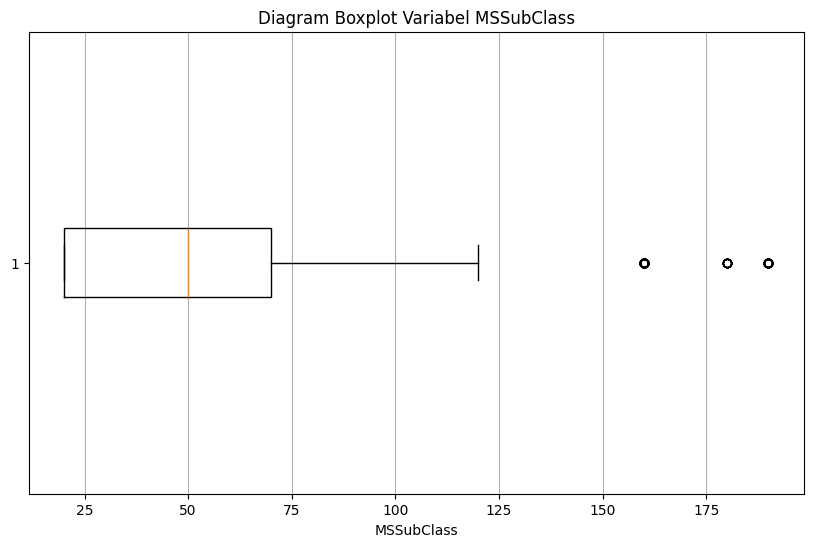

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Membuat boxplot untuk variabel MSSubClass
plt.figure(figsize=(10, 6))
plt.boxplot(df_train['MSSubClass'], vert=False)
plt.title('Diagram Boxplot Variabel MSSubClass')
plt.xlabel('MSSubClass')
plt.grid(axis='x')
plt.show()

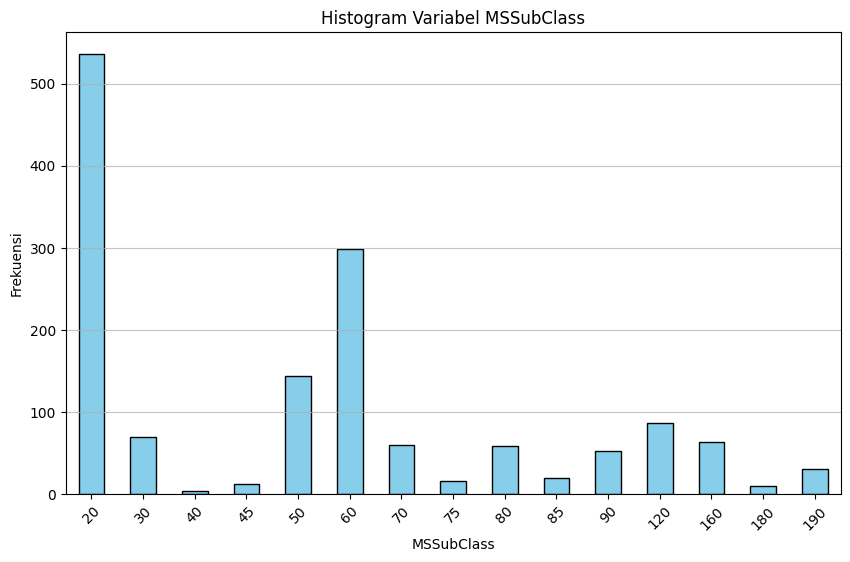

In [ ]:
# Menghitung frekuensi dari setiap kategori MSSubClass
ms_subclass_counts = df_train['MSSubClass'].value_counts().sort_index(ascending=True)

# Membuat histogram
plt.figure(figsize=(10, 6))
ms_subclass_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Histogram Variabel MSSubClass')
plt.xlabel('MSSubClass')
plt.ylabel('Frekuensi')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

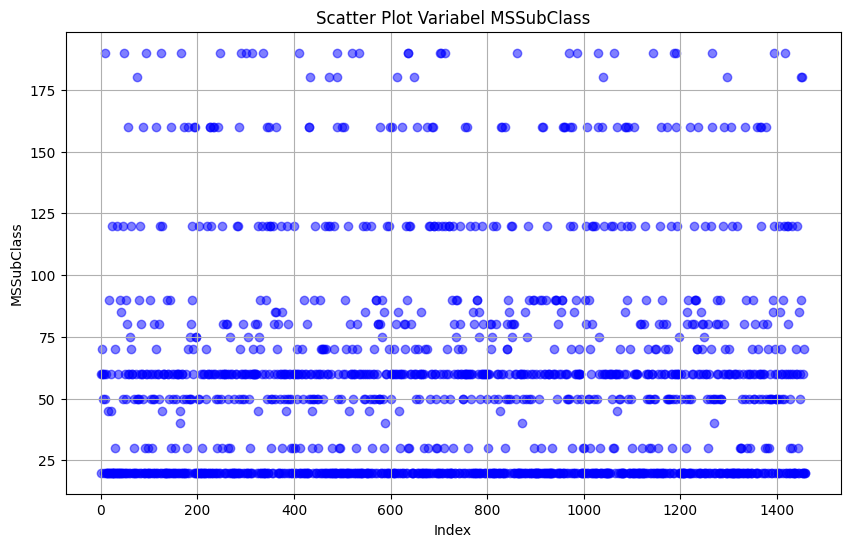

In [ ]:
# Membuat scatter plot untuk variabel MSSubClass
plt.figure(figsize=(10, 6))
plt.scatter(df_train.index, df_train['MSSubClass'], color='blue', alpha=0.5)
plt.title('Scatter Plot Variabel MSSubClass')
plt.xlabel('Index')
plt.ylabel('MSSubClass')
plt.grid()
plt.show()

EDA variabel MSSubClass by variabel Salesprice

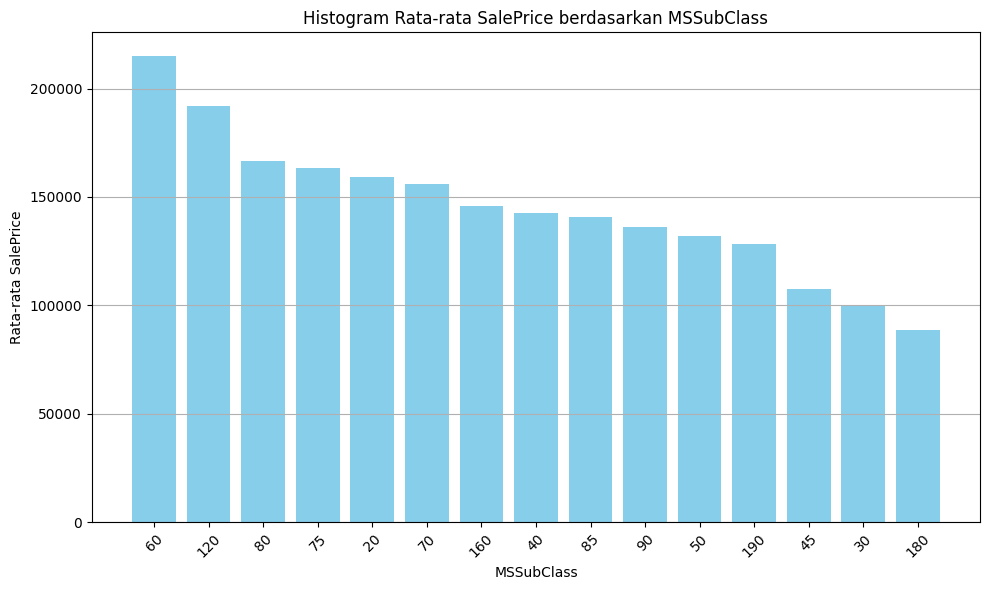

In [ ]:
# Mengelompokkan data berdasarkan MSSubClass dan menghitung rata-rata SalePrice
grouped_data = df_train.groupby('MSSubClass')['SalePrice'].median().reset_index()

# Mengurutkan data berdasarkan SalePrice dari terbesar ke terkecil
sorted_data = grouped_data.sort_values(by='SalePrice', ascending=False)

#Membuat histogram
plt.figure(figsize=(10, 6))
plt.bar(sorted_data['MSSubClass'].astype(str), sorted_data['SalePrice'], color='skyblue')
plt.title('Histogram Rata-rata SalePrice berdasarkan MSSubClass')
plt.xlabel('MSSubClass')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

EDA untuk variabel **MSZoning**: Mengidentifikasi klasifikasi zonasi umum penjualan

In [ ]:
df_train['MSZoning'].unique()

array(['RL', 'RM', 'C (all)', 'FV', 'RH'], dtype=object)

In [ ]:
print(f"Tipe data dari variabel 'MSZoning': {df_train['MSZoning'].dtype}")

Tipe data dari variabel 'MSZoning': object


In [ ]:
df_train['MSZoning'].value_counts()

,count
MSZoning,
RL,1151
RM,218
FV,65
RH,16
C (all),10


<ipython-input-17-b2392c28bce5>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='MSZoning', data=df_train, palette='Set2')


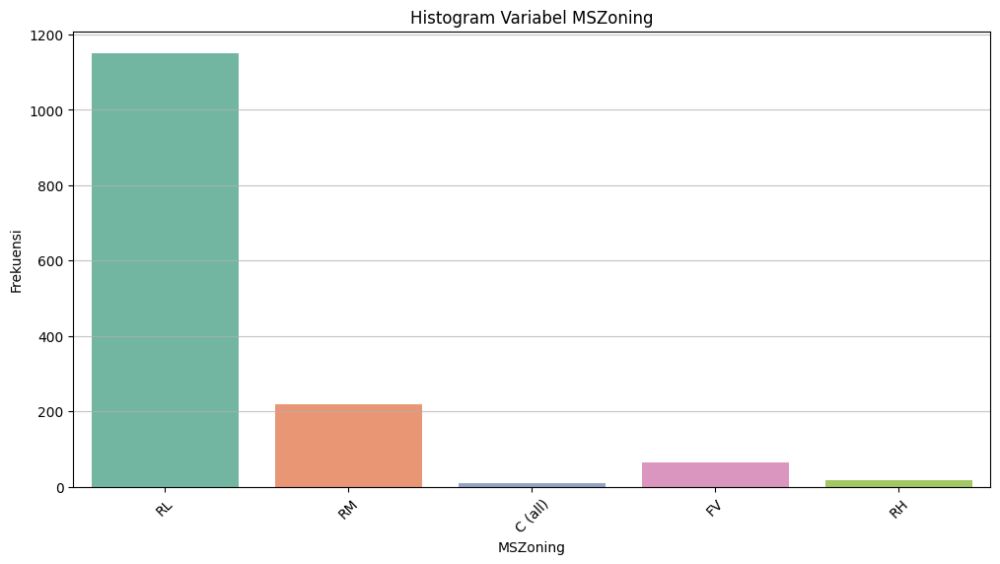

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Membuat histogram untuk variabel MSZoning
plt.figure(figsize=(12, 6))
sns.countplot(x='MSZoning', data=df_train, palette='Set2')
plt.title('Histogram Variabel MSZoning')
plt.xlabel('MSZoning')
plt.ylabel('Frekuensi')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA variabel MSZoning by variabel Salesprice

In [ ]:
pd.set_option('display.max_columns', None)  # Menampilkan semua kolom

jumlah_MSZoning_SalesPrice = df_train.groupby(['MSZoning', 'SalePrice']).size().unstack(fill_value=0)
jumlah_MSZoning_SalesPrice['Total'] = jumlah_MSZoning_SalesPrice.sum(axis=1)
jumlah_MSZoning_SalesPrice.sort_values(by='Total', ascending=False, inplace=True)
jumlah_MSZoning_SalesPrice

SalePrice,34900,35311,37900,39300,40000,52000,52500,55000,55993,58500,60000,61000,62383,64500,66500,67000,68400,68500,72500,73000,75000,75500,76000,76500,78000,79000,79500,79900,80000,80500,81000,82000,82500,83000,83500,84000,84500,84900,85000,85400,85500,86000,87000,87500,88000,89000,89471,89500,90000,90350,91000,91300,91500,92000,92900,93000,93500,94000,94500,94750,95000,96500,97000,97500,98000,98300,98600,99500,99900,100000,101000,101800,102000,102776,103000,103200,103600,104000,104900,105000,105500,105900,106000,106250,106500,107000,107400,107500,107900,108000,108480,108500,108959,109000,109008,109500,109900,110000,110500,111000,111250,112000,112500,113000,114500,114504,115000,116000,116050,116500,116900,117000,117500,118000,118400,118500,118858,118964,119000,119200,119500,119750,119900,120000,120500,121000,121500,121600,122000,122500,122900,123000,123500,123600,124000,124500,124900,125000,125500,126000,126175,126500,127000,127500,128000,128200,128500,128900,128950,129000,129500,129900,130000,130250,130500,131000,131400,131500,132000,132250,132500,133000,133500,133700,133900,134000,134432,134450,134500,134800,134900,135000,135500,135750,135900,135960,136000,136500,136900,136905,137000,137450,137500,137900,138000,138500,138800,138887,139000,139400,139500,139600,139900,139950,140000,140200,141000,141500,142000,142125,142500,142600,142953,143000,143250,143500,143750,143900,144000,144152,144500,144900,145000,145250,145500,145900,146000,146500,146800,147000,147400,147500,148000,148500,148800,149000,149300,149350,149500,149700,149900,150000,150500,150750,150900,151000,151400,151500,152000,153000,153337,153500,153575,153900,154000,154300,154500,154900,155000,155835,155900,156000,156500,156932,157000,157500,157900,158000,158500,158900,159000,159434,159500,159895,159950,160000,160200,161000,161500,161750,162000,162500,162900,163000,163500,163900,163990,164000,164500,164700,164900,164990,165000,165150,165400,165500,165600,166000,167000,167240,167500,167900,168000,168500,169000,169500,169900,169990,170000,171000,171500,171750,171900,172000,172400,172500,172785,173000,173500,173733,173900,174000,174500,174900,175000,175500,175900,176000,176432,176485,176500,177000,177500,178000,178400,178740,178900,179000,179200,179400,179500,179540,179600,179665,179900,180000,180500,181000,181134,181500,181900,182000,182900,183000,183200,183500,183900,184000,184100,184750,184900,185000,185500,185750,185850,185900,186000,186500,186700,187000,187100,187500,187750,188000,188500,188700,189000,189950,190000,191000,192000,192140,192500,193000,193500,193879,194000,194201,194500,194700,195000,195400,196000,196500,197000,197500,197900,198500,198900,199900,200000,200100,200141,200500,200624,201000,201800,202500,202665,202900,203000,204000,204750,204900,205000,205950,206000,206300,206900,207000,207500,208300,208500,208900,209500,210000,211000,212000,212900,213000,213250,213490,213500,214000,214500,214900,215000,215200,216000,216500,216837,217000,217500,218000,219210,219500,220000,221000,221500,222000,222500,223000,223500,224000,224500,224900,225000,226000,226700,227000,227680,227875,228000,228500,228950,229000,229456,230000,230500,231500,232000,232600,233000,233170,233230,234000,235000,235128,236000,236500,237000,237500,238000,239000,239500,239686,239799,239900,240000,241000,241500,242000,243000,244000,244400,244600,245000,245350,245500,246578,248000,248328,248900,249700,250000,250580,251000,252000,252678,253000,253293,254000,254900,255000,255500,255900,256000,256300,257000,257500,258000,259000,259500,260000,260400,261500,262000,262280,262500,263000,263435,264132,264561,265000,265900,265979,266000,266500,267000,268000,269500,269790,270000,271000,271900,272000,274000,274300,274725,274900,274970,275000,275500,276000,277000,277500,278000,279500,280000,281000,281213,282922,283463,284000,285000,286000,287000,287090,289000,290000,293077,294000,295000,295493,297000,299800,301000,301500,302000,303477,305000,305900,306000,307000,309000,310000,311500,311872,312500,313000

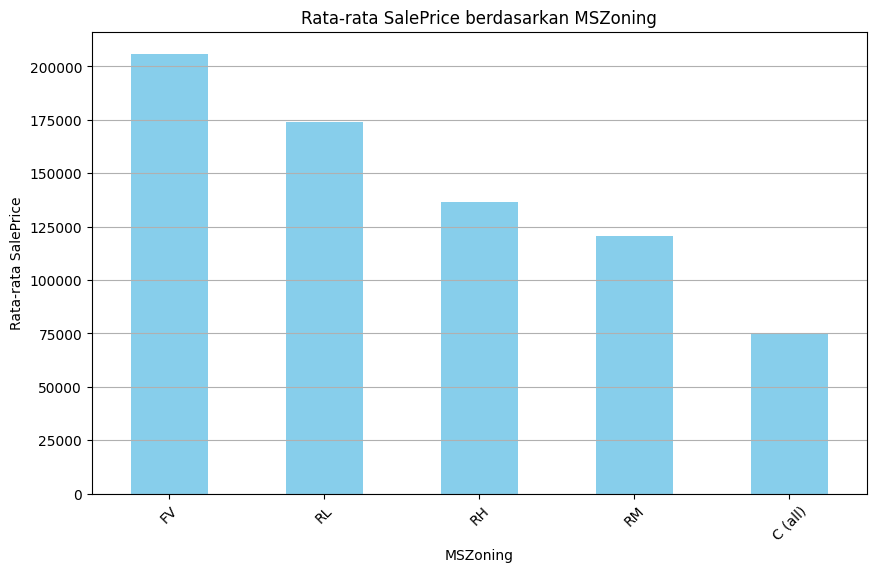

In [ ]:
# Membuat histogram untuk SalePrice berdasarkan MSZoning
import pandas as pd
import matplotlib.pyplot as plt

# Menghitung rata-rata SalePrice untuk setiap kategori MSZoning
average_saleprice = df_train.groupby('MSZoning')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(10, 6))
average_saleprice.plot(kind='bar', color='skyblue')
plt.title('Rata-rata SalePrice berdasarkan MSZoning')
plt.xlabel('MSZoning')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

Recode untuk C(All), FV, RH, RL, RM

In [ ]:
def kategorikan_mszoning(zoning):
    if zoning in ['C (all)', 'I', 'FV']:
        return 3
    elif zoning in ['RH', 'RL', 'RP', 'RM']:
        return 2
    elif zoning == 'A':
        return 1
    else:
        return 0 #'Unknown'

# Menerapkan fungsi ke kolom MSZoning
df_train['MSZoning_Cat'] = df_train['MSZoning'].apply(kategorikan_mszoning)


EDA variabel MSZoning_Cat by variabel Salesprice

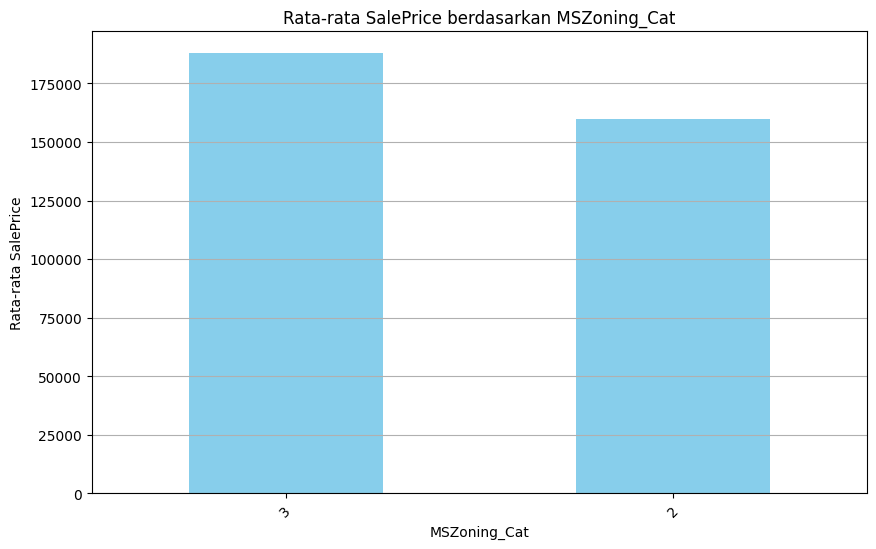

In [ ]:
# Membuat histogram untuk SalePrice berdasarkan MSZoning
import pandas as pd
import matplotlib.pyplot as plt

# Menghitung rata-rata SalePrice untuk setiap kategori MSZoning
average_saleprice = df_train.groupby('MSZoning_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(10, 6))
average_saleprice.plot(kind='bar', color='skyblue')
plt.title('Rata-rata SalePrice berdasarkan MSZoning_Cat')
plt.xlabel('MSZoning_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

EDA untuk variabel **LotFrontage**: Linear feet of street connected to property >> merujuk pada jumlah kaki linear (atau meter linear jika menggunakan sistem metrik) dari jalan yang terhubung langsung ke properti. Dalam konteks real estat, ini menggambarkan panjang bagian depan tanah properti yang menghadap langsung ke jalan publik.


In [ ]:
df_train['LotFrontage'].unique()

array([ 65.,  80.,  68.,  60.,  84.,  85.,  75.,  nan,  51.,  50.,  70.,
        91.,  72.,  66., 101.,  57.,  44., 110.,  98.,  47., 108., 112.,
        74., 115.,  61.,  48.,  33.,  52., 100.,  24.,  89.,  63.,  76.,
        81.,  95.,  69.,  21.,  32.,  78., 121., 122.,  40., 105.,  73.,
        77.,  64.,  94.,  34.,  90.,  55.,  88.,  82.,  71., 120., 107.,
        92., 134.,  62.,  86., 141.,  97.,  54.,  41.,  79., 174.,  99.,
        67.,  83.,  43., 103.,  93.,  30., 129., 140.,  35.,  37., 118.,
        87., 116., 150., 111.,  49.,  96.,  59.,  36.,  56., 102.,  58.,
        38., 109., 130.,  53., 137.,  45., 106., 104.,  42.,  39., 144.,
       114., 128., 149., 313., 168., 182., 138., 160., 152., 124., 153.,
        46.])

In [ ]:
print(f"Tipe data dari variabel 'LotFrontage': {df_train['LotFrontage'].dtype}")

Tipe data dari variabel 'LotFrontage': float64


In [ ]:
# Menghitung jumlah missing values pada LotFrontage
missing_values_count = df_train['LotFrontage'].isnull().sum()
print(f'Jumlah missing values pada variabel LotFrontage: {missing_values_count}')

Jumlah missing values pada variabel LotFrontage: 259


In [ ]:
data_sorted =df_train.sort_values(by='LotFrontage', ascending=False)
print(data_sorted[['LotFrontage']])

      LotFrontage
1298        313.0
934         313.0
1127        182.0
231         174.0
197         174.0
...           ...
1429          NaN
1431          NaN
1441          NaN
1443          NaN
1446          NaN

[1460 rows x 1 columns]


In [ ]:
statistik_deskriptif = df_train ['LotFrontage'].describe()
print(statistik_deskriptif)

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64


EDA untuk variabel **LotFrontage** >> **Handling missing value, missing value diisi dengan mean**

In [ ]:
# Menampilkan jumlah missing values sebelum penanganan
print("Jumlah missing values sebelum penanganan:")
print(df_train['LotFrontage'].isnull().sum())

# Mengisi missing values dengan rata-rata LotFrontage
mean_lot_frontage = df_train['LotFrontage'].mean()
df_train['LotFrontage_Filled_MV'] = df_train['LotFrontage'].fillna(mean_lot_frontage)

# Menampilkan jumlah missing values setelah penanganan
print("\nJumlah missing values setelah penanganan:")
print(df_train['LotFrontage_Filled_MV'].isnull().sum())

Jumlah missing values sebelum penanganan:
259

Jumlah missing values setelah penanganan:
0


EDA untuk variabel **LotFrontage** >> Setelah handling missing value, variabel **LotFrontage_Filled_MV**

In [ ]:
df_train['LotFrontage_Filled_MV'].unique()

array([ 65.        ,  80.        ,  68.        ,  60.        ,
        84.        ,  85.        ,  75.        ,  70.04995837,
        51.        ,  50.        ,  70.        ,  91.        ,
        72.        ,  66.        , 101.        ,  57.        ,
        44.        , 110.        ,  98.        ,  47.        ,
       108.        , 112.        ,  74.        , 115.        ,
        61.        ,  48.        ,  33.        ,  52.        ,
       100.        ,  24.        ,  89.        ,  63.        ,
        76.        ,  81.        ,  95.        ,  69.        ,
        21.        ,  32.        ,  78.        , 121.        ,
       122.        ,  40.        , 105.        ,  73.        ,
        77.        ,  64.        ,  94.        ,  34.        ,
        90.        ,  55.        ,  88.        ,  82.        ,
        71.        , 120.        , 107.        ,  92.        ,
       134.        ,  62.        ,  86.        , 141.        ,
        97.        ,  54.        ,  41.        ,  79.  

In [ ]:
df_train['LotFrontage_Filled_MV'].value_counts()

,count
LotFrontage_Filled_MV,
70.049958,259
60.000000,143
70.000000,70
80.000000,69
50.000000,57
...,...
182.000000,1
160.000000,1
152.000000,1


In [ ]:
statistik_deskriptif = df_train ['LotFrontage_Filled_MV'].describe()
print(statistik_deskriptif)

count    1460.000000
mean       70.049958
std        22.024023
min        21.000000
25%        60.000000
50%        70.049958
75%        79.000000
max       313.000000
Name: LotFrontage_Filled_MV, dtype: float64


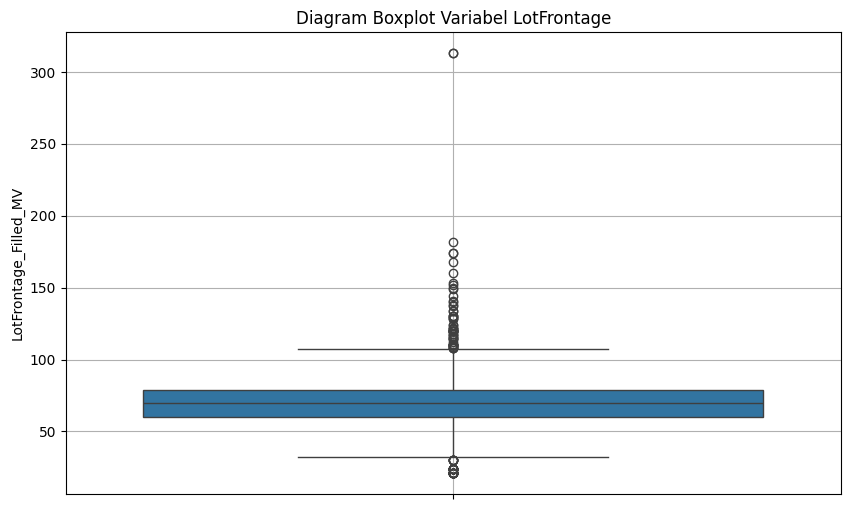

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Membuat boxplot untuk variabel LotFrontage_Filled_MV
plt.figure(figsize=(10, 6))
sns.boxplot(y='LotFrontage_Filled_MV', data=df_train)
plt.title('Diagram Boxplot Variabel LotFrontage')
plt.ylabel('LotFrontage_Filled_MV')
plt.grid()
plt.show()

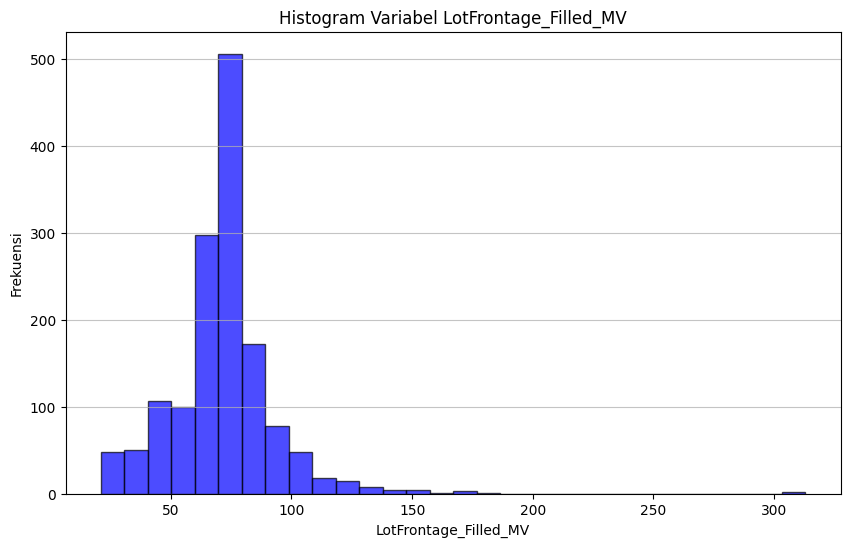

In [ ]:
# Membuat histogram untuk variabel LotFrontage_Filled_MV
plt.figure(figsize=(10, 6))
plt.hist(df_train['LotFrontage_Filled_MV'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel LotFrontage_Filled_MV')
plt.xlabel('LotFrontage_Filled_MV')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **LotFrontage_Filled_MV** by variabel SalePrice

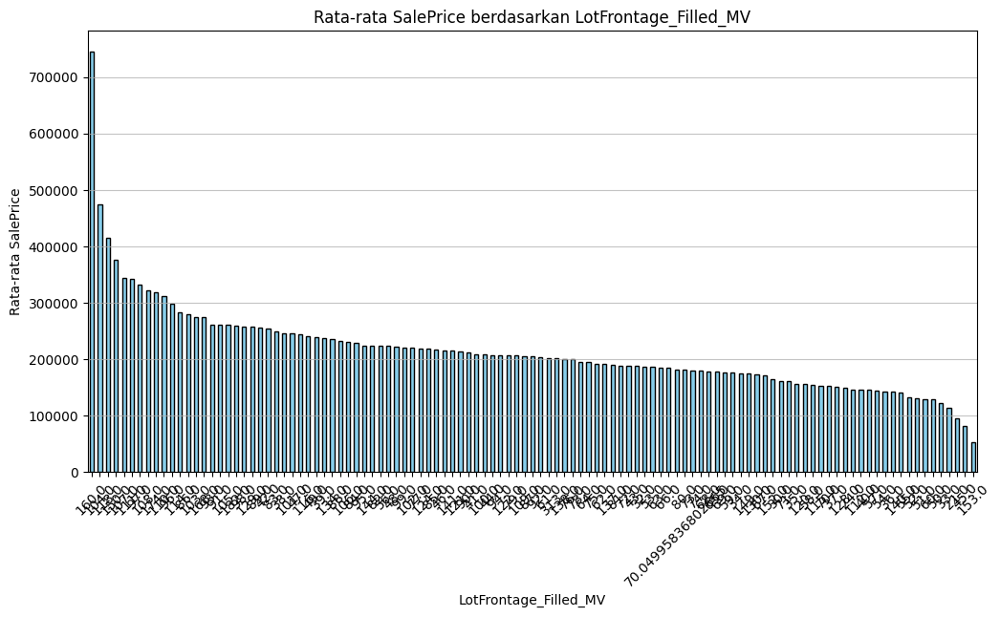

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori LotFrontage
average_saleprice = df_train.groupby('LotFrontage_Filled_MV')['SalePrice'].mean().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan LotFrontage_Filled_MV')
plt.xlabel('LotFrontage_Filled_MV')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **LotArea**: Lot size in square feet

In [ ]:
df_train['LotArea'].unique()

array([ 8450,  9600, 11250, ..., 17217, 13175,  9717])

In [ ]:
# Mendapatkan tipe data variabel LotArea
lot_area_dtype = df_train['LotArea'].dtype

print(f'Tipe data variabel LotArea: {lot_area_dtype}')

Tipe data variabel LotArea: int64


In [ ]:
# Menghitung jumlah missing values pada LotArea
missing_values_count = df_train['LotArea'].isnull().sum()
print(f'Jumlah missing values pada variabel LotArea: {missing_values_count}')

Jumlah missing values pada variabel LotArea: 0


In [ ]:
df_train['LotArea'].value_counts()

,count
LotArea,
7200,25
9600,24
6000,17
10800,14
8400,14
...,...
10652,1
12968,1
11924,1


In [ ]:
data_sorted =df_train.sort_values(by='LotArea', ascending=False)
print(data_sorted[['LotArea']])

      LotArea
313    215245
335    164660
249    159000
706    115149
451     70761
...       ...
1449     1533
489      1526
614      1491
1039     1477
956      1300

[1460 rows x 1 columns]


In [ ]:
statistik_deskriptif = df_train ['LotArea'].describe()
print(statistik_deskriptif)

count      1460.000000
mean      10516.828082
std        9981.264932
min        1300.000000
25%        7553.500000
50%        9478.500000
75%       11601.500000
max      215245.000000
Name: LotArea, dtype: float64


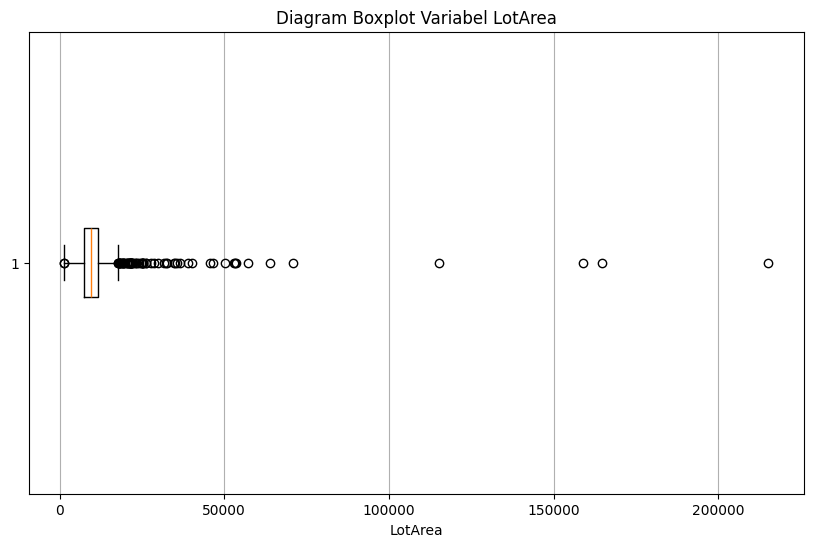

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Membuat boxplot untuk variabel LotArea
plt.figure(figsize=(10, 6))
plt.boxplot(df_train['LotArea'], vert=False)
plt.title('Diagram Boxplot Variabel LotArea')
plt.xlabel('LotArea')
plt.grid(axis='x')
plt.show()

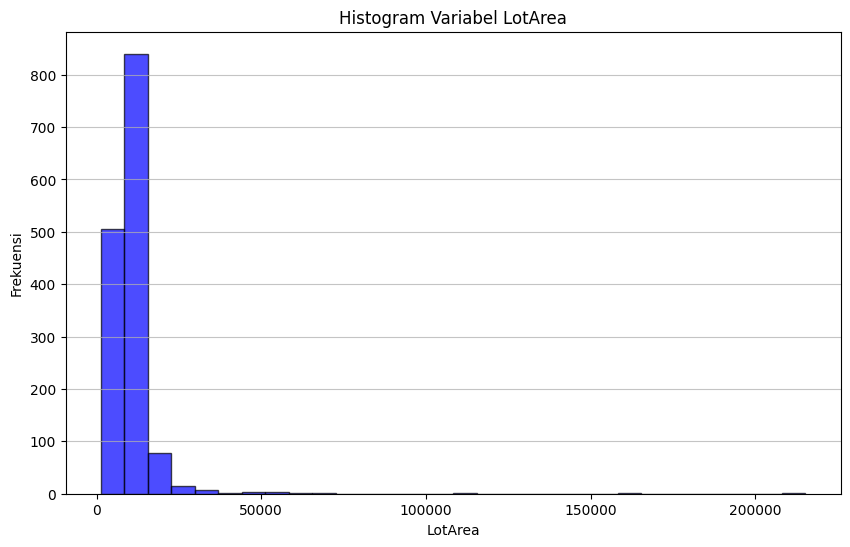

In [ ]:
# Membuat histogram untuk variabel LotArea
plt.figure(figsize=(10, 6))
plt.hist(df_train['LotArea'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel LotArea')
plt.xlabel('LotArea')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel LotArea by variabel SalePrice

In [ ]:
pd.set_option('display.max_columns', None)  # Menampilkan semua kolom

jumlah_LotArea_SalesPrice = df_train.groupby(['LotArea', 'SalePrice']).size().unstack(fill_value=0)
jumlah_LotArea_SalesPrice['Total'] = jumlah_LotArea_SalesPrice.sum(axis=1)
jumlah_LotArea_SalesPrice.sort_values(by='Total', ascending=False, inplace=True)
jumlah_LotArea_SalesPrice

SalePrice,34900,35311,37900,39300,40000,52000,52500,55000,55993,58500,60000,61000,62383,64500,66500,67000,68400,68500,72500,73000,75000,75500,76000,76500,78000,79000,79500,79900,80000,80500,81000,82000,82500,83000,83500,84000,84500,84900,85000,85400,85500,86000,87000,87500,88000,89000,89471,89500,90000,90350,91000,91300,91500,92000,92900,93000,93500,94000,94500,94750,95000,96500,97000,97500,98000,98300,98600,99500,99900,100000,101000,101800,102000,102776,103000,103200,103600,104000,104900,105000,105500,105900,106000,106250,106500,107000,107400,107500,107900,108000,108480,108500,108959,109000,109008,109500,109900,110000,110500,111000,111250,112000,112500,113000,114500,114504,115000,116000,116050,116500,116900,117000,117500,118000,118400,118500,118858,118964,119000,119200,119500,119750,119900,120000,120500,121000,121500,121600,122000,122500,122900,123000,123500,123600,124000,124500,124900,125000,125500,126000,126175,126500,127000,127500,128000,128200,128500,128900,128950,129000,129500,129900,130000,130250,130500,131000,131400,131500,132000,132250,132500,133000,133500,133700,133900,134000,134432,134450,134500,134800,134900,135000,135500,135750,135900,135960,136000,136500,136900,136905,137000,137450,137500,137900,138000,138500,138800,138887,139000,139400,139500,139600,139900,139950,140000,140200,141000,141500,142000,142125,142500,142600,142953,143000,143250,143500,143750,143900,144000,144152,144500,144900,145000,145250,145500,145900,146000,146500,146800,147000,147400,147500,148000,148500,148800,149000,149300,149350,149500,149700,149900,150000,150500,150750,150900,151000,151400,151500,152000,153000,153337,153500,153575,153900,154000,154300,154500,154900,155000,155835,155900,156000,156500,156932,157000,157500,157900,158000,158500,158900,159000,159434,159500,159895,159950,160000,160200,161000,161500,161750,162000,162500,162900,163000,163500,163900,163990,164000,164500,164700,164900,164990,165000,165150,165400,165500,165600,166000,167000,167240,167500,167900,168000,168500,169000,169500,169900,169990,170000,171000,171500,171750,171900,172000,172400,172500,172785,173000,173500,173733,173900,174000,174500,174900,175000,175500,175900,176000,176432,176485,176500,177000,177500,178000,178400,178740,178900,179000,179200,179400,179500,179540,179600,179665,179900,180000,180500,181000,181134,181500,181900,182000,182900,183000,183200,183500,183900,184000,184100,184750,184900,185000,185500,185750,185850,185900,186000,186500,186700,187000,187100,187500,187750,188000,188500,188700,189000,189950,190000,191000,192000,192140,192500,193000,193500,193879,194000,194201,194500,194700,195000,195400,196000,196500,197000,197500,197900,198500,198900,199900,200000,200100,200141,200500,200624,201000,201800,202500,202665,202900,203000,204000,204750,204900,205000,205950,206000,206300,206900,207000,207500,208300,208500,208900,209500,210000,211000,212000,212900,213000,213250,213490,213500,214000,214500,214900,215000,215200,216000,216500,216837,217000,217500,218000,219210,219500,220000,221000,221500,222000,222500,223000,223500,224000,224500,224900,225000,226000,226700,227000,227680,227875,228000,228500,228950,229000,229456,230000,230500,231500,232000,232600,233000,233170,233230,234000,235000,235128,236000,236500,237000,237500,238000,239000,239500,239686,239799,239900,240000,241000,241500,242000,243000,244000,244400,244600,245000,245350,245500,246578,248000,248328,248900,249700,250000,250580,251000,252000,252678,253000,253293,254000,254900,255000,255500,255900,256000,256300,257000,257500,258000,259000,259500,260000,260400,261500,262000,262280,262500,263000,263435,264132,264561,265000,265900,265979,266000,266500,267000,268000,269500,269790,270000,271000,271900,272000,274000,274300,274725,274900,274970,275000,275500,276000,277000,277500,278000,279500,280000,281000,281213,282922,283463,284000,285000,286000,287000,287090,289000,290000,293077,294000,295000,295493,297000,299800,301000,301500,302000,303477,305000,305900,306000,307000,309000,310000,311500,311872,312500,313000

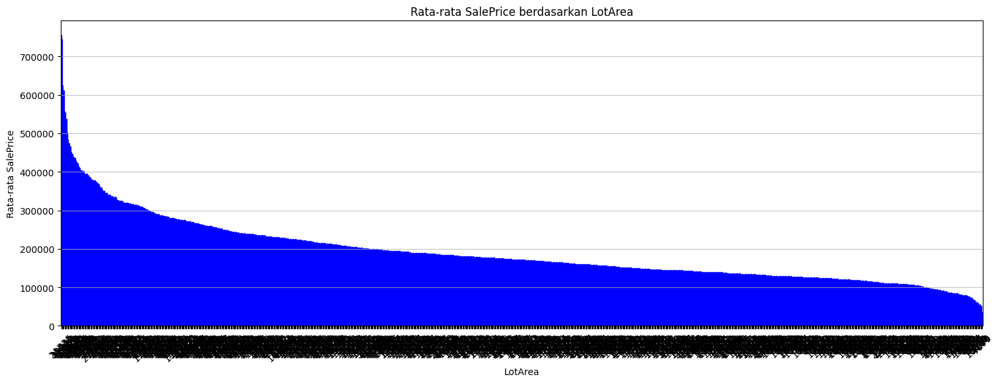

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori LotArea
average_saleprice = df_train.groupby('LotArea')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(18, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='blue')
plt.title('Rata-rata SalePrice berdasarkan LotArea')
plt.xlabel('LotArea')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **Street**: Type of road access to property

In [ ]:
# Mendapatkan tipe data variabel LotArea
Street_dtype = df_train['Street'].dtype

print(f'Tipe data variabel Street: {Street_dtype}')

Tipe data variabel Street: object


In [ ]:
# Menghitung jumlah missing values pada Street
missing_values_count = df_train['Street'].isnull().sum()
print(f'Jumlah missing values pada variabel Street: {missing_values_count}')

Jumlah missing values pada variabel Street: 0


In [ ]:
df_train['Street'].unique()

array(['Pave', 'Grvl'], dtype=object)

In [ ]:
df_train['Street'].value_counts()

,count
Street,
Pave,1454
Grvl,6


In [ ]:
data_sorted =df_train.sort_values(by='Street', ascending=False)
print(data_sorted[['Street']])

     Street
0      Pave
980    Pave
978    Pave
977    Pave
976    Pave
...     ...
812    Grvl
1061   Grvl
335    Grvl
52     Grvl
1184   Grvl

[1460 rows x 1 columns]


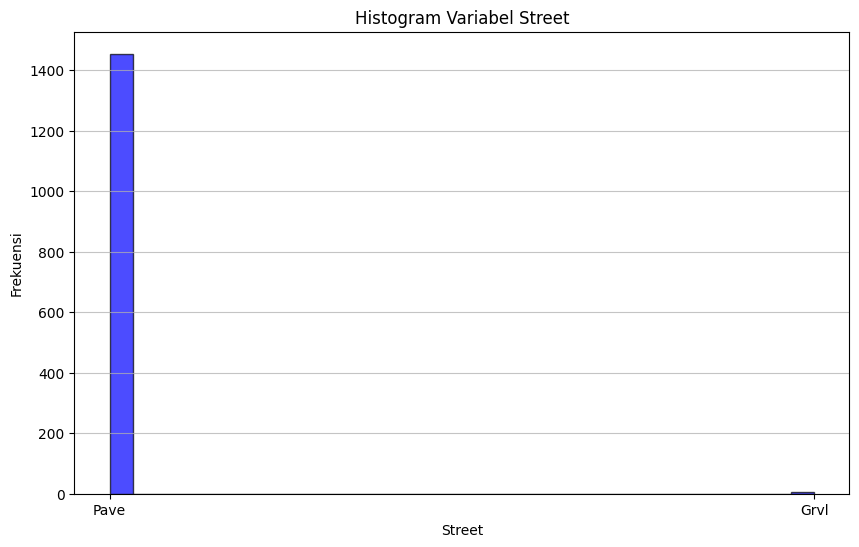

In [ ]:
# Membuat histogram untuk variabel Street
plt.figure(figsize=(10, 6))
plt.hist(df_train['Street'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel Street')
plt.xlabel('Street')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel Street by variabel SalePrice

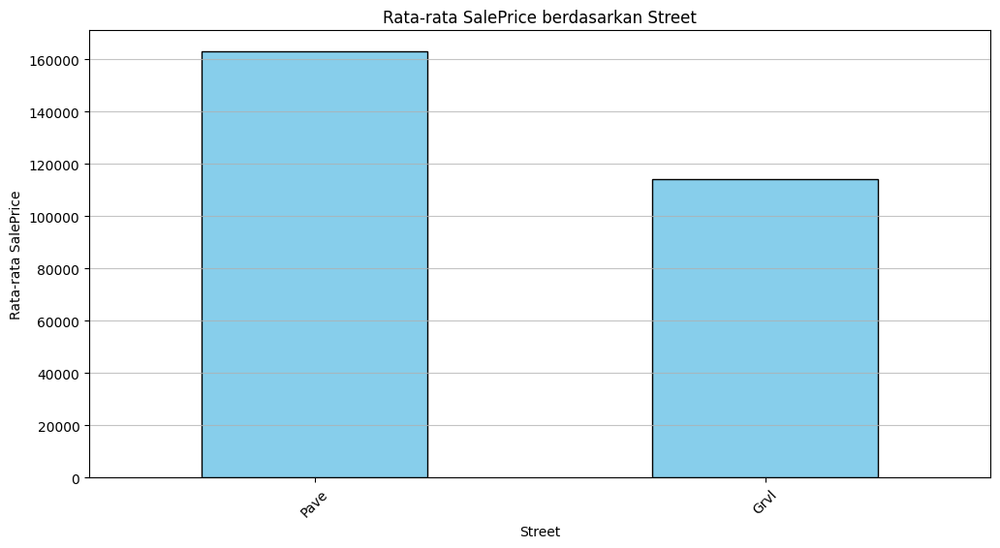

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Street
average_saleprice = df_train.groupby('Street')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Street')
plt.xlabel('Street')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel Street: 2: Pave; 1:Grvl

In [ ]:
# Menampilkan nilai unik dari kolom Street
print("Nilai unik dalam Street:")
print(df_train['Street'].unique())

# Mengkategorikan Street
def categorize_street(value):
    if value in ['Pave']:
        return 2
    elif value in ['Grvl']:
        return 1
    else:
        return 0
# Menambahkan kolom baru untuk kategori Street
df_train['Street_Category'] = df_train['Street'].apply(categorize_street)
# Menampilkan hasil
print("\nHasil pengkategorian Street:")
print(df_train[['Street', 'Street_Category']].head())

Nilai unik dalam Street:
['Pave' 'Grvl']

Hasil pengkategorian Street:
  Street  Street_Category
0   Pave                2
1   Pave                2
2   Pave                2
3   Pave                2
4   Pave                2


EDA untuk variabel Street by variabel SalePrice

In [ ]:
pd.set_option('display.max_columns', None)  # Menampilkan semua kolom

jumlah_Street_Cat_SalesPrice = df_train.groupby(['Street_Category', 'SalePrice']).size().unstack(fill_value=0)
jumlah_Street_Cat_SalesPrice['Total'] = jumlah_Street_Cat_SalesPrice.sum(axis=1)
jumlah_Street_Cat_SalesPrice.sort_values(by='Total', ascending=False, inplace=True)
jumlah_Street_Cat_SalesPrice

SalePrice,34900,35311,37900,39300,40000,52000,52500,55000,55993,58500,60000,61000,62383,64500,66500,67000,68400,68500,72500,73000,75000,75500,76000,76500,78000,79000,79500,79900,80000,80500,81000,82000,82500,83000,83500,84000,84500,84900,85000,85400,85500,86000,87000,87500,88000,89000,89471,89500,90000,90350,91000,91300,91500,92000,92900,93000,93500,94000,94500,94750,95000,96500,97000,97500,98000,98300,98600,99500,99900,100000,101000,101800,102000,102776,103000,103200,103600,104000,104900,105000,105500,105900,106000,106250,106500,107000,107400,107500,107900,108000,108480,108500,108959,109000,109008,109500,109900,110000,110500,111000,111250,112000,112500,113000,114500,114504,115000,116000,116050,116500,116900,117000,117500,118000,118400,118500,118858,118964,119000,119200,119500,119750,119900,120000,120500,121000,121500,121600,122000,122500,122900,123000,123500,123600,124000,124500,124900,125000,125500,126000,126175,126500,127000,127500,128000,128200,128500,128900,128950,129000,129500,129900,130000,130250,130500,131000,131400,131500,132000,132250,132500,133000,133500,133700,133900,134000,134432,134450,134500,134800,134900,135000,135500,135750,135900,135960,136000,136500,136900,136905,137000,137450,137500,137900,138000,138500,138800,138887,139000,139400,139500,139600,139900,139950,140000,140200,141000,141500,142000,142125,142500,142600,142953,143000,143250,143500,143750,143900,144000,144152,144500,144900,145000,145250,145500,145900,146000,146500,146800,147000,147400,147500,148000,148500,148800,149000,149300,149350,149500,149700,149900,150000,150500,150750,150900,151000,151400,151500,152000,153000,153337,153500,153575,153900,154000,154300,154500,154900,155000,155835,155900,156000,156500,156932,157000,157500,157900,158000,158500,158900,159000,159434,159500,159895,159950,160000,160200,161000,161500,161750,162000,162500,162900,163000,163500,163900,163990,164000,164500,164700,164900,164990,165000,165150,165400,165500,165600,166000,167000,167240,167500,167900,168000,168500,169000,169500,169900,169990,170000,171000,171500,171750,171900,172000,172400,172500,172785,173000,173500,173733,173900,174000,174500,174900,175000,175500,175900,176000,176432,176485,176500,177000,177500,178000,178400,178740,178900,179000,179200,179400,179500,179540,179600,179665,179900,180000,180500,181000,181134,181500,181900,182000,182900,183000,183200,183500,183900,184000,184100,184750,184900,185000,185500,185750,185850,185900,186000,186500,186700,187000,187100,187500,187750,188000,188500,188700,189000,189950,190000,191000,192000,192140,192500,193000,193500,193879,194000,194201,194500,194700,195000,195400,196000,196500,197000,197500,197900,198500,198900,199900,200000,200100,200141,200500,200624,201000,201800,202500,202665,202900,203000,204000,204750,204900,205000,205950,206000,206300,206900,207000,207500,208300,208500,208900,209500,210000,211000,212000,212900,213000,213250,213490,213500,214000,214500,214900,215000,215200,216000,216500,216837,217000,217500,218000,219210,219500,220000,221000,221500,222000,222500,223000,223500,224000,224500,224900,225000,226000,226700,227000,227680,227875,228000,228500,228950,229000,229456,230000,230500,231500,232000,232600,233000,233170,233230,234000,235000,235128,236000,236500,237000,237500,238000,239000,239500,239686,239799,239900,240000,241000,241500,242000,243000,244000,244400,244600,245000,245350,245500,246578,248000,248328,248900,249700,250000,250580,251000,252000,252678,253000,253293,254000,254900,255000,255500,255900,256000,256300,257000,257500,258000,259000,259500,260000,260400,261500,262000,262280,262500,263000,263435,264132,264561,265000,265900,265979,266000,266500,267000,268000,269500,269790,270000,271000,271900,272000,274000,274300,274725,274900,274970,275000,275500,276000,277000,277500,278000,279500,280000,281000,281213,282922,283463,284000,285000,286000,287000,287090,289000,290000,293077,294000,295000,295493,297000,299800,301000,301500,302000,303477,305000,305900,306000,307000,309000,310000,311500,311872,312500,313000

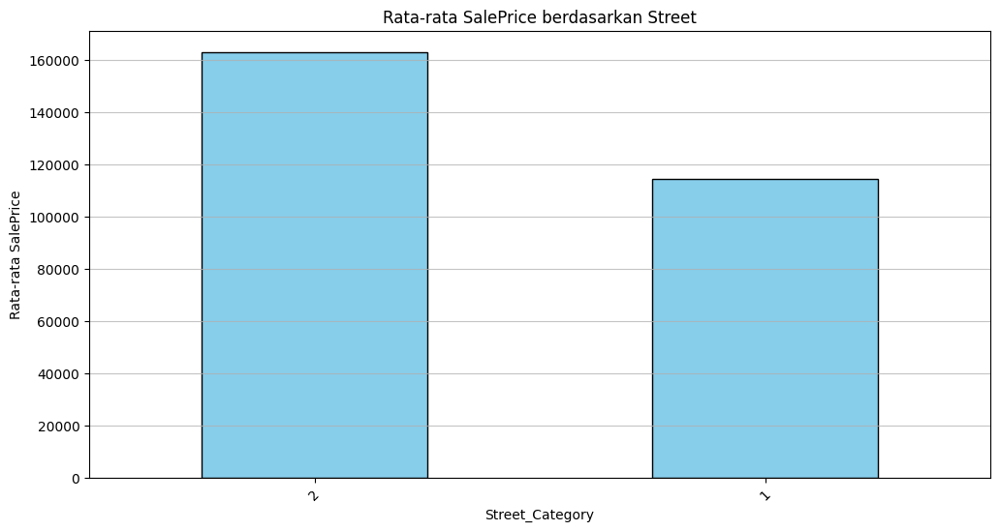

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Street
average_saleprice = df_train.groupby('Street_Category')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Street')
plt.xlabel('Street_Category')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **Alley**: Type of alley access to property >> mengacu pada jenis akses gang yang tersedia untuk sebuah properti.

In [ ]:
# Mendapatkan tipe data variabel Alley
Alley_dtype = df_train['Alley'].dtype

print(f'Tipe data variabel Alley: {Alley_dtype}')

Tipe data variabel Alley: object


In [ ]:
# Menghitung jumlah missing values pada Alley
missing_values_count = df_train['Alley'].isnull().sum()
print(f'Jumlah missing values pada variabel Alley: {missing_values_count}')

Jumlah missing values pada variabel Alley: 1369


In [ ]:
df_train['Alley'].unique()

array([nan, 'Grvl', 'Pave'], dtype=object)

In [ ]:
df_train['Alley'].value_counts()

,count
Alley,
Grvl,50
Pave,41


In [ ]:
data_sorted =df_train.sort_values(by='Alley', ascending=False)
print(data_sorted[['Alley']])

     Alley
711   Pave
831   Pave
525   Pave
578   Pave
603   Pave
...    ...
1455   NaN
1456   NaN
1457   NaN
1458   NaN
1459   NaN

[1460 rows x 1 columns]


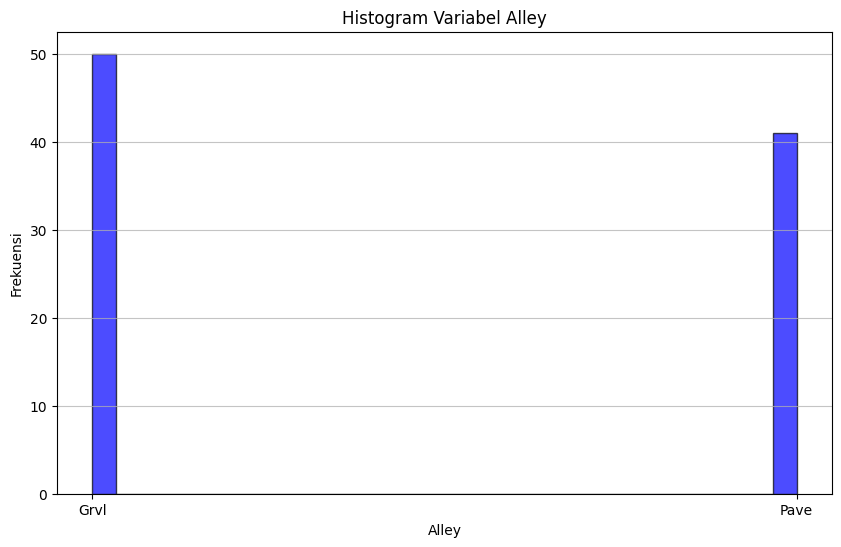

In [ ]:
# Membuat histogram untuk variabel Alley
plt.figure(figsize=(10, 6))
plt.hist(df_train['Alley'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel Alley')
plt.xlabel('Alley')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel Alley by variabel SalePrice

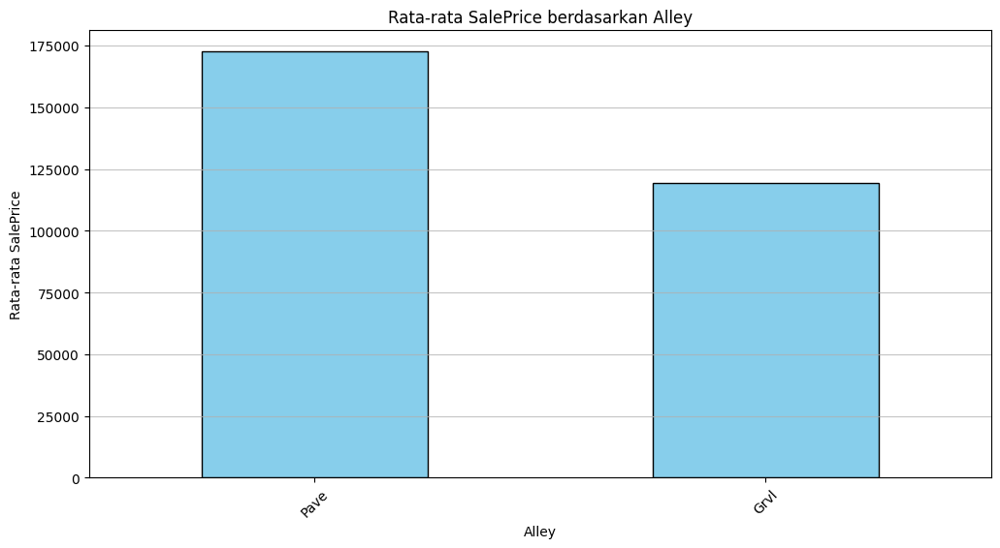

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Alley
average_saleprice = df_train.groupby('Alley')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Alley')
plt.xlabel('Alley')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel Alley: 1: Pave; 2:Grvl

In [ ]:
# Menampilkan nilai unik dari kolom Alley
print("Nilai unik dalam Alley:")
print(df_train['Alley'].unique())

# Mengkategorikan Alley
def categorize_alley(value):
    if value in ['Pave']:
        return 2
    elif value in ['Grvl']:
        return 1
    else:
        return 0
# Menambahkan kolom baru untuk kategori Street
df_train['Alley_Category'] = df_train['Alley'].apply(categorize_alley)
# Menampilkan hasil
print("\nHasil pengkategorian Alley:")
print(df_train[['Alley', 'Alley_Category']].head())

Nilai unik dalam Alley:
[nan 'Grvl' 'Pave']

Hasil pengkategorian Alley:
  Alley  Alley_Category
0   NaN               0
1   NaN               0
2   NaN               0
3   NaN               0
4   NaN               0


EDA untuk variabel Alley Cat by variabel SalePrice

In [ ]:
pd.set_option('display.max_columns', None)  # Menampilkan semua kolom

jumlah_Alley_Cat_SalesPrice = df_train.groupby(['Alley_Category', 'SalePrice']).size().unstack(fill_value=0)
jumlah_Alley_Cat_SalesPrice['Total'] = jumlah_Alley_Cat_SalesPrice.sum(axis=1)
jumlah_Alley_Cat_SalesPrice.sort_values(by='Total', ascending=False, inplace=True)
jumlah_Alley_Cat_SalesPrice

SalePrice,34900,35311,37900,39300,40000,52000,52500,55000,55993,58500,60000,61000,62383,64500,66500,67000,68400,68500,72500,73000,75000,75500,76000,76500,78000,79000,79500,79900,80000,80500,81000,82000,82500,83000,83500,84000,84500,84900,85000,85400,85500,86000,87000,87500,88000,89000,89471,89500,90000,90350,91000,91300,91500,92000,92900,93000,93500,94000,94500,94750,95000,96500,97000,97500,98000,98300,98600,99500,99900,100000,101000,101800,102000,102776,103000,103200,103600,104000,104900,105000,105500,105900,106000,106250,106500,107000,107400,107500,107900,108000,108480,108500,108959,109000,109008,109500,109900,110000,110500,111000,111250,112000,112500,113000,114500,114504,115000,116000,116050,116500,116900,117000,117500,118000,118400,118500,118858,118964,119000,119200,119500,119750,119900,120000,120500,121000,121500,121600,122000,122500,122900,123000,123500,123600,124000,124500,124900,125000,125500,126000,126175,126500,127000,127500,128000,128200,128500,128900,128950,129000,129500,129900,130000,130250,130500,131000,131400,131500,132000,132250,132500,133000,133500,133700,133900,134000,134432,134450,134500,134800,134900,135000,135500,135750,135900,135960,136000,136500,136900,136905,137000,137450,137500,137900,138000,138500,138800,138887,139000,139400,139500,139600,139900,139950,140000,140200,141000,141500,142000,142125,142500,142600,142953,143000,143250,143500,143750,143900,144000,144152,144500,144900,145000,145250,145500,145900,146000,146500,146800,147000,147400,147500,148000,148500,148800,149000,149300,149350,149500,149700,149900,150000,150500,150750,150900,151000,151400,151500,152000,153000,153337,153500,153575,153900,154000,154300,154500,154900,155000,155835,155900,156000,156500,156932,157000,157500,157900,158000,158500,158900,159000,159434,159500,159895,159950,160000,160200,161000,161500,161750,162000,162500,162900,163000,163500,163900,163990,164000,164500,164700,164900,164990,165000,165150,165400,165500,165600,166000,167000,167240,167500,167900,168000,168500,169000,169500,169900,169990,170000,171000,171500,171750,171900,172000,172400,172500,172785,173000,173500,173733,173900,174000,174500,174900,175000,175500,175900,176000,176432,176485,176500,177000,177500,178000,178400,178740,178900,179000,179200,179400,179500,179540,179600,179665,179900,180000,180500,181000,181134,181500,181900,182000,182900,183000,183200,183500,183900,184000,184100,184750,184900,185000,185500,185750,185850,185900,186000,186500,186700,187000,187100,187500,187750,188000,188500,188700,189000,189950,190000,191000,192000,192140,192500,193000,193500,193879,194000,194201,194500,194700,195000,195400,196000,196500,197000,197500,197900,198500,198900,199900,200000,200100,200141,200500,200624,201000,201800,202500,202665,202900,203000,204000,204750,204900,205000,205950,206000,206300,206900,207000,207500,208300,208500,208900,209500,210000,211000,212000,212900,213000,213250,213490,213500,214000,214500,214900,215000,215200,216000,216500,216837,217000,217500,218000,219210,219500,220000,221000,221500,222000,222500,223000,223500,224000,224500,224900,225000,226000,226700,227000,227680,227875,228000,228500,228950,229000,229456,230000,230500,231500,232000,232600,233000,233170,233230,234000,235000,235128,236000,236500,237000,237500,238000,239000,239500,239686,239799,239900,240000,241000,241500,242000,243000,244000,244400,244600,245000,245350,245500,246578,248000,248328,248900,249700,250000,250580,251000,252000,252678,253000,253293,254000,254900,255000,255500,255900,256000,256300,257000,257500,258000,259000,259500,260000,260400,261500,262000,262280,262500,263000,263435,264132,264561,265000,265900,265979,266000,266500,267000,268000,269500,269790,270000,271000,271900,272000,274000,274300,274725,274900,274970,275000,275500,276000,277000,277500,278000,279500,280000,281000,281213,282922,283463,284000,285000,286000,287000,287090,289000,290000,293077,294000,295000,295493,297000,299800,301000,301500,302000,303477,305000,305900,306000,307000,309000,310000,311500,311872,312500,313000

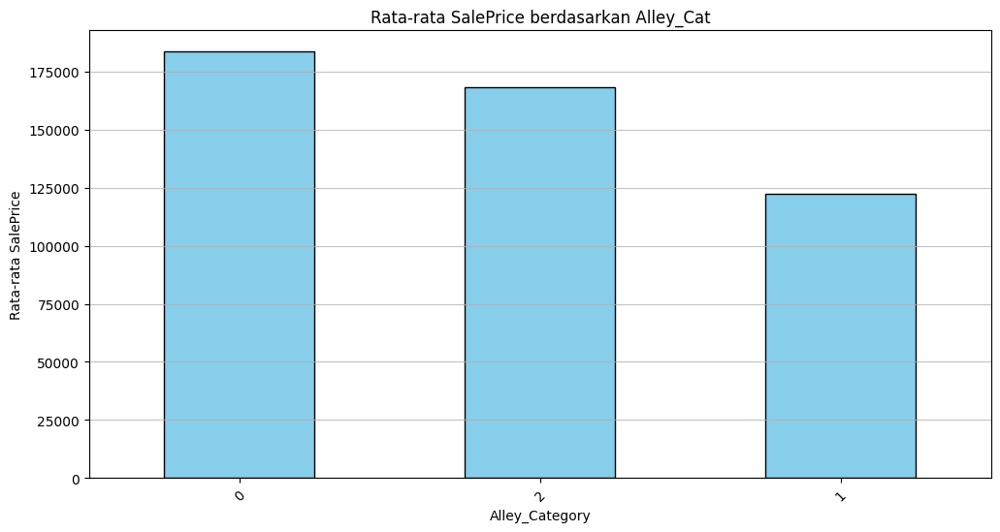

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Alley
average_saleprice = df_train.groupby('Alley_Category')['SalePrice'].mean().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Alley_Cat')
plt.xlabel('Alley_Category')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **LotShape**: General shape of property

In [ ]:
df_train['LotShape'].unique()

array(['Reg', 'IR1', 'IR2', 'IR3'], dtype=object)

In [ ]:
# Mendapatkan tipe data variabel LotShape
LotShape_dtype = df_train['LotShape'].dtype
print(f'Tipe data variabel Lotshape: {LotShape_dtype}')

Tipe data variabel Lotshape: object


In [ ]:
# Menghitung jumlah missing values pada LotShape
missing_values_count = df_train['LotShape'].isnull().sum()
print(f'Jumlah missing values pada variabel LotShape: {missing_values_count}')

Jumlah missing values pada variabel LotShape: 0


In [ ]:
df_train['LotShape'].value_counts()

,count
LotShape,
Reg,925
IR1,484
IR2,41
IR3,10


In [ ]:
data_sorted =df_train.sort_values(by='LotShape', ascending=False)
print(data_sorted[['LotShape']])

    LotShape
0        Reg
864      Reg
873      Reg
872      Reg
871      Reg
..       ...
334      IR1
332      IR1
953      IR1
954      IR1
730      IR1

[1460 rows x 1 columns]


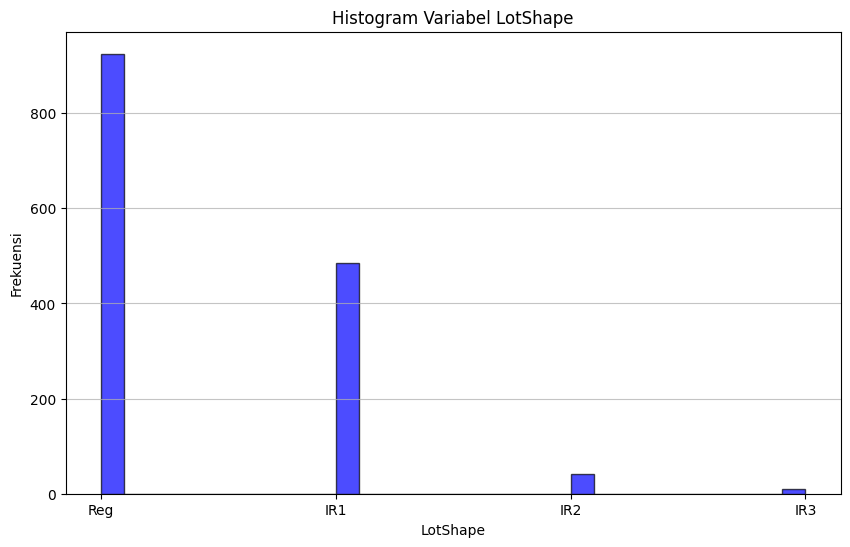

In [ ]:
# Membuat histogram untuk variabel LotShape
plt.figure(figsize=(10, 6))
plt.hist(df_train['LotShape'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel LotShape')
plt.xlabel('LotShape')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel LotShap by variabel SalePrice

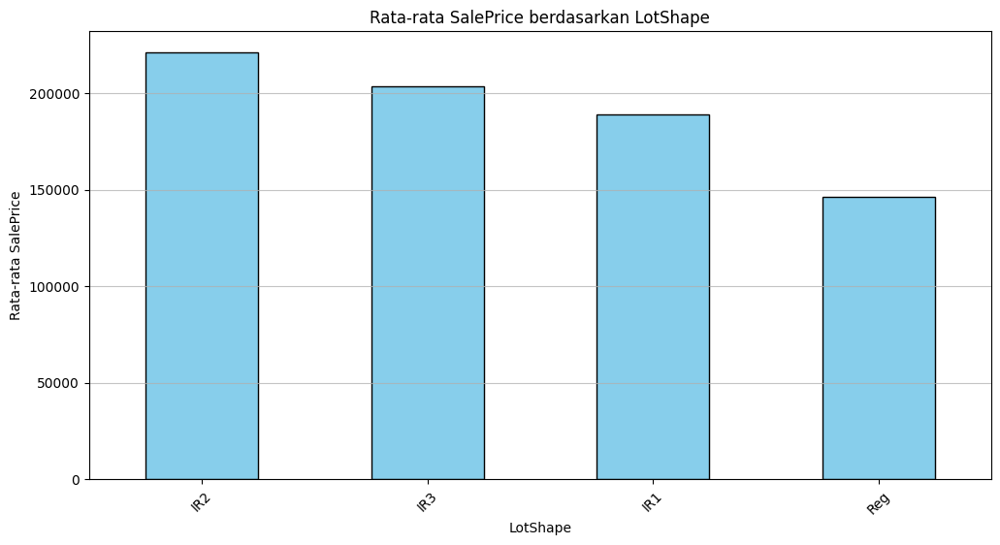

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori LotShape_Category
average_saleprice = df_train.groupby('LotShape')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan LotShape')
plt.xlabel('LotShape')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel LotShape: 1: Reg; 2: IR1; 3: IR3; 4: IR2

In [ ]:
# Menampilkan nilai unik dari kolom LotShape
print("Nilai unik dalam LotShape:")
print(df_train['LotShape'].unique())

# Mengkategorikan LotShape
def categorize_lotshape(value):
    if value in ['IR2']:
        return 4
    elif value in ['IR3']:
        return 3
    elif value in ['IR1']:
        return 2
    elif value in ['Reg']:
        return 1
    else:
        return 0
# Menambahkan kolom baru untuk kategori Street
df_train['LotShape_Category'] = df_train['LotShape'].apply(categorize_lotshape)
# Menampilkan hasil
print("\nHasil pengkategorian LotShape:")
print(df_train[['LotShape', 'LotShape_Category']].head())

Nilai unik dalam LotShape:
['Reg' 'IR1' 'IR2' 'IR3']

Hasil pengkategorian LotShape:
  LotShape  LotShape_Category
0      Reg                  1
1      Reg                  1
2      IR1                  2
3      IR1                  2
4      IR1                  2


EDA untuk variabel LotShape_Category by variabel SalePrice

In [ ]:
pd.set_option('display.max_columns', None)  # Menampilkan semua kolom

jumlah_LotShape_Category_SalesPrice = df_train.groupby(['LotShape_Category', 'SalePrice']).size().unstack(fill_value=0)
jumlah_LotShape_Category_SalesPrice['Total'] = jumlah_LotShape_Category_SalesPrice.sum(axis=1)
jumlah_LotShape_Category_SalesPrice.sort_values(by='Total', ascending=False, inplace=True)
jumlah_LotShape_Category_SalesPrice

SalePrice,34900,35311,37900,39300,40000,52000,52500,55000,55993,58500,60000,61000,62383,64500,66500,67000,68400,68500,72500,73000,75000,75500,76000,76500,78000,79000,79500,79900,80000,80500,81000,82000,82500,83000,83500,84000,84500,84900,85000,85400,85500,86000,87000,87500,88000,89000,89471,89500,90000,90350,91000,91300,91500,92000,92900,93000,93500,94000,94500,94750,95000,96500,97000,97500,98000,98300,98600,99500,99900,100000,101000,101800,102000,102776,103000,103200,103600,104000,104900,105000,105500,105900,106000,106250,106500,107000,107400,107500,107900,108000,108480,108500,108959,109000,109008,109500,109900,110000,110500,111000,111250,112000,112500,113000,114500,114504,115000,116000,116050,116500,116900,117000,117500,118000,118400,118500,118858,118964,119000,119200,119500,119750,119900,120000,120500,121000,121500,121600,122000,122500,122900,123000,123500,123600,124000,124500,124900,125000,125500,126000,126175,126500,127000,127500,128000,128200,128500,128900,128950,129000,129500,129900,130000,130250,130500,131000,131400,131500,132000,132250,132500,133000,133500,133700,133900,134000,134432,134450,134500,134800,134900,135000,135500,135750,135900,135960,136000,136500,136900,136905,137000,137450,137500,137900,138000,138500,138800,138887,139000,139400,139500,139600,139900,139950,140000,140200,141000,141500,142000,142125,142500,142600,142953,143000,143250,143500,143750,143900,144000,144152,144500,144900,145000,145250,145500,145900,146000,146500,146800,147000,147400,147500,148000,148500,148800,149000,149300,149350,149500,149700,149900,150000,150500,150750,150900,151000,151400,151500,152000,153000,153337,153500,153575,153900,154000,154300,154500,154900,155000,155835,155900,156000,156500,156932,157000,157500,157900,158000,158500,158900,159000,159434,159500,159895,159950,160000,160200,161000,161500,161750,162000,162500,162900,163000,163500,163900,163990,164000,164500,164700,164900,164990,165000,165150,165400,165500,165600,166000,167000,167240,167500,167900,168000,168500,169000,169500,169900,169990,170000,171000,171500,171750,171900,172000,172400,172500,172785,173000,173500,173733,173900,174000,174500,174900,175000,175500,175900,176000,176432,176485,176500,177000,177500,178000,178400,178740,178900,179000,179200,179400,179500,179540,179600,179665,179900,180000,180500,181000,181134,181500,181900,182000,182900,183000,183200,183500,183900,184000,184100,184750,184900,185000,185500,185750,185850,185900,186000,186500,186700,187000,187100,187500,187750,188000,188500,188700,189000,189950,190000,191000,192000,192140,192500,193000,193500,193879,194000,194201,194500,194700,195000,195400,196000,196500,197000,197500,197900,198500,198900,199900,200000,200100,200141,200500,200624,201000,201800,202500,202665,202900,203000,204000,204750,204900,205000,205950,206000,206300,206900,207000,207500,208300,208500,208900,209500,210000,211000,212000,212900,213000,213250,213490,213500,214000,214500,214900,215000,215200,216000,216500,216837,217000,217500,218000,219210,219500,220000,221000,221500,222000,222500,223000,223500,224000,224500,224900,225000,226000,226700,227000,227680,227875,228000,228500,228950,229000,229456,230000,230500,231500,232000,232600,233000,233170,233230,234000,235000,235128,236000,236500,237000,237500,238000,239000,239500,239686,239799,239900,240000,241000,241500,242000,243000,244000,244400,244600,245000,245350,245500,246578,248000,248328,248900,249700,250000,250580,251000,252000,252678,253000,253293,254000,254900,255000,255500,255900,256000,256300,257000,257500,258000,259000,259500,260000,260400,261500,262000,262280,262500,263000,263435,264132,264561,265000,265900,265979,266000,266500,267000,268000,269500,269790,270000,271000,271900,272000,274000,274300,274725,274900,274970,275000,275500,276000,277000,277500,278000,279500,280000,281000,281213,282922,283463,284000,285000,286000,287000,287090,289000,290000,293077,294000,295000,295493,297000,299800,301000,301500,302000,303477,305000,305900,306000,307000,309000,310000,311500,311872,312500,313000

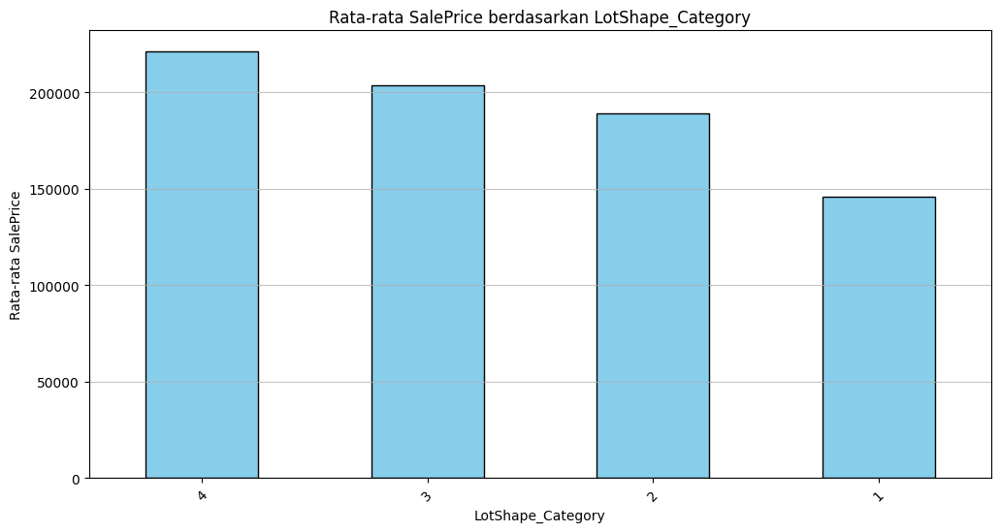

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori LotShape_Category
average_saleprice = df_train.groupby('LotShape_Category')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan LotShape_Category')
plt.xlabel('LotShape_Category')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **LandContour**: Flatness of the property

In [ ]:
df_train['LandContour'].unique()

array(['Lvl', 'Bnk', 'Low', 'HLS'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada LandContour
missing_values_count = df_train['LandContour'].isnull().sum()
print(f'Jumlah missing values pada variabel LandContour: {missing_values_count}')

Jumlah missing values pada variabel LandContour: 0


In [ ]:
df_train['LandContour'].value_counts()

,count
LandContour,
Lvl,1311
Bnk,63
HLS,50
Low,36


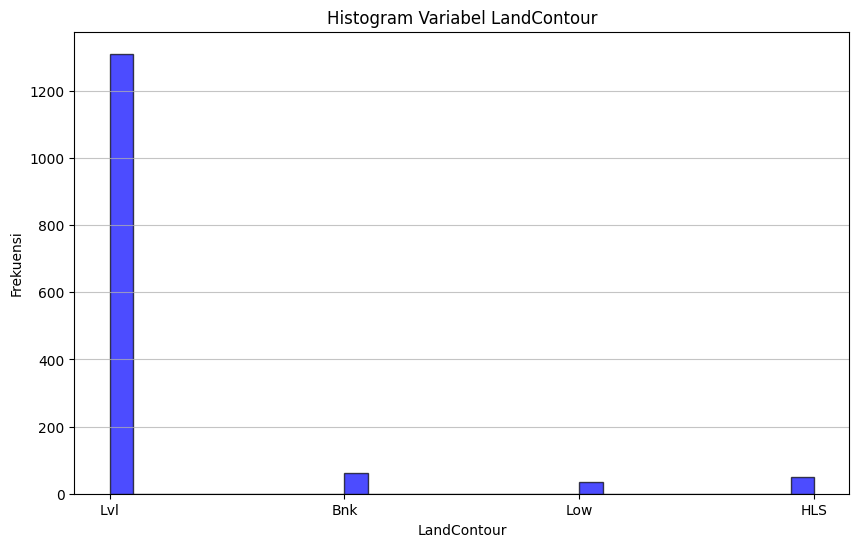

In [ ]:
# Membuat histogram untuk variabel LandContour
plt.figure(figsize=(10, 6))
plt.hist(df_train['LandContour'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel LandContour')
plt.xlabel('LandContour')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel LandContour by variabel SalePrice

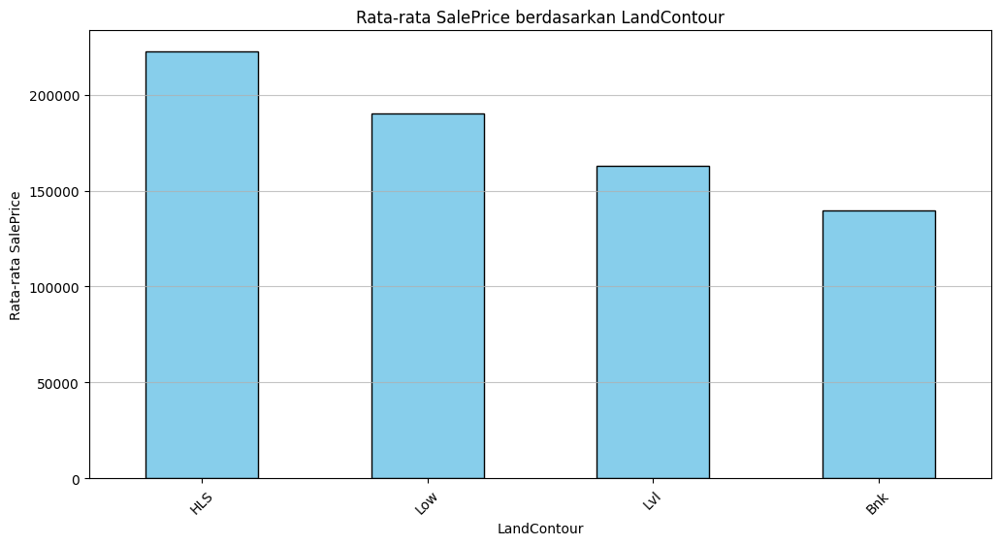

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori LandContour
average_saleprice = df_train.groupby('LandContour')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan LandContour')
plt.xlabel('LandContour')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel LandContour: 1: Bnk; 2: Lvl; 3: Low; 4: Hls

In [ ]:
# Menampilkan nilai unik dari kolom LandContour
print("Nilai unik dalam LandContour:")
print(df_train['LandContour'].unique())

# Mengkategorikan LandContour
def categorize_LandContour(value):
    if value in ['HLS']:
        return 4
    elif value in ['Low']:
        return 3
    elif value in ['Lvl']:
        return 2
    elif value in ['Bnk']:
        return 1
    else:
        return 0
# Menambahkan kolom baru untuk kategori LandContour
df_train['LandContour_Category'] = df_train['LandContour'].apply(categorize_LandContour)
# Menampilkan hasil
print("\nHasil pengkategorian LandContour:")
print(df_train[['LandContour', 'LandContour_Category']].head())

Nilai unik dalam LandContour:
['Lvl' 'Bnk' 'Low' 'HLS']

Hasil pengkategorian LandContour:
  LandContour  LandContour_Category
0         Lvl                     2
1         Lvl                     2
2         Lvl                     2
3         Lvl                     2
4         Lvl                     2


EDA untuk variabel LandContour_Category by variabel SalePrice

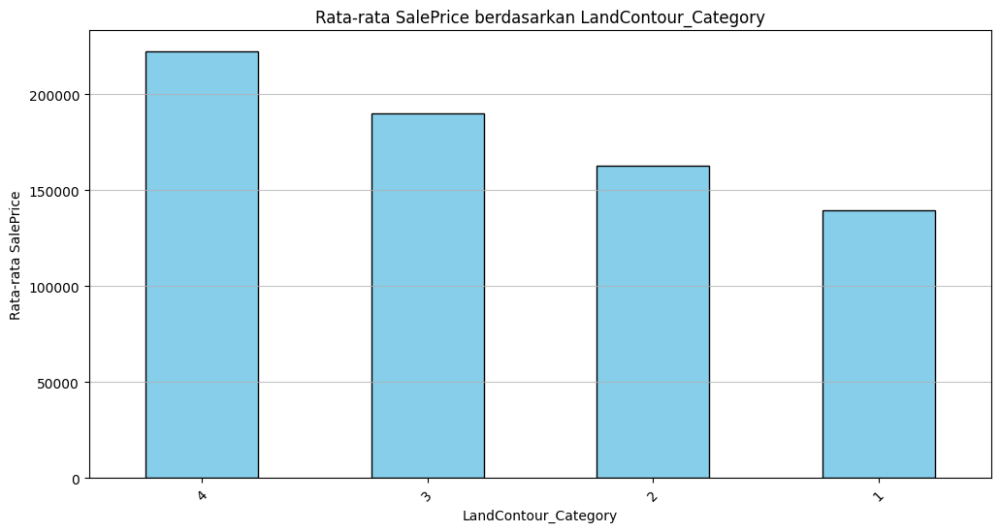

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori LandContour_Category
average_saleprice = df_train.groupby('LandContour_Category')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan LandContour_Category')
plt.xlabel('LandContour_Category')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **Utilities**: Type of utilities available

In [ ]:
df_train['Utilities'].unique()

array(['AllPub', 'NoSeWa'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada Utilities
missing_values_count = df_train['Utilities'].isnull().sum()
print(f'Jumlah missing values pada variabel Utilities: {missing_values_count}')

Jumlah missing values pada variabel Utilities: 0


In [ ]:
df_train['Utilities'].value_counts()

,count
Utilities,
AllPub,1459
NoSeWa,1


In [ ]:
data_sorted =df_train.sort_values(by='Utilities', ascending=False)
print(data_sorted[['Utilities']])

     Utilities
944     NoSeWa
0       AllPub
971     AllPub
979     AllPub
978     AllPub
...        ...
484     AllPub
483     AllPub
482     AllPub
481     AllPub
1459    AllPub

[1460 rows x 1 columns]


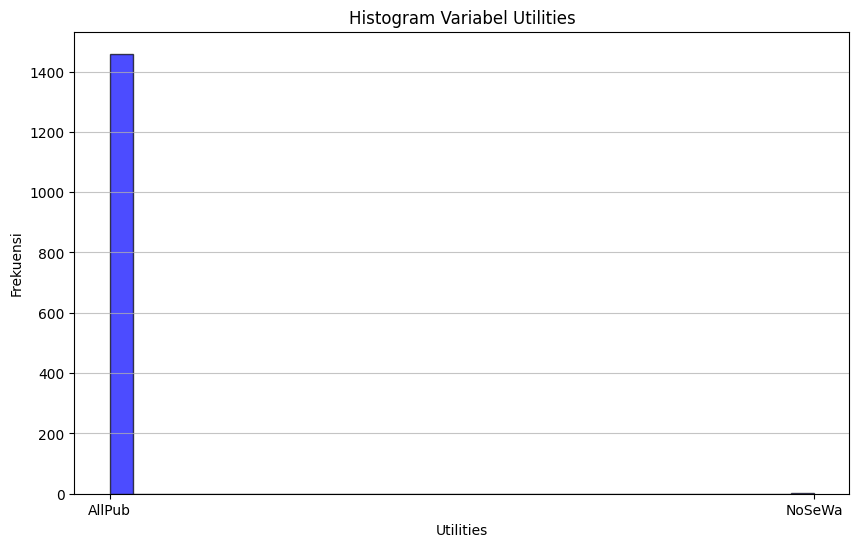

In [ ]:
# Membuat histogram untuk variabel Utilities
plt.figure(figsize=(10, 6))
plt.hist(df_train['Utilities'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel Utilities')
plt.xlabel('Utilities')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel Utilities: 1: ELO; 2: NoSeWa; 3: NoSeWr; 4: AllPub

In [ ]:
# Menampilkan nilai unik dari kolom Utilities
print("Nilai unik dalam Utilities:")
print(df_train['Utilities'].unique())

# Mengkategorikan Utilities
def categorize_Utilities(value):
    if value in ['AllPub']:
        return 4
    elif value in ['NoSeWr']:
        return 3
    elif value in ['NoSeWa']:
        return 2
    elif value in ['ELO']:
        return 1
    else:
        return 0
# Menambahkan kolom baru untuk kategori Utilities
df_train['Utilities_Category'] = df_train['Utilities'].apply(categorize_Utilities)
# Menampilkan hasil
print("\nHasil pengkategorian Utilities:")
print(df_train[['Utilities', 'Utilities_Category']].head())

Nilai unik dalam Utilities:
['AllPub' 'NoSeWa']

Hasil pengkategorian Utilities:
  Utilities  Utilities_Category
0    AllPub                   4
1    AllPub                   4
2    AllPub                   4
3    AllPub                   4
4    AllPub                   4


EDA untuk variabel Utilities_Category by variabel SalePrice

In [ ]:
pd.set_option('display.max_columns', None)  # Menampilkan semua kolom

jumlah_Utilities_Category_SalesPrice = df_train.groupby(['Utilities_Category', 'SalePrice']).size().unstack(fill_value=0)
jumlah_Utilities_Category_SalesPrice['Total'] = jumlah_Utilities_Category_SalesPrice.sum(axis=1)
jumlah_Utilities_Category_SalesPrice.sort_values(by='Total', ascending=False, inplace=True)
jumlah_Utilities_Category_SalesPrice

SalePrice,34900,35311,37900,39300,40000,52000,52500,55000,55993,58500,60000,61000,62383,64500,66500,67000,68400,68500,72500,73000,75000,75500,76000,76500,78000,79000,79500,79900,80000,80500,81000,82000,82500,83000,83500,84000,84500,84900,85000,85400,85500,86000,87000,87500,88000,89000,89471,89500,90000,90350,91000,91300,91500,92000,92900,93000,93500,94000,94500,94750,95000,96500,97000,97500,98000,98300,98600,99500,99900,100000,101000,101800,102000,102776,103000,103200,103600,104000,104900,105000,105500,105900,106000,106250,106500,107000,107400,107500,107900,108000,108480,108500,108959,109000,109008,109500,109900,110000,110500,111000,111250,112000,112500,113000,114500,114504,115000,116000,116050,116500,116900,117000,117500,118000,118400,118500,118858,118964,119000,119200,119500,119750,119900,120000,120500,121000,121500,121600,122000,122500,122900,123000,123500,123600,124000,124500,124900,125000,125500,126000,126175,126500,127000,127500,128000,128200,128500,128900,128950,129000,129500,129900,130000,130250,130500,131000,131400,131500,132000,132250,132500,133000,133500,133700,133900,134000,134432,134450,134500,134800,134900,135000,135500,135750,135900,135960,136000,136500,136900,136905,137000,137450,137500,137900,138000,138500,138800,138887,139000,139400,139500,139600,139900,139950,140000,140200,141000,141500,142000,142125,142500,142600,142953,143000,143250,143500,143750,143900,144000,144152,144500,144900,145000,145250,145500,145900,146000,146500,146800,147000,147400,147500,148000,148500,148800,149000,149300,149350,149500,149700,149900,150000,150500,150750,150900,151000,151400,151500,152000,153000,153337,153500,153575,153900,154000,154300,154500,154900,155000,155835,155900,156000,156500,156932,157000,157500,157900,158000,158500,158900,159000,159434,159500,159895,159950,160000,160200,161000,161500,161750,162000,162500,162900,163000,163500,163900,163990,164000,164500,164700,164900,164990,165000,165150,165400,165500,165600,166000,167000,167240,167500,167900,168000,168500,169000,169500,169900,169990,170000,171000,171500,171750,171900,172000,172400,172500,172785,173000,173500,173733,173900,174000,174500,174900,175000,175500,175900,176000,176432,176485,176500,177000,177500,178000,178400,178740,178900,179000,179200,179400,179500,179540,179600,179665,179900,180000,180500,181000,181134,181500,181900,182000,182900,183000,183200,183500,183900,184000,184100,184750,184900,185000,185500,185750,185850,185900,186000,186500,186700,187000,187100,187500,187750,188000,188500,188700,189000,189950,190000,191000,192000,192140,192500,193000,193500,193879,194000,194201,194500,194700,195000,195400,196000,196500,197000,197500,197900,198500,198900,199900,200000,200100,200141,200500,200624,201000,201800,202500,202665,202900,203000,204000,204750,204900,205000,205950,206000,206300,206900,207000,207500,208300,208500,208900,209500,210000,211000,212000,212900,213000,213250,213490,213500,214000,214500,214900,215000,215200,216000,216500,216837,217000,217500,218000,219210,219500,220000,221000,221500,222000,222500,223000,223500,224000,224500,224900,225000,226000,226700,227000,227680,227875,228000,228500,228950,229000,229456,230000,230500,231500,232000,232600,233000,233170,233230,234000,235000,235128,236000,236500,237000,237500,238000,239000,239500,239686,239799,239900,240000,241000,241500,242000,243000,244000,244400,244600,245000,245350,245500,246578,248000,248328,248900,249700,250000,250580,251000,252000,252678,253000,253293,254000,254900,255000,255500,255900,256000,256300,257000,257500,258000,259000,259500,260000,260400,261500,262000,262280,262500,263000,263435,264132,264561,265000,265900,265979,266000,266500,267000,268000,269500,269790,270000,271000,271900,272000,274000,274300,274725,274900,274970,275000,275500,276000,277000,277500,278000,279500,280000,281000,281213,282922,283463,284000,285000,286000,287000,287090,289000,290000,293077,294000,295000,295493,297000,299800,301000,301500,302000,303477,305000,305900,306000,307000,309000,310000,311500,311872,312500,313000

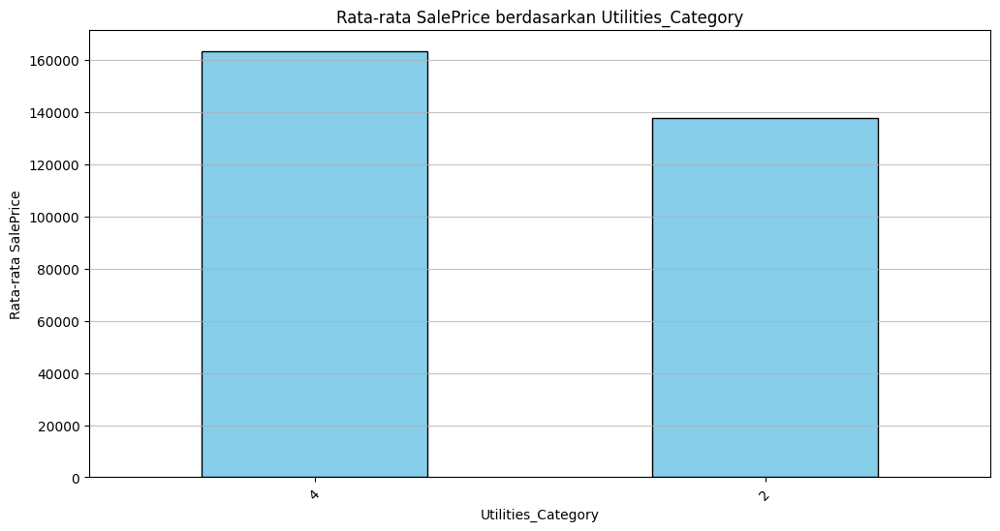

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Utilities_Category
average_saleprice = df_train.groupby('Utilities_Category')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Utilities_Category')
plt.xlabel('Utilities_Category')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **LotConfig**: Lot configuration

In [ ]:
df_train['LotConfig'].unique()

array(['Inside', 'FR2', 'Corner', 'CulDSac', 'FR3'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada LotConfig
missing_values_count = df_train['LotConfig'].isnull().sum()
print(f'Jumlah missing values pada variabel LotConfig: {missing_values_count}')

Jumlah missing values pada variabel LotConfig: 0


In [ ]:
df_train['LotConfig'].value_counts()

,count
LotConfig,
Inside,1052
Corner,263
CulDSac,94
FR2,47
FR3,4


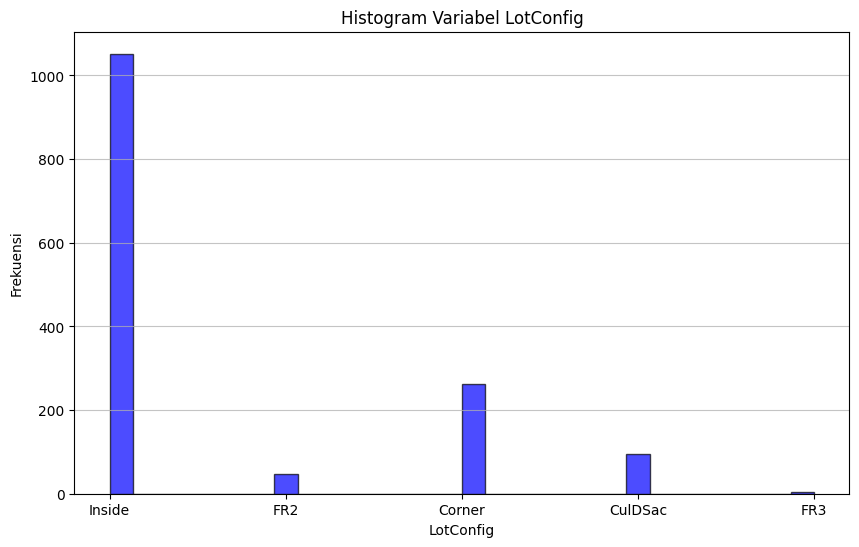

In [ ]:
# Membuat histogram untuk variabel LotConfig
plt.figure(figsize=(10, 6))
plt.hist(df_train['LotConfig'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel LotConfig')
plt.xlabel('LotConfig')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel Latconfig by variabel SalePrice

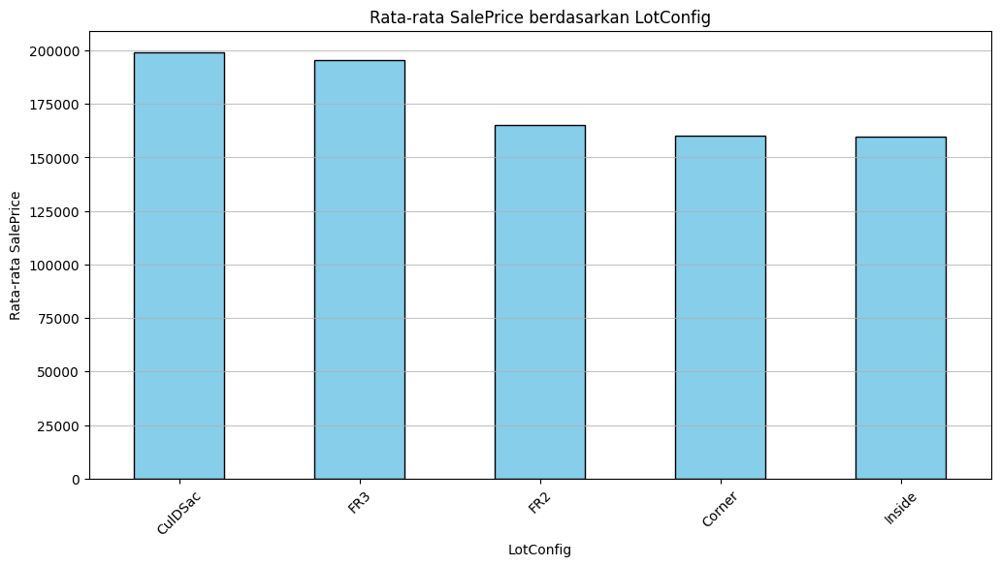

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori LotConfig
average_saleprice = df_train.groupby('LotConfig')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan LotConfig')
plt.xlabel('LotConfig')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel LotConfig: 1: Inside, 2: Corner, 3: FR2, 4: FR3, 5: CulDSac

In [ ]:
    # Fungsi untuk mengkategorikan LotConfig
    def kategorikan_lotconfig(config):
        if config == 'CulDSac':
            return 5
        elif config == 'FR3':
            return 4
        elif config == 'FR2':
            return 3
        elif config == 'Corner':
            return 2
        elif config == 'Inside':
            return 1
        else:
            return 0
     # Menerapkan fungsi ke kolom LotConfig
    df_train['LotConfig_Cat'] = df_train['LotConfig'].apply(kategorikan_lotconfig)

    print("\nHasil pengkategorian Utilities:")
    print(df_train[['LotConfig', 'LotConfig_Cat']].head())


Hasil pengkategorian Utilities:
  LotConfig  LotConfig_Cat
0    Inside              1
1       FR2              3
2    Inside              1
3    Corner              2
4       FR2              3


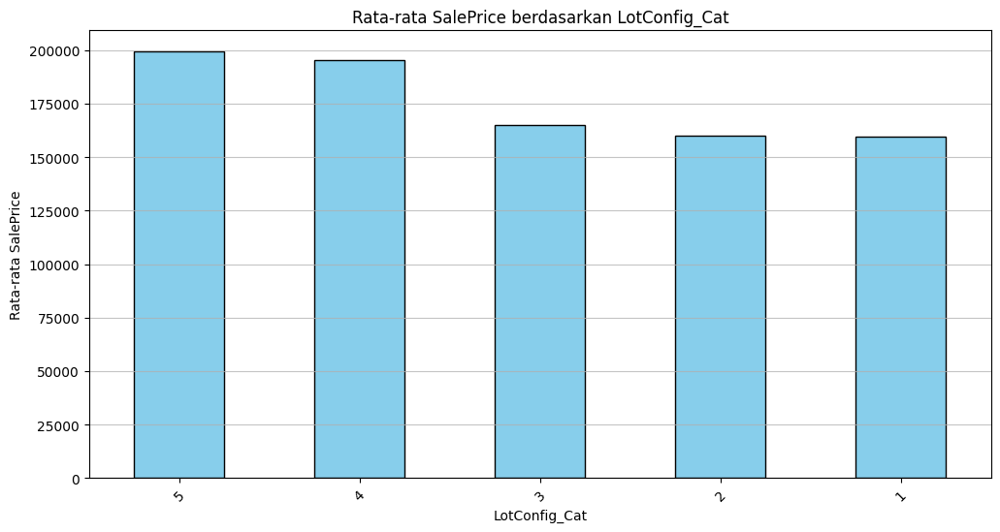

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori LotConfig_Cat
average_saleprice = df_train.groupby('LotConfig_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan LotConfig_Cat')
plt.xlabel('LotConfig_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **LandSlope**: Slope of property

In [ ]:
df_train['LandSlope'].unique()

array(['Gtl', 'Mod', 'Sev'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada LandSlope
missing_values_count = df_train['LandSlope'].isnull().sum()
print(f'Jumlah missing values pada variabel LandSlope: {missing_values_count}')

Jumlah missing values pada variabel LandSlope: 0


In [ ]:
df_train['LandSlope'].value_counts()

,count
LandSlope,
Gtl,1382
Mod,65
Sev,13


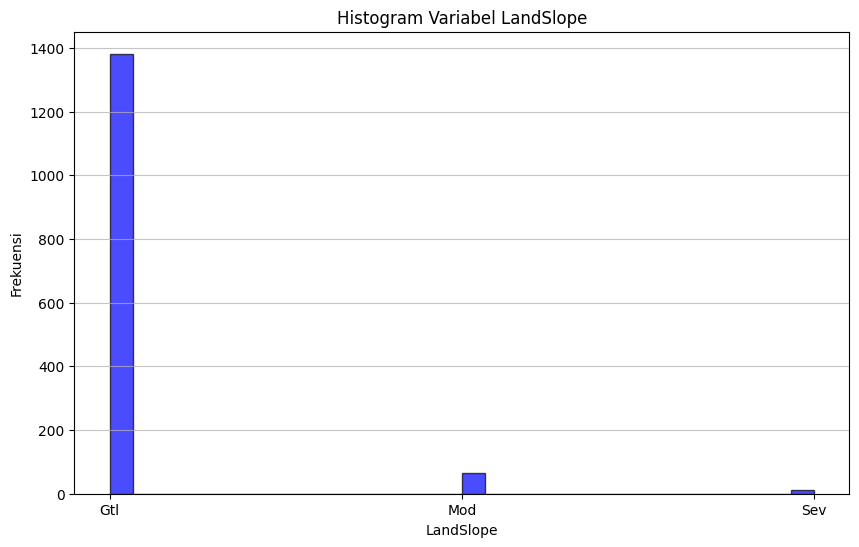

In [ ]:
# Membuat histogram untuk variabel LandSlope
plt.figure(figsize=(10, 6))
plt.hist(df_train['LandSlope'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel LandSlope')
plt.xlabel('LandSlope')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel LandSlope by variabel SalePrice

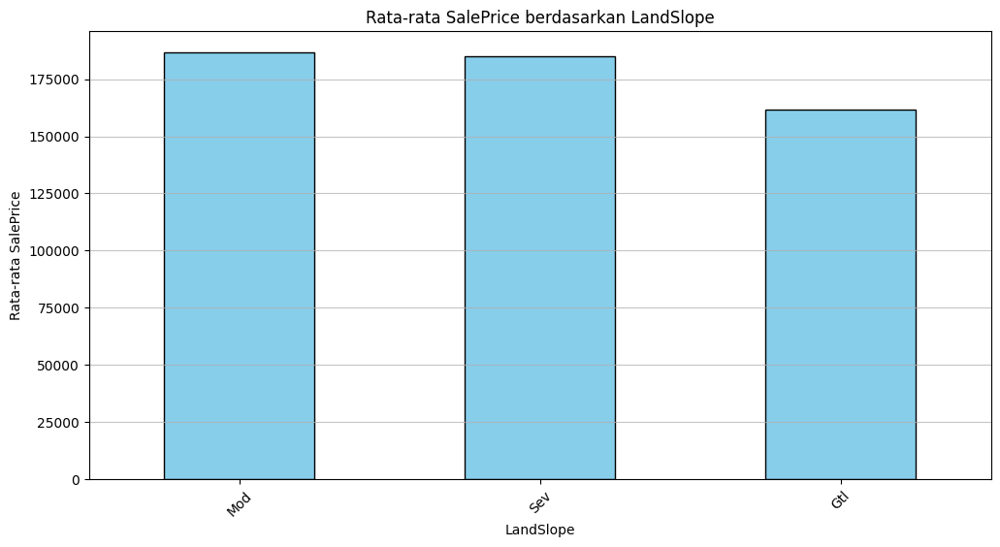

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori LandSlope
average_saleprice = df_train.groupby('LandSlope')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan LandSlope')
plt.xlabel('LandSlope')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel Landslope: 1: Gtl, 2: Sev, 3: Mod,

In [ ]:
# Fungsi untuk mengkategorikan LandSlope_Cat
def kategorikan_landslope(slope):
        if slope == 'Mod':
            return 3
        elif slope == 'Sev':
            return 2
        elif slope == 'Gtl':
            return 1
        else:
            return 0

# Menerapkan fungsi ke kolom LandSlope
df_train['LandSlope_Cat'] = df_train['LandSlope'].apply(kategorikan_landslope)

# Menampilkan hasil
print(df_train[['LandSlope', 'LandSlope_Cat']].head())

  LandSlope  LandSlope_Cat
0       Gtl              1
1       Gtl              1
2       Gtl              1
3       Gtl              1
4       Gtl              1


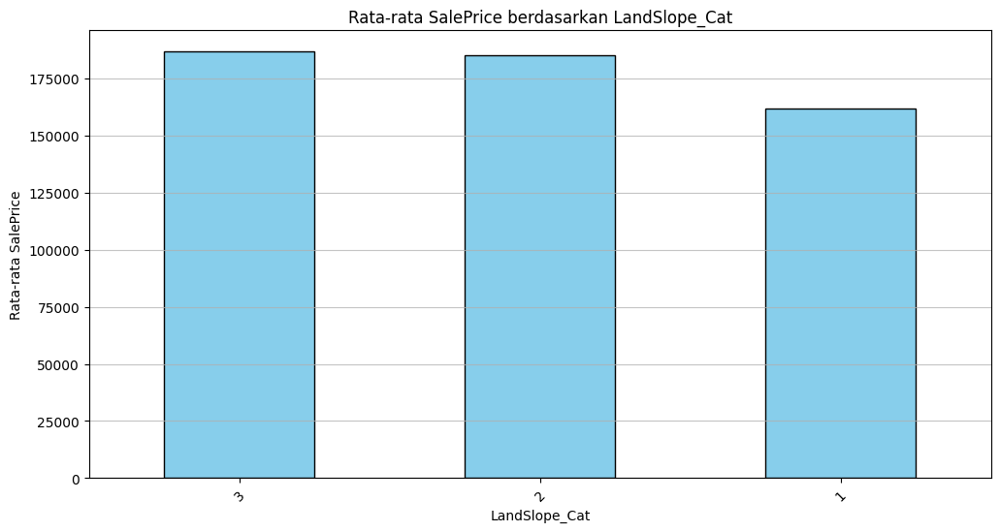

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori LandSlope_Cat
average_saleprice = df_train.groupby('LandSlope_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan LandSlope_Cat')
plt.xlabel('LandSlope_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **Neighborhood**: Physical locations within Ames city limits

In [ ]:
df_train['Neighborhood'].unique()

array(['CollgCr', 'Veenker', 'Crawfor', 'NoRidge', 'Mitchel', 'Somerst',
       'NWAmes', 'OldTown', 'BrkSide', 'Sawyer', 'NridgHt', 'NAmes',
       'SawyerW', 'IDOTRR', 'MeadowV', 'Edwards', 'Timber', 'Gilbert',
       'StoneBr', 'ClearCr', 'NPkVill', 'Blmngtn', 'BrDale', 'SWISU',
       'Blueste'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada LandSlope
missing_values_count = df_train['Neighborhood'].isnull().sum()
print(f'Jumlah missing values pada variabel Neighborhood: {missing_values_count}')

Jumlah missing values pada variabel Neighborhood: 0


In [ ]:
df_train['Neighborhood'].value_counts()

,count
Neighborhood,
NAmes,225
CollgCr,150
OldTown,113
Edwards,100
Somerst,86
Gilbert,79
NridgHt,77
Sawyer,74
NWAmes,73


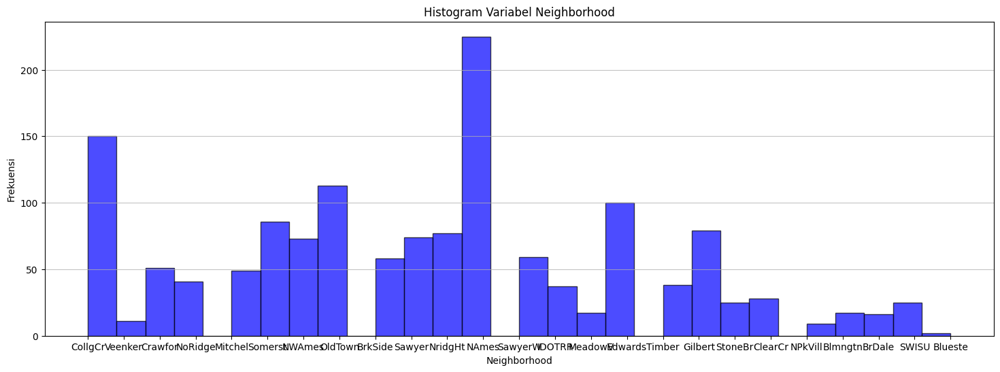

In [ ]:
# Membuat histogram untuk variabel Neighborhood
plt.figure(figsize=(18, 6))
plt.hist(df_train['Neighborhood'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel Neighborhood')
plt.xlabel('Neighborhood')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel Neighborhood by variabel SalePrice

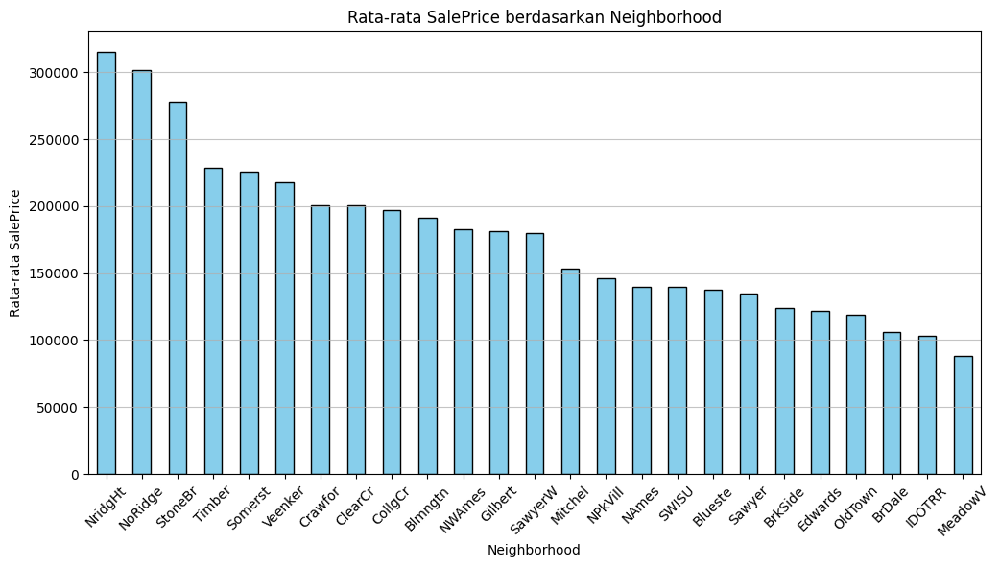

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Neighborhood_Cat
average_saleprice = df_train.groupby('Neighborhood')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Neighborhood')
plt.xlabel('Neighborhood')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel Neighborhood: **5**:'CollgCr', 'Veenker', 'Crawfor', 'NoRidge', 'NridgHt'; **4**: 'SawyerW', 'StoneBr', 'Blueste', 'NPkVill', 'Blmngtn', 'BrDale; **3**: 'OldTown', 'Edwards', 'Somerst', 'NWAmes', 'Gilbert';**2**: 'Sawyer', 'Timber', 'MeadowV', 'NAmes'; **1**: 'BrkSide', 'IDOTRR', 'ClearCr', 'Mitchel', 'SWISU'

In [ ]:
    # Fungsi untuk mengkategorikan Neighborhood
    def kategorikan_neighborhood(neighborhood):
        if neighborhood in ['CollgCr', 'Veenker', 'Crawfor', 'NoRidge', 'NridgHt']:
            return 5 #Lingkungan Premium
        elif neighborhood in ['SawyerW', 'StoneBr', 'Blueste', 'NPkVill', 'Blmngtn', 'BrDale']:
            return 4 # secara data understanding ada kode 4 yang tidak terdapat di bussines understanding, awalnya ini masuk ke other
        elif neighborhood in ['OldTown', 'Edwards', 'Somerst', 'NWAmes', 'Gilbert']:
            return 3 #Lingkungan Menengah
        elif neighborhood in ['Sawyer', 'Timber', 'MeadowV', 'NAmes']:
            return 2 #Lingkungan Biasa
        elif neighborhood in ['BrkSide', 'IDOTRR', 'ClearCr', 'Mitchel', 'SWISU']:
            return 1 #Lingkungan Terbatas
        else:
            return 0

    # Menerapkan fungsi ke kolom Neighborhood
    df_train['Neighborhood_Cat'] = df_train['Neighborhood'].apply(kategorikan_neighborhood)

    # Menampilkan hasil
    print(df_train[['Neighborhood', 'Neighborhood_Cat']].head())

  Neighborhood  Neighborhood_Cat
0      CollgCr                 5
1      Veenker                 5
2      CollgCr                 5
3      Crawfor                 5
4      NoRidge                 5


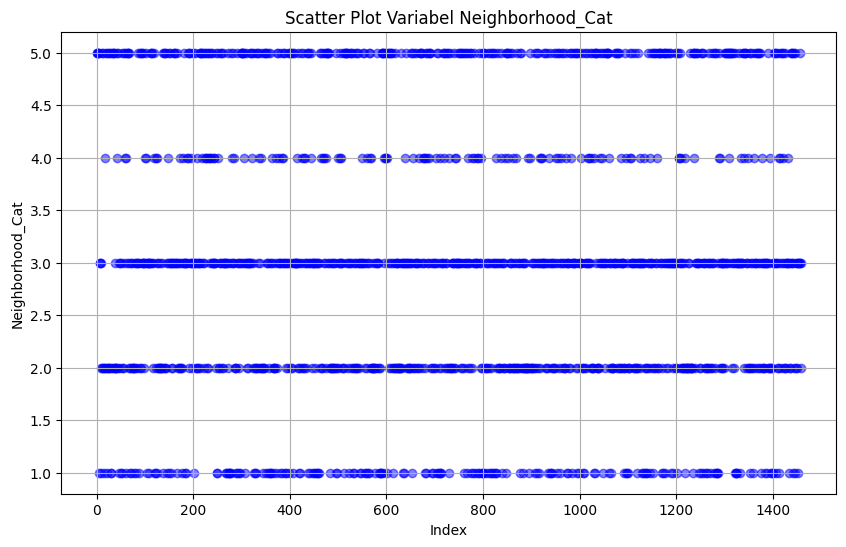

In [ ]:
# Membuat scatter plot untuk variabel Neighborhood_Cat
plt.figure(figsize=(10, 6))
plt.scatter(df_train.index, df_train['Neighborhood_Cat'], color='blue', alpha=0.5)
plt.title('Scatter Plot Variabel Neighborhood_Cat')
plt.xlabel('Index')
plt.ylabel('Neighborhood_Cat')
plt.grid()
plt.show()

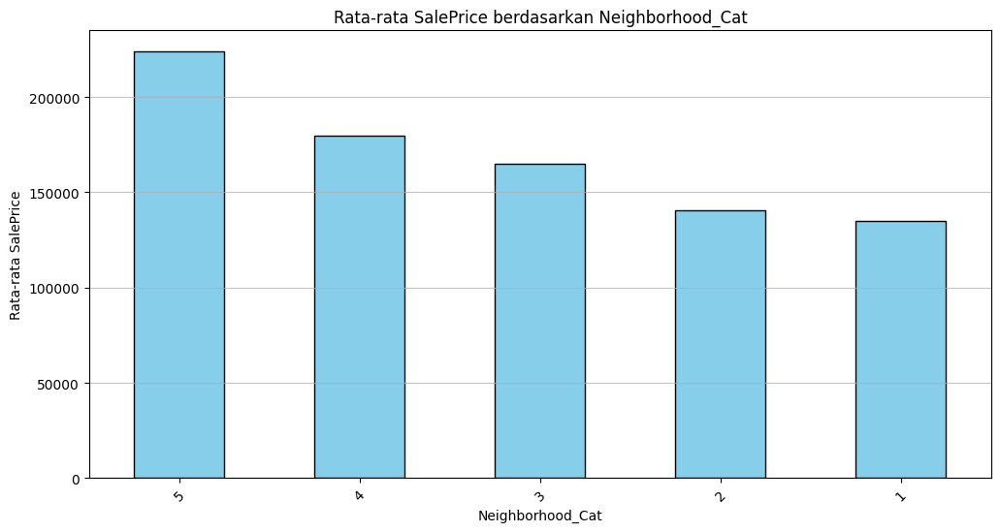

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Neighborhood_Cat
average_saleprice = df_train.groupby('Neighborhood_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Neighborhood_Cat')
plt.xlabel('Neighborhood_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel Condition1

In [ ]:
df_train['Condition1'].unique()

array(['Norm', 'Feedr', 'PosN', 'Artery', 'RRAe', 'RRNn', 'RRAn', 'PosA',
       'RRNe'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada Condition1
missing_values_count = df_train['Condition1'].isnull().sum()
print(f'Jumlah missing values pada variabel Condition1: {missing_values_count}')

Jumlah missing values pada variabel Condition1: 0


In [ ]:
df_train['Condition1'].value_counts()

,count
Condition1,
Norm,1260
Feedr,81
Artery,48
RRAn,26
PosN,19
RRAe,11
PosA,8
RRNn,5
RRNe,2


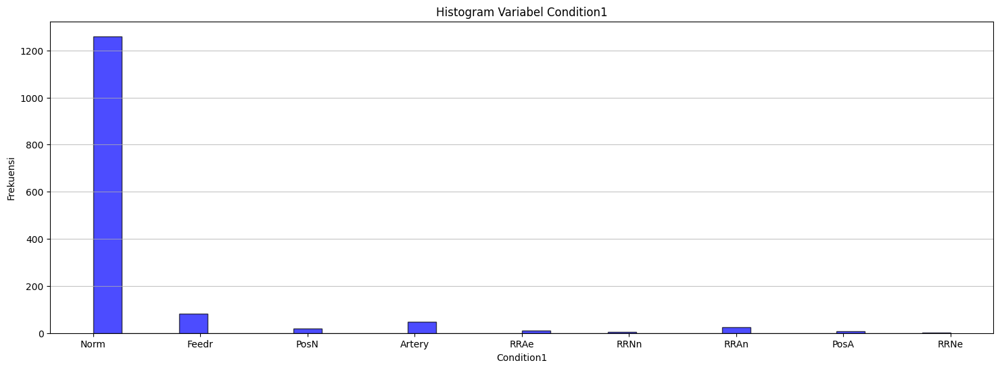

In [ ]:
# Membuat histogram untuk variabel Condition1
plt.figure(figsize=(18, 6))
plt.hist(df_train['Condition1'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel Condition1')
plt.xlabel('Condition1')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel Condition by variabel SalePrice

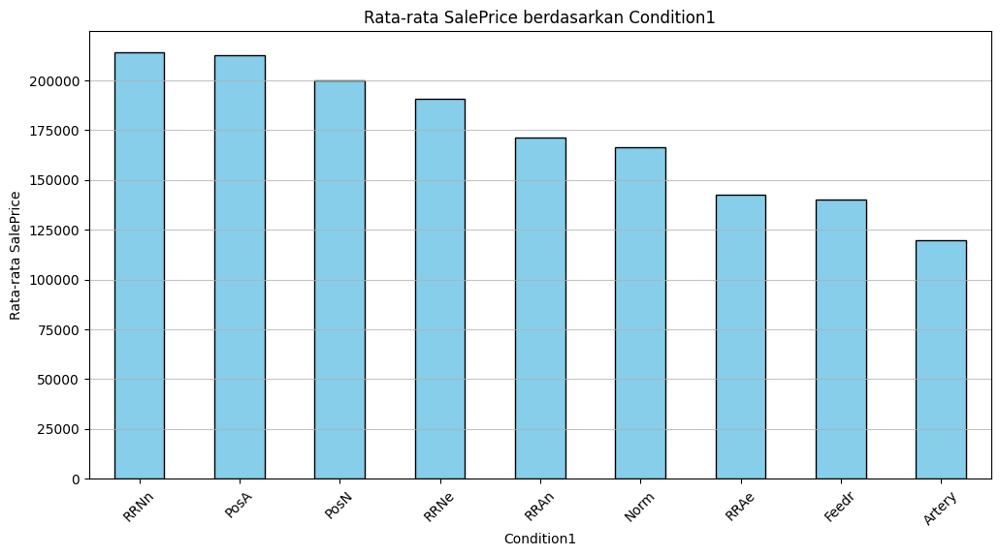

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Condition1
average_saleprice = df_train.groupby('Condition1')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Condition1')
plt.xlabel('Condition1')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel Condition1: 1:Artery, 2:Feedr, 3: RRAe, 4: Norm, 5:RRAn ,6:RRNe ,7:PosN , 8:PosA , 9: RRNn

In [ ]:
    # Fungsi untuk mengkategorikan Condition1, baseon data understanding
    def kategorikan_condition1(condition):
        if condition == 'Artery':
            return 1 #'Berada di Jalan Arterial'
        elif condition == 'Feedr':
            return 2 #'Berada di Jalan Feeder'
        elif condition == 'RRAe':
            return 3 # 'Berada di Samping Rel Kereta Timur-Barat'
        elif condition == 'Norm':
            return 4 #'Penjualan Normal'
        elif condition == 'RRAn':
            return 5 # 'Berada di Samping Rel Kereta Utara-Selatan'
        elif condition == 'RRNe':
            return 6 #'Dalam Jarak 200\' dari Rel Kereta Timur-Barat'
        elif condition == 'PosN':
            return 7 #'Dekat Fitur Positif di Luar – Taman, Greenbelt, dll.'
        elif condition == 'PosA':
            return 8 #'Berada di Samping Fitur Positif di Luar'
        elif condition == 'RRNn':
            return 9 #'Dalam Jarak 200\' dari Rel Kereta Utara-Selatan'
        else:
            return 0 #'Tidak Diketahui'

# Fungsi untuk mengkategorikan Condition1, baseon bussiness understanding
#        if condition == 'Artery':
#            return 1 #'Berada di Jalan Arterial'
#        elif condition == 'Feedr':
#            return 2 #'Berada di Jalan Feeder'
#        elif condition == 'Norm':
#            return 3 #'Penjualan Normal'
#        elif condition == 'RRNn':
#            return 4 #'Dalam Jarak 200\' dari Rel Kereta Utara-Selatan'
#        elif condition == 'RRAn':
#            return 5 #'Berada di Samping Rel Kereta Utara-Selatan'
#        elif condition == 'PosN':
#            return 6 #'Dekat Fitur Positif di Luar – Taman, Greenbelt, dll.'
#        elif condition == 'PosA':
#            return 7 #'Berada di Samping Fitur Positif di Luar'
#        elif condition == 'RRNe':
#            return 8 #'Dalam Jarak 200\' dari Rel Kereta Timur-Barat'
#        elif condition == 'RRAe':
#            return 9 #'Berada di Samping Rel Kereta Timur-Barat'
#        else:
#            return 0 #'Tidak Diketahui'

# ada gap antara frekuensi dan saleprice bisa d lihat dalam tabulasi dibawah

    # Menerapkan fungsi ke kolom Condition1
    df_train['Condition1_Cat'] = df_train['Condition1'].apply(kategorikan_condition1)

    # Menampilkan hasil
    print(df_train[['Condition1', 'Condition1_Cat']].head())

  Condition1  Condition1_Cat
0       Norm               4
1      Feedr               2
2       Norm               4
3       Norm               4
4       Norm               4


In [ ]:
pd.set_option('display.max_columns', None)  # Menampilkan semua kolom

jumlah_Condition1_Cat_SalesPrice = df_train.groupby(['Condition1_Cat', 'SalePrice']).size().unstack(fill_value=0)
jumlah_Condition1_Cat_SalesPrice['Total'] = jumlah_Condition1_Cat_SalesPrice.sum(axis=1)
jumlah_Condition1_Cat_SalesPrice.sort_values(by='Total', ascending=False, inplace=True)
jumlah_Condition1_Cat_SalesPrice

SalePrice,34900,35311,37900,39300,40000,52000,52500,55000,55993,58500,60000,61000,62383,64500,66500,67000,68400,68500,72500,73000,75000,75500,76000,76500,78000,79000,79500,79900,80000,80500,81000,82000,82500,83000,83500,84000,84500,84900,85000,85400,85500,86000,87000,87500,88000,89000,89471,89500,90000,90350,91000,91300,91500,92000,92900,93000,93500,94000,94500,94750,95000,96500,97000,97500,98000,98300,98600,99500,99900,100000,101000,101800,102000,102776,103000,103200,103600,104000,104900,105000,105500,105900,106000,106250,106500,107000,107400,107500,107900,108000,108480,108500,108959,109000,109008,109500,109900,110000,110500,111000,111250,112000,112500,113000,114500,114504,115000,116000,116050,116500,116900,117000,117500,118000,118400,118500,118858,118964,119000,119200,119500,119750,119900,120000,120500,121000,121500,121600,122000,122500,122900,123000,123500,123600,124000,124500,124900,125000,125500,126000,126175,126500,127000,127500,128000,128200,128500,128900,128950,129000,129500,129900,130000,130250,130500,131000,131400,131500,132000,132250,132500,133000,133500,133700,133900,134000,134432,134450,134500,134800,134900,135000,135500,135750,135900,135960,136000,136500,136900,136905,137000,137450,137500,137900,138000,138500,138800,138887,139000,139400,139500,139600,139900,139950,140000,140200,141000,141500,142000,142125,142500,142600,142953,143000,143250,143500,143750,143900,144000,144152,144500,144900,145000,145250,145500,145900,146000,146500,146800,147000,147400,147500,148000,148500,148800,149000,149300,149350,149500,149700,149900,150000,150500,150750,150900,151000,151400,151500,152000,153000,153337,153500,153575,153900,154000,154300,154500,154900,155000,155835,155900,156000,156500,156932,157000,157500,157900,158000,158500,158900,159000,159434,159500,159895,159950,160000,160200,161000,161500,161750,162000,162500,162900,163000,163500,163900,163990,164000,164500,164700,164900,164990,165000,165150,165400,165500,165600,166000,167000,167240,167500,167900,168000,168500,169000,169500,169900,169990,170000,171000,171500,171750,171900,172000,172400,172500,172785,173000,173500,173733,173900,174000,174500,174900,175000,175500,175900,176000,176432,176485,176500,177000,177500,178000,178400,178740,178900,179000,179200,179400,179500,179540,179600,179665,179900,180000,180500,181000,181134,181500,181900,182000,182900,183000,183200,183500,183900,184000,184100,184750,184900,185000,185500,185750,185850,185900,186000,186500,186700,187000,187100,187500,187750,188000,188500,188700,189000,189950,190000,191000,192000,192140,192500,193000,193500,193879,194000,194201,194500,194700,195000,195400,196000,196500,197000,197500,197900,198500,198900,199900,200000,200100,200141,200500,200624,201000,201800,202500,202665,202900,203000,204000,204750,204900,205000,205950,206000,206300,206900,207000,207500,208300,208500,208900,209500,210000,211000,212000,212900,213000,213250,213490,213500,214000,214500,214900,215000,215200,216000,216500,216837,217000,217500,218000,219210,219500,220000,221000,221500,222000,222500,223000,223500,224000,224500,224900,225000,226000,226700,227000,227680,227875,228000,228500,228950,229000,229456,230000,230500,231500,232000,232600,233000,233170,233230,234000,235000,235128,236000,236500,237000,237500,238000,239000,239500,239686,239799,239900,240000,241000,241500,242000,243000,244000,244400,244600,245000,245350,245500,246578,248000,248328,248900,249700,250000,250580,251000,252000,252678,253000,253293,254000,254900,255000,255500,255900,256000,256300,257000,257500,258000,259000,259500,260000,260400,261500,262000,262280,262500,263000,263435,264132,264561,265000,265900,265979,266000,266500,267000,268000,269500,269790,270000,271000,271900,272000,274000,274300,274725,274900,274970,275000,275500,276000,277000,277500,278000,279500,280000,281000,281213,282922,283463,284000,285000,286000,287000,287090,289000,290000,293077,294000,295000,295493,297000,299800,301000,301500,302000,303477,305000,305900,306000,307000,309000,310000,311500,311872,312500,313000

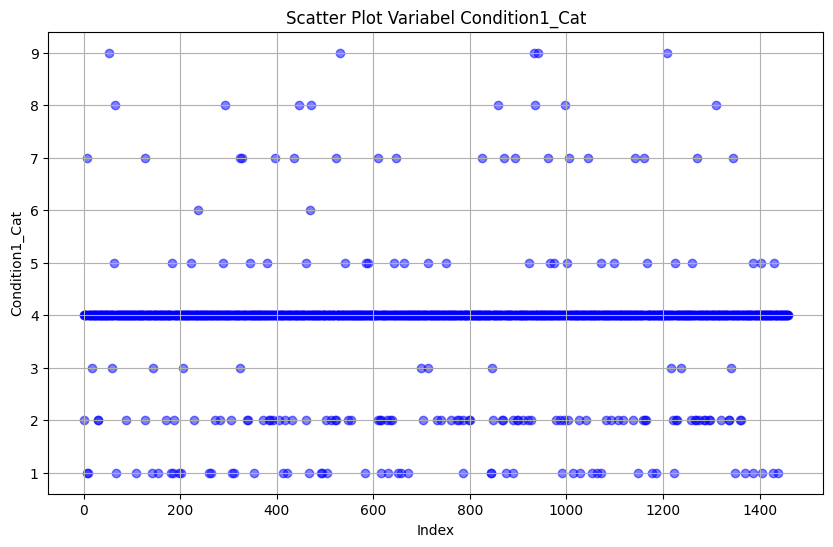

In [ ]:
# Membuat scatter plot untuk variabel Condition1_Cat
plt.figure(figsize=(10, 6))
plt.scatter(df_train.index, df_train['Condition1_Cat'], color='blue', alpha=0.5)
plt.title('Scatter Plot Variabel Condition1_Cat')
plt.xlabel('Index')
plt.ylabel('Condition1_Cat')
plt.grid()
plt.show()

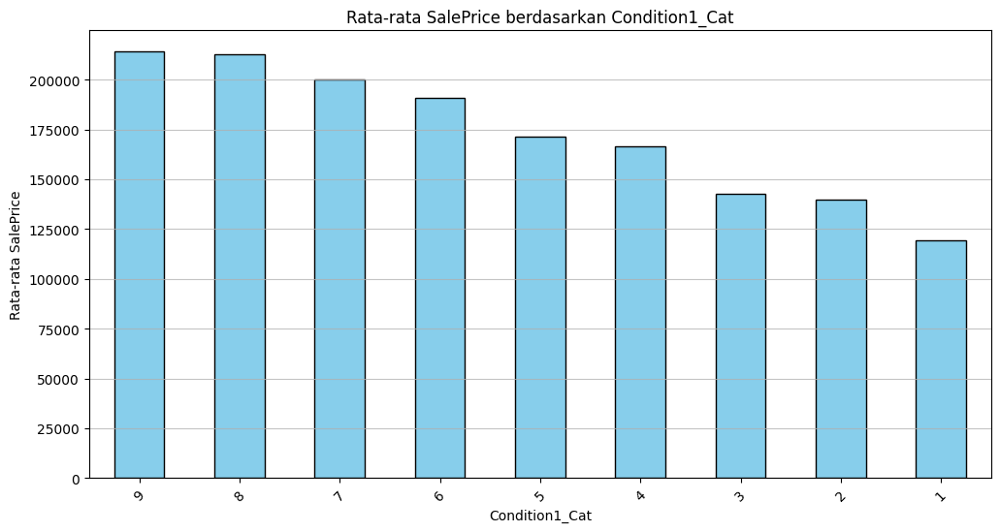

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Condition1
average_saleprice = df_train.groupby('Condition1_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Condition1_Cat')
plt.xlabel('Condition1_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel Condition2

In [ ]:
df_train['Condition2'].unique()

array(['Norm', 'Artery', 'RRNn', 'Feedr', 'PosN', 'PosA', 'RRAn', 'RRAe'],
      dtype=object)

In [ ]:
# Menghitung jumlah missing values pada Condition1
missing_values_count = df_train['Condition2'].isnull().sum()
print(f'Jumlah missing values pada variabel Condition2: {missing_values_count}')

Jumlah missing values pada variabel Condition2: 0


In [ ]:
df_train['Condition2'].value_counts()

,count
Condition2,
Norm,1445
Feedr,6
Artery,2
RRNn,2
PosN,2
PosA,1
RRAn,1
RRAe,1


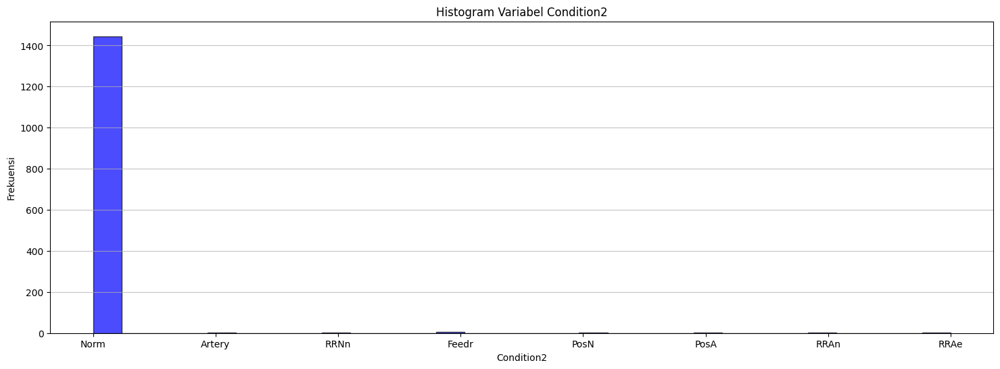

In [ ]:
# Membuat histogram untuk variabel Condition2
plt.figure(figsize=(18, 6))
plt.hist(df_train['Condition2'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel Condition2')
plt.xlabel('Condition2')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel Condition2 by variabel SalePrice

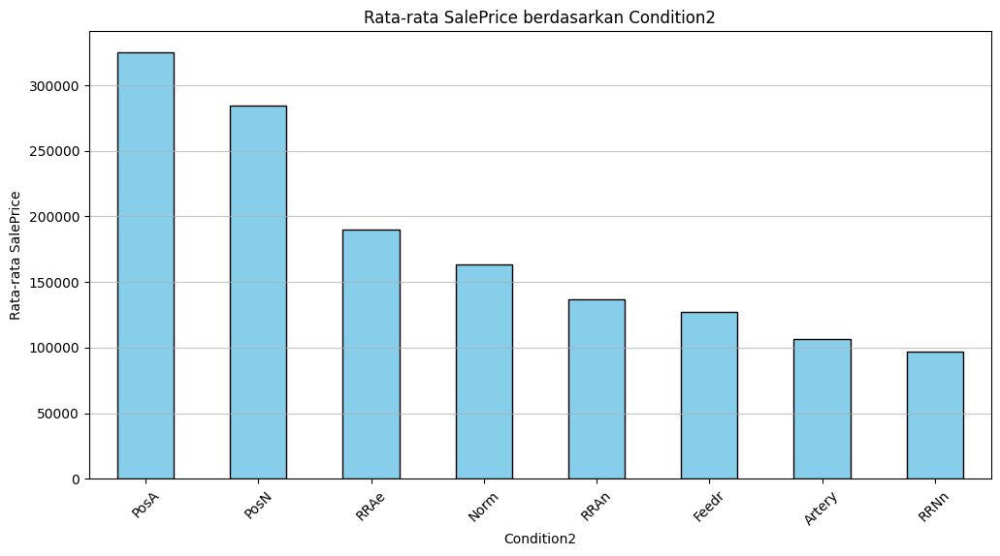

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Condition2
average_saleprice = df_train.groupby('Condition2')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Condition2')
plt.xlabel('Condition2')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel Condition2:  1:RRNn, 2:Artery, 3: Feedr, 4: RRAn, 5:Norm ,6:RRAe ,7:PosN , 8:PosA

In [ ]:
    # Fungsi untuk mengkategorikan Condition2
    def kategorikan_condition2(condition):
        if condition == 'RRNn':
            return 1 #'Dalam Jarak 200\' dari Rel Kereta Utara-Selatan'
        elif condition == 'Artery':
            return 2 #'Berada di Jalan Arterial'
        elif condition == 'Feedr':
            return 3 #'Berada di Jalan Feeder'
        elif condition == 'RRAn':
            return 4 #'Berada di Samping Rel Kereta Utara-Selatan'
        elif condition == 'Norm':
            return 5 # 'Penjualan Normal'
        elif condition == 'RRAe':
            return 6 #'Berada di Samping Rel Kereta Timur-Barat'
        elif condition == 'PosN':
            return 7 # 'Dekat Fitur Positif di Luar – Taman, Greenbelt, dll.'
        elif condition == 'PosA':
            return 8 #'Berada di Samping Fitur Positif di Luar'
        else:
            return 0 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom Condition2
    df_train['Condition2_Cat'] = df_train['Condition2'].apply(kategorikan_condition2)

    # Menampilkan hasil
    print(df_train[['Condition2', 'Condition2_Cat']].head())

  Condition2  Condition2_Cat
0       Norm               5
1       Norm               5
2       Norm               5
3       Norm               5
4       Norm               5


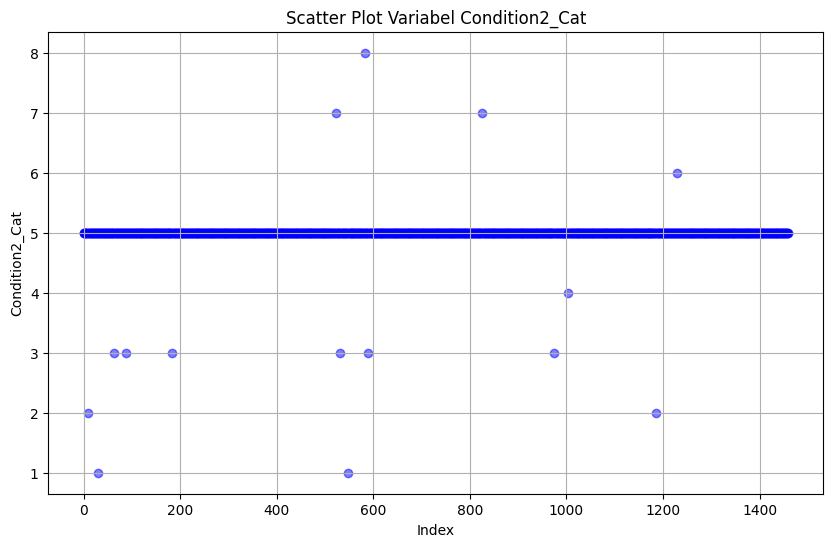

In [ ]:
# Membuat scatter plot untuk variabel Condition2_Cat
plt.figure(figsize=(10, 6))
plt.scatter(df_train.index, df_train['Condition2_Cat'], color='blue', alpha=0.5)
plt.title('Scatter Plot Variabel Condition2_Cat')
plt.xlabel('Index')
plt.ylabel('Condition2_Cat')
plt.grid()
plt.show()


In [ ]:
pd.set_option('display.max_columns', None)  # Menampilkan semua kolom

jumlah_Condition2_Cat_SalesPrice = df_train.groupby(['Condition2_Cat', 'SalePrice']).size().unstack(fill_value=0)
jumlah_Condition2_Cat_SalesPrice['Total'] = jumlah_Condition2_Cat_SalesPrice.sum(axis=1)
jumlah_Condition2_Cat_SalesPrice.sort_values(by='Total', ascending=False, inplace=True)
jumlah_Condition2_Cat_SalesPrice



SalePrice,34900,35311,37900,39300,40000,52000,52500,55000,55993,58500,60000,61000,62383,64500,66500,67000,68400,68500,72500,73000,75000,75500,76000,76500,78000,79000,79500,79900,80000,80500,81000,82000,82500,83000,83500,84000,84500,84900,85000,85400,85500,86000,87000,87500,88000,89000,89471,89500,90000,90350,91000,91300,91500,92000,92900,93000,93500,94000,94500,94750,95000,96500,97000,97500,98000,98300,98600,99500,99900,100000,101000,101800,102000,102776,103000,103200,103600,104000,104900,105000,105500,105900,106000,106250,106500,107000,107400,107500,107900,108000,108480,108500,108959,109000,109008,109500,109900,110000,110500,111000,111250,112000,112500,113000,114500,114504,115000,116000,116050,116500,116900,117000,117500,118000,118400,118500,118858,118964,119000,119200,119500,119750,119900,120000,120500,121000,121500,121600,122000,122500,122900,123000,123500,123600,124000,124500,124900,125000,125500,126000,126175,126500,127000,127500,128000,128200,128500,128900,128950,129000,129500,129900,130000,130250,130500,131000,131400,131500,132000,132250,132500,133000,133500,133700,133900,134000,134432,134450,134500,134800,134900,135000,135500,135750,135900,135960,136000,136500,136900,136905,137000,137450,137500,137900,138000,138500,138800,138887,139000,139400,139500,139600,139900,139950,140000,140200,141000,141500,142000,142125,142500,142600,142953,143000,143250,143500,143750,143900,144000,144152,144500,144900,145000,145250,145500,145900,146000,146500,146800,147000,147400,147500,148000,148500,148800,149000,149300,149350,149500,149700,149900,150000,150500,150750,150900,151000,151400,151500,152000,153000,153337,153500,153575,153900,154000,154300,154500,154900,155000,155835,155900,156000,156500,156932,157000,157500,157900,158000,158500,158900,159000,159434,159500,159895,159950,160000,160200,161000,161500,161750,162000,162500,162900,163000,163500,163900,163990,164000,164500,164700,164900,164990,165000,165150,165400,165500,165600,166000,167000,167240,167500,167900,168000,168500,169000,169500,169900,169990,170000,171000,171500,171750,171900,172000,172400,172500,172785,173000,173500,173733,173900,174000,174500,174900,175000,175500,175900,176000,176432,176485,176500,177000,177500,178000,178400,178740,178900,179000,179200,179400,179500,179540,179600,179665,179900,180000,180500,181000,181134,181500,181900,182000,182900,183000,183200,183500,183900,184000,184100,184750,184900,185000,185500,185750,185850,185900,186000,186500,186700,187000,187100,187500,187750,188000,188500,188700,189000,189950,190000,191000,192000,192140,192500,193000,193500,193879,194000,194201,194500,194700,195000,195400,196000,196500,197000,197500,197900,198500,198900,199900,200000,200100,200141,200500,200624,201000,201800,202500,202665,202900,203000,204000,204750,204900,205000,205950,206000,206300,206900,207000,207500,208300,208500,208900,209500,210000,211000,212000,212900,213000,213250,213490,213500,214000,214500,214900,215000,215200,216000,216500,216837,217000,217500,218000,219210,219500,220000,221000,221500,222000,222500,223000,223500,224000,224500,224900,225000,226000,226700,227000,227680,227875,228000,228500,228950,229000,229456,230000,230500,231500,232000,232600,233000,233170,233230,234000,235000,235128,236000,236500,237000,237500,238000,239000,239500,239686,239799,239900,240000,241000,241500,242000,243000,244000,244400,244600,245000,245350,245500,246578,248000,248328,248900,249700,250000,250580,251000,252000,252678,253000,253293,254000,254900,255000,255500,255900,256000,256300,257000,257500,258000,259000,259500,260000,260400,261500,262000,262280,262500,263000,263435,264132,264561,265000,265900,265979,266000,266500,267000,268000,269500,269790,270000,271000,271900,272000,274000,274300,274725,274900,274970,275000,275500,276000,277000,277500,278000,279500,280000,281000,281213,282922,283463,284000,285000,286000,287000,287090,289000,290000,293077,294000,295000,295493,297000,299800,301000,301500,302000,303477,305000,305900,306000,307000,309000,310000,311500,311872,312500,313000

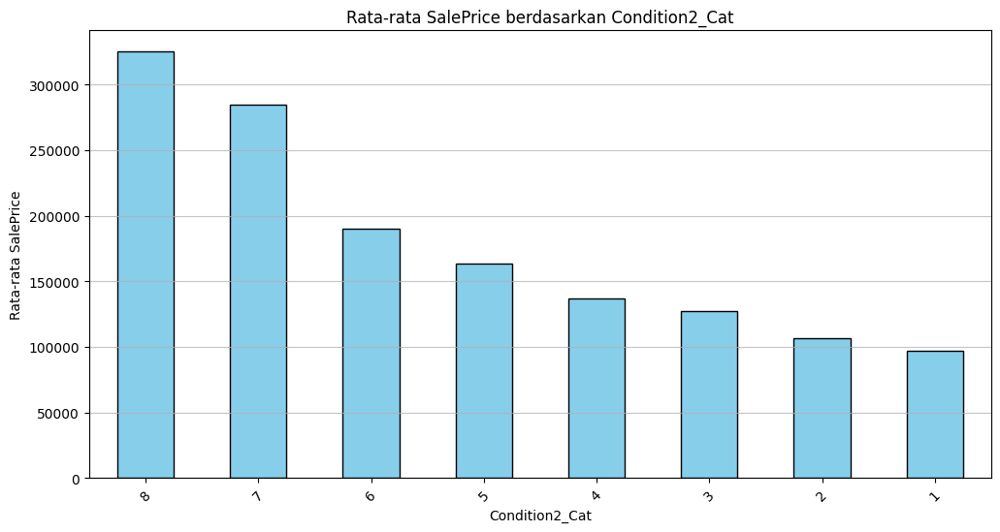

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Condition2_Cat
average_saleprice = df_train.groupby('Condition2_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Condition2_Cat')
plt.xlabel('Condition2_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **BldgType**: Type of dwelling

In [ ]:
df_train['BldgType'].unique()

array(['1Fam', '2fmCon', 'Duplex', 'TwnhsE', 'Twnhs'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada Condition1
missing_values_count = df_train['BldgType'].isnull().sum()
print(f'Jumlah missing values pada variabel BldgType: {missing_values_count}')

Jumlah missing values pada variabel BldgType: 0


In [ ]:
df_train['BldgType'].value_counts()

,count
BldgType,
1Fam,1220
TwnhsE,114
Duplex,52
Twnhs,43
2fmCon,31


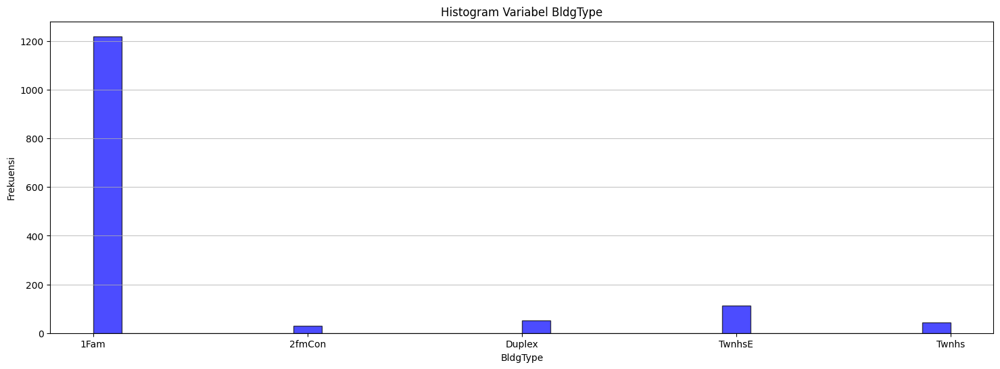

In [ ]:
# Membuat histogram untuk variabel BldgType
plt.figure(figsize=(18, 6))
plt.hist(df_train['BldgType'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel BldgType')
plt.xlabel('BldgType')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()


EDA untuk variabel BldgType by variabel SalePrice

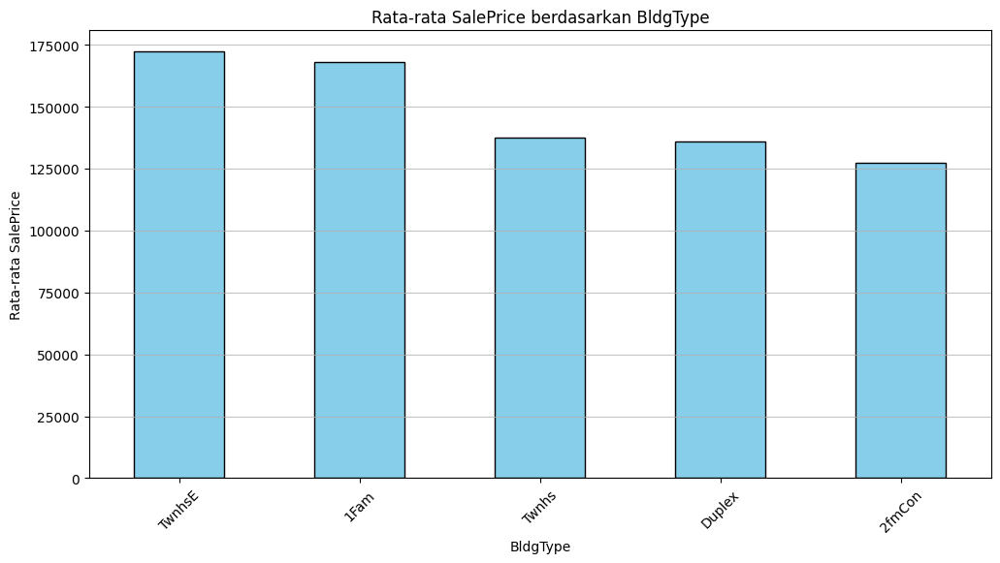

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori BldgType
average_saleprice = df_train.groupby('BldgType')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan BldgType')
plt.xlabel('BldgType')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel BldgType: 1:2fmCon , 2:Duplex , 3:Twnhs , 4:1Fam , 5:TwnhsE

In [ ]:
    # Fungsi untuk mengkategorikan BldgType_Cat
    def kategorikan_bldgtype(bldg_type):
        if bldg_type == '2fmCon':
            return 1 #'Two-family Conversion'
        elif bldg_type == 'Duplex':
            return 2 #'Duplex'
        elif bldg_type == 'Twnhs':
            return 3 #Townhouse Inside Unit
        elif bldg_type == '1Fam':
            return 4 #'Single-family Detached'
        elif bldg_type == 'TwnhsE':
            return 5 #'Townhouse End Unit'
        else:
            return 0 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom BldgType
    df_train['BldgType_Cat'] = df_train['BldgType'].apply(kategorikan_bldgtype)

    # Menampilkan hasil
    print(df_train[['BldgType', 'BldgType_Cat']].head())

  BldgType  BldgType_Cat
0     1Fam             4
1     1Fam             4
2     1Fam             4
3     1Fam             4
4     1Fam             4


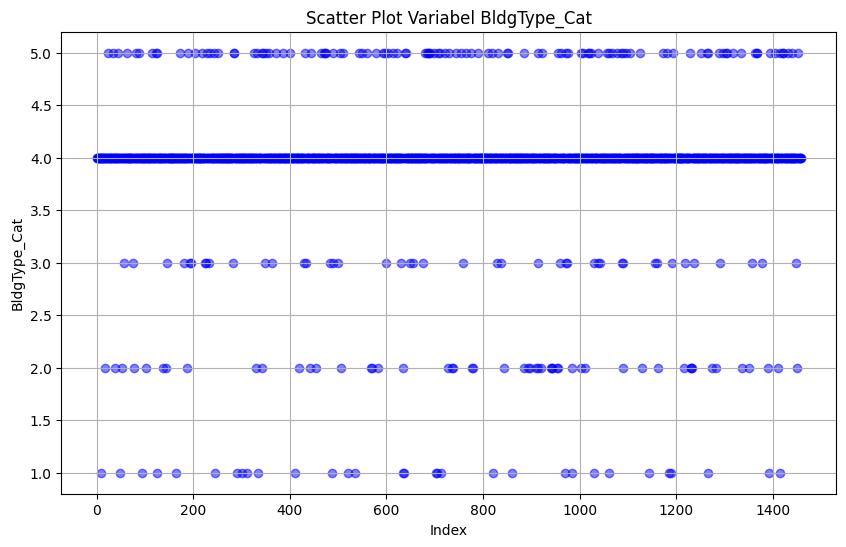

In [ ]:
# Membuat scatter plot untuk variabel BldgType_Cat
plt.figure(figsize=(10, 6))
plt.scatter(df_train.index, df_train['BldgType_Cat'], color='blue', alpha=0.5)
plt.title('Scatter Plot Variabel BldgType_Cat')
plt.xlabel('Index')
plt.ylabel('BldgType_Cat')
plt.grid()
plt.show()

In [ ]:
pd.set_option('display.max_columns', None)  # Menampilkan semua kolom

jumlah_BldgType_Cat_SalesPrice = df_train.groupby(['BldgType_Cat', 'SalePrice']).size().unstack(fill_value=0)
jumlah_BldgType_Cat_SalesPrice['Total'] = jumlah_BldgType_Cat_SalesPrice.sum(axis=1)
jumlah_BldgType_Cat_SalesPrice.sort_values(by='Total', ascending=False, inplace=True)
jumlah_BldgType_Cat_SalesPrice

SalePrice,34900,35311,37900,39300,40000,52000,52500,55000,55993,58500,60000,61000,62383,64500,66500,67000,68400,68500,72500,73000,75000,75500,76000,76500,78000,79000,79500,79900,80000,80500,81000,82000,82500,83000,83500,84000,84500,84900,85000,85400,85500,86000,87000,87500,88000,89000,89471,89500,90000,90350,91000,91300,91500,92000,92900,93000,93500,94000,94500,94750,95000,96500,97000,97500,98000,98300,98600,99500,99900,100000,101000,101800,102000,102776,103000,103200,103600,104000,104900,105000,105500,105900,106000,106250,106500,107000,107400,107500,107900,108000,108480,108500,108959,109000,109008,109500,109900,110000,110500,111000,111250,112000,112500,113000,114500,114504,115000,116000,116050,116500,116900,117000,117500,118000,118400,118500,118858,118964,119000,119200,119500,119750,119900,120000,120500,121000,121500,121600,122000,122500,122900,123000,123500,123600,124000,124500,124900,125000,125500,126000,126175,126500,127000,127500,128000,128200,128500,128900,128950,129000,129500,129900,130000,130250,130500,131000,131400,131500,132000,132250,132500,133000,133500,133700,133900,134000,134432,134450,134500,134800,134900,135000,135500,135750,135900,135960,136000,136500,136900,136905,137000,137450,137500,137900,138000,138500,138800,138887,139000,139400,139500,139600,139900,139950,140000,140200,141000,141500,142000,142125,142500,142600,142953,143000,143250,143500,143750,143900,144000,144152,144500,144900,145000,145250,145500,145900,146000,146500,146800,147000,147400,147500,148000,148500,148800,149000,149300,149350,149500,149700,149900,150000,150500,150750,150900,151000,151400,151500,152000,153000,153337,153500,153575,153900,154000,154300,154500,154900,155000,155835,155900,156000,156500,156932,157000,157500,157900,158000,158500,158900,159000,159434,159500,159895,159950,160000,160200,161000,161500,161750,162000,162500,162900,163000,163500,163900,163990,164000,164500,164700,164900,164990,165000,165150,165400,165500,165600,166000,167000,167240,167500,167900,168000,168500,169000,169500,169900,169990,170000,171000,171500,171750,171900,172000,172400,172500,172785,173000,173500,173733,173900,174000,174500,174900,175000,175500,175900,176000,176432,176485,176500,177000,177500,178000,178400,178740,178900,179000,179200,179400,179500,179540,179600,179665,179900,180000,180500,181000,181134,181500,181900,182000,182900,183000,183200,183500,183900,184000,184100,184750,184900,185000,185500,185750,185850,185900,186000,186500,186700,187000,187100,187500,187750,188000,188500,188700,189000,189950,190000,191000,192000,192140,192500,193000,193500,193879,194000,194201,194500,194700,195000,195400,196000,196500,197000,197500,197900,198500,198900,199900,200000,200100,200141,200500,200624,201000,201800,202500,202665,202900,203000,204000,204750,204900,205000,205950,206000,206300,206900,207000,207500,208300,208500,208900,209500,210000,211000,212000,212900,213000,213250,213490,213500,214000,214500,214900,215000,215200,216000,216500,216837,217000,217500,218000,219210,219500,220000,221000,221500,222000,222500,223000,223500,224000,224500,224900,225000,226000,226700,227000,227680,227875,228000,228500,228950,229000,229456,230000,230500,231500,232000,232600,233000,233170,233230,234000,235000,235128,236000,236500,237000,237500,238000,239000,239500,239686,239799,239900,240000,241000,241500,242000,243000,244000,244400,244600,245000,245350,245500,246578,248000,248328,248900,249700,250000,250580,251000,252000,252678,253000,253293,254000,254900,255000,255500,255900,256000,256300,257000,257500,258000,259000,259500,260000,260400,261500,262000,262280,262500,263000,263435,264132,264561,265000,265900,265979,266000,266500,267000,268000,269500,269790,270000,271000,271900,272000,274000,274300,274725,274900,274970,275000,275500,276000,277000,277500,278000,279500,280000,281000,281213,282922,283463,284000,285000,286000,287000,287090,289000,290000,293077,294000,295000,295493,297000,299800,301000,301500,302000,303477,305000,305900,306000,307000,309000,310000,311500,311872,312500,313000

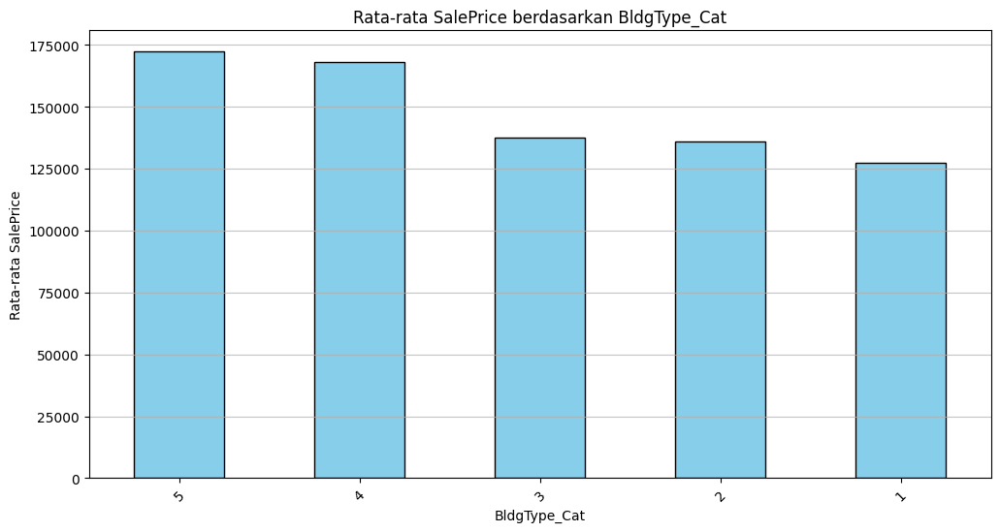

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori BldgType_Cat
average_saleprice = df_train.groupby('BldgType_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan BldgType_Cat')
plt.xlabel('BldgType_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **HouseStyle**: Style of dwelling

In [ ]:
df_train['HouseStyle'].unique()

array(['2Story', '1Story', '1.5Fin', '1.5Unf', 'SFoyer', 'SLvl', '2.5Unf',
       '2.5Fin'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada HouseStyle
missing_values_count = df_train['HouseStyle'].isnull().sum()
print(f'Jumlah missing values pada variabel HouseStyle: {missing_values_count}')


Jumlah missing values pada variabel HouseStyle: 0


In [ ]:
df_train['HouseStyle'].value_counts()


,count
HouseStyle,
1Story,726
2Story,445
1.5Fin,154
SLvl,65
SFoyer,37
1.5Unf,14
2.5Unf,11
2.5Fin,8


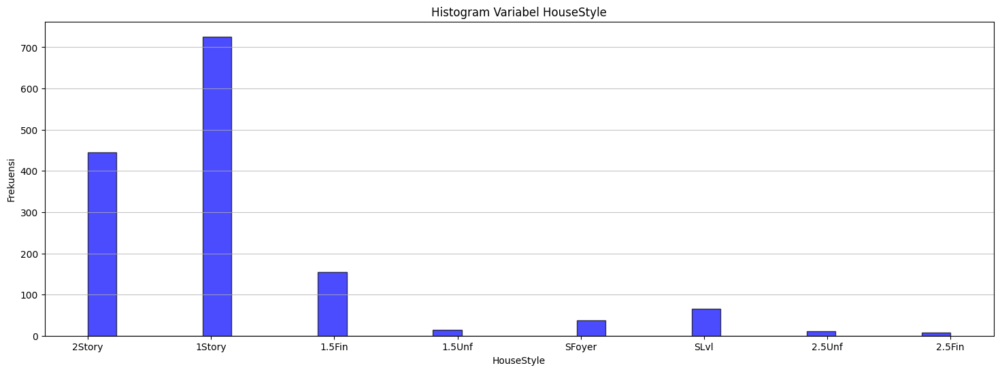

In [ ]:
# Membuat histogram untuk variabel HouseStyle
plt.figure(figsize=(18, 6))
plt.hist(df_train['HouseStyle'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel HouseStyle')
plt.xlabel('HouseStyle')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel HouseStyle by variabel SalePrice

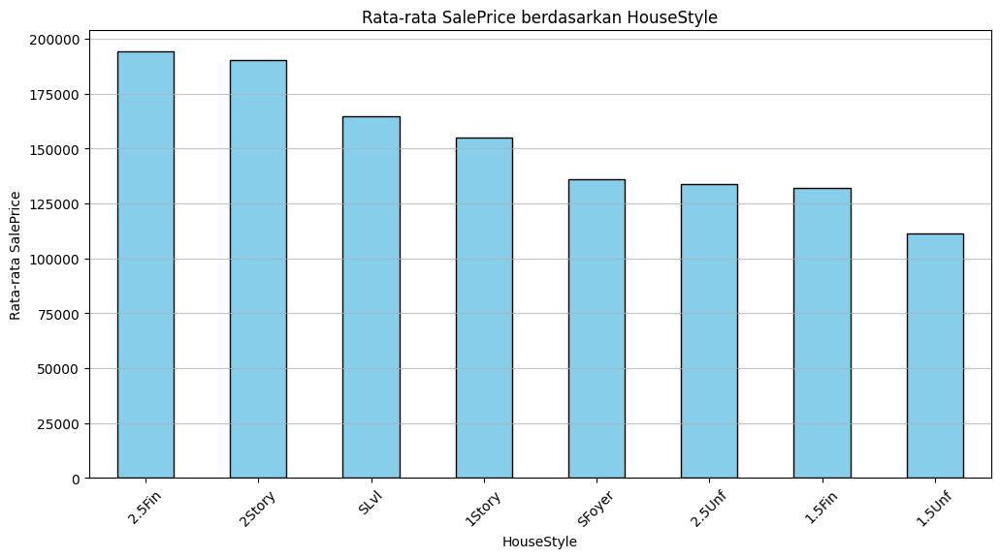

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori HouseStyle
average_saleprice = df_train.groupby('HouseStyle')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan HouseStyle')
plt.xlabel('HouseStyle')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel HouseStyle: 1:1.5Unf ,2:SFoyer ,3:1.5Fin , 4:2.5Unf , 5:SLvl , 6:1Story , 7:2Story , 8:2.5Fin

In [ ]:
    # Fungsi untuk mengkategorikan HouseStyle
    def kategorikan_housestyle(house_style):
        if house_style == '1.5Unf':
            return 1 #'Satu Setengah Lantai: Lantai 2 Belum Selesai'
        elif house_style == '1.5Fin':
            return 2 #'Satu Setengah Lantai: Lantai 2 Selesai'
        elif house_style == '2.5Unf':
            return 3 #'Dua Setengah Lantai: Lantai 2 Belum Selesai'
        elif house_style == 'SFoyer':
            return 4 #'Split Foyer'
        elif house_style == '1Story':
            return 5 #'Satu Lantai'
        elif house_style == 'SLvl':
            return 6 #'Split Level'
        elif house_style == '2Story':
            return 7 #'Dua Lantai'
        elif house_style == '2.5Fin':
            return 8 #'Dua Setengah Lantai: Lantai 2 Selesai'
        else:
            return 0 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom HouseStyle
    df_train['HouseStyle_Cat'] = df_train['HouseStyle'].apply(kategorikan_housestyle)

    # Menampilkan hasil
    print(df_train[['HouseStyle', 'HouseStyle_Cat']].head())


  HouseStyle  HouseStyle_Cat
0     2Story               7
1     1Story               5
2     2Story               7
3     2Story               7
4     2Story               7


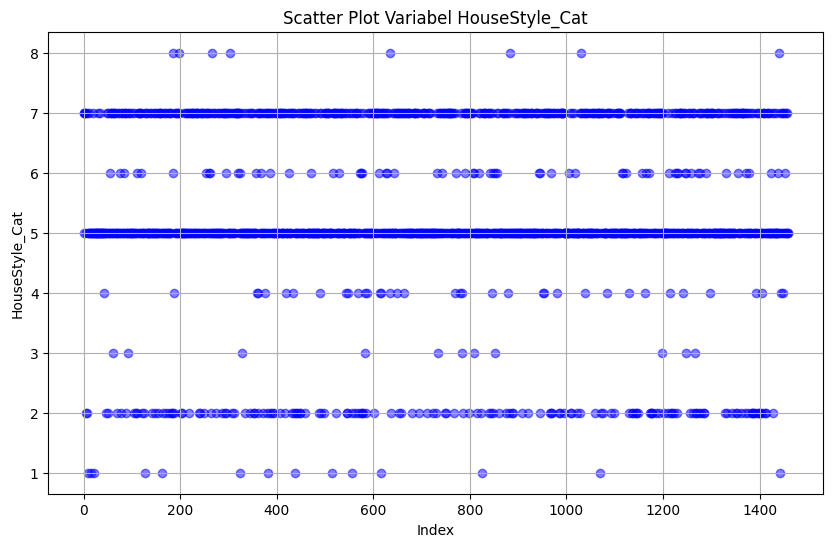

In [ ]:
# Membuat scatter plot untuk variabel HouseStyle_Cat
plt.figure(figsize=(10, 6))
plt.scatter(df_train.index, df_train['HouseStyle_Cat'], color='blue', alpha=0.5)
plt.title('Scatter Plot Variabel HouseStyle_Cat')
plt.xlabel('Index')
plt.ylabel('HouseStyle_Cat')
plt.grid()
plt.show()

In [ ]:
pd.set_option('display.max_columns', None)  # Menampilkan semua kolom

jumlah_HouseStyle_Cat_SalesPrice = df_train.groupby(['HouseStyle_Cat', 'SalePrice']).size().unstack(fill_value=0)
jumlah_HouseStyle_Cat_SalesPrice['Total'] = jumlah_HouseStyle_Cat_SalesPrice.sum(axis=1)
jumlah_HouseStyle_Cat_SalesPrice.sort_values(by='Total', ascending=False, inplace=True)
jumlah_HouseStyle_Cat_SalesPrice

SalePrice,34900,35311,37900,39300,40000,52000,52500,55000,55993,58500,60000,61000,62383,64500,66500,67000,68400,68500,72500,73000,75000,75500,76000,76500,78000,79000,79500,79900,80000,80500,81000,82000,82500,83000,83500,84000,84500,84900,85000,85400,85500,86000,87000,87500,88000,89000,89471,89500,90000,90350,91000,91300,91500,92000,92900,93000,93500,94000,94500,94750,95000,96500,97000,97500,98000,98300,98600,99500,99900,100000,101000,101800,102000,102776,103000,103200,103600,104000,104900,105000,105500,105900,106000,106250,106500,107000,107400,107500,107900,108000,108480,108500,108959,109000,109008,109500,109900,110000,110500,111000,111250,112000,112500,113000,114500,114504,115000,116000,116050,116500,116900,117000,117500,118000,118400,118500,118858,118964,119000,119200,119500,119750,119900,120000,120500,121000,121500,121600,122000,122500,122900,123000,123500,123600,124000,124500,124900,125000,125500,126000,126175,126500,127000,127500,128000,128200,128500,128900,128950,129000,129500,129900,130000,130250,130500,131000,131400,131500,132000,132250,132500,133000,133500,133700,133900,134000,134432,134450,134500,134800,134900,135000,135500,135750,135900,135960,136000,136500,136900,136905,137000,137450,137500,137900,138000,138500,138800,138887,139000,139400,139500,139600,139900,139950,140000,140200,141000,141500,142000,142125,142500,142600,142953,143000,143250,143500,143750,143900,144000,144152,144500,144900,145000,145250,145500,145900,146000,146500,146800,147000,147400,147500,148000,148500,148800,149000,149300,149350,149500,149700,149900,150000,150500,150750,150900,151000,151400,151500,152000,153000,153337,153500,153575,153900,154000,154300,154500,154900,155000,155835,155900,156000,156500,156932,157000,157500,157900,158000,158500,158900,159000,159434,159500,159895,159950,160000,160200,161000,161500,161750,162000,162500,162900,163000,163500,163900,163990,164000,164500,164700,164900,164990,165000,165150,165400,165500,165600,166000,167000,167240,167500,167900,168000,168500,169000,169500,169900,169990,170000,171000,171500,171750,171900,172000,172400,172500,172785,173000,173500,173733,173900,174000,174500,174900,175000,175500,175900,176000,176432,176485,176500,177000,177500,178000,178400,178740,178900,179000,179200,179400,179500,179540,179600,179665,179900,180000,180500,181000,181134,181500,181900,182000,182900,183000,183200,183500,183900,184000,184100,184750,184900,185000,185500,185750,185850,185900,186000,186500,186700,187000,187100,187500,187750,188000,188500,188700,189000,189950,190000,191000,192000,192140,192500,193000,193500,193879,194000,194201,194500,194700,195000,195400,196000,196500,197000,197500,197900,198500,198900,199900,200000,200100,200141,200500,200624,201000,201800,202500,202665,202900,203000,204000,204750,204900,205000,205950,206000,206300,206900,207000,207500,208300,208500,208900,209500,210000,211000,212000,212900,213000,213250,213490,213500,214000,214500,214900,215000,215200,216000,216500,216837,217000,217500,218000,219210,219500,220000,221000,221500,222000,222500,223000,223500,224000,224500,224900,225000,226000,226700,227000,227680,227875,228000,228500,228950,229000,229456,230000,230500,231500,232000,232600,233000,233170,233230,234000,235000,235128,236000,236500,237000,237500,238000,239000,239500,239686,239799,239900,240000,241000,241500,242000,243000,244000,244400,244600,245000,245350,245500,246578,248000,248328,248900,249700,250000,250580,251000,252000,252678,253000,253293,254000,254900,255000,255500,255900,256000,256300,257000,257500,258000,259000,259500,260000,260400,261500,262000,262280,262500,263000,263435,264132,264561,265000,265900,265979,266000,266500,267000,268000,269500,269790,270000,271000,271900,272000,274000,274300,274725,274900,274970,275000,275500,276000,277000,277500,278000,279500,280000,281000,281213,282922,283463,284000,285000,286000,287000,287090,289000,290000,293077,294000,295000,295493,297000,299800,301000,301500,302000,303477,305000,305900,306000,307000,309000,310000,311500,311872,312500,313000

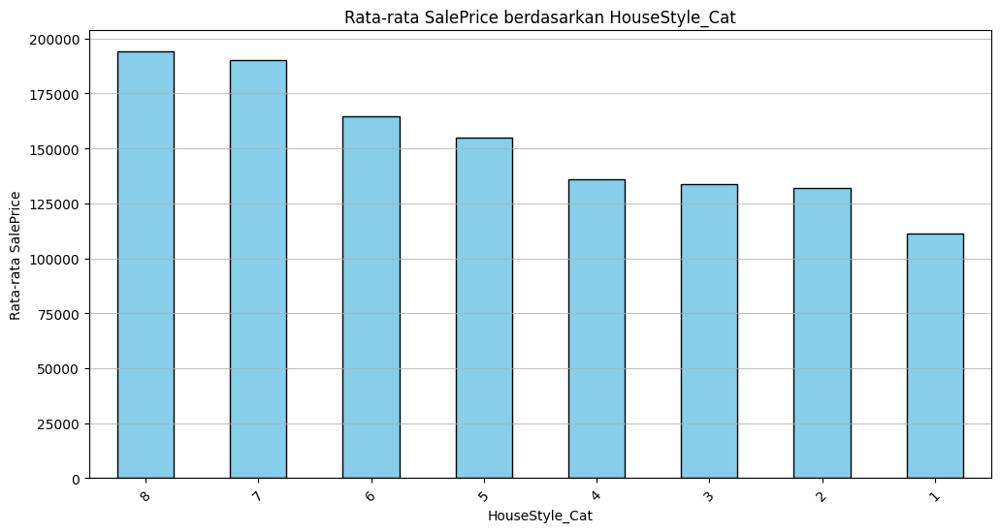

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori HouseStyle_Cat
average_saleprice = df_train.groupby('HouseStyle_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan HouseStyle_Cat')
plt.xlabel('HouseStyle_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **OverallQual**: Rates the overall material and finish of the house

In [ ]:
df_train['OverallQual'].unique()


array([ 7,  6,  8,  5,  9,  4, 10,  3,  1,  2])

In [ ]:
# Menghitung jumlah missing values pada OverallQual
missing_values_count = df_train['OverallQual'].isnull().sum()
print(f'Jumlah missing values pada variabel OverallQual: {missing_values_count}')

Jumlah missing values pada variabel OverallQual: 0


In [ ]:
df_train['OverallQual'].value_counts()

,count
OverallQual,
5,397
6,374
7,319
8,168
4,116
9,43
3,20
10,18
2,3


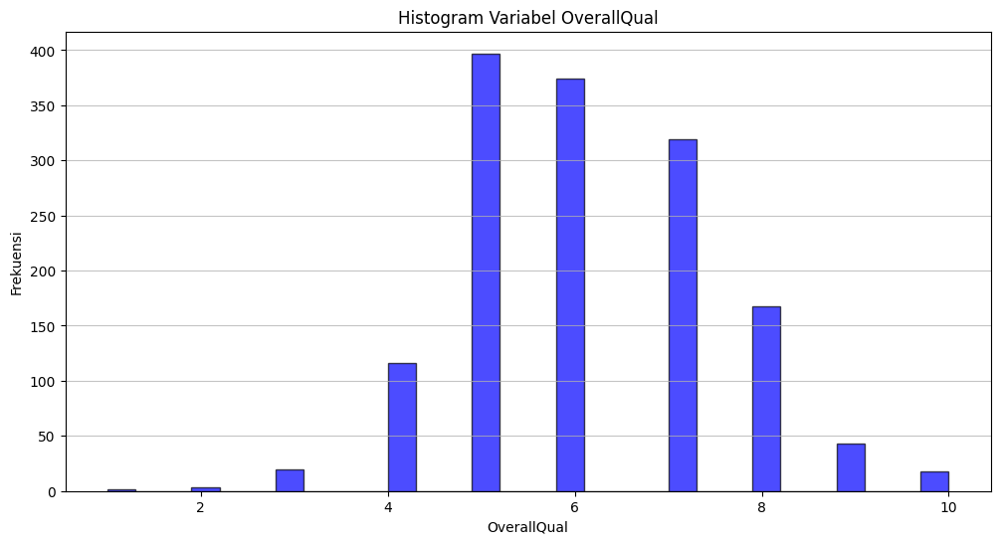

In [ ]:
# Membuat histogram untuk variabel OverallQual
plt.figure(figsize=(12, 6))
plt.hist(df_train['OverallQual'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel OverallQual')
plt.xlabel('OverallQual')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel OverallQual by variabel SalePrice

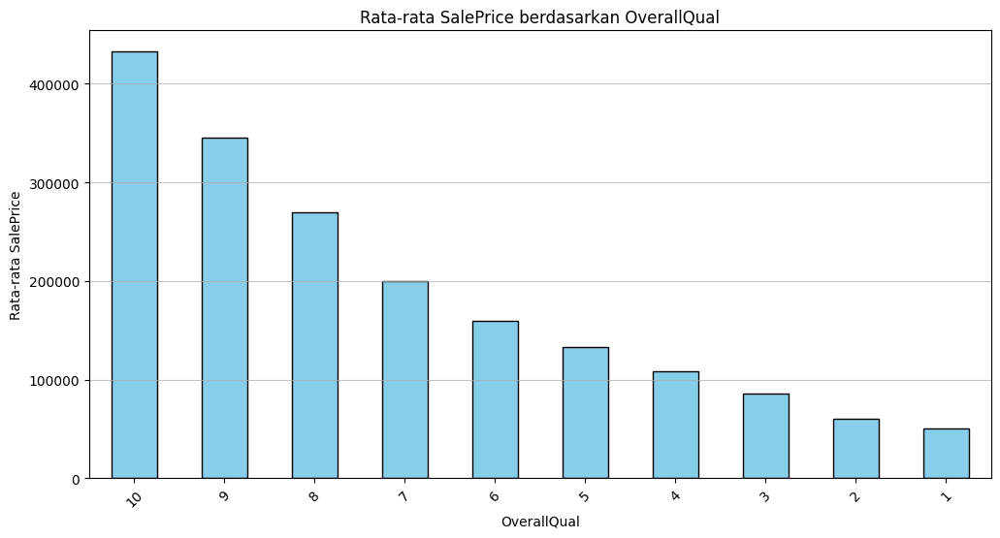

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategoriOverallQual
average_saleprice = df_train.groupby('OverallQual')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan OverallQual')
plt.xlabel('OverallQual')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **OverallCond**: Rates the overall condition of the house

In [ ]:
df_train['OverallCond'].unique()

array([5, 8, 6, 7, 4, 2, 3, 9, 1])

In [ ]:
# Menghitung jumlah missing values pada OverallCond
missing_values_count = df_train['OverallCond'].isnull().sum()
print(f'Jumlah missing values pada variabel OverallCond: {missing_values_count}')

Jumlah missing values pada variabel OverallCond: 0


In [ ]:
df_train['OverallCond'].value_counts()

,count
OverallCond,
5,821
6,252
7,205
8,72
4,57
3,25
9,22
2,5
1,1


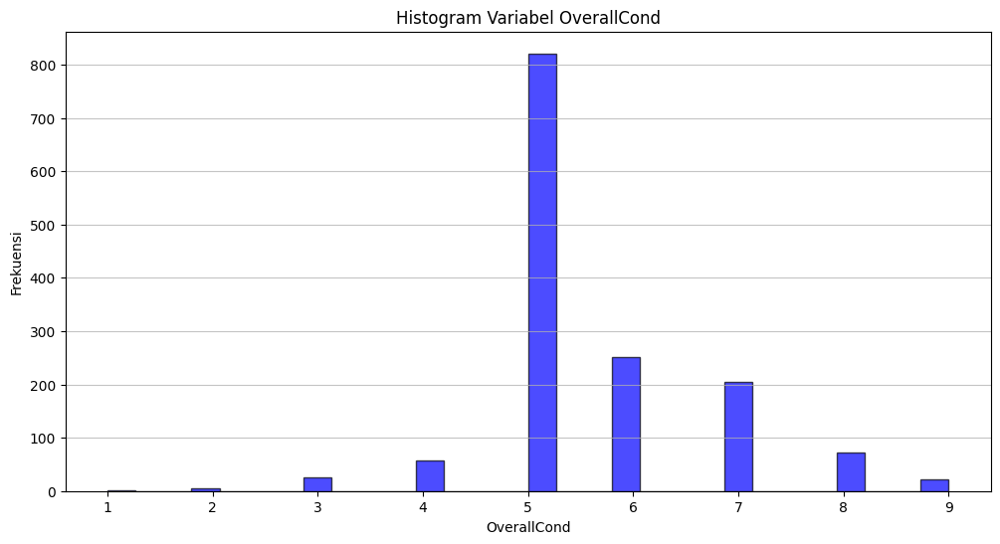

In [ ]:
# Membuat histogram untuk variabel OverallCond
plt.figure(figsize=(12, 6))
plt.hist(df_train['OverallCond'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel OverallCond')
plt.xlabel('OverallCond')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel OverallCond by variabel SalePrice

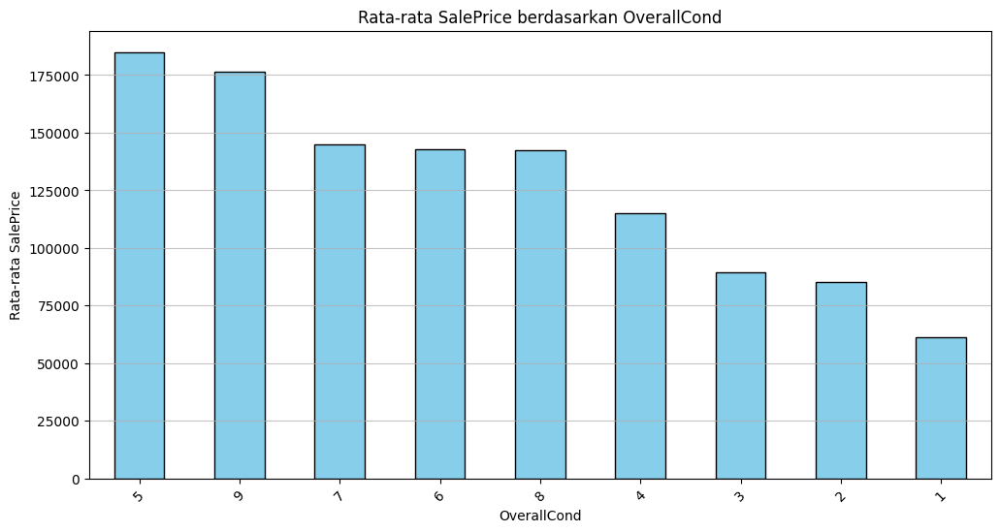

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori OverallCond
average_saleprice = df_train.groupby('OverallCond')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan OverallCond')
plt.xlabel('OverallCond')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **YearBuilt**: Original construction date

In [ ]:
df_train['YearBuilt'].unique()

array([2003, 1976, 2001, 1915, 2000, 1993, 2004, 1973, 1931, 1939, 1965,
       2005, 1962, 2006, 1960, 1929, 1970, 1967, 1958, 1930, 2002, 1968,
       2007, 1951, 1957, 1927, 1920, 1966, 1959, 1994, 1954, 1953, 1955,
       1983, 1975, 1997, 1934, 1963, 1981, 1964, 1999, 1972, 1921, 1945,
       1982, 1998, 1956, 1948, 1910, 1995, 1991, 2009, 1950, 1961, 1977,
       1985, 1979, 1885, 1919, 1990, 1969, 1935, 1988, 1971, 1952, 1936,
       1923, 1924, 1984, 1926, 1940, 1941, 1987, 1986, 2008, 1908, 1892,
       1916, 1932, 1918, 1912, 1947, 1925, 1900, 1980, 1989, 1992, 1949,
       1880, 1928, 1978, 1922, 1996, 2010, 1946, 1913, 1937, 1942, 1938,
       1974, 1893, 1914, 1906, 1890, 1898, 1904, 1882, 1875, 1911, 1917,
       1872, 1905])

In [ ]:
# Menghitung jumlah missing values pada YearBuilt
missing_values_count = df_train['YearBuilt'].isnull().sum()
print(f'Jumlah missing values pada variabel YearBuilt: {missing_values_count}')

Jumlah missing values pada variabel YearBuilt: 0


In [ ]:
df_train['YearBuilt'].value_counts()

,count
YearBuilt,
2006,67
2005,64
2004,54
2007,49
2003,45
...,...
1875,1
1911,1
1917,1


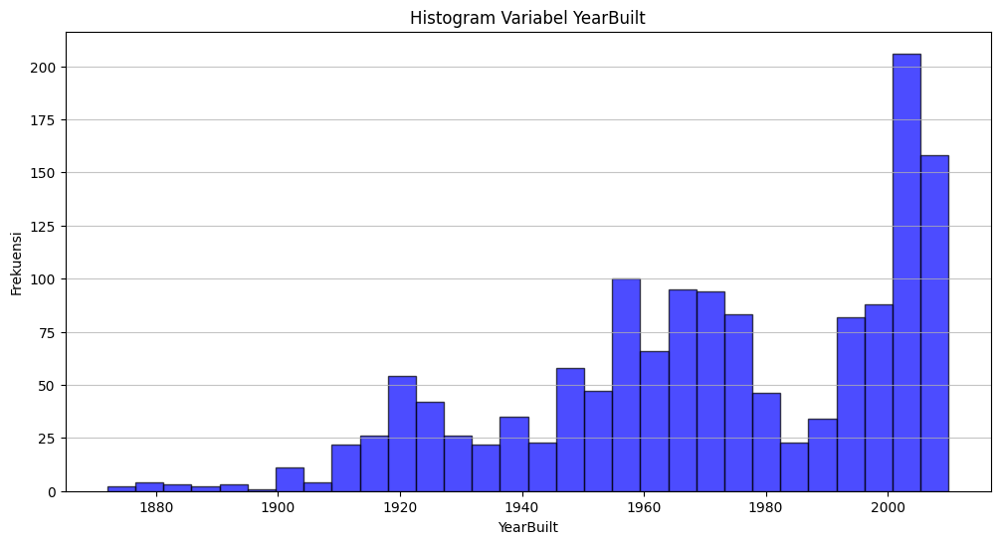

In [ ]:
# Membuat histogram untuk variabel YearBuilt
plt.figure(figsize=(12, 6))
plt.hist(df_train['YearBuilt'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel YearBuilt')
plt.xlabel('YearBuilt')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel YearBuilt by variabel SalePrice

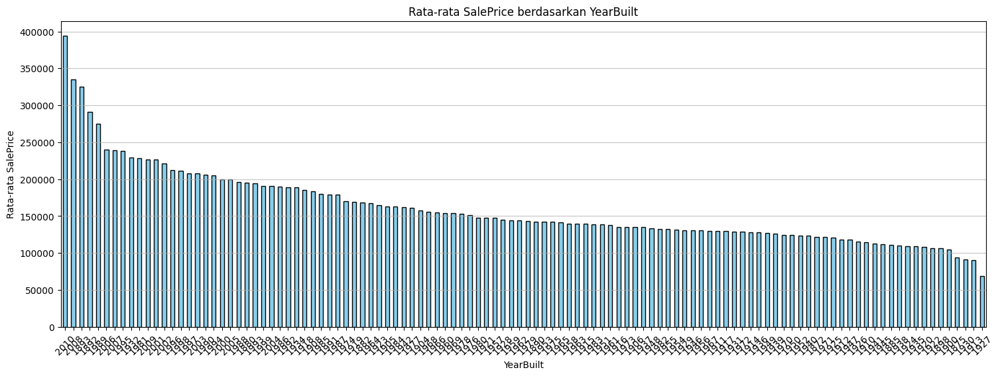

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori YearBuilt
average_saleprice = df_train.groupby('YearBuilt')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(18, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan YearBuilt')
plt.xlabel('YearBuilt')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

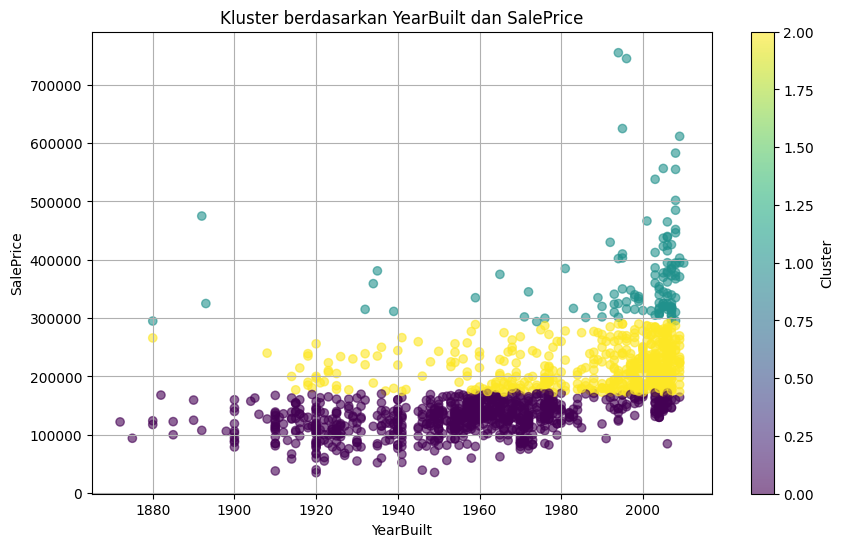

           YearBuilt      SalePrice
Cluster                            
0        1955.619226  129105.011236
1        1995.975000  372625.941667
2        1989.022263  215244.376623


In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Memilih variabel yang akan digunakan untuk klustering
X = df_train[['YearBuilt', 'SalePrice']]

# Menghapus baris dengan nilai yang hilang
X = X.dropna()

# Menggunakan KMeans untuk mengelompokkan data
kmeans = KMeans(n_clusters=3, random_state=0)  # Menggunakan 3 cluster sebagai contoh
X['Cluster'] = kmeans.fit_predict(X)

# Menampilkan hasil klustering
plt.figure(figsize=(10, 6))
plt.scatter(X['YearBuilt'], X['SalePrice'], c=X['Cluster'], cmap='viridis', alpha=0.6)
plt.title('Kluster berdasarkan YearBuilt dan SalePrice')
plt.xlabel('YearBuilt')
plt.ylabel('SalePrice')
plt.colorbar(label='Cluster')
plt.grid()
plt.show()

# Menampilkan informasi cluster
print(X.groupby('Cluster').mean())

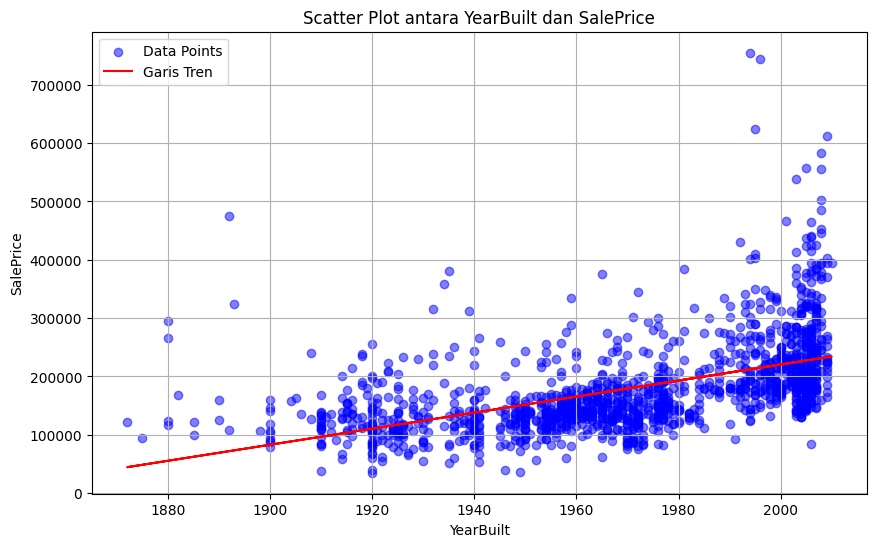

In [ ]:
# menampilkan scatter plot variabelYearBuilt dengan variabel SalePrice dan line plot nya
# Menghapus baris dengan nilai yang hilang pada YearBuilt dan SalePrice
data = df_train.dropna(subset=['YearBuilt', 'SalePrice'])

# Membuat scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(data['YearBuilt'], data['SalePrice'], color='blue', alpha=0.5, label='Data Points')

# Menghitung dan menambahkan garis tren
z = np.polyfit(data['YearBuilt'], data['SalePrice'], 1)
p = np.poly1d(z)
plt.plot(data['YearBuilt'], p(data['YearBuilt']), color='red', label='Garis Tren')

# Menambahkan judul dan label
plt.title('Scatter Plot antara YearBuilt dan SalePrice')
plt.xlabel('YearBuilt')
plt.ylabel('SalePrice')
plt.legend()
plt.grid()
plt.show()

In [ ]:
# Menghitung korelasi antara YearBuilt dan SalePrice
korelasi = df_train['YearBuilt'].corr(df_train['SalePrice'])
print(f'Korelasi antara YearBuilt dan SalePrice: {korelasi}')

Korelasi antara YearBuilt dan SalePrice: 0.5228973328794969


Recode untuk variabel YearBuilt

EDA untuk variabel **YearRemodAdd**: Remodel date (same as construction date if no remodeling or additions)

In [ ]:
df_train['YearRemodAdd'].unique()

array([2003, 1976, 2002, 1970, 2000, 1995, 2005, 1973, 1950, 1965, 2006,
       1962, 2007, 1960, 2001, 1967, 2004, 2008, 1997, 1959, 1990, 1955,
       1983, 1980, 1966, 1963, 1987, 1964, 1972, 1996, 1998, 1989, 1953,
       1956, 1968, 1981, 1992, 2009, 1982, 1961, 1993, 1999, 1985, 1979,
       1977, 1969, 1958, 1991, 1971, 1952, 1975, 2010, 1984, 1986, 1994,
       1988, 1954, 1957, 1951, 1978, 1974])

In [ ]:
# Menghitung jumlah missing values pada YearRemodAdd
missing_values_count = df_train['YearRemodAdd'].isnull().sum()
print(f'Jumlah missing values pada variabel YearRemodAdd: {missing_values_count}')

Jumlah missing values pada variabel YearRemodAdd: 0


In [ ]:
df_train['YearRemodAdd'].value_counts()

,count
YearRemodAdd,
1950,178
2006,97
2007,76
2005,73
2004,62
...,...
2010,6
1983,5
1952,5


In [ ]:
data_sorted =df_train.sort_values(by='YearRemodAdd', ascending=False)
print(data_sorted[['YearRemodAdd']])

      YearRemodAdd
157           2010
819           2010
855           2010
898           2010
378           2010
...            ...
970           1950
21            1950
9             1950
8             1950
1443          1950

[1460 rows x 1 columns]


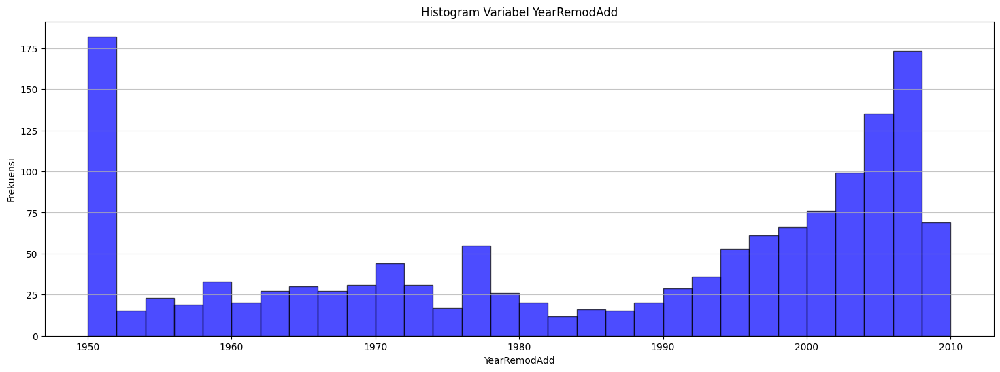

In [ ]:
# Membuat histogram untuk variabel YearRemodAdd
plt.figure(figsize=(18, 6))
plt.hist(df_train['YearRemodAdd'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel YearRemodAdd')
plt.xlabel('YearRemodAdd')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel YearRemodAdd by variabel SalePrice

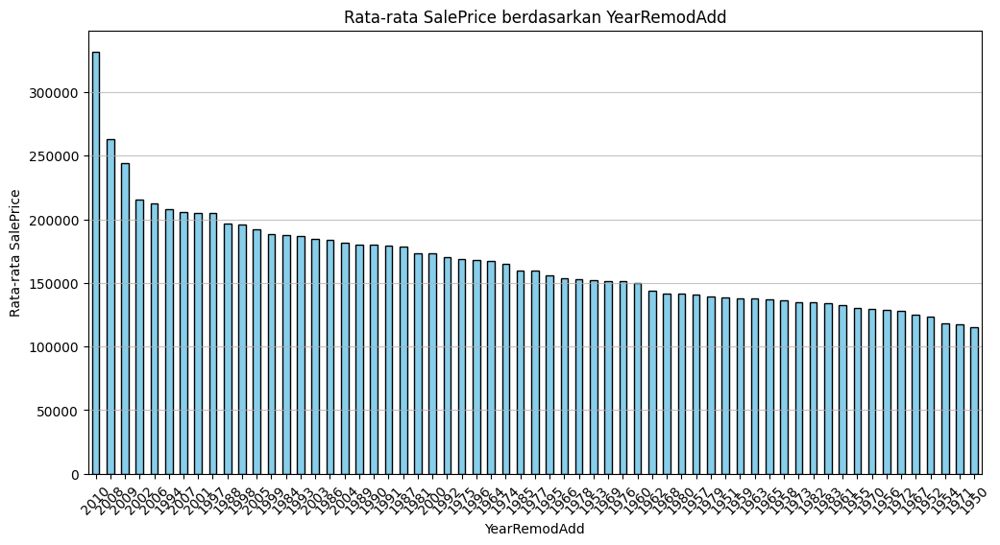

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori YearRemodAdd
average_saleprice = df_train.groupby('YearRemodAdd')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan YearRemodAdd')
plt.xlabel('YearRemodAdd')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

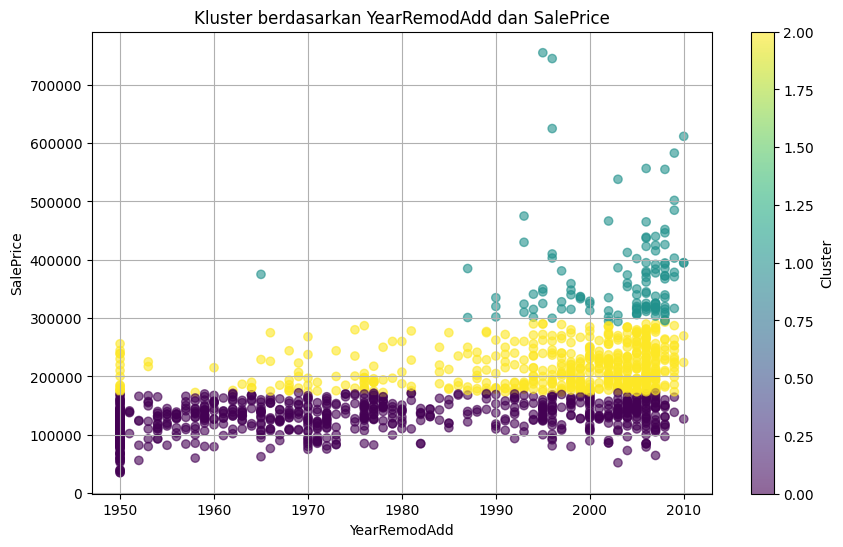

         YearRemodAdd      SalePrice
Cluster                             
0         1974.846442  129105.011236
1         2002.900000  372625.941667
2         1995.740260  215244.376623


In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Memilih variabel yang akan digunakan untuk klustering
X = df_train[['YearRemodAdd', 'SalePrice']]

# Menghapus baris dengan nilai yang hilang
X = X.dropna()

# Menggunakan KMeans untuk mengelompokkan data
kmeans = KMeans(n_clusters=3, random_state=0)  # Menggunakan 3 cluster sebagai contoh
X['Cluster'] = kmeans.fit_predict(X)

# Menampilkan hasil klustering
plt.figure(figsize=(10, 6))
plt.scatter(X['YearRemodAdd'], X['SalePrice'], c=X['Cluster'], cmap='viridis', alpha=0.6)
plt.title('Kluster berdasarkan YearRemodAdd dan SalePrice')
plt.xlabel('YearRemodAdd')
plt.ylabel('SalePrice')
plt.colorbar(label='Cluster')
plt.grid()
plt.show()

# Menampilkan informasi cluster
print(X.groupby('Cluster').mean())

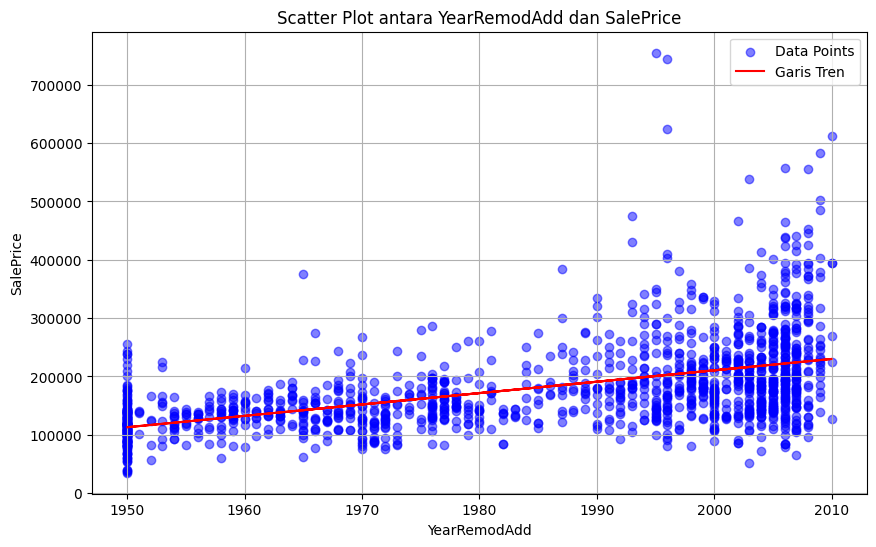

In [ ]:
# menampilkan scatter plot variabelYearRemodAdd dengan variabel SalePrice dan line plot nya
# Menghapus baris dengan nilai yang hilang pada YearRemodAdd dan SalePrice
data = df_train.dropna(subset=['YearRemodAdd', 'SalePrice'])

# Membuat scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(data['YearRemodAdd'], data['SalePrice'], color='blue', alpha=0.5, label='Data Points')

# Menghitung dan menambahkan garis tren
z = np.polyfit(data['YearRemodAdd'], data['SalePrice'], 1)
p = np.poly1d(z)
plt.plot(data['YearRemodAdd'], p(data['YearRemodAdd']), color='red', label='Garis Tren')

# Menambahkan judul dan label
plt.title('Scatter Plot antara YearRemodAdd dan SalePrice')
plt.xlabel('YearRemodAdd')
plt.ylabel('SalePrice')
plt.legend()
plt.grid()
plt.show()

In [ ]:
# Menghitung korelasi antara YearRemodAdd dan SalePrice
korelasi = df_train['YearRemodAdd'].corr(df_train['SalePrice'])
print(f'Korelasi antara YearRemodAdd dan SalePrice: {korelasi}')

Korelasi antara YearRemodAdd dan SalePrice: 0.5071009671113865


Recode untuk variabel YearRemodAdd

EDA untuk variabel **RoofStyle**: Type of roof

In [ ]:
df_train['RoofStyle'].unique()

array(['Gable', 'Hip', 'Gambrel', 'Mansard', 'Flat', 'Shed'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada RoofStyle
missing_values_count = df_train['RoofStyle'].isnull().sum()
print(f'Jumlah missing values pada variabel RoofStyle: {missing_values_count}')

Jumlah missing values pada variabel RoofStyle: 0


In [ ]:
df_train['RoofStyle'].value_counts()

,count
RoofStyle,
Gable,1141
Hip,286
Flat,13
Gambrel,11
Mansard,7
Shed,2


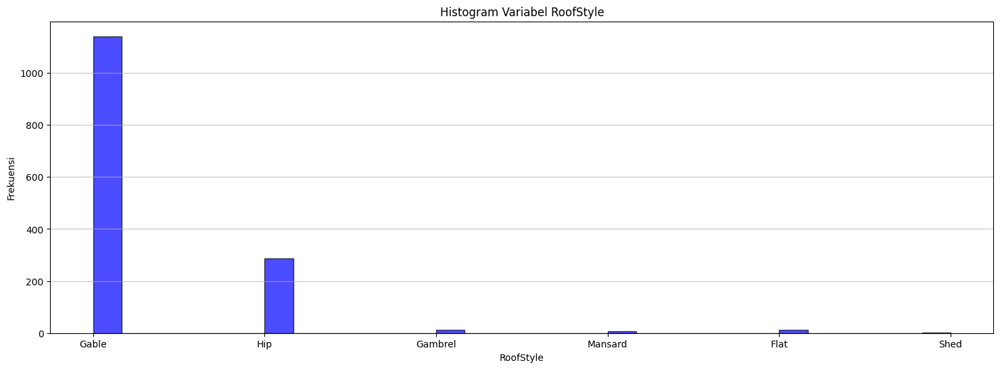

In [ ]:
# Membuat histogram untuk variabel RoofStyle
plt.figure(figsize=(18, 6))
plt.hist(df_train['RoofStyle'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel RoofStyle')
plt.xlabel('RoofStyle')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

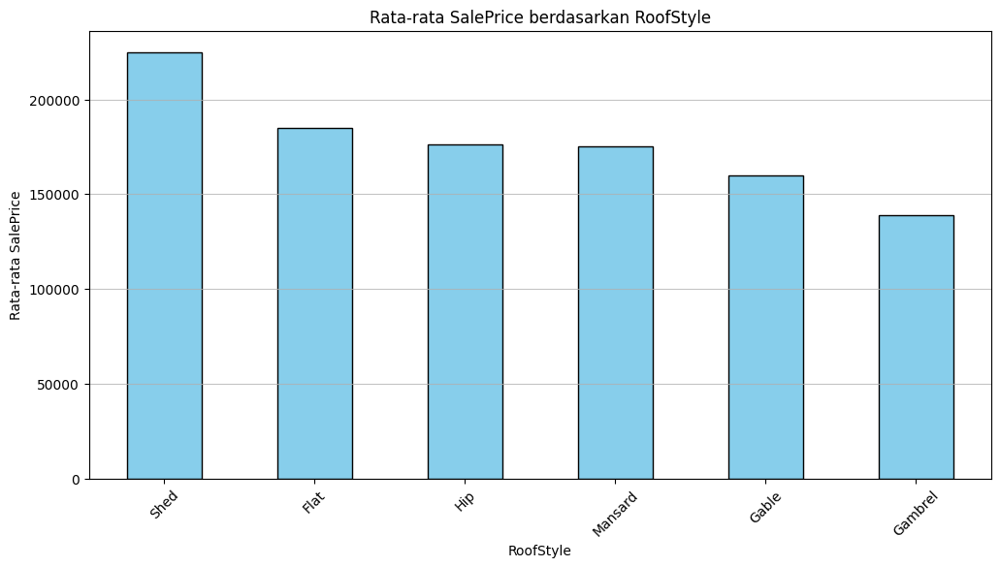

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori RoofStyle
average_saleprice = df_train.groupby('RoofStyle')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan RoofStyle')
plt.xlabel('RoofStyle')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel RoofStyle: 1:Gambrel ,2:Gable ,3:Mansard , 4:Hip , 5:Flat , 6:Shed

In [ ]:
    # Fungsi untuk mengkategorikan RoofStyle
    def kategorikan_RoofStyle(RoofStyle_style):
        if RoofStyle_style == 'Gambrel':
            return 1
        elif RoofStyle_style == 'Gable':
            return 2
        elif RoofStyle_style == 'Mansard':
            return 3
        elif RoofStyle_style == 'Hip':
            return 4
        elif RoofStyle_style == 'Flat':
            return 5
        elif RoofStyle_style == 'Shed':
            return 6
        else:
            return 0

    # Menerapkan fungsi ke kolom HouseStyle
    df_train['RoofStyle_Cat'] = df_train['RoofStyle'].apply(kategorikan_RoofStyle)

    # Menampilkan hasil
    print(df_train[['RoofStyle', 'RoofStyle_Cat']].head())



  RoofStyle  RoofStyle_Cat
0     Gable              2
1     Gable              2
2     Gable              2
3     Gable              2
4     Gable              2


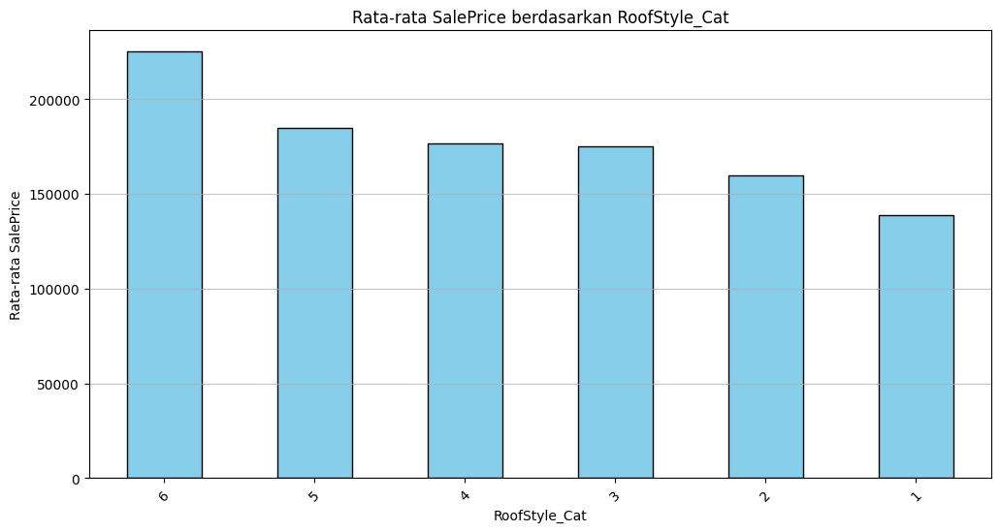

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori RoofStyle_Cat
average_saleprice = df_train.groupby('RoofStyle_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan RoofStyle_Cat')
plt.xlabel('RoofStyle_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **RoofMatl**: Roof material

In [ ]:
df_train['RoofMatl'].unique()

array(['CompShg', 'WdShngl', 'Metal', 'WdShake', 'Membran', 'Tar&Grv',
       'Roll', 'ClyTile'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada RoofMatl
missing_values_count = df_train['RoofMatl'].isnull().sum()
print(f'Jumlah missing values pada variabel RoofMatl: {missing_values_count}')

Jumlah missing values pada variabel RoofMatl: 0


In [ ]:
df_train['RoofMatl'].value_counts()

,count
RoofMatl,
CompShg,1434
Tar&Grv,11
WdShngl,6
WdShake,5
Metal,1
Membran,1
Roll,1
ClyTile,1


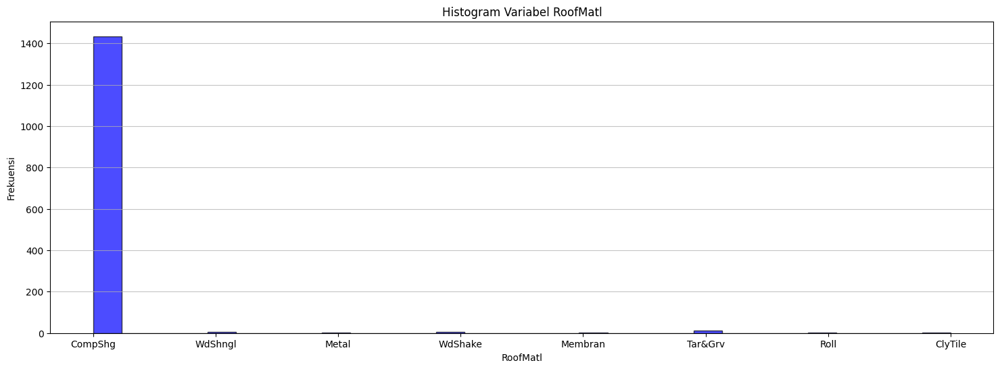

In [ ]:
# Membuat histogram untuk variabel RoofMatl
plt.figure(figsize=(18, 6))
plt.hist(df_train['RoofMatl'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel RoofMatl')
plt.xlabel('RoofMatl')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel RoofMatl by variabel SalePrice

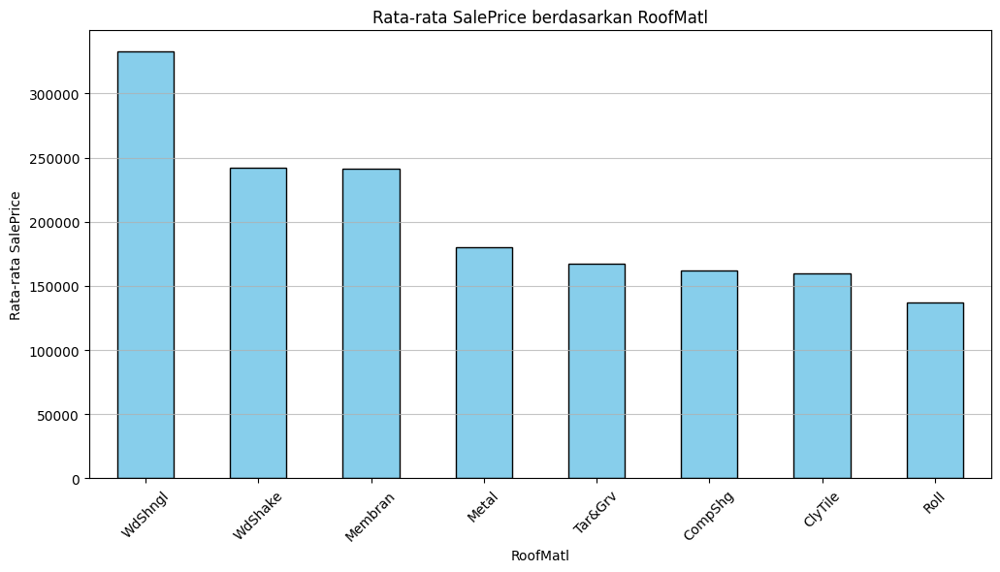

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori RoofMatl
average_saleprice = df_train.groupby('RoofMatl')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan RoofMatl')
plt.xlabel('RoofMatl')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel RoofMatl:  1:Roll, 2:ClyTile, 3: CompShg, 4: Tar&Grv, 5:Metal ,6:Membran ,7:WdShake , 8:WdShngl

In [ ]:
    # Fungsi untuk mengkategorikan RoofMatl
    def kategorikan_RoofMatl(RoofMatl):
        if RoofMatl == 'Roll':
            return 1
        elif RoofMatl == 'ClyTile':
            return 2
        elif RoofMatl == 'CompShg':
            return 3
        elif RoofMatl == 'Tar&Grv':
            return 4
        elif RoofMatl == 'Metal':
            return 5
        elif RoofMatl == 'Membran':
            return 6
        elif RoofMatl == 'WdShake':
            return 7
        elif RoofMatl == 'WdShngl':
            return 8
        else:
            return 0 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom Condition2
    df_train['RoofMatl_Cat'] = df_train['RoofMatl'].apply(kategorikan_RoofMatl)

    # Menampilkan hasil
    print(df_train[['RoofMatl', 'RoofMatl_Cat']].head())

  RoofMatl  RoofMatl_Cat
0  CompShg             3
1  CompShg             3
2  CompShg             3
3  CompShg             3
4  CompShg             3


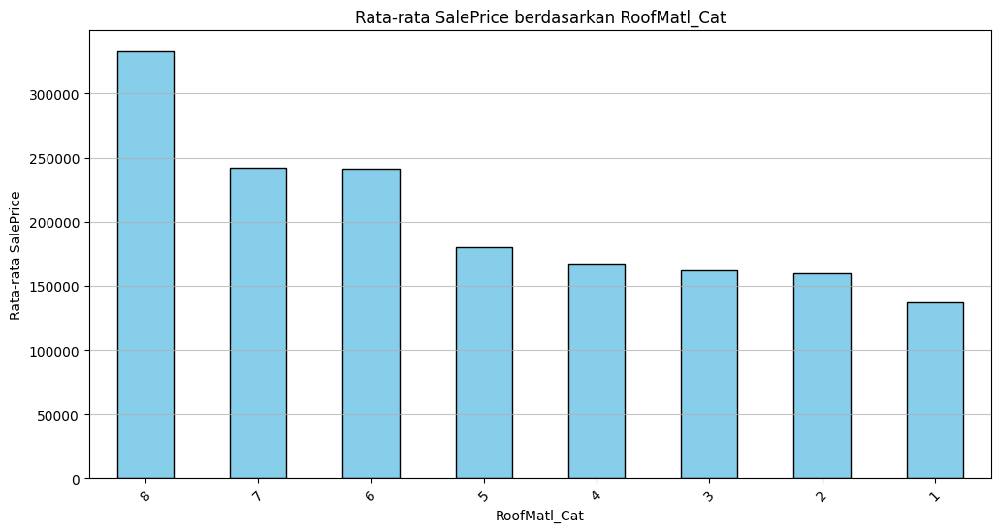

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori RoofMatl_Cat
average_saleprice = df_train.groupby('RoofMatl_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan RoofMatl_Cat')
plt.xlabel('RoofMatl_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **Exterior1st**: Exterior covering on house

In [ ]:
df_train['Exterior1st'].unique()

array(['VinylSd', 'MetalSd', 'Wd Sdng', 'HdBoard', 'BrkFace', 'WdShing',
       'CemntBd', 'Plywood', 'AsbShng', 'Stucco', 'BrkComm', 'AsphShn',
       'Stone', 'ImStucc', 'CBlock'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada Exterior1st
missing_values_count = df_train['Exterior1st'].isnull().sum()
print(f'Jumlah missing values pada variabel Exterior1st: {missing_values_count}')

Jumlah missing values pada variabel Exterior1st: 0


In [ ]:
df_train['Exterior1st'].value_counts()

,count
Exterior1st,
VinylSd,515
HdBoard,222
MetalSd,220
Wd Sdng,206
Plywood,108
CemntBd,61
BrkFace,50
WdShing,26
Stucco,25


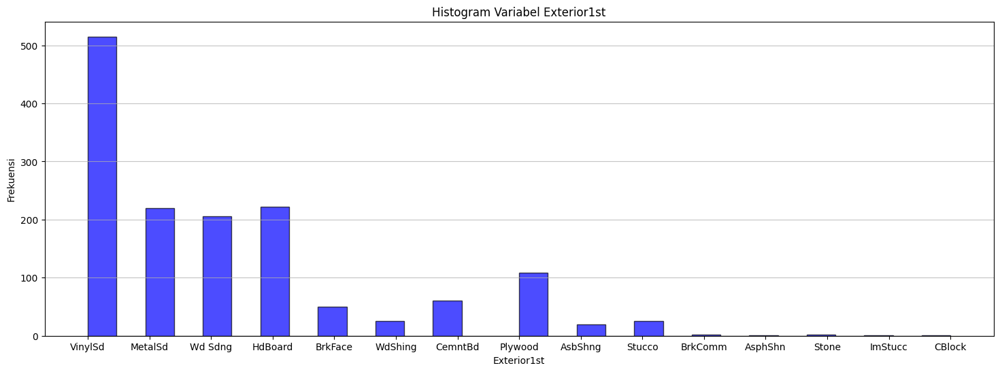

In [ ]:
# Membuat histogram untuk variabel Exterior1st
plt.figure(figsize=(18, 6))
plt.hist(df_train['Exterior1st'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel Exterior1st')
plt.xlabel('Exterior1st')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel Exterior1st by variabel SalePrice

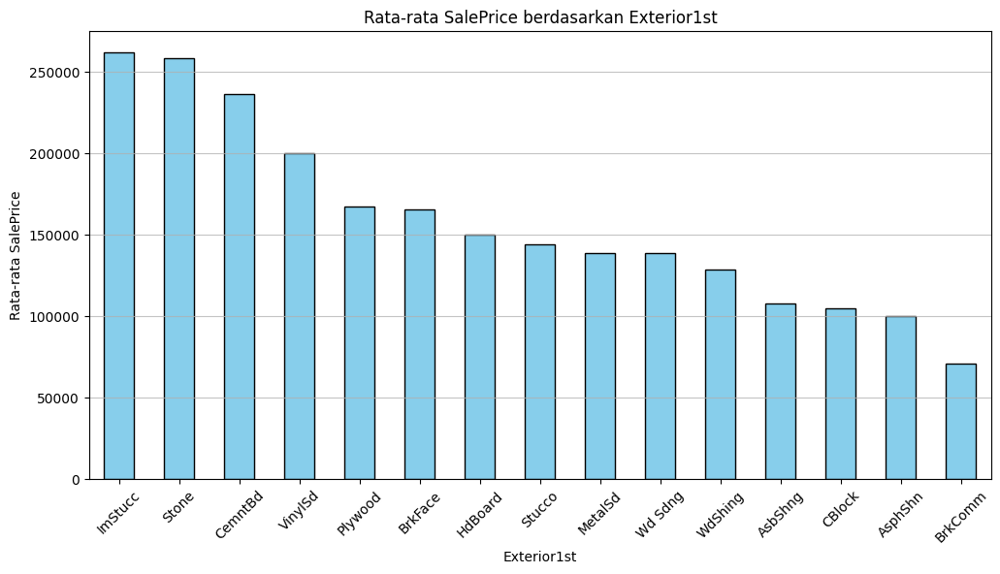

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Exterior1st
average_saleprice = df_train.groupby('Exterior1st')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Exterior1st')
plt.xlabel('Exterior1st')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel Exterior1st:  1:BrkComm, 2:AsphShn, 3:CBlock, 4:AsbShng, 5:WdShing ,6:Wd Sdng ,7:MetalSd , 8:Stucco, 9:HdBoard , 10:BrkFace, 11:Plywood, 12:VinylSd, 13:CemntBd, 14:Stone, 15:ImStucc

VinylSd	515
HdBoard	222
MetalSd	220
Wd Sdng	206
Plywood	108
CemntBd	61
BrkFace	50
WdShing	26
Stucco	25
AsbShng	20
BrkComm	2
Stone	2
AsphShn	1
ImStucc	1
CBlock	1

In [ ]:
    # Fungsi untuk mengkategorikan Exterior1st
    def kategorikan_Exterior1st(Exterior1st):
        if Exterior1st == 'BrkComm':
            return 1
        elif Exterior1st == 'AsphShn':
            return 2
        elif Exterior1st == 'CBlock':
            return 3
        elif Exterior1st == 'AsbShng':
            return 4
        elif Exterior1st == 'WdShing':
            return 5
        elif Exterior1st == 'Wd Sdng':
            return 6
        elif Exterior1st == 'MetalSd':
            return 7
        elif Exterior1st == 'Stucco':
            return 8
        elif Exterior1st == 'HdBoard':
            return 9
        elif Exterior1st == 'BrkFace':
            return 10
        elif Exterior1st == 'Plywood':
            return 11
        elif Exterior1st == 'VinylSd':
            return 12
        elif Exterior1st == 'CemntBd':
            return 13
        elif Exterior1st == 'Stone':
            return 14
        elif Exterior1st == 'ImStucc':
            return 15
        else:
            return 0 #'Tidak Diketahui'
    # Menerapkan fungsi ke kolom Condition2
    df_train['Exterior1st_Cat'] = df_train['Exterior1st'].apply(kategorikan_Exterior1st)

    # Menampilkan hasil
    print(df_train[['Exterior1st', 'Exterior1st_Cat']].head())

  Exterior1st  Exterior1st_Cat
0     VinylSd               12
1     MetalSd                7
2     VinylSd               12
3     Wd Sdng                6
4     VinylSd               12


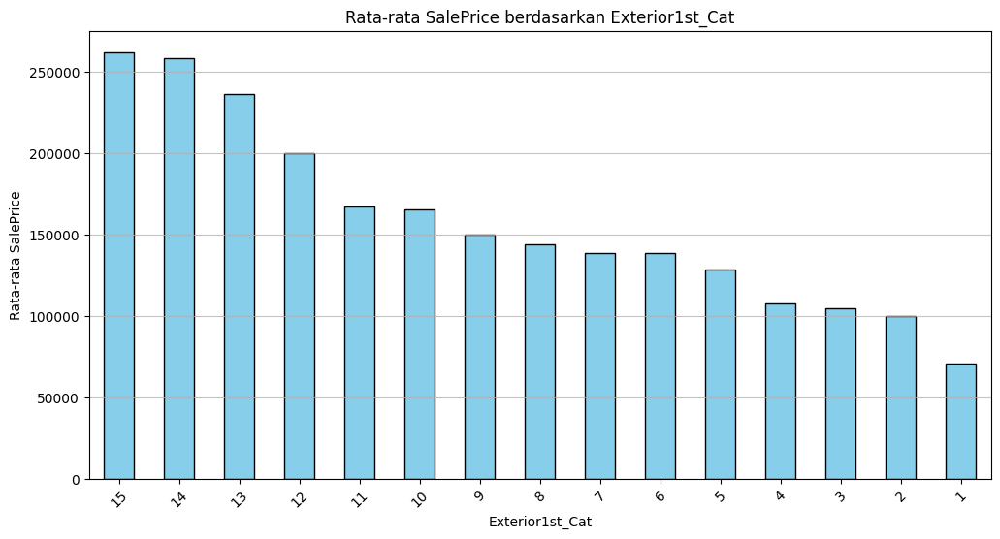

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Exterior1st_Cat
average_saleprice = df_train.groupby('Exterior1st_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Exterior1st_Cat')
plt.xlabel('Exterior1st_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **Exterior2nd**: Exterior covering on house (if more than one material)

In [ ]:
df_train['Exterior2nd'].unique()

array(['VinylSd', 'MetalSd', 'Wd Shng', 'HdBoard', 'Plywood', 'Wd Sdng',
       'CmentBd', 'BrkFace', 'Stucco', 'AsbShng', 'Brk Cmn', 'ImStucc',
       'AsphShn', 'Stone', 'Other', 'CBlock'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada Exterior2nd
missing_values_count = df_train['Exterior2nd'].isnull().sum()
print(f'Jumlah missing values pada variabel Exterior2nd: {missing_values_count}')

Jumlah missing values pada variabel Exterior2nd: 0


In [ ]:
df_train['Exterior2nd'].value_counts()

,count
Exterior2nd,
VinylSd,504
MetalSd,214
HdBoard,207
Wd Sdng,197
Plywood,142
CmentBd,60
Wd Shng,38
Stucco,26
BrkFace,25


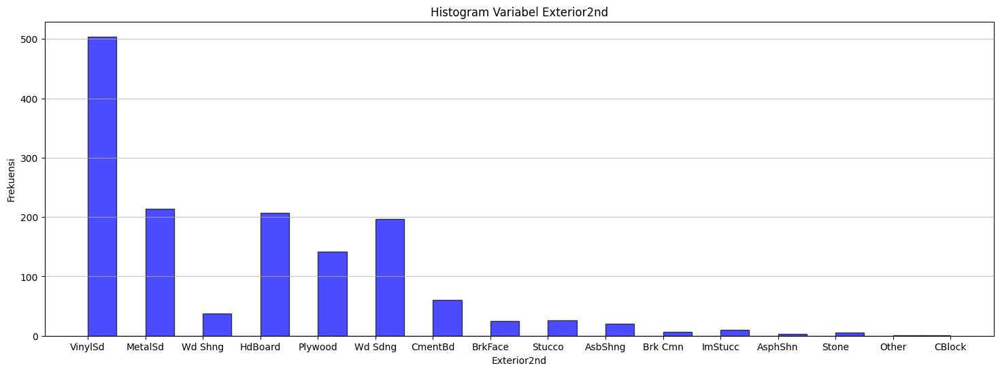

In [ ]:
# Membuat histogram untuk variabel Exterior2nd
plt.figure(figsize=(18, 6))
plt.hist(df_train['Exterior2nd'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel Exterior2nd')
plt.xlabel('Exterior2nd')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel Exterior2nd by variabel SalePrice

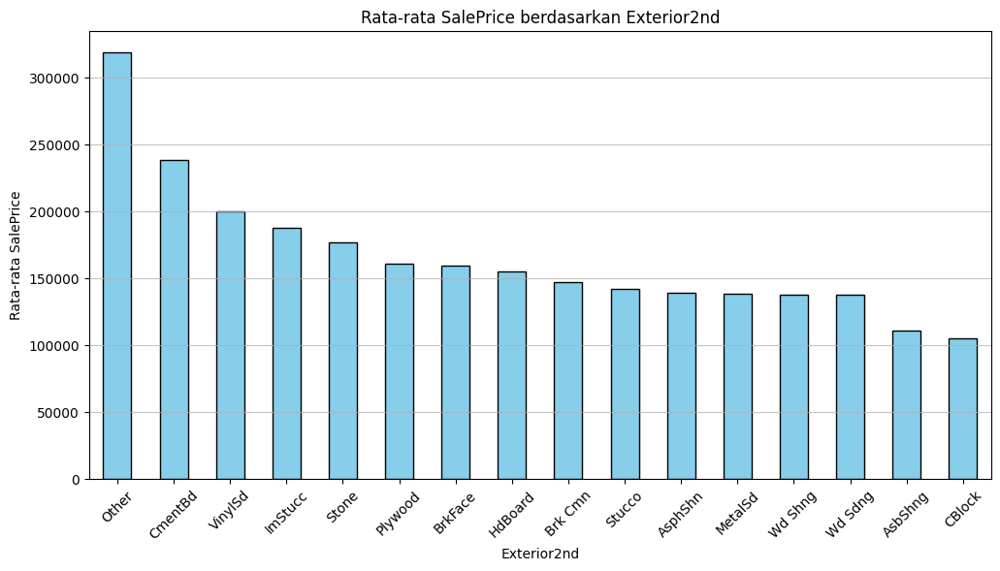

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Exterior2nd
average_saleprice = df_train.groupby('Exterior2nd')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Exterior2nd')
plt.xlabel('Exterior2nd')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel Exterior2nd:  1:CBlock, 2:AsbShng, 3:Wd Sdng, 4:Wd Shng, 5:MetalSd ,6:AsphShn ,7:Stucco, 8:Brk Cmn, 9:HdBoard, 10:BrkFace, 11:Plywood, 12:Stone, 13:ImStucc, 14:VinylSd, 15:CmentBd, 16:Other

In [ ]:
    # Fungsi untuk mengkategorikan Exterior2nd
    def kategorikan_Exterior2nd(Exterior2nd):
        if Exterior2nd == 'CBlock':
            return 1
        elif Exterior2nd == 'AsbShng':
            return 2
        elif Exterior2nd == 'Wd Sdng':
            return 3
        elif Exterior2nd == 'Wd Shng':
            return 4
        elif Exterior2nd == 'MetalSd':
            return 5
        elif Exterior2nd == 'AsphShn':
            return 6
        elif Exterior2nd == 'Stucco':
            return 7
        elif Exterior2nd == 'Brk Cmn':
            return 8
        elif Exterior2nd == 'HdBoard':
            return 9
        elif Exterior2nd == 'BrkFace':
            return 10
        elif Exterior2nd == 'Plywood':
            return 11
        elif Exterior2nd == 'Stone':
            return 12
        elif Exterior2nd == 'ImStucc':
            return 13
        elif Exterior2nd == 'VinylSd':
            return 14
        elif Exterior2nd == 'CmentBd':
            return 15
        elif Exterior2nd == 'Other':
            return 16
        else:
            return 0 #'Tidak Diketahui'
    # Menerapkan fungsi ke kolom Exterior2nd
    df_train['Exterior2nd_Cat'] = df_train['Exterior2nd'].apply(kategorikan_Exterior2nd)

    # Menampilkan hasil
    print(df_train[['Exterior2nd', 'Exterior2nd_Cat']].head())

  Exterior2nd  Exterior2nd_Cat
0     VinylSd               14
1     MetalSd                5
2     VinylSd               14
3     Wd Shng                4
4     VinylSd               14


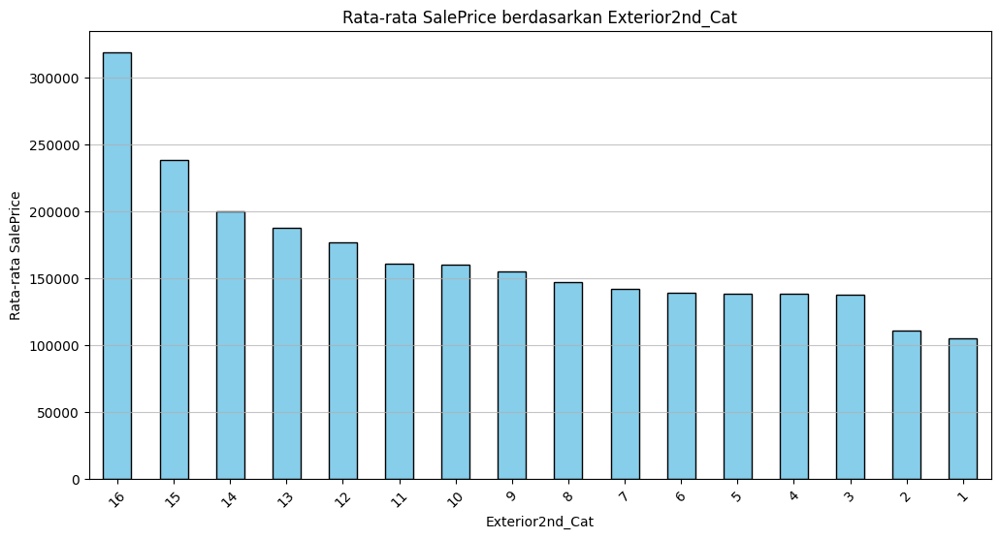

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Exterior2nd_Cat
average_saleprice = df_train.groupby('Exterior2nd_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Exterior2nd_Cat')
plt.xlabel('Exterior2nd_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **MasVnrType**: Masonry veneer type >> merujuk pada jenis bahan yang digunakan sebagai lapisan luar pada struktur bangunan. Veneer masonry adalah lapisan tipis dari bahan bangunan seperti batu, bata, atau beton yang dipasang di atas struktur utama, biasanya untuk tujuan estetika dan perlindungan.


In [ ]:
df_train['MasVnrType'].unique()

array(['BrkFace', nan, 'Stone', 'BrkCmn'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada MasVnrType
missing_values_count = df_train['MasVnrType'].isnull().sum()
print(f'Jumlah missing values pada variabel MasVnrType: {missing_values_count}')

Jumlah missing values pada variabel MasVnrType: 872


In [ ]:
df_train['MasVnrType'].value_counts()

,count
MasVnrType,
BrkFace,445
Stone,128
BrkCmn,15


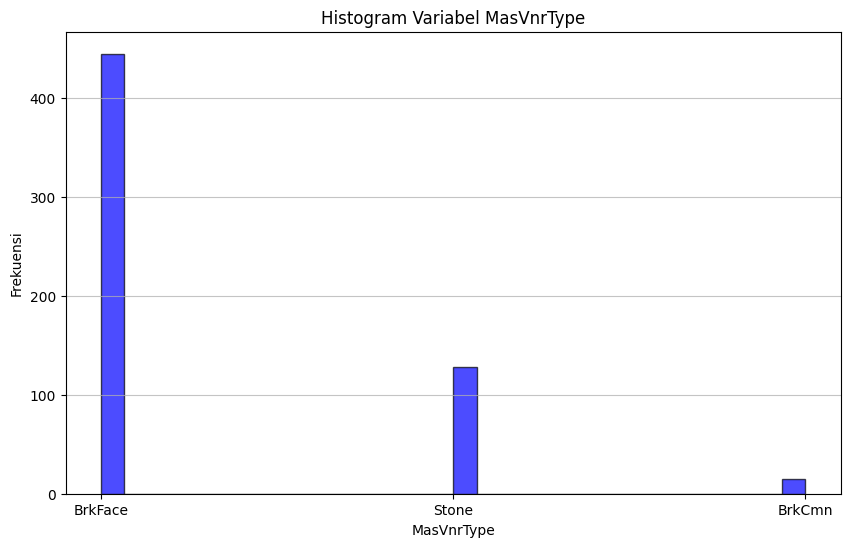

In [ ]:
# Membuat histogram untuk variabel MasVnrType
plt.figure(figsize=(10, 6))
plt.hist(df_train['MasVnrType'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel MasVnrType')
plt.xlabel('MasVnrType')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel MasVnrType by variabel SalePrice

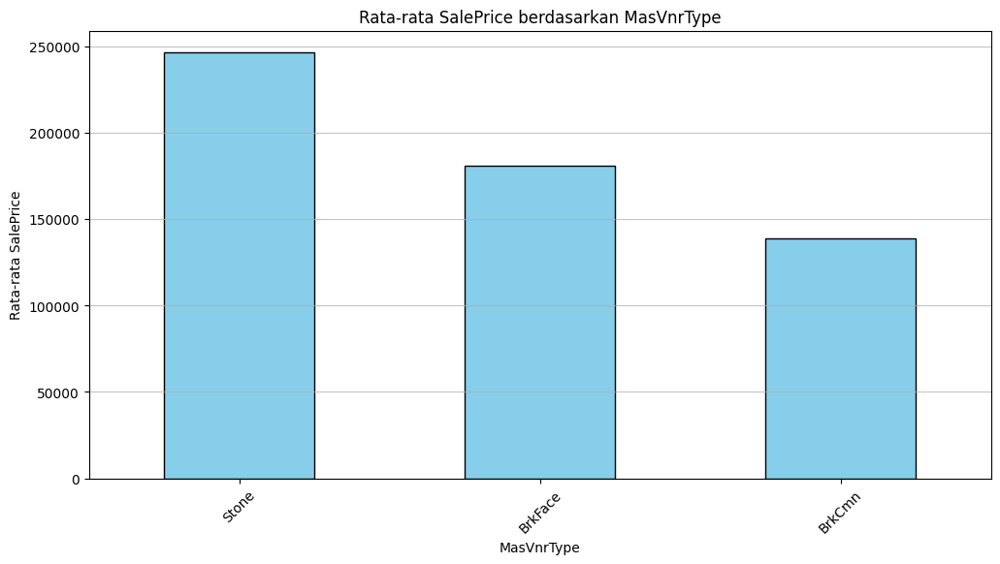

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori MasVnrType
average_saleprice = df_train.groupby('MasVnrType')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan MasVnrType')
plt.xlabel('MasVnrType')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel MasVnrType: 1:BrkCmn, 2:Nan, 3:BrkFace, 4:Stone,

In [ ]:
    # Fungsi untuk mengkategorikan MasVnrType
    def kategorikan_MasVnrType(MasVnrType):
        if MasVnrType == 'BrkCmn':
            return 1
        elif MasVnrType == 'BrkFace':
            return 3
        elif MasVnrType == 'Stone':
            return 4
        else:
            return 2 #'Tidak Diketahui'
    # Menerapkan fungsi ke kolom MasVnrType
    df_train['MasVnrType_Cat'] = df_train['MasVnrType'].apply(kategorikan_MasVnrType)

    # Menampilkan hasil
    print(df_train[['MasVnrType', 'MasVnrType_Cat']].head())

  MasVnrType  MasVnrType_Cat
0    BrkFace               3
1        NaN               2
2    BrkFace               3
3        NaN               2
4    BrkFace               3


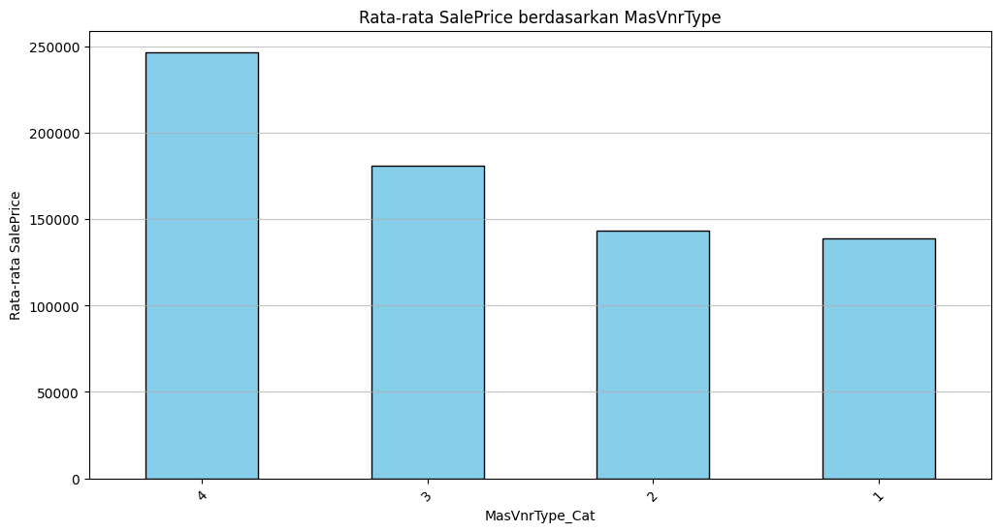

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori MasVnrType
average_saleprice = df_train.groupby('MasVnrType_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan MasVnrType')
plt.xlabel('MasVnrType_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **MasVnrArea**: Masonry veneer area in square feet >> MasVnrArea merujuk pada luas area veneer masonry yang digunakan dalam suatu bangunan, diukur dalam satuan kaki persegi (square feet). Ini adalah ukuran yang menunjukkan seberapa banyak bahan veneer masonry, seperti batu atau bata, yang diterapkan pada permukaan bangunan.


In [ ]:
df_train['MasVnrArea'].unique()

array([1.960e+02, 0.000e+00, 1.620e+02, 3.500e+02, 1.860e+02, 2.400e+02,
       2.860e+02, 3.060e+02, 2.120e+02, 1.800e+02, 3.800e+02, 2.810e+02,
       6.400e+02, 2.000e+02, 2.460e+02, 1.320e+02, 6.500e+02, 1.010e+02,
       4.120e+02, 2.720e+02, 4.560e+02, 1.031e+03, 1.780e+02, 5.730e+02,
       3.440e+02, 2.870e+02, 1.670e+02, 1.115e+03, 4.000e+01, 1.040e+02,
       5.760e+02, 4.430e+02, 4.680e+02, 6.600e+01, 2.200e+01, 2.840e+02,
       7.600e+01, 2.030e+02, 6.800e+01, 1.830e+02, 4.800e+01, 2.800e+01,
       3.360e+02, 6.000e+02, 7.680e+02, 4.800e+02, 2.200e+02, 1.840e+02,
       1.129e+03, 1.160e+02, 1.350e+02, 2.660e+02, 8.500e+01, 3.090e+02,
       1.360e+02, 2.880e+02, 7.000e+01, 3.200e+02, 5.000e+01, 1.200e+02,
       4.360e+02, 2.520e+02, 8.400e+01, 6.640e+02, 2.260e+02, 3.000e+02,
       6.530e+02, 1.120e+02, 4.910e+02, 2.680e+02, 7.480e+02, 9.800e+01,
       2.750e+02, 1.380e+02, 2.050e+02, 2.620e+02, 1.280e+02, 2.600e+02,
       1.530e+02, 6.400e+01, 3.120e+02, 1.600e+01, 

In [ ]:
# Menghitung jumlah missing values pada MasVnrArea
missing_values_count = df_train['MasVnrArea'].isnull().sum()
print(f'Jumlah missing values pada variabel MasVnrArea: {missing_values_count}')

Jumlah missing values pada variabel MasVnrArea: 8


In [ ]:
df_train['MasVnrArea'].value_counts()

,count
MasVnrArea,
0.0,861
108.0,8
72.0,8
180.0,8
16.0,7
...,...
426.0,1
96.0,1
438.0,1


In [ ]:
data_sorted =df_train.sort_values(by='MasVnrArea', ascending=False)
print(data_sorted[['MasVnrArea']])

      MasVnrArea
297       1600.0
1169      1378.0
691       1170.0
115       1129.0
70        1115.0
...          ...
936          NaN
973          NaN
977          NaN
1243         NaN
1278         NaN

[1460 rows x 1 columns]


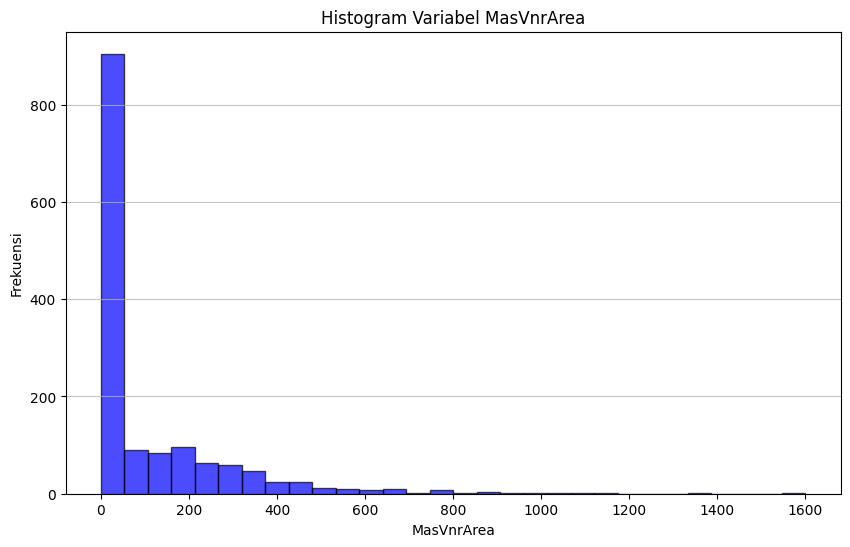

In [ ]:
# Membuat histogram untuk variabel MasVnrArea
plt.figure(figsize=(10, 6))
plt.hist(df_train['MasVnrArea'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel MasVnrArea')
plt.xlabel('MasVnrArea')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()



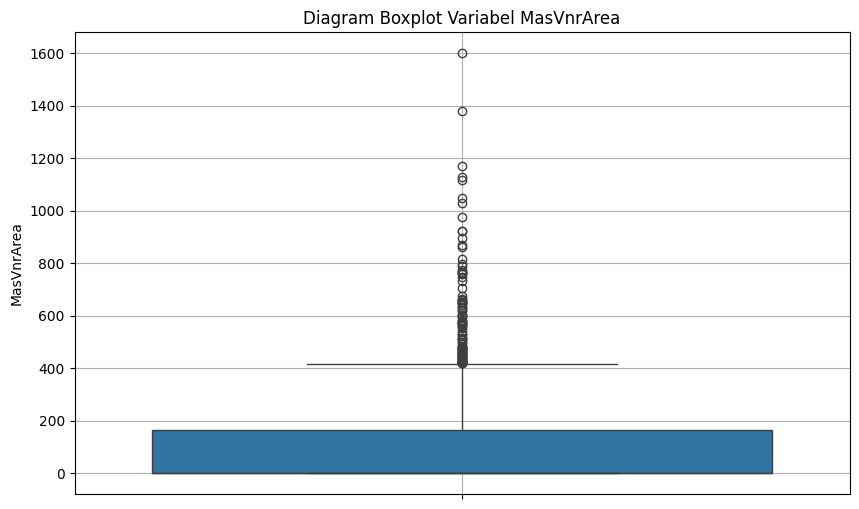

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Membuat boxplot untuk variabel MasVnrArea
plt.figure(figsize=(10, 6))
sns.boxplot(y='MasVnrArea', data=df_train)
plt.title('Diagram Boxplot Variabel MasVnrArea')
plt.ylabel('MasVnrArea')
plt.grid()
plt.show()

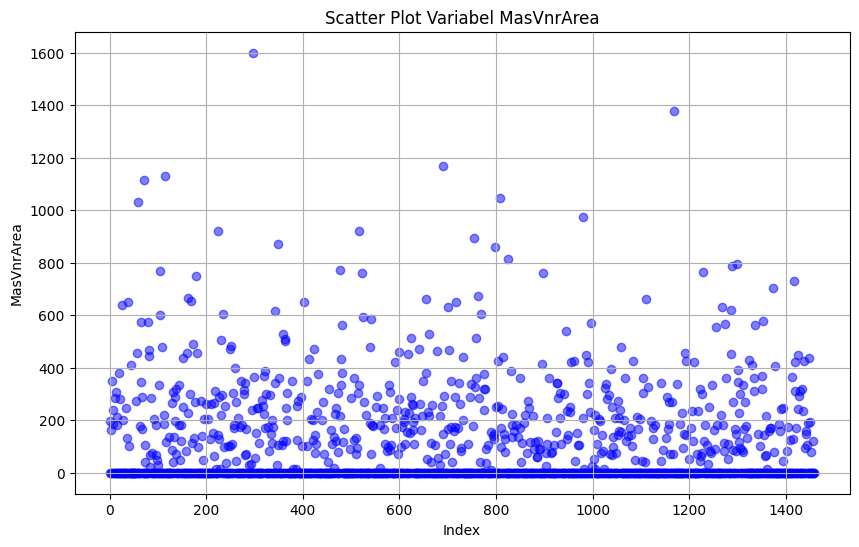

In [ ]:
# Membuat scatter plot untuk variabel MasVnrArea
plt.figure(figsize=(10, 6))
plt.scatter(df_train.index, df_train['MasVnrArea'], color='blue', alpha=0.5)
plt.title('Scatter Plot Variabel MasVnrArea')
plt.xlabel('Index')
plt.ylabel('MasVnrArea')
plt.grid()
plt.show()

In [ ]:
statistik_deskriptif = df_train ['MasVnrArea'].describe()
print(statistik_deskriptif)

count    1452.000000
mean      103.685262
std       181.066207
min         0.000000
25%         0.000000
50%         0.000000
75%       166.000000
max      1600.000000
Name: MasVnrArea, dtype: float64


EDA untuk variabel **MasVnrArea>> Handling missing value, missing value diisi dengan mean**

In [ ]:
# Menampilkan jumlah missing values sebelum penanganan
print("Jumlah missing values sebelum penanganan:")
print(df_train['MasVnrArea'].isnull().sum())

# Mengisi missing values dengan rata-rata MasVnrArea
mean_lot_MasVnrArea = df_train['MasVnrArea'].mean()
df_train['MasVnrArea_Filled_MV'] = df_train['MasVnrArea'].fillna(mean_lot_MasVnrArea)

# Menampilkan jumlah missing values setelah penanganan
print("\nJumlah missing values setelah penanganan:")
print(df_train['MasVnrArea_Filled_MV'].isnull().sum())

Jumlah missing values sebelum penanganan:
8

Jumlah missing values setelah penanganan:
0


EDA untuk variabel 'MasVnrArea_Filled_MV by variabel SalePrice

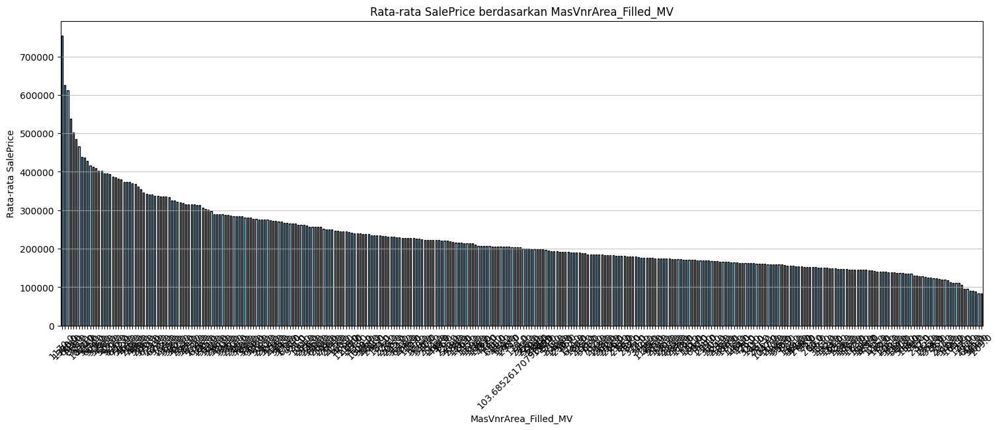

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori MasVnrArea_Filled_MV
average_saleprice = df_train.groupby('MasVnrArea_Filled_MV')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(18, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan MasVnrArea_Filled_MV')
plt.xlabel('MasVnrArea_Filled_MV')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **ExterQual**: Evaluates the quality of the material on the exterior

In [ ]:
df_train['ExterQual'].unique()

array(['Gd', 'TA', 'Ex', 'Fa'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada ExterQual
missing_values_count = df_train['ExterQual'].isnull().sum()
print(f'Jumlah missing values pada variabel ExterQual: {missing_values_count}')

Jumlah missing values pada variabel ExterQual: 0


In [ ]:
df_train['ExterQual'].value_counts()

,count
ExterQual,
TA,906
Gd,488
Ex,52
Fa,14


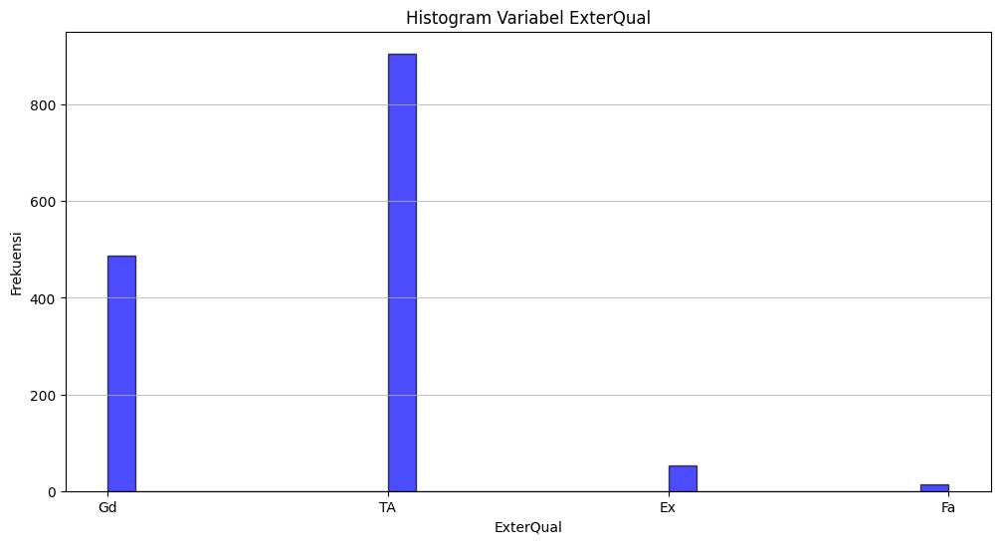

In [ ]:
# Membuat histogram untuk variabel ExterQual
plt.figure(figsize=(12, 6))
plt.hist(df_train['ExterQual'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel ExterQual')
plt.xlabel('ExterQual')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

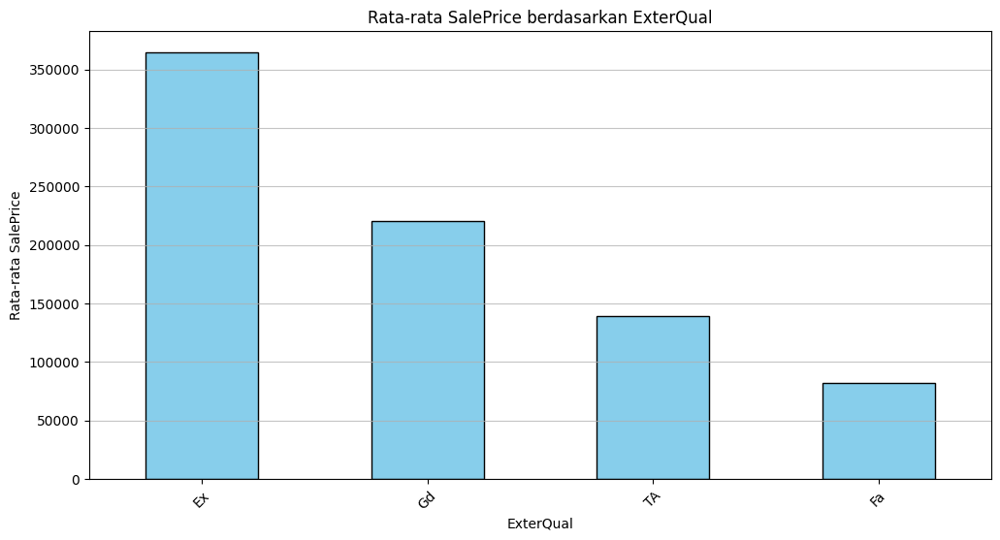

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori ExterQual
average_saleprice = df_train.groupby('ExterQual')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan ExterQual')
plt.xlabel('ExterQual')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel ExterQual: 1:FA, 2:TA, 3:Gd, 4:Ex

In [ ]:
    # Fungsi untuk mengkategorikanExterQual
    def kategorikan_ExterQual(ExterQual):
        if ExterQual == 'Fa':
            return 1
        elif ExterQual == 'TA':
            return 2
        elif ExterQual == 'Gd':
            return 3
        elif ExterQual == 'Ex':
            return 4
        return 0 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom Condition1
    df_train['ExterQual_Cat'] = df_train['ExterQual'].apply(kategorikan_ExterQual)

    # Menampilkan hasil
    print(df_train[['ExterQual', 'ExterQual_Cat']].head())

  ExterQual  ExterQual_Cat
0        Gd              3
1        TA              2
2        Gd              3
3        TA              2
4        Gd              3


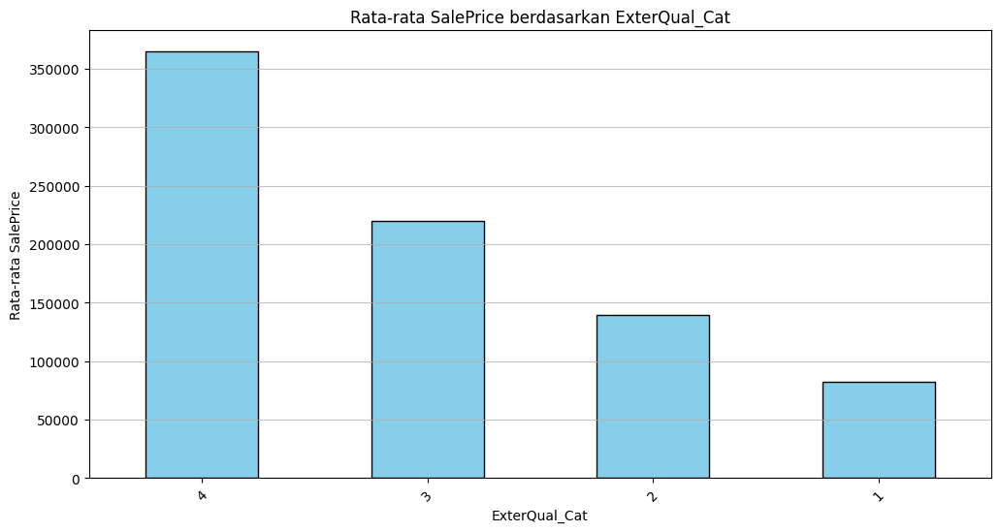

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori ExterQual
average_saleprice = df_train.groupby('ExterQual_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan ExterQual_Cat')
plt.xlabel('ExterQual_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **ExterCond**: Evaluates the present condition of the material on the exterior

In [ ]:
df_train['ExterCond'].unique()

array(['TA', 'Gd', 'Fa', 'Po', 'Ex'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada ExterCond
missing_values_count = df_train['ExterCond'].isnull().sum()
print(f'Jumlah missing values pada variabel ExterCond: {missing_values_count}')

Jumlah missing values pada variabel ExterCond: 0


In [ ]:
df_train['ExterCond'].value_counts()

,count
ExterCond,
TA,1282
Gd,146
Fa,28
Ex,3
Po,1


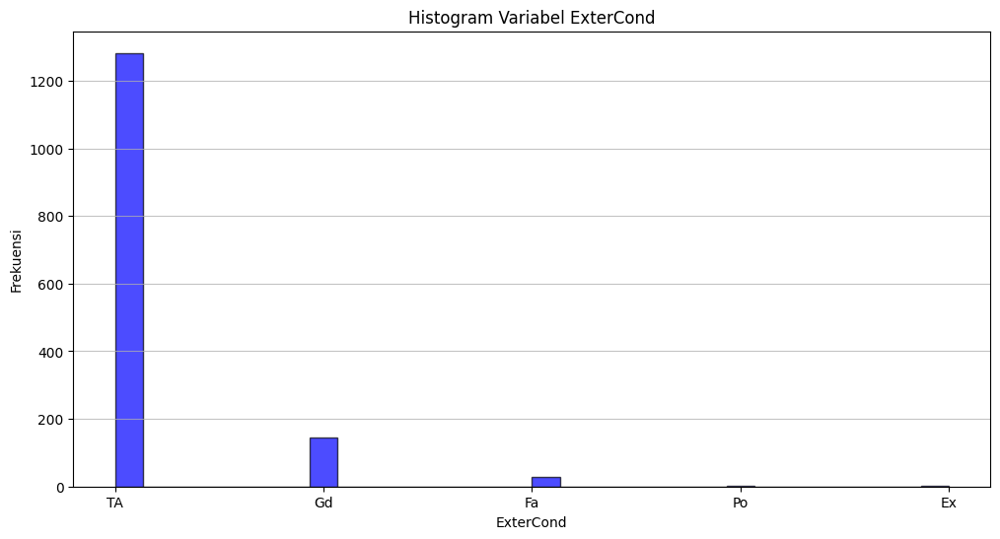

In [ ]:
# Membuat histogram untuk variabel ExterCond
plt.figure(figsize=(12, 6))
plt.hist(df_train['ExterCond'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel ExterCond')
plt.xlabel('ExterCond')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

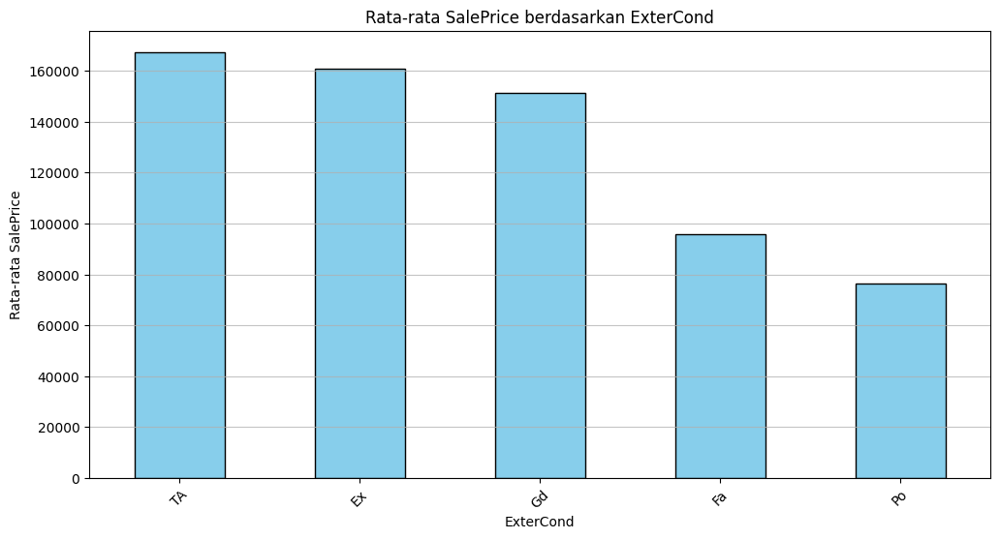

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori ExterCond
average_saleprice = df_train.groupby('ExterCond')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan ExterCond')
plt.xlabel('ExterCond')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel ExterCond: 1:Po, 2:Fa, 3:Gd, 4:Ex, 5:TA

In [ ]:
    # Fungsi untuk mengkategorikan ExterCond
    def kategorikan_ExterCond(ExterCond):
        if ExterCond == 'Po':
            return 1
        elif ExterCond == 'Fa':
            return 2
        elif ExterCond == 'Gd':
            return 3
        elif ExterCond == 'Ex':
            return 4
        elif ExterCond == 'TA':
            return 5
        else:
            return 0 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom ExterQual
    df_train['ExterCond_Cat'] = df_train['ExterCond'].apply(kategorikan_ExterCond)

    # Menampilkan hasil
    print(df_train[['ExterCond', 'ExterCond_Cat']].head())



  ExterCond  ExterCond_Cat
0        TA              5
1        TA              5
2        TA              5
3        TA              5
4        TA              5


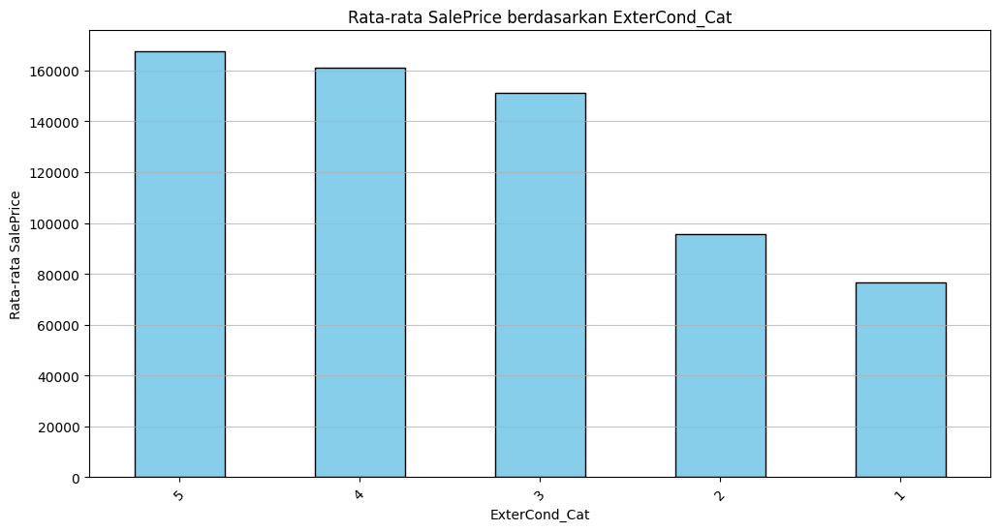

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori ExterCond
average_saleprice = df_train.groupby('ExterCond_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan ExterCond_Cat')
plt.xlabel('ExterCond_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **Foundation**: Type of foundation

In [ ]:
df_train['Foundation'].unique()

array(['PConc', 'CBlock', 'BrkTil', 'Wood', 'Slab', 'Stone'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada Foundation
missing_values_count = df_train['Foundation'].isnull().sum()
print(f'Jumlah missing values pada variabel Foundation: {missing_values_count}')

Jumlah missing values pada variabel Foundation: 0


In [ ]:
df_train['Foundation'].value_counts()

,count
Foundation,
PConc,647
CBlock,634
BrkTil,146
Slab,24
Stone,6
Wood,3


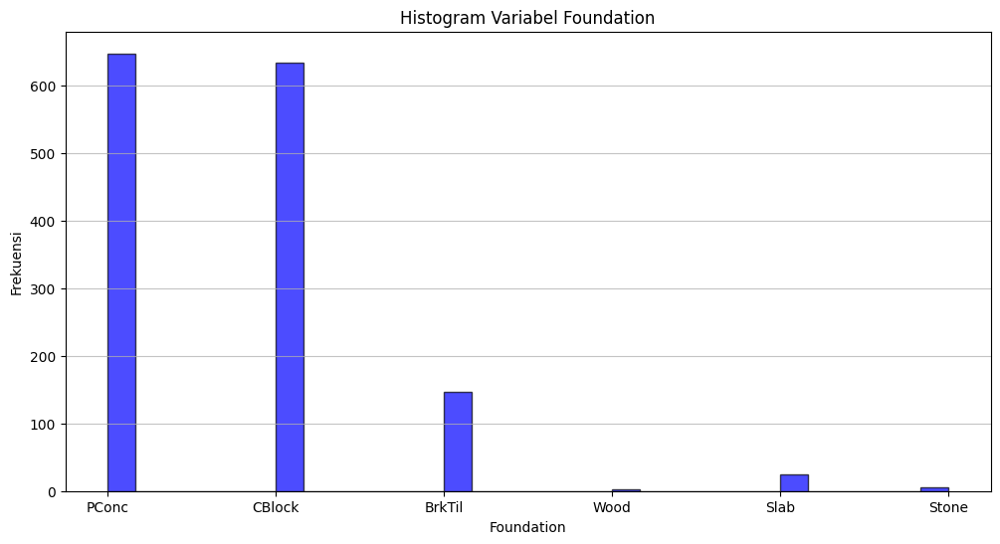

In [ ]:
# Membuat histogram untuk variabel Foundation
plt.figure(figsize=(12, 6))
plt.hist(df_train['Foundation'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel Foundation')
plt.xlabel('Foundation')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()


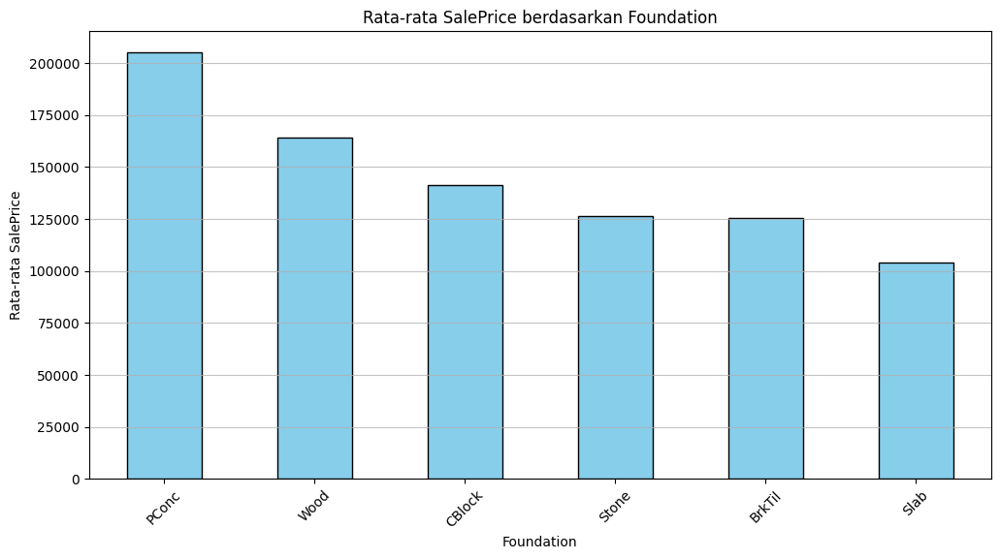

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Foundation
average_saleprice = df_train.groupby('Foundation')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Foundation')
plt.xlabel('Foundation')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel Foundation: 1:Slab, 2:BrkTil, 3:Stone, 4:CBlock, 5:Wood, 6:PConc

In [ ]:
    # Fungsi untuk mengkategorikan Foundation
    def kategorikan_Foundation(Foundation):
        if Foundation == 'Slab':
            return 1
        elif Foundation == 'BrkTil':
            return 2
        elif Foundation == 'Stone':
            return 3
        elif Foundation == 'CBlock':
            return 4
        elif Foundation == 'Wood':
            return 5
        elif Foundation == 'PConc':
            return 6
        else:
            return 0 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom ExterQual
    df_train['Foundation_Cat'] = df_train['Foundation'].apply(kategorikan_Foundation)

    # Menampilkan hasil
    print(df_train[['Foundation', 'Foundation_Cat']].head())

  Foundation  Foundation_Cat
0      PConc               6
1     CBlock               4
2      PConc               6
3     BrkTil               2
4      PConc               6


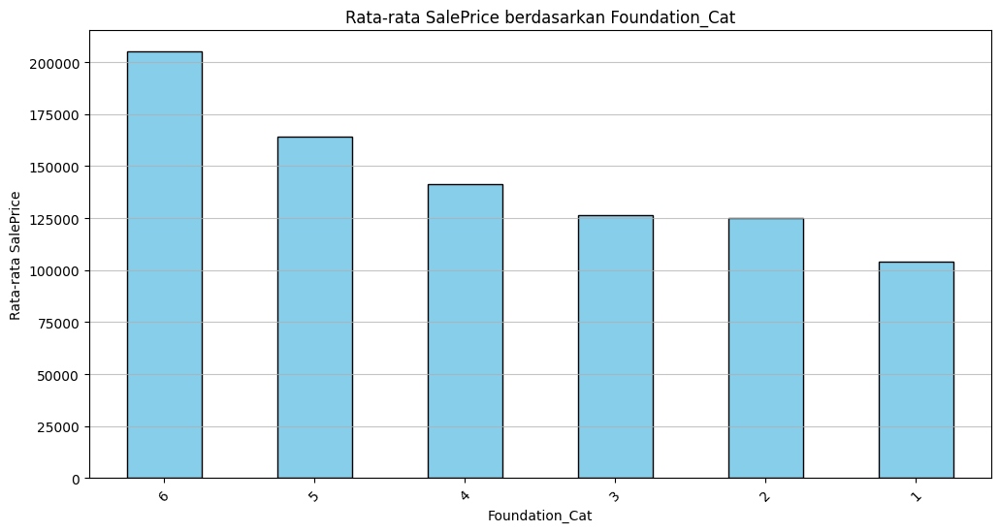

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Foundation
average_saleprice = df_train.groupby('Foundation_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Foundation_Cat')
plt.xlabel('Foundation_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **BsmtQual**: Evaluates the height of the basement >> BsmtQual adalah istilah yang digunakan untuk mengevaluasi kualitas atau tinggi dari ruang bawah tanah (basement) dalam sebuah bangunan.


In [ ]:
df_train['BsmtQual'].unique()

array(['Gd', 'TA', 'Ex', nan, 'Fa'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada BsmtQual
missing_values_count = df_train['BsmtQual'].isnull().sum()
print(f'Jumlah missing values pada variabel BsmtQual: {missing_values_count}')

Jumlah missing values pada variabel BsmtQual: 37


In [ ]:
df_train['BsmtQual'].value_counts()

,count
BsmtQual,
TA,649
Gd,618
Ex,121
Fa,35


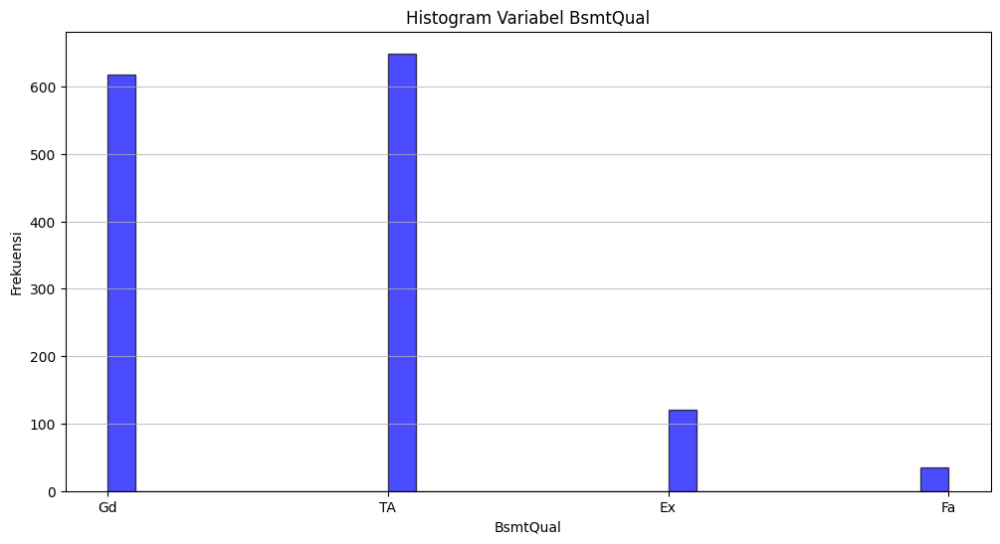

In [ ]:
# Membuat histogram untuk variabel BsmtQual
plt.figure(figsize=(12, 6))
plt.hist(df_train['BsmtQual'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel BsmtQual')
plt.xlabel('BsmtQual')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

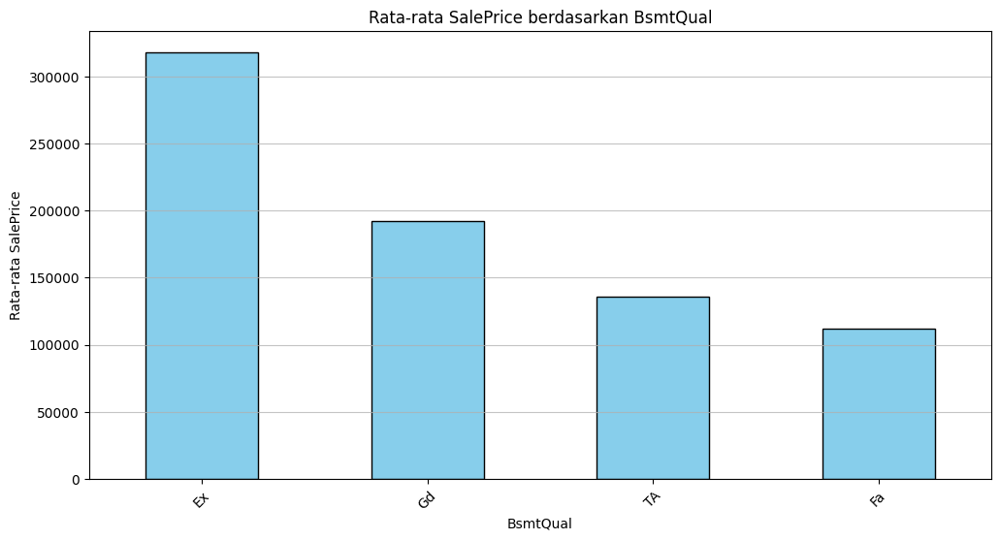

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori BsmtQual
average_saleprice = df_train.groupby('BsmtQual')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan BsmtQual')
plt.xlabel('BsmtQual')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel BsmtQual: 1: Na, 2:FA, 3:TA, 4:Gd, 5:Ex

In [ ]:
    # Fungsi untuk mengkategorikan BsmtQual
    def kategorikan_BsmtQual(BsmtQual):
        if BsmtQual == 'Fa':
            return 2
        elif BsmtQual == 'TA':
            return 3
        elif BsmtQual == 'Gd':
            return 4
        elif BsmtQual == 'Ex':
            return 5
        else:
            return 1 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom ExterQual
    df_train['BsmtQual_Cat'] = df_train['BsmtQual'].apply(kategorikan_BsmtQual)

    # Menampilkan hasil
    print(df_train[['BsmtQual', 'BsmtQual_Cat']].head())

  BsmtQual  BsmtQual_Cat
0       Gd             4
1       Gd             4
2       Gd             4
3       TA             3
4       Gd             4


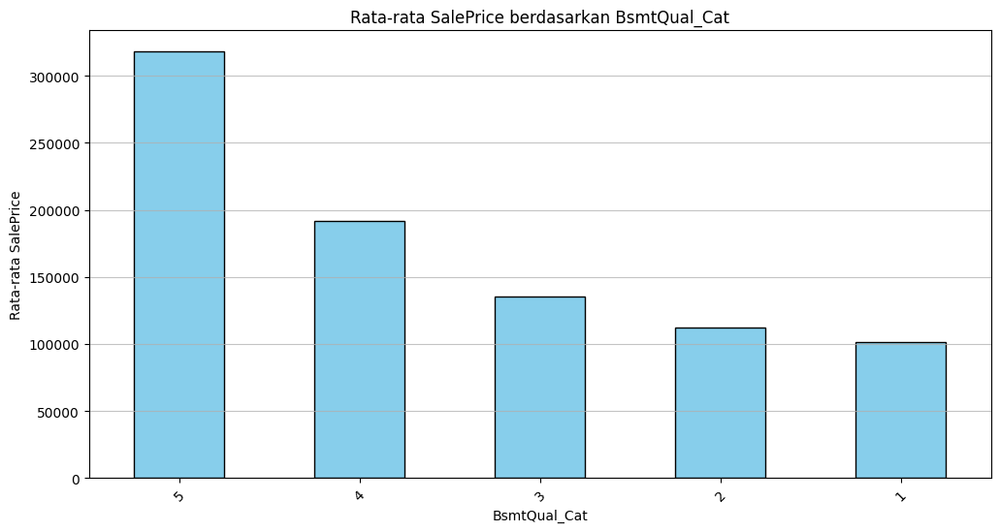

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori BsmtQual_Cat
average_saleprice = df_train.groupby('BsmtQual_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan BsmtQual_Cat')
plt.xlabel('BsmtQual_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **BsmtCond**: Evaluates the general condition of the basement >> istilah yang digunakan untuk mengevaluasi kondisi umum dari ruang bawah tanah (basement) dalam sebuah bangunan

In [ ]:
df_train['BsmtCond'].unique()

array(['TA', 'Gd', nan, 'Fa', 'Po'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada BsmtCond
missing_values_count = df_train['BsmtCond'].isnull().sum()
print(f'Jumlah missing values pada variabel BsmtCond: {missing_values_count}')

Jumlah missing values pada variabel BsmtCond: 37


In [ ]:
df_train['BsmtCond'].value_counts()

,count
BsmtCond,
TA,1311
Gd,65
Fa,45
Po,2


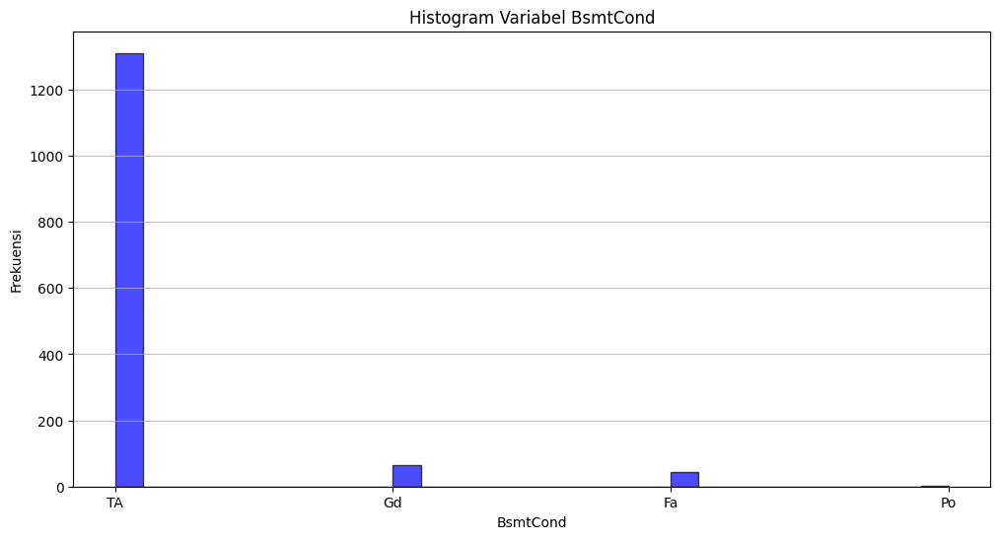

In [ ]:
# Membuat histogram untuk variabel BsmtCond
plt.figure(figsize=(12, 6))
plt.hist(df_train['BsmtCond'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel BsmtCond')
plt.xlabel('BsmtCond')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

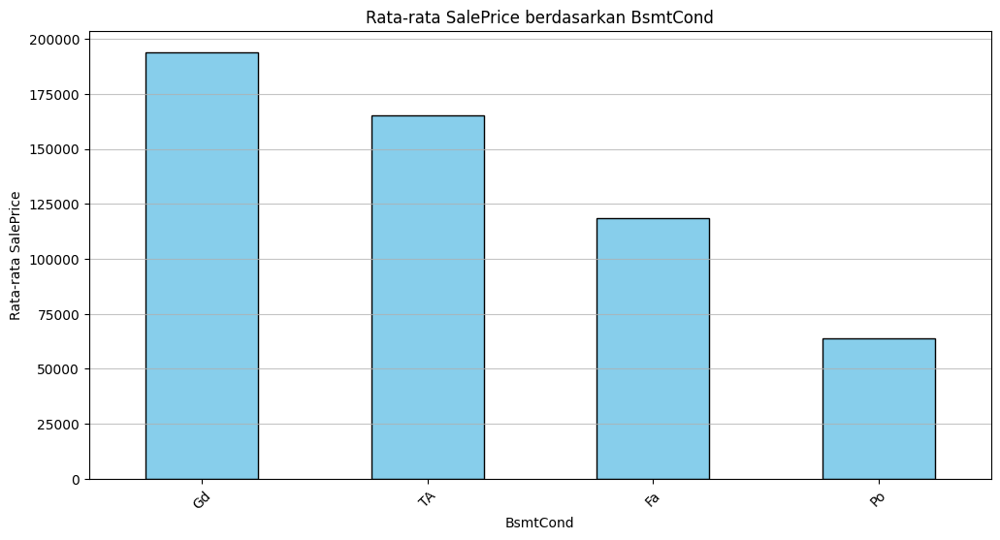

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori BsmtCond
average_saleprice = df_train.groupby('BsmtCond')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan BsmtCond')
plt.xlabel('BsmtCond')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel BsmtCond: 1: Po, 2:Na, 3:FA, 4:TA, 5:Gd

In [ ]:
    # Fungsi untuk mengkategorikan BsmtCond
    def kategorikan_BsmtCond(BsmtCond):
        if BsmtCond == 'Po':
            return 1
        elif BsmtCond == 'Fa':
            return 3
        elif BsmtCond == 'TA':
            return 4
        elif BsmtCond == 'Gd':
            return 5
        else:
            return 2 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom BsmtCond
    df_train['BsmtCond_Cat'] = df_train['BsmtCond'].apply(kategorikan_BsmtCond)

    # Menampilkan hasil
    print(df_train[['BsmtCond', 'BsmtCond_Cat']].head())

  BsmtCond  BsmtCond_Cat
0       TA             4
1       TA             4
2       TA             4
3       Gd             5
4       TA             4


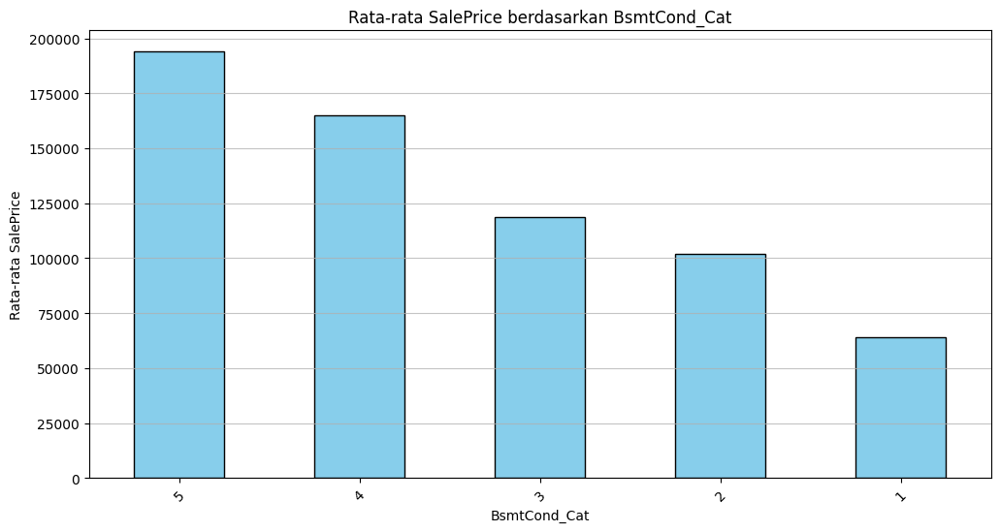

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori BsmtCond_Cat
average_saleprice = df_train.groupby('BsmtCond_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan BsmtCond_Cat')
plt.xlabel('BsmtCond_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **BsmtExposure**: Refers to walkout or garden level walls >> merujuk pada tingkat keterpaparan atau aksesibilitas dinding ruang bawah tanah (basement) yang berada pada level berjalan (walkout) atau level taman (garden level). Istilah ini menggambarkan seberapa banyak dinding ruang bawah tanah yang terlihat atau terbuka ke luar, yang dapat mempengaruhi pencahayaan alami dan aksesibilitas ke area luar.

In [ ]:
df_train['BsmtExposure'].unique()

array(['No', 'Gd', 'Mn', 'Av', nan], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada BsmtExposure
missing_values_count = df_train['BsmtExposure'].isnull().sum()
print(f'Jumlah missing values pada variabel BsmtExposure: {missing_values_count}')

Jumlah missing values pada variabel BsmtExposure: 38


In [ ]:
df_train['BsmtExposure'].value_counts()

,count
BsmtExposure,
No,953
Av,221
Gd,134
Mn,114


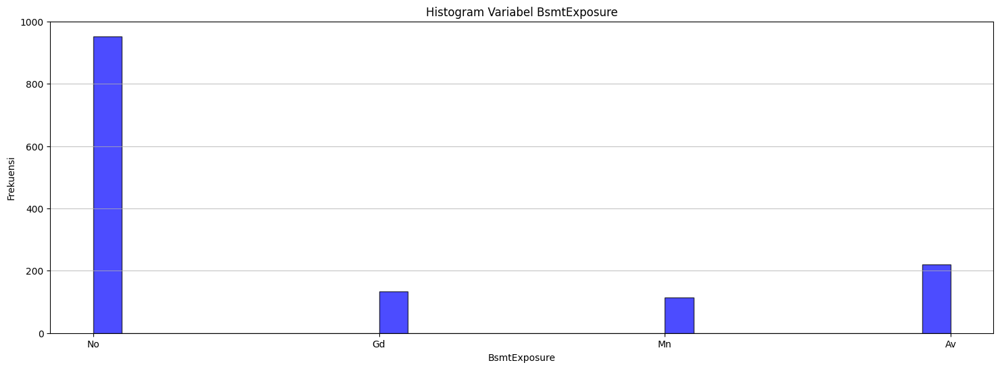

In [ ]:
# Membuat histogram untuk variabel BsmtExposure
plt.figure(figsize=(18, 6))
plt.hist(df_train['BsmtExposure'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel BsmtExposure')
plt.xlabel('BsmtExposure')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()


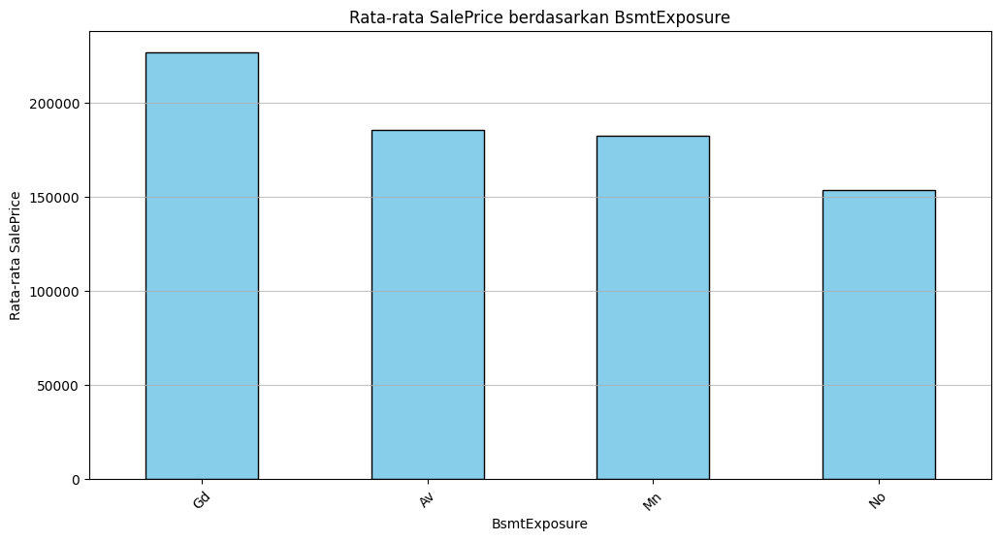

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori BsmtExposure
average_saleprice = df_train.groupby('BsmtExposure')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan BsmtExposure')
plt.xlabel('BsmtExposure')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel BsmtExposure: 1: Nan, 2:No, 3:Mn, 4:Av, 5:Gd

In [ ]:
    # Fungsi untuk mengkategorikan BsmtExposure
    def kategorikan_BsmtExposure(BsmtExposure):
        if BsmtExposure == 'No':
            return 2
        elif BsmtExposure == 'Mn':
            return 3
        elif BsmtExposure == 'Av':
            return 4
        elif BsmtExposure == 'Gd':
            return 5
        else:
            return 1 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom BsmtExposure
    df_train['BsmtExposure_Cat'] = df_train['BsmtExposure'].apply(kategorikan_BsmtExposure)

    # Menampilkan hasil
    print(df_train[['BsmtExposure', 'BsmtExposure_Cat']].head())

  BsmtExposure  BsmtExposure_Cat
0           No                 2
1           Gd                 5
2           Mn                 3
3           No                 2
4           Av                 4


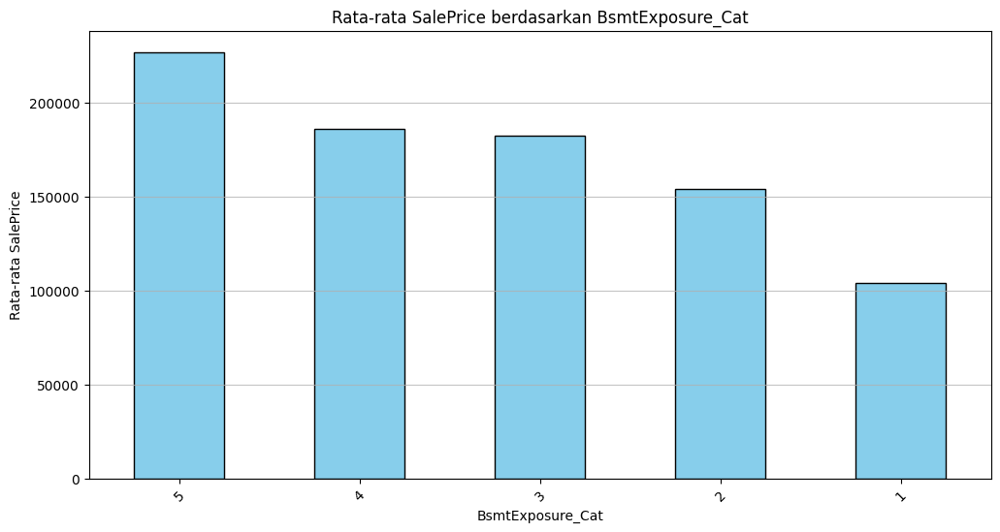

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori BsmtExposure_Cat
average_saleprice = df_train.groupby('BsmtExposure_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan BsmtExposure_Cat')
plt.xlabel('BsmtExposure_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **BsmtFinType1**: Rating of basement finished area >> merujuk pada penilaian atau klasifikasi area ruang bawah tanah yang telah selesai (finished area) dalam sebuah bangunan. Ini mencakup evaluasi terhadap kualitas penyelesaian ruang bawah tanah, yang dapat mencakup berbagai aspek

In [ ]:
df_train['BsmtFinType1'].unique()

array(['GLQ', 'ALQ', 'Unf', 'Rec', 'BLQ', nan, 'LwQ'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada BsmtFinType1
missing_values_count = df_train['BsmtFinType1'].isnull().sum()
print(f'Jumlah missing values pada variabel BsmtFinType1: {missing_values_count}')

Jumlah missing values pada variabel BsmtFinType1: 37


In [ ]:
df_train['BsmtFinType1'].value_counts()

,count
BsmtFinType1,
Unf,430
GLQ,418
ALQ,220
BLQ,148
Rec,133
LwQ,74


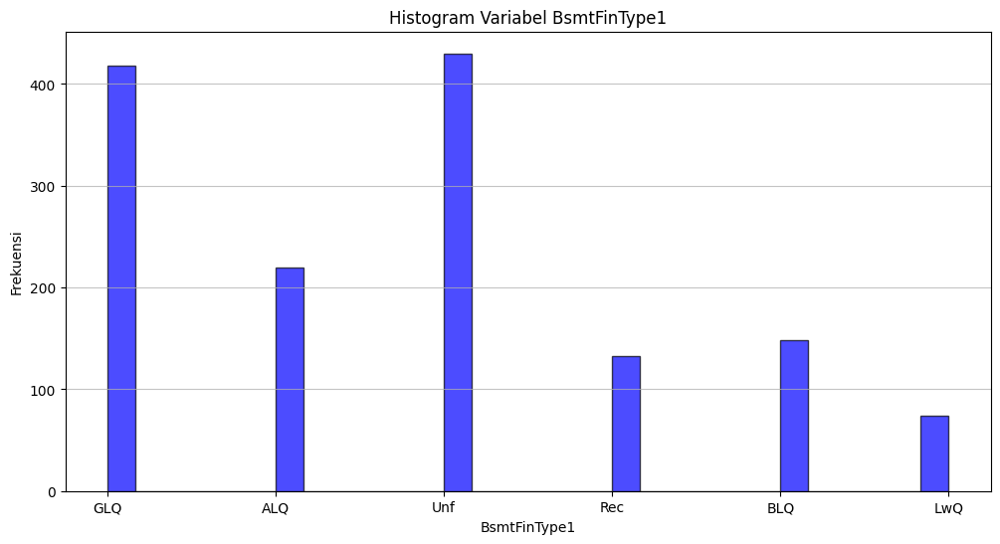

In [ ]:
# Membuat histogram untuk variabel BsmtFinType1
plt.figure(figsize=(12, 6))
plt.hist(df_train['BsmtFinType1'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel BsmtFinType1')
plt.xlabel('BsmtFinType1')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

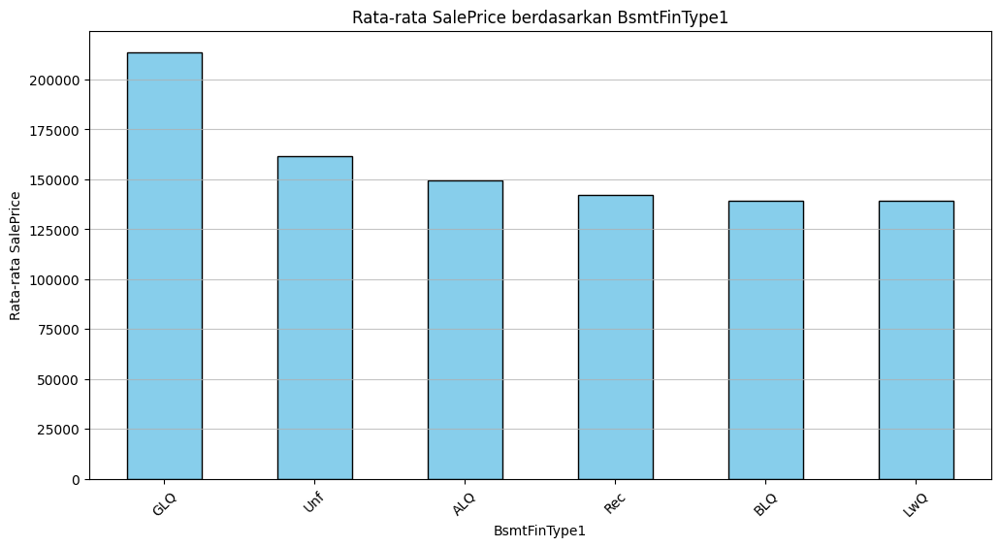

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori BsmtFinType1
average_saleprice = df_train.groupby('BsmtFinType1')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan BsmtFinType1')
plt.xlabel('BsmtFinType1')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel BsmtFinType1: 1:Nan, 2:LwQ, 3:BLQ, 4:Rec, 5:ALQ, 6:Unf, 7:GLQ

In [ ]:
    # Fungsi untuk mengkategorikan BsmtFinType1
    def kategorikan_BsmtFinType1(BsmtFinType1):
        if BsmtFinType1 == 'LwQ':
            return 2
        elif BsmtFinType1 == 'BLQ':
            return 3
        elif BsmtFinType1 == 'Rec':
            return 4
        elif BsmtFinType1 == 'ALQ':
            return 5
        elif BsmtFinType1 == 'Unf':
            return 6
        elif BsmtFinType1 == 'GLQ':
            return 7
        else:
            return 1 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom BsmtExposure
    df_train['BsmtFinType1_Cat'] = df_train['BsmtFinType1'].apply(kategorikan_BsmtFinType1)

    # Menampilkan hasil
    print(df_train[['BsmtFinType1', 'BsmtFinType1_Cat']].head())

  BsmtFinType1  BsmtFinType1_Cat
0          GLQ                 7
1          ALQ                 5
2          GLQ                 7
3          ALQ                 5
4          GLQ                 7


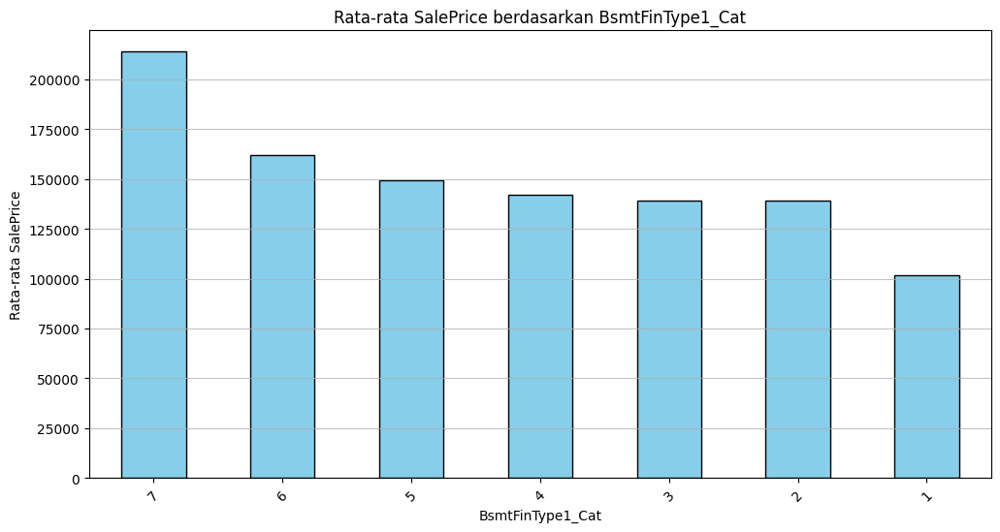

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori BsmtFinType1_Cat
average_saleprice = df_train.groupby('BsmtFinType1_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan BsmtFinType1_Cat')
plt.xlabel('BsmtFinType1_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **BsmtFinSF1**: Type 1 finished square feet >> merujuk pada jumlah luas area ruang bawah tanah yang telah selesai (finished area) dan diukur dalam satuan kaki persegi (square feet). Ini khususnya mencakup ruang yang telah direnovasi atau diperbaiki sehingga siap untuk digunakan, seperti ruang tamu, ruang tidur, atau ruang rekreasi.

In [ ]:
df_train['BsmtFinSF1'].unique()

array([ 706,  978,  486,  216,  655,  732, 1369,  859,    0,  851,  906,
        998,  737,  733,  578,  646,  504,  840,  188,  234, 1218, 1277,
       1018, 1153, 1213,  731,  643,  967,  747,  280,  179,  456, 1351,
         24,  763,  182,  104, 1810,  384,  490,  649,  632,  941,  739,
        912, 1013,  603, 1880,  565,  320,  462,  228,  336,  448, 1201,
         33,  588,  600,  713, 1046,  648,  310, 1162,  520,  108,  569,
       1200,  224,  705,  444,  250,  984,   35,  774,  419,  170, 1470,
        938,  570,  300,  120,  116,  512,  567,  445,  695,  405, 1005,
        668,  821,  432, 1300,  507,  679, 1332,  209,  680,  716, 1400,
        416,  429,  222,   57,  660, 1016,  370,  351,  379, 1288,  360,
        639,  495,  288, 1398,  477,  831, 1904,  436,  352,  611, 1086,
        297,  626,  560,  390,  566, 1126, 1036, 1088,  641,  617,  662,
        312, 1065,  787,  468,   36,  822,  378,  946,  341,   16,  550,
        524,   56,  321,  842,  689,  625,  358,  4

In [ ]:
# Menghitung jumlah missing values pada BsmtFinSF1
missing_values_count = df_train['BsmtFinSF1'].isnull().sum()
print(f'Jumlah missing values pada variabel BsmtFinSF1: {missing_values_count}')

Jumlah missing values pada variabel BsmtFinSF1: 0


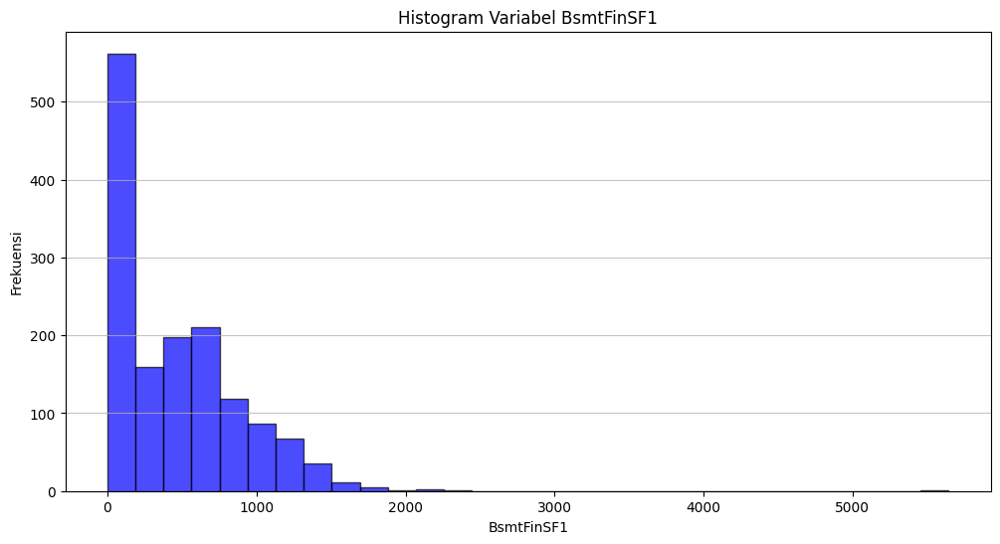

In [ ]:
# Membuat histogram untuk variabel BsmtFinSF1
plt.figure(figsize=(12, 6))
plt.hist(df_train['BsmtFinSF1'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel BsmtFinSF1')
plt.xlabel('BsmtFinSF1')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

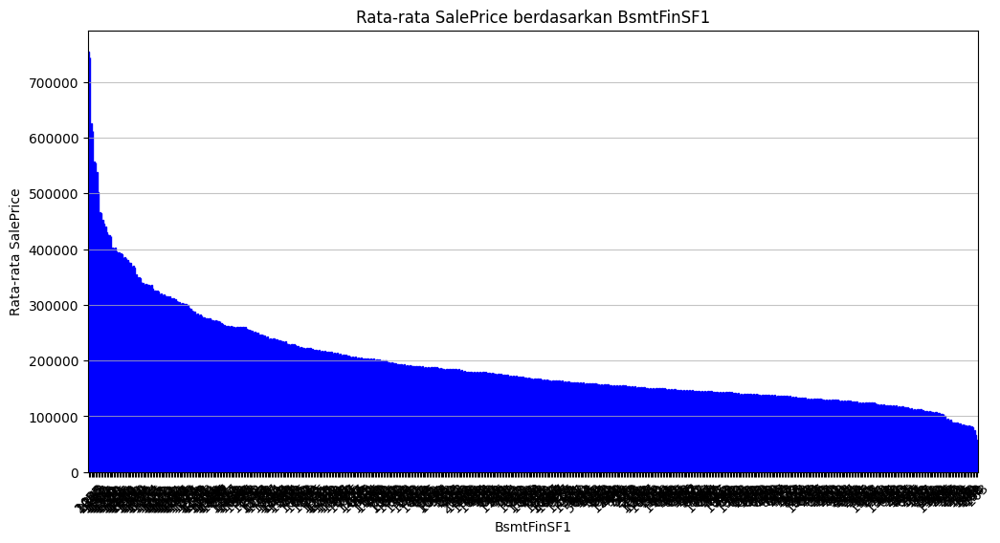

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori BsmtFinSF1
average_saleprice = df_train.groupby('BsmtFinSF1')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='blue')
plt.title('Rata-rata SalePrice berdasarkan BsmtFinSF1')
plt.xlabel('BsmtFinSF1')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **BsmtFinType2**: Rating of basement finished area (if multiple types) >> merujuk pada penilaian atau klasifikasi area ruang bawah tanah yang telah selesai (finished area) jika terdapat lebih dari satu jenis penyelesaian dalam ruang bawah tanah tersebut. Ini digunakan untuk menggambarkan kualitas atau tipe penyelesaian tambahan yang ada selain dari yang pertama (BsmtFinType1)

In [ ]:
df_train['BsmtFinType2'].unique()

array(['Unf', 'BLQ', nan, 'ALQ', 'Rec', 'LwQ', 'GLQ'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada BsmtFinType2
missing_values_count = df_train['BsmtFinType2'].isnull().sum()
print(f'Jumlah missing values pada variabel BsmtFinType2: {missing_values_count}')

Jumlah missing values pada variabel BsmtFinType2: 38


In [ ]:
df_train['BsmtFinType2'].value_counts()

,count
BsmtFinType2,
Unf,1256
Rec,54
LwQ,46
BLQ,33
ALQ,19
GLQ,14


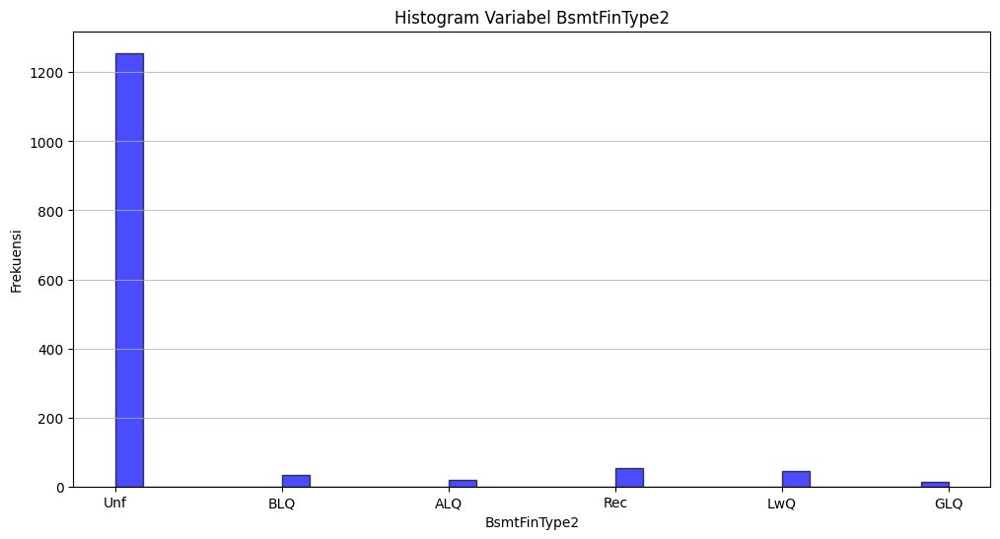

In [ ]:
# Membuat histogram untuk variabel BsmtFinType2
plt.figure(figsize=(12, 6))
plt.hist(df_train['BsmtFinType2'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel BsmtFinType2')
plt.xlabel('BsmtFinType2')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

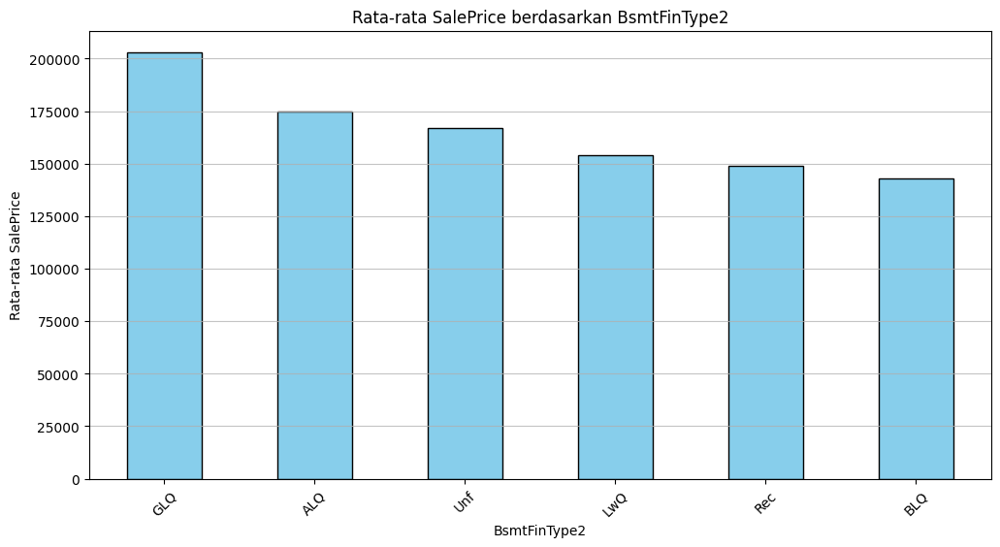

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori BsmtFinType2
average_saleprice = df_train.groupby('BsmtFinType2')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan BsmtFinType2')
plt.xlabel('BsmtFinType2')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel BsmtFinType2: 1:Nan, 2:BLQ, 3:Rec, 4:LwQ, 5:Unf, 6:ALQ, 7:GLQ

In [ ]:
    # Fungsi untuk mengkategorikan BsmtFinType2
    def kategorikan_BsmtFinType2(BsmtFinType2):
        if BsmtFinType2 == 'BLQ':
            return 2
        elif BsmtFinType2 == 'Rec':
            return 3
        elif BsmtFinType2 == 'LwQ':
            return 4
        elif BsmtFinType2 == 'Unf':
            return 5
        elif BsmtFinType2 == 'ALQ':
            return 6
        elif BsmtFinType2 == 'GLQ':
            return 7
        else:
            return 1 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom BsmtExposure
    df_train['BsmtFinType2_Cat'] = df_train['BsmtFinType2'].apply(kategorikan_BsmtFinType2)

    # Menampilkan hasil
    print(df_train[['BsmtFinType2', 'BsmtFinType2_Cat']].head())

  BsmtFinType2  BsmtFinType2_Cat
0          Unf                 5
1          Unf                 5
2          Unf                 5
3          Unf                 5
4          Unf                 5


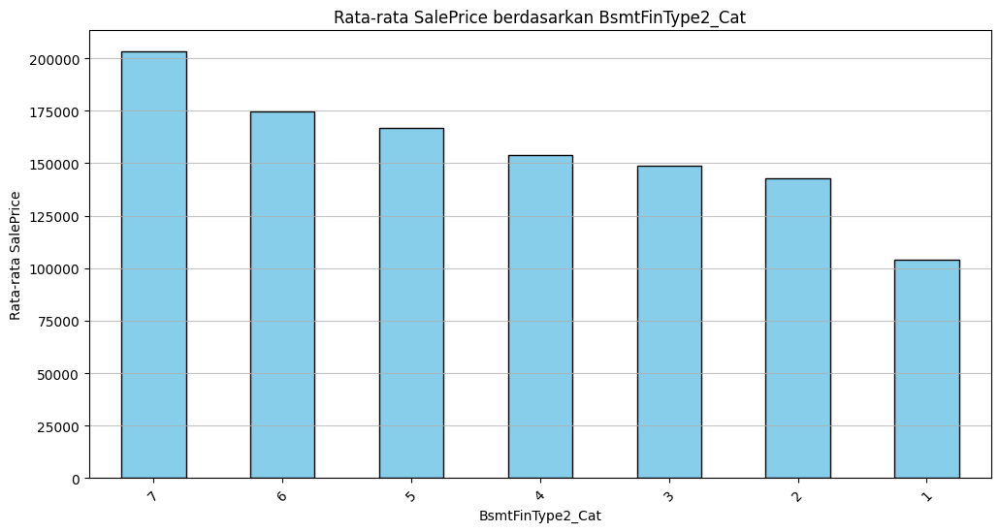

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori BsmtFinType2_Cat
average_saleprice = df_train.groupby('BsmtFinType2_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan BsmtFinType2_Cat')
plt.xlabel('BsmtFinType2_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **BsmtFinSF2**: Type 2 finished square feet

EDA untuk variabel **BsmtUnfSF**: Unfinished square feet of basement area

EDA untuk variabel **TotalBsmtSF**: Total square feet of basement area

EDA untuk variabel **Heating**: Type of heating

In [ ]:
df_train['Heating'].unique()

array(['GasA', 'GasW', 'Grav', 'Wall', 'OthW', 'Floor'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada Heating
missing_values_count = df_train['Heating'].isnull().sum()
print(f'Jumlah missing values pada variabel Heating: {missing_values_count}')

Jumlah missing values pada variabel Heating: 0


In [ ]:
df_train['Heating'].value_counts()

,count
Heating,
GasA,1428
GasW,18
Grav,7
Wall,4
OthW,2
Floor,1


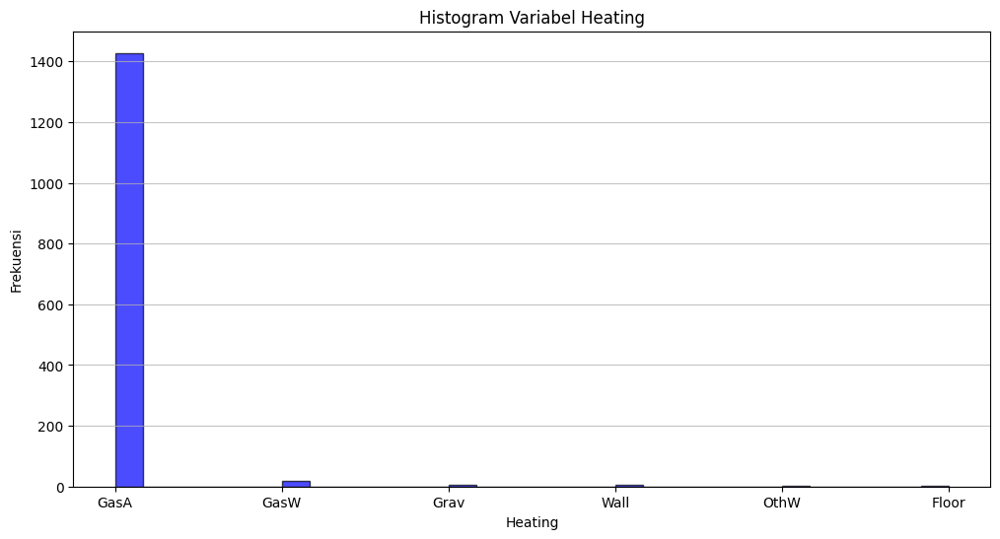

In [ ]:
# Membuat histogram untuk variabel Heating
plt.figure(figsize=(12, 6))
plt.hist(df_train['Heating'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel Heating')
plt.xlabel('Heating')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

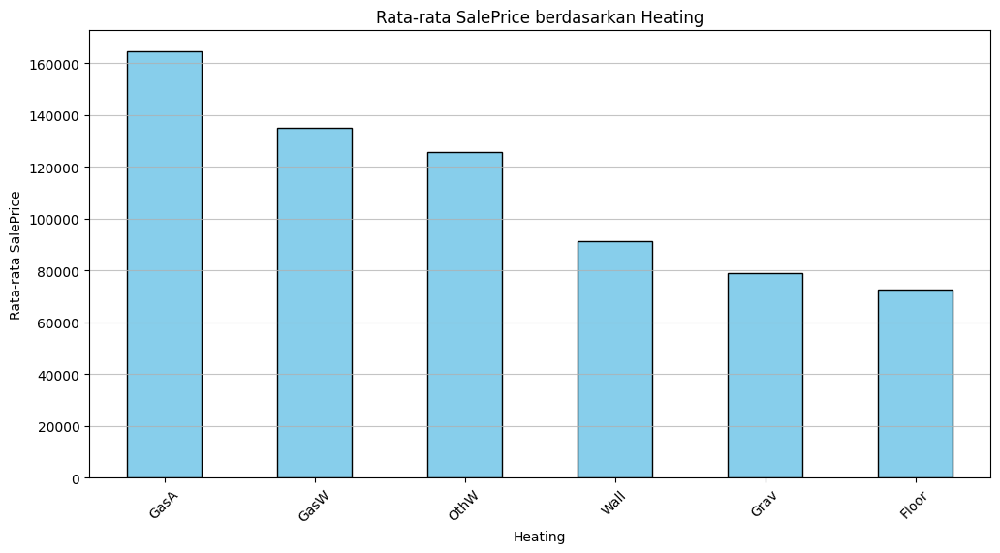

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Heating
average_saleprice = df_train.groupby('Heating')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Heating')
plt.xlabel('Heating')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel Heating: 1:Nan, 2:Floor, 3:Grav, 4:Wall, 5:OthW, 6:GasW, 7:GasA

In [ ]:
    # Fungsi untuk mengkategorikan Heating
    def kategorikan_Heating(Heating):
        if Heating == 'Floor':
            return 2
        elif Heating == 'Grav':
            return 3
        elif Heating == 'Wall':
            return 4
        elif Heating == 'OthW':
            return 5
        elif Heating == 'GasW':
            return 6
        elif Heating == 'GasA':
            return 7
        else:
            return 1 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom BsmtExposure
    df_train['Heating_Cat'] = df_train['Heating'].apply(kategorikan_Heating)

    # Menampilkan hasil
    print(df_train[['Heating', 'Heating_Cat']].head())

  Heating  Heating_Cat
0    GasA            7
1    GasA            7
2    GasA            7
3    GasA            7
4    GasA            7


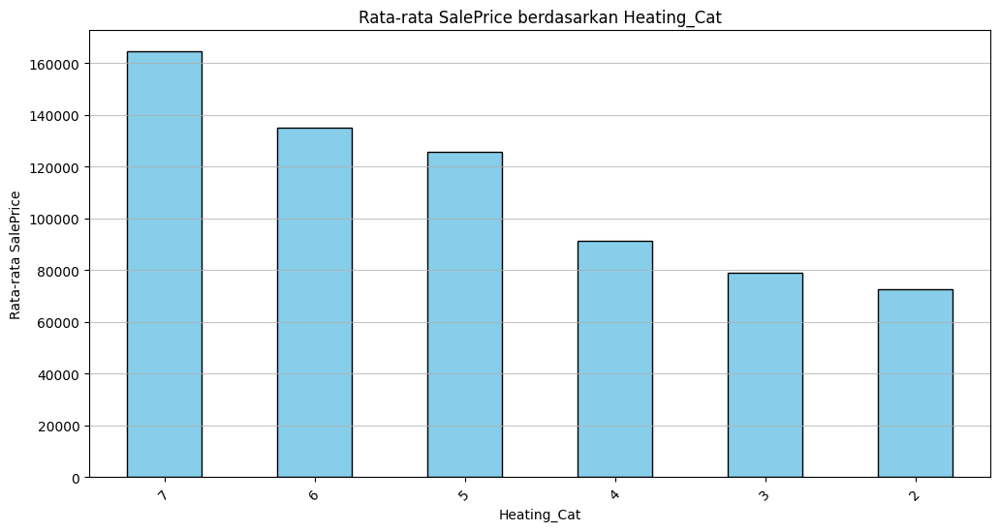

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Heating_Cat
average_saleprice = df_train.groupby('Heating_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Heating_Cat')
plt.xlabel('Heating_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **HeatingQC**: Heating quality and condition

In [ ]:
df_train['HeatingQC'].unique()

array(['Ex', 'Gd', 'TA', 'Fa', 'Po'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada HeatingQC
missing_values_count = df_train['HeatingQC'].isnull().sum()
print(f'Jumlah missing values pada variabel HeatingQC: {missing_values_count}')

Jumlah missing values pada variabel HeatingQC: 0


In [ ]:
df_train['HeatingQC'].value_counts()

,count
HeatingQC,
Ex,741
TA,428
Gd,241
Fa,49
Po,1


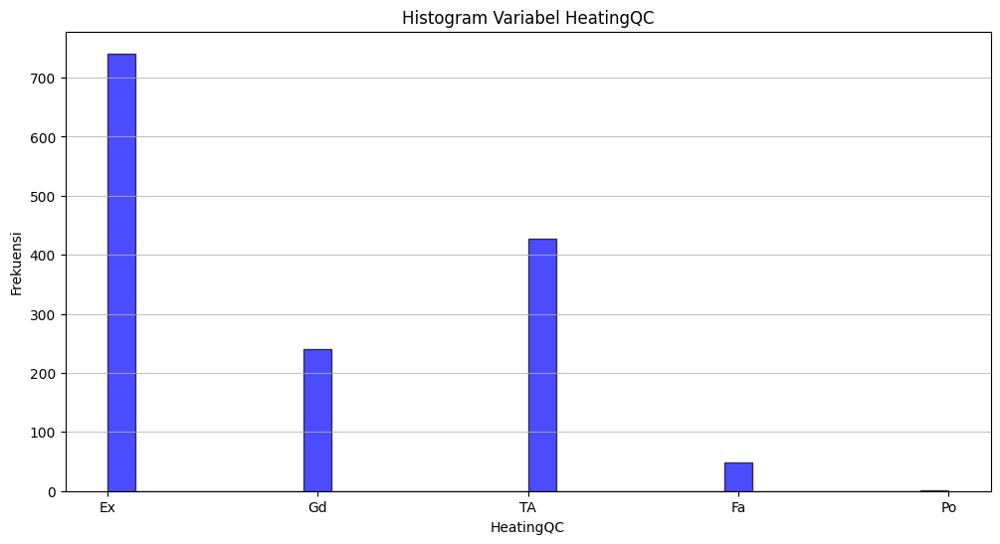

In [ ]:
# Membuat histogram untuk variabel HeatingQC
plt.figure(figsize=(12, 6))
plt.hist(df_train['HeatingQC'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel HeatingQC')
plt.xlabel('HeatingQC')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

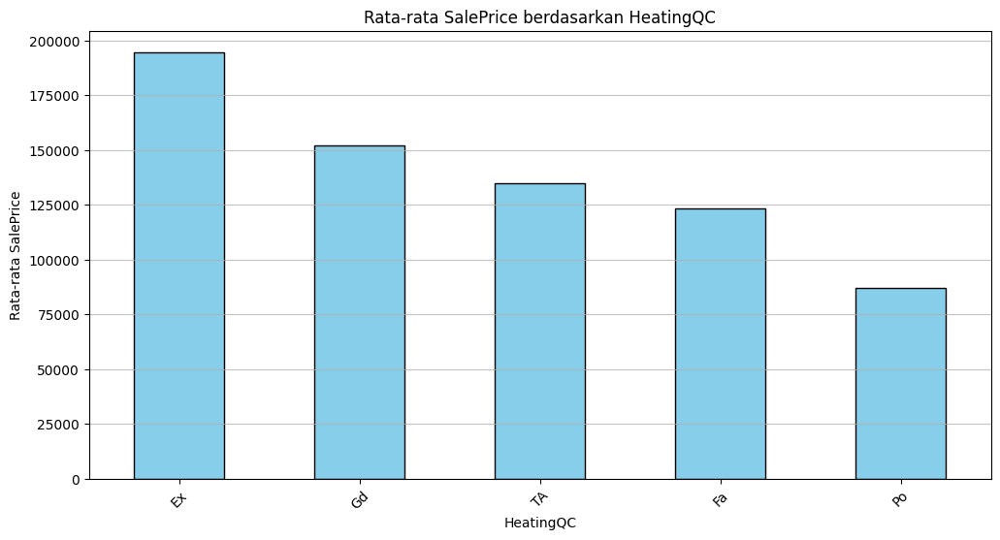

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori HeatingQC
average_saleprice = df_train.groupby('HeatingQC')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan HeatingQC')
plt.xlabel('HeatingQC')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel HeatingQC: 1:Po, 2:Fa, 3:TA, 4:Gd, 5:Ex

In [ ]:
    # Fungsi untuk mengkategorikan HeatingQC
    def kategorikan_HeatingQC(HeatingQC):
        if HeatingQC == 'Po':
            return 1
        elif HeatingQC == 'Fa':
            return 2
        elif HeatingQC == 'TA':
            return 3
        elif HeatingQC == 'Gd':
            return 4
        elif HeatingQC == 'Ex':
            return 5
        else:
            return 0 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom HeatingQC
    df_train['HeatingQC_Cat'] = df_train['HeatingQC'].apply(kategorikan_HeatingQC)

    # Menampilkan hasil
    print(df_train[['HeatingQC', 'HeatingQC_Cat']].head())

  HeatingQC  HeatingQC_Cat
0        Ex              5
1        Ex              5
2        Ex              5
3        Gd              4
4        Ex              5


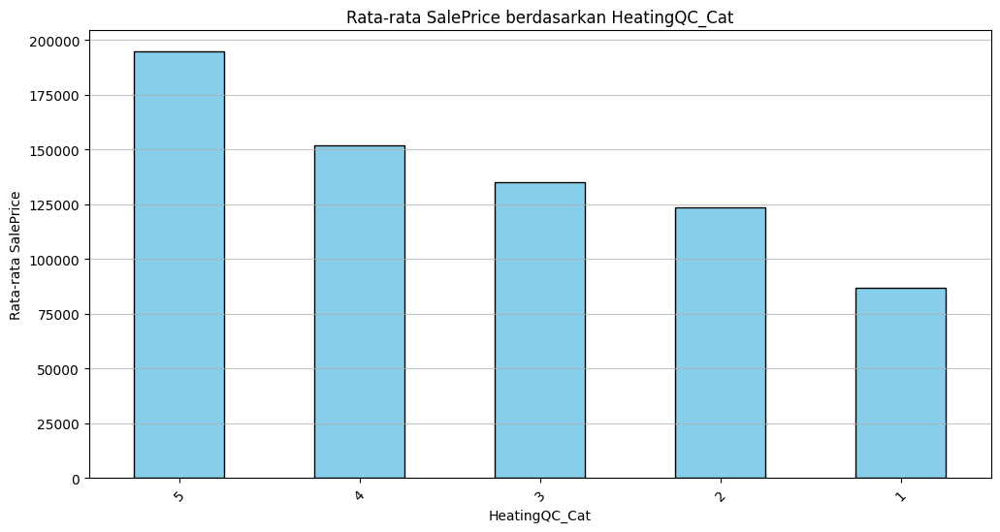

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori HeatingQC_Cat
average_saleprice = df_train.groupby('HeatingQC_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan HeatingQC_Cat')
plt.xlabel('HeatingQC_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **CentralAir**: Central air conditioning

In [ ]:
df_train['CentralAir'].unique()

array(['Y', 'N'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada CentralAir
missing_values_count = df_train['CentralAir'].isnull().sum()
print(f'Jumlah missing values pada variabel CentralAir: {missing_values_count}')

Jumlah missing values pada variabel CentralAir: 0


In [ ]:
df_train['CentralAir'].value_counts()

,count
CentralAir,
Y,1365
N,95


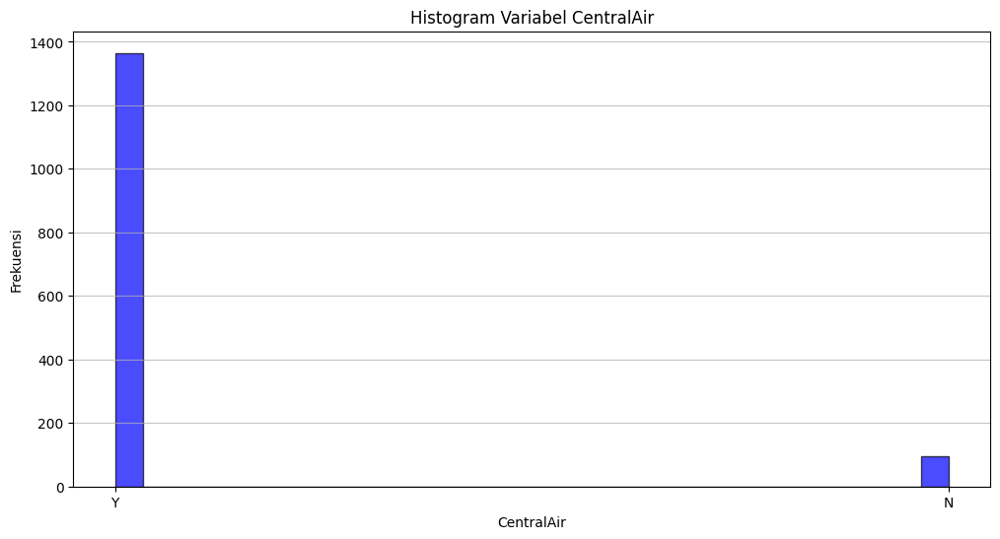

In [ ]:
# Membuat histogram untuk variabel CentralAir
plt.figure(figsize=(12, 6))
plt.hist(df_train['CentralAir'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel CentralAir')
plt.xlabel('CentralAir')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

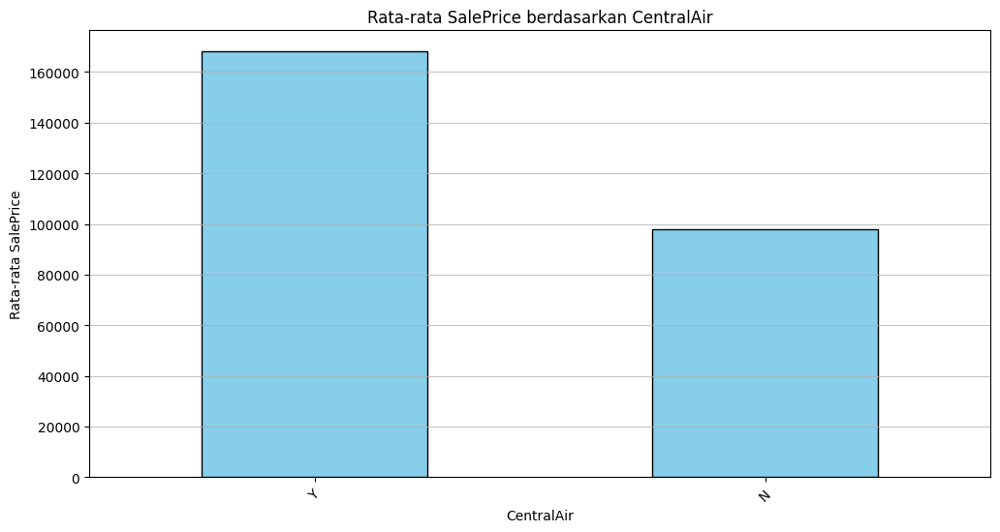

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori CentralAir
average_saleprice = df_train.groupby('CentralAir')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan CentralAir')
plt.xlabel('CentralAir')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel CentralAir: 1:N, 2:Y

In [ ]:
    # Fungsi untuk mengkategorikan CentralAir
    def kategorikan_CentralAir(CentralAir):
        if CentralAir == 'N':
            return 1
        elif CentralAir == 'Y':
            return 2
        else:
            return 0 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom CentralAir
    df_train['CentralAir_Cat'] = df_train['CentralAir'].apply(kategorikan_CentralAir)

    # Menampilkan hasil
    print(df_train[['CentralAir', 'CentralAir_Cat']].head())

  CentralAir  CentralAir_Cat
0          Y               2
1          Y               2
2          Y               2
3          Y               2
4          Y               2


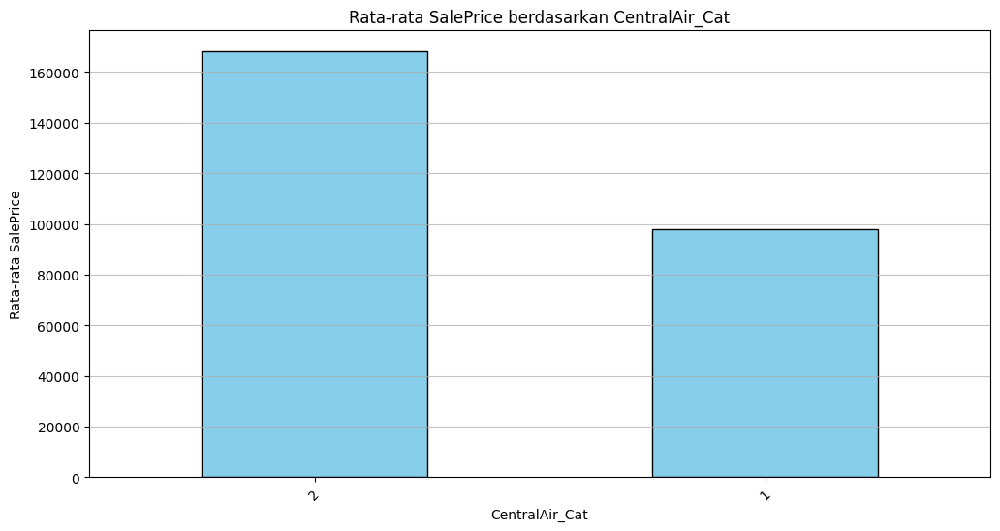

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori CentralAir_Cat
average_saleprice = df_train.groupby('CentralAir_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan CentralAir_Cat')
plt.xlabel('CentralAir_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **Electrical**: Electrical system >> merujuk pada sistem kelistrikan dalam sebuah bangunan. Ini mencakup semua komponen yang terkait dengan distribusi dan penggunaan listrik


In [ ]:
df_train['Electrical'].unique()

array(['SBrkr', 'FuseF', 'FuseA', 'FuseP', 'Mix', nan], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada Electrical
missing_values_count = df_train['Electrical'].isnull().sum()
print(f'Jumlah missing values pada variabel Electrical: {missing_values_count}')

Jumlah missing values pada variabel Electrical: 1


In [ ]:
df_train['Electrical'].value_counts()

,count
Electrical,
SBrkr,1334
FuseA,94
FuseF,27
FuseP,3
Mix,1


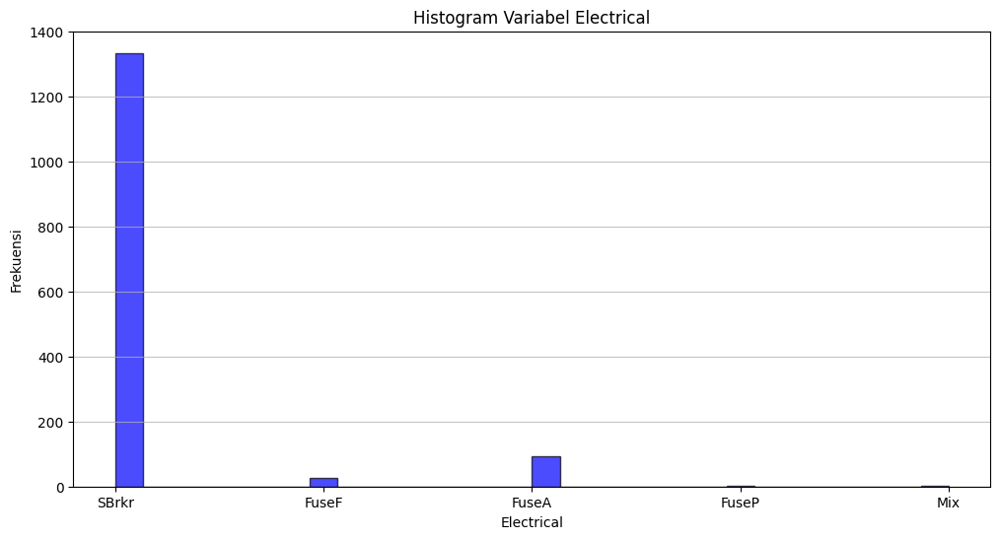

In [ ]:
# Membuat histogram untuk variabel Electrical
plt.figure(figsize=(12, 6))
plt.hist(df_train['Electrical'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel Electrical')
plt.xlabel('Electrical')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

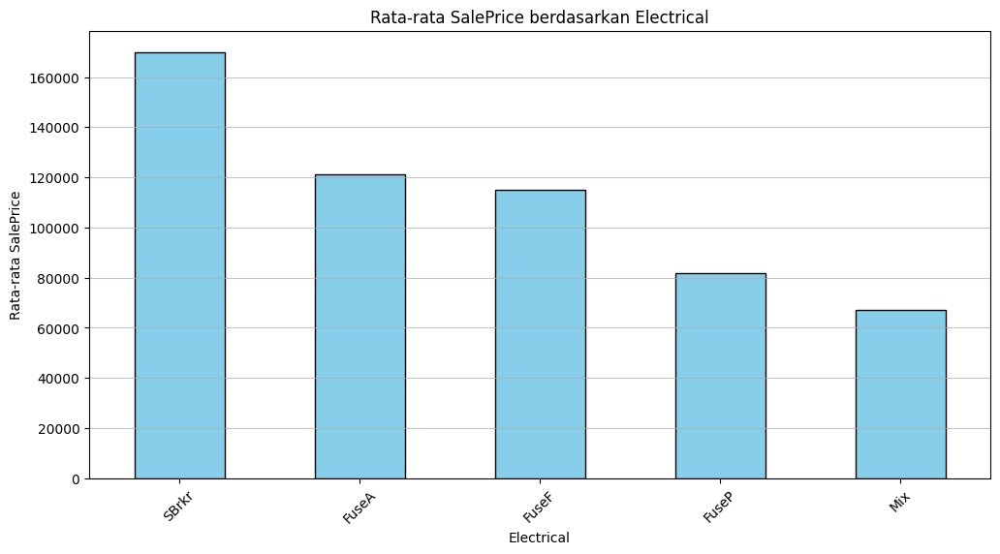

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Electrical
average_saleprice = df_train.groupby('Electrical')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Electrical')
plt.xlabel('Electrical')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel Electrical: 1:Mix, 2:FuseP, 3:FuseF , 4:FuseA , 5: nan, 6: SBrkr

In [ ]:
    # Fungsi untuk mengkategorikan Electrical
    def kategorikan_Electrical(Electrical):
        if Electrical == 'Mix':
            return 1
        elif Electrical == 'FuseP':
            return 2
        elif Electrical == 'FuseF':
            return 3
        elif Electrical == 'FuseA':
            return 4
        elif Electrical == 'SBrkr':
            return 6
        else:
            return 5 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom CentralAir
    df_train['Electrical_Cat'] = df_train['Electrical'].apply(kategorikan_Electrical)

    # Menampilkan hasil
    print(df_train[['Electrical', 'Electrical_Cat']].head())

  Electrical  Electrical_Cat
0      SBrkr               6
1      SBrkr               6
2      SBrkr               6
3      SBrkr               6
4      SBrkr               6


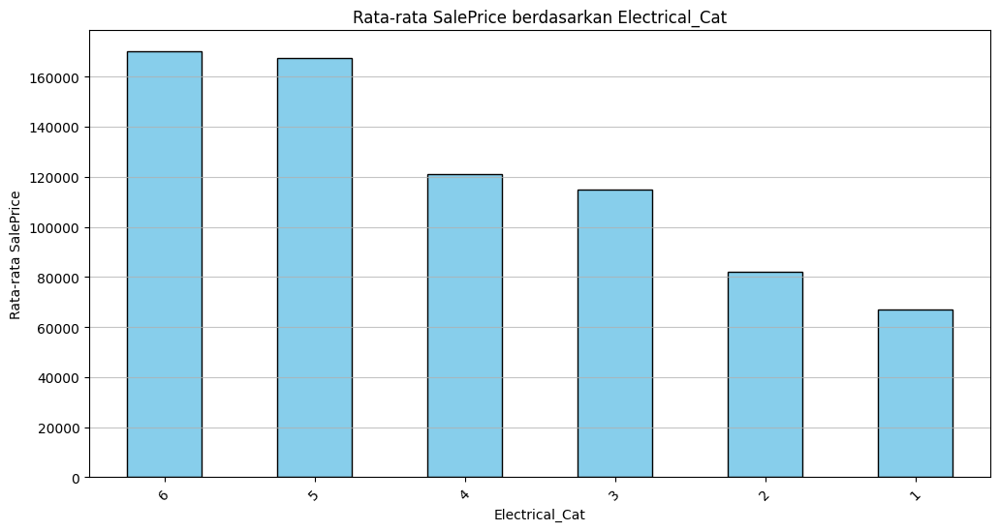

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Electrical_Cat
average_saleprice = df_train.groupby('Electrical_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Electrical_Cat')
plt.xlabel('Electrical_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **1stFlrSF**: First Floor square feet

EDA untuk variabel **2ndFlrSF**: Second floor square feet


EDA untuk variabel **LowQualFinSF**: Low quality finished square feet (all floors)

EDA untuk variabel **GrLivArea**: Above grade (ground) living area square feet

EDA untuk variabel **BsmtFullBath**: Basement full bathrooms

EDA untuk variabel **BsmtHalfBath**: Basement half bathrooms


EDA untuk variabel **FullBath**: Full bathrooms above grade

EDA untuk variabel **HalfBath**: Half baths above grade

EDA untuk variabel **BedroomAbvGr**: Bedrooms above grade (does NOT include basement bedrooms)

EDA untuk variabel **KitchenAbvGr**: Kitchens above grade

EDA untuk variabel **KitchenQual**: Kitchen quality

In [ ]:
df_train['KitchenQual'].unique()

array(['Gd', 'TA', 'Ex', 'Fa'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada KitchenQual
missing_values_count = df_train['KitchenQual'].isnull().sum()
print(f'Jumlah missing values pada variabel KitchenQual: {missing_values_count}')


Jumlah missing values pada variabel KitchenQual: 0


In [ ]:
df_train['KitchenQual'].value_counts()


,count
KitchenQual,
TA,735
Gd,586
Ex,100
Fa,39


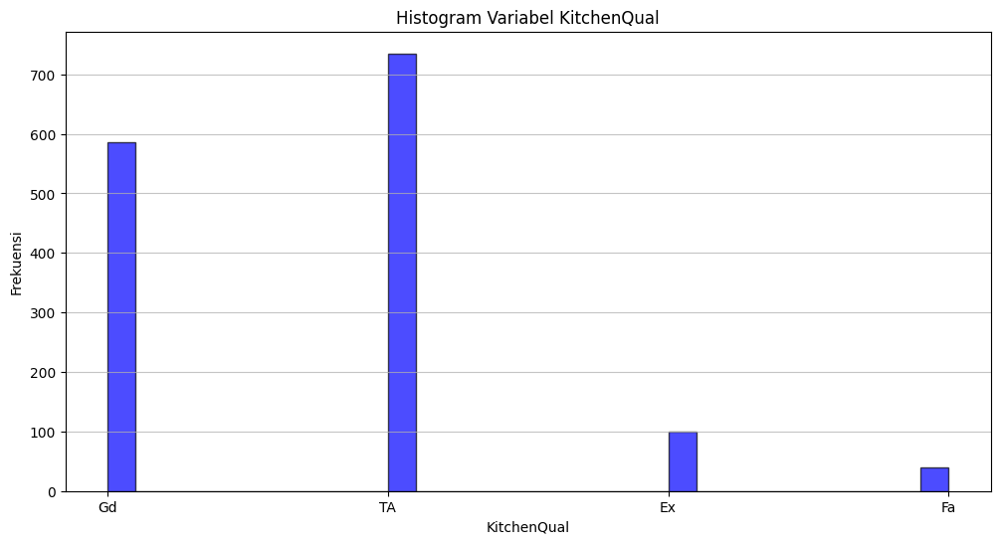

In [ ]:
# Membuat histogram untuk variabel KitchenQual
plt.figure(figsize=(12, 6))
plt.hist(df_train['KitchenQual'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel KitchenQual')
plt.xlabel('KitchenQual')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

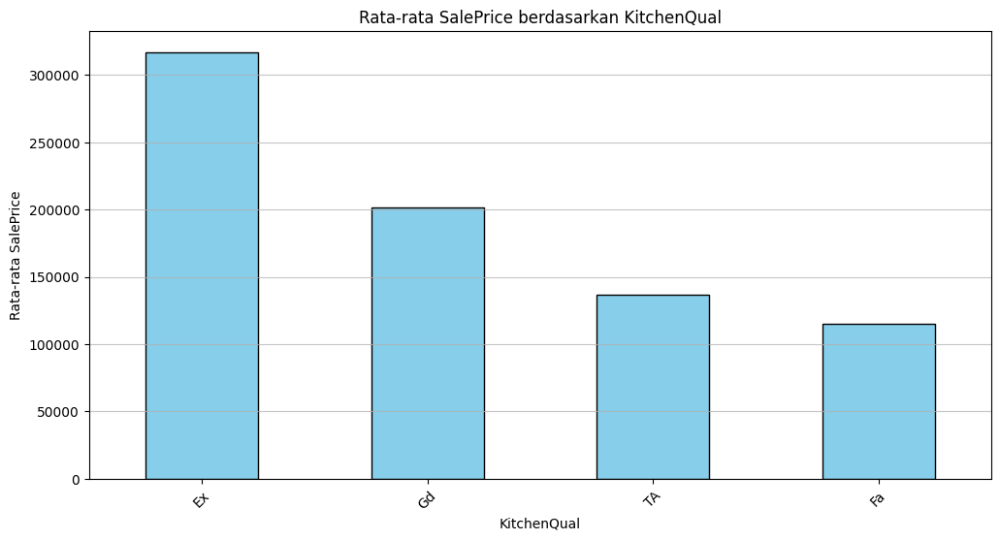

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori KitchenQual
average_saleprice = df_train.groupby('KitchenQual')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan KitchenQual')
plt.xlabel('KitchenQual')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel KitchenQual: 1:Fa, 2:TA, 3:Gd , 4:Ex

In [ ]:
    # Fungsi untuk mengkategorikan KitchenQual
    def kategorikan_KitchenQual(KitchenQual):
        if KitchenQual == 'Fa':
            return 1
        elif KitchenQual == 'TA':
            return 2
        elif KitchenQual == 'Gd':
            return 3
        elif KitchenQual == 'Ex':
            return 4
        else:
            return 0 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom KitchenQual
    df_train['KitchenQual_Cat'] = df_train['KitchenQual'].apply(kategorikan_KitchenQual)

    # Menampilkan hasil
    print(df_train[['KitchenQual', 'KitchenQual_Cat']].head())

  KitchenQual  KitchenQual_Cat
0          Gd                3
1          TA                2
2          Gd                3
3          Gd                3
4          Gd                3


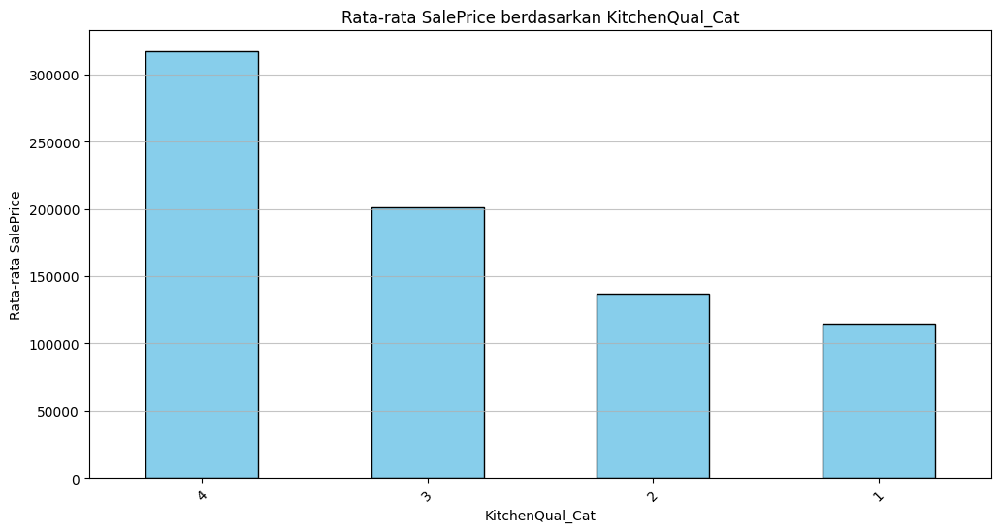

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori KitchenQual_Cat
average_saleprice = df_train.groupby('KitchenQual_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan KitchenQual_Cat')
plt.xlabel('KitchenQual_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **TotRmsAbvGrd**: Total rooms above grade (does not include bathrooms)

EDA untuk variabel **Functional**: Home functionality (Assume typical unless deductions are warranted)

In [ ]:
df_train['Functional'].unique()

array(['Typ', 'Min1', 'Maj1', 'Min2', 'Mod', 'Maj2', 'Sev'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada Functional
missing_values_count = df_train['Functional'].isnull().sum()
print(f'Jumlah missing values pada variabel Functional: {missing_values_count}')


Jumlah missing values pada variabel Functional: 0


In [ ]:
df_train['Functional'].value_counts()

,count
Functional,
Typ,1360
Min2,34
Min1,31
Mod,15
Maj1,14
Maj2,5
Sev,1


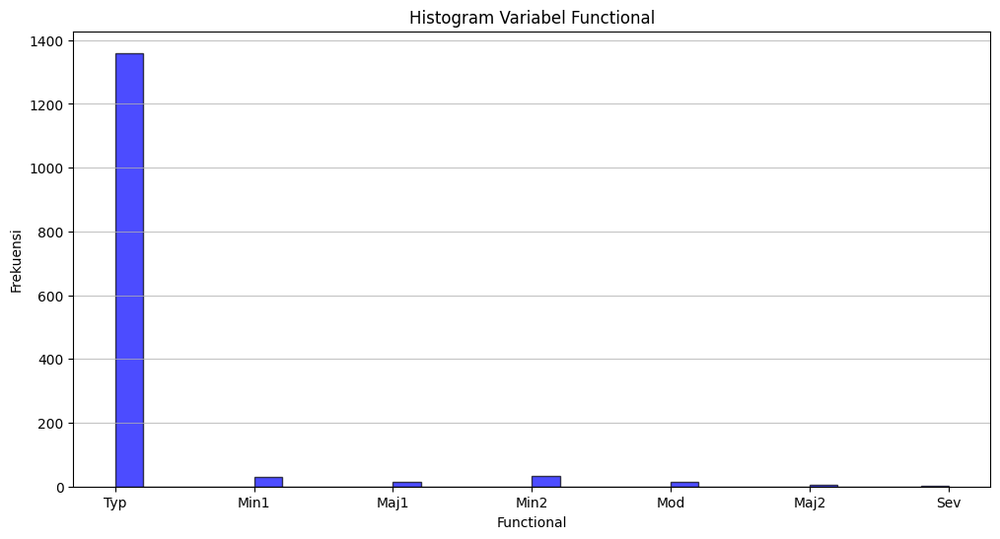

In [ ]:
# Membuat histogram untuk variabel Functional
plt.figure(figsize=(12, 6))
plt.hist(df_train['Functional'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel Functional')
plt.xlabel('Functional')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

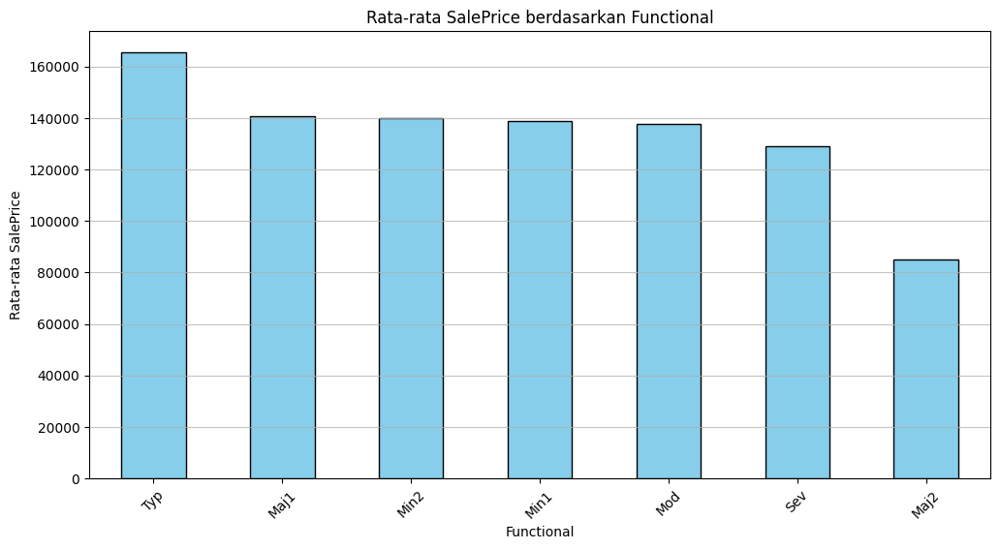

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Functional
average_saleprice = df_train.groupby('Functional')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Functional')
plt.xlabel('Functional')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel Functional: 1:Maj2, 2:Sev, 3:Mod, 4:Min1, 5:Min2, 6:Maj1, 7:Typ

In [ ]:
    # Fungsi untuk mengkategorikan Functional
    def kategorikan_Functional(Functional):
        if Functional == 'Maj2':
            return 1
        elif Functional == 'Sev':
            return 2
        elif Functional == 'Mod':
            return 3
        elif Functional == 'Min1':
            return 4
        elif Functional == 'Min2':
            return 5
        elif Functional == 'Maj1':
            return 6
        elif Functional == 'Typ':
            return 7
        else:
            return 0 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom Functional
    df_train['Functional_Cat'] = df_train['Functional'].apply(kategorikan_Functional)

    # Menampilkan hasil
    print(df_train[['Functional', 'Functional_Cat']].head())

  Functional  Functional_Cat
0        Typ               7
1        Typ               7
2        Typ               7
3        Typ               7
4        Typ               7


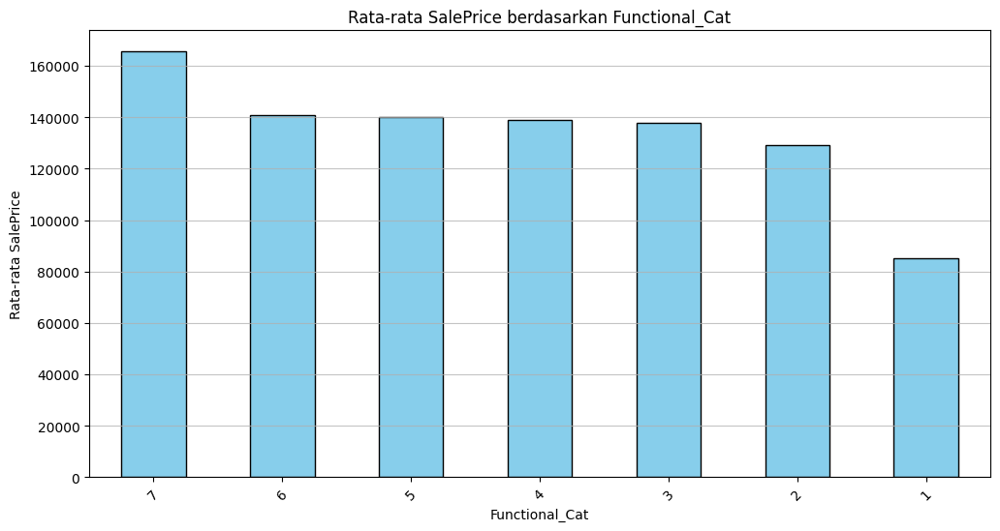

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Functional_Cat
average_saleprice = df_train.groupby('Functional_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Functional_Cat')
plt.xlabel('Functional_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **Fireplaces**: Number of fireplaces

EDA untuk variabel **FireplaceQu**: Fireplace quality >> merujuk pada kualitas perapian (fireplace) dalam sebuah bangunan. Penilaian ini mencakup berbagai aspek yang berhubungan dengan perapian

In [ ]:
df_train['FireplaceQu'].unique()

array([nan, 'TA', 'Gd', 'Fa', 'Ex', 'Po'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada Condition1
missing_values_count = df_train['FireplaceQu'].isnull().sum()
print(f'Jumlah missing values pada variabel FireplaceQu: {missing_values_count}')

Jumlah missing values pada variabel FireplaceQu: 690


In [ ]:
df_train['FireplaceQu'].value_counts()

,count
FireplaceQu,
Gd,380
TA,313
Fa,33
Ex,24
Po,20


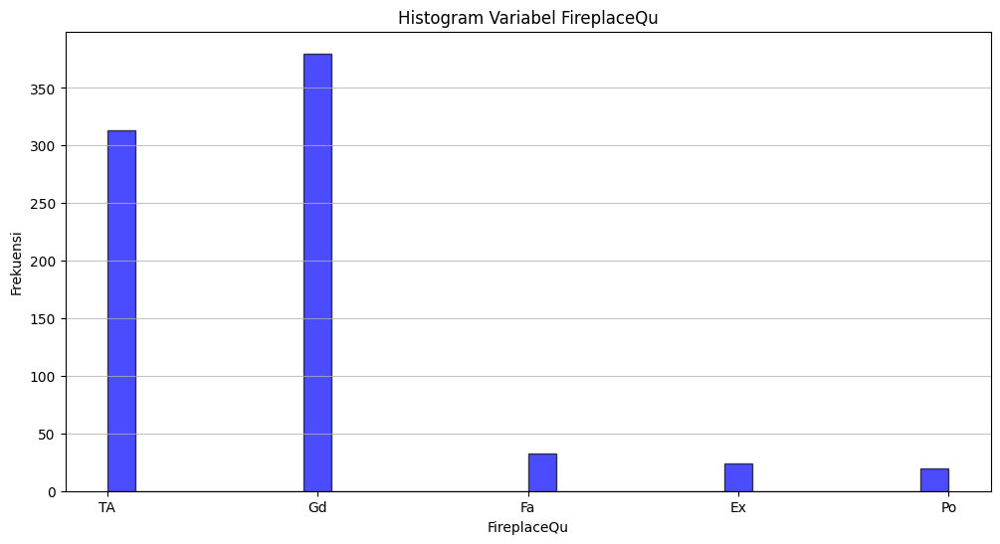

In [ ]:
# Membuat histogram untuk variabel FireplaceQu
plt.figure(figsize=(12, 6))
plt.hist(df_train['FireplaceQu'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel FireplaceQu')
plt.xlabel('FireplaceQu')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

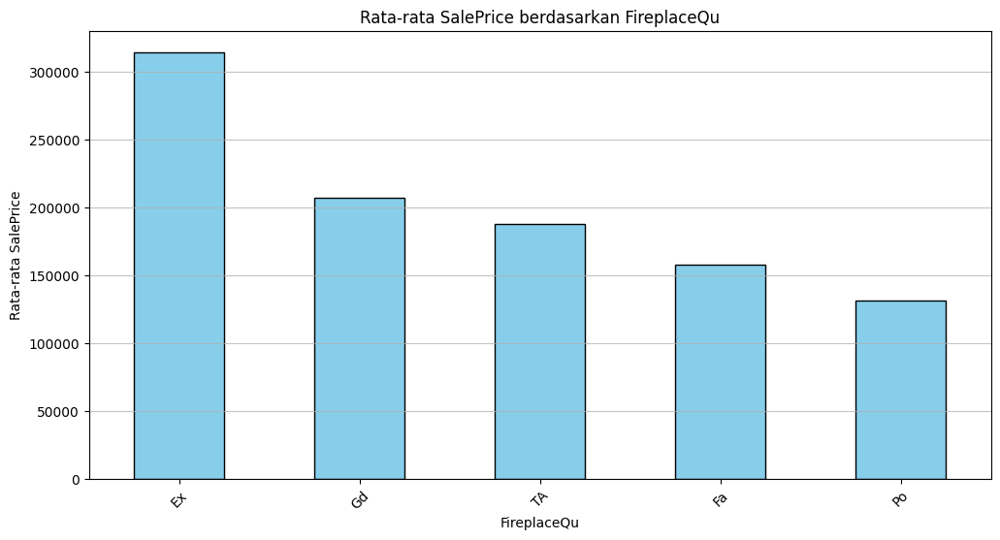

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori FireplaceQu
average_saleprice = df_train.groupby('FireplaceQu')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan FireplaceQu')
plt.xlabel('FireplaceQu')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel FireplaceQu: 1:Po, 2:Fa, 3:Ta, 4:Gd, 5:Ex

In [ ]:
    # Fungsi untuk mengkategorikan FireplaceQu
    def kategorikan_FireplaceQu(FireplaceQu):
        if FireplaceQu == 'Po':
            return 1
        elif FireplaceQu == 'Fa':
            return 3
        elif FireplaceQu == 'TA':
            return 4
        elif FireplaceQu == 'Gd':
            return 5
        elif FireplaceQu == 'Ex':
            return 6
        else:
            return 2 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom FireplaceQu
    df_train['FireplaceQu_Cat'] = df_train['FireplaceQu'].apply(kategorikan_FireplaceQu)

    # Menampilkan hasil
    print(df_train[['FireplaceQu', 'FireplaceQu_Cat']].head())

  FireplaceQu  FireplaceQu_Cat
0         NaN                2
1          TA                4
2          TA                4
3          Gd                5
4          TA                4


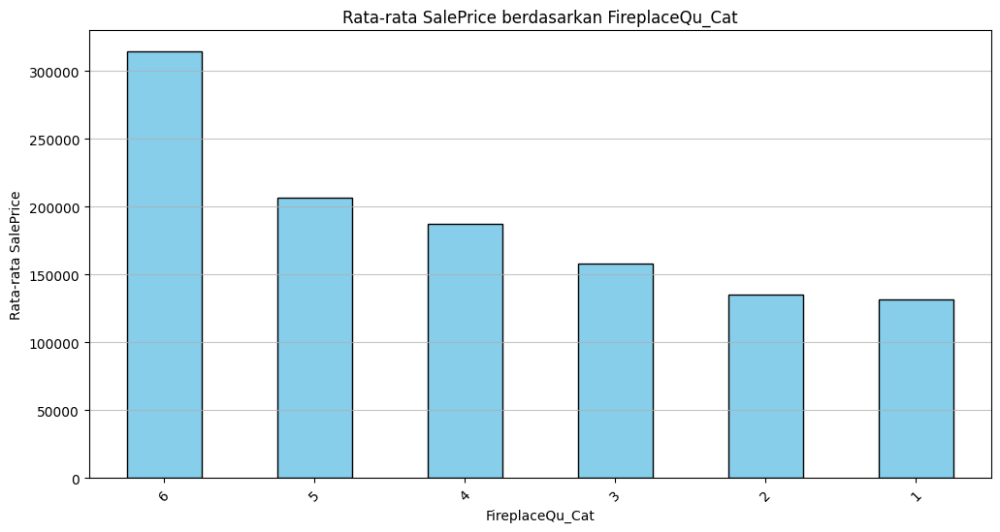

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori FireplaceQu_Cat
average_saleprice = df_train.groupby('FireplaceQu_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan FireplaceQu_Cat')
plt.xlabel('FireplaceQu_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **GarageTyp**e: Garage location >> merujuk pada lokasi atau jenis garasi dalam sebuah bangunan. Ini mencakup informasi tentang di mana garasi tersebut berada dan bagaimana garasi tersebut terhubung dengan rumah

In [ ]:
df_train['GarageType'].unique()

array(['Attchd', 'Detchd', 'BuiltIn', 'CarPort', nan, 'Basment', '2Types'],
      dtype=object)

In [ ]:
# Menghitung jumlah missing values pada Condition1
missing_values_count = df_train['GarageType'].isnull().sum()
print(f'Jumlah missing values pada variabel GarageType: {missing_values_count}')

Jumlah missing values pada variabel GarageType: 81


In [ ]:
df_train['GarageType'].value_counts()

,count
GarageType,
Attchd,870
Detchd,387
BuiltIn,88
Basment,19
CarPort,9
2Types,6


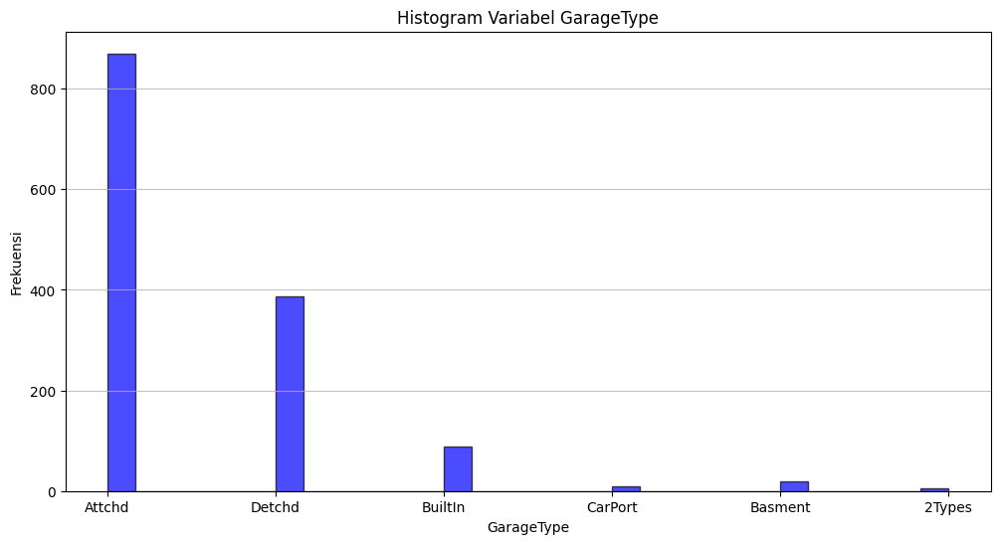

In [ ]:
# Membuat histogram untuk variabel GarageType
plt.figure(figsize=(12, 6))
plt.hist(df_train['GarageType'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel GarageType')
plt.xlabel('GarageType')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

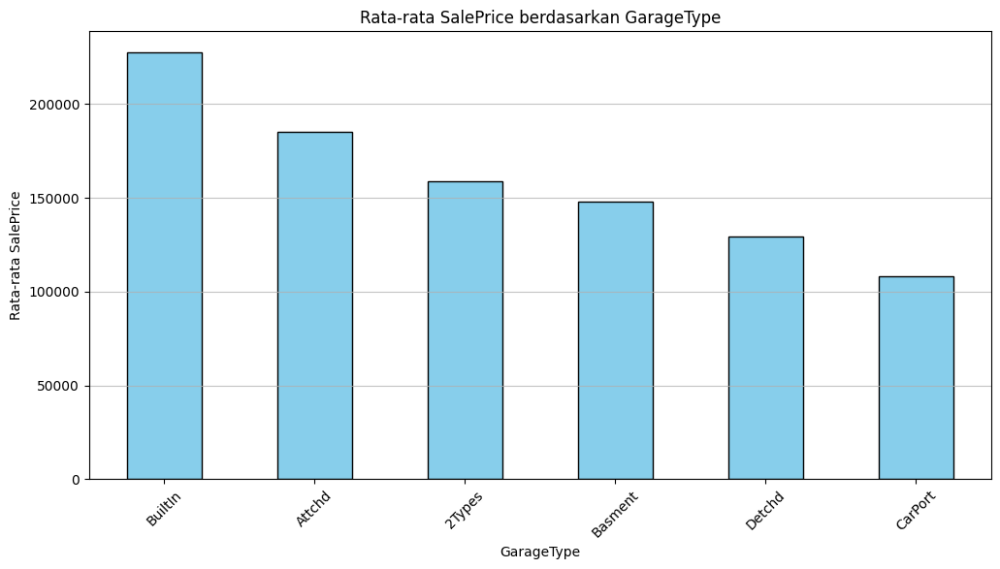

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori GarageType
average_saleprice = df_train.groupby('GarageType')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan GarageType')
plt.xlabel('GarageType')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel GarageType: 1:CarPort, 2:Detchd, 3:Basement, 4:2Types, 5:Attchd, 6: BuiltIn

In [ ]:
    # Fungsi untuk mengkategorikan GarageType
    def kategorikan_GarageType(GarageType):
        if GarageType == 'CarPort':
            return 2
        elif GarageType == 'Detchd':
            return 3
        elif GarageType == 'Basment':
            return 4
        elif GarageType == '2Types':
            return 5
        elif GarageType == 'Attchd':
            return 6
        elif GarageType == 'BuiltIn':
            return 7
        else:
            return 1 #'Tidak Diketahui'

    # Menerapkan fungsi ke kolom GarageType
    df_train['GarageType_Cat'] = df_train['GarageType'].apply(kategorikan_GarageType)

    # Menampilkan hasil
    print(df_train[['GarageType', 'GarageType_Cat']].head())

  GarageType  GarageType_Cat
0     Attchd               6
1     Attchd               6
2     Attchd               6
3     Detchd               3
4     Attchd               6


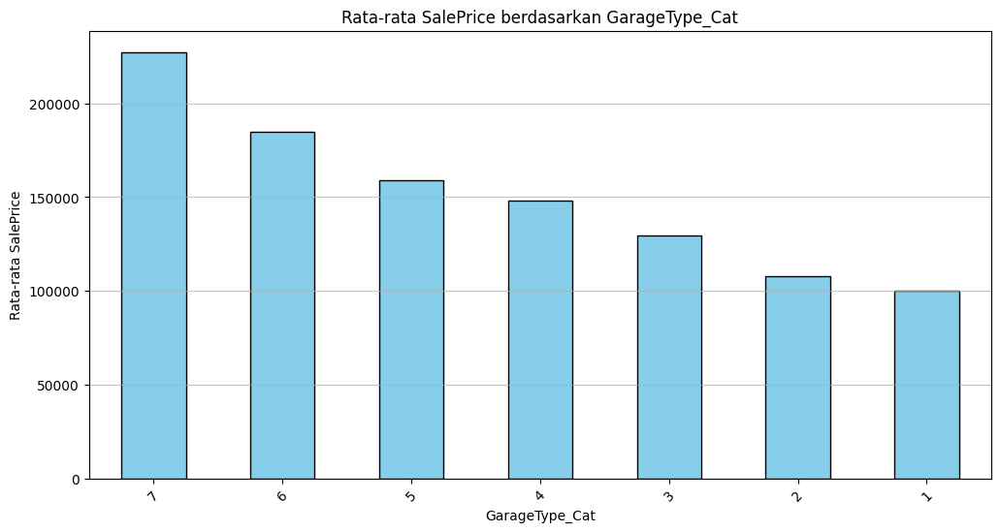

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori GarageType_Cat
average_saleprice = df_train.groupby('GarageType_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan GarageType_Cat')
plt.xlabel('GarageType_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **GarageYrBlt**: Year garage was built >> merujuk pada tahun di mana garasi dibangun


In [ ]:
df_train['GarageYrBlt'].unique()

array([2003., 1976., 2001., 1998., 2000., 1993., 2004., 1973., 1931.,
       1939., 1965., 2005., 1962., 2006., 1960., 1991., 1970., 1967.,
       1958., 1930., 2002., 1968., 2007., 2008., 1957., 1920., 1966.,
       1959., 1995., 1954., 1953.,   nan, 1983., 1977., 1997., 1985.,
       1963., 1981., 1964., 1999., 1935., 1990., 1945., 1987., 1989.,
       1915., 1956., 1948., 1974., 2009., 1950., 1961., 1921., 1900.,
       1979., 1951., 1969., 1936., 1975., 1971., 1923., 1984., 1926.,
       1955., 1986., 1988., 1916., 1932., 1972., 1918., 1980., 1924.,
       1996., 1940., 1949., 1994., 1910., 1978., 1982., 1992., 1925.,
       1941., 2010., 1927., 1947., 1937., 1942., 1938., 1952., 1928.,
       1922., 1934., 1906., 1914., 1946., 1908., 1929., 1933.])

In [ ]:
# Menghitung jumlah missing values pada GarageYrBlt
missing_values_count = df_train['GarageYrBlt'].isnull().sum()
print(f'Jumlah missing values pada variabel GarageYrBlt: {missing_values_count}')

Jumlah missing values pada variabel GarageYrBlt: 81


In [ ]:
df_train['GarageYrBlt'].value_counts()

,count
GarageYrBlt,
2005.0,65
2006.0,59
2004.0,53
2003.0,50
2007.0,49
...,...
1900.0,1
1927.0,1
1906.0,1


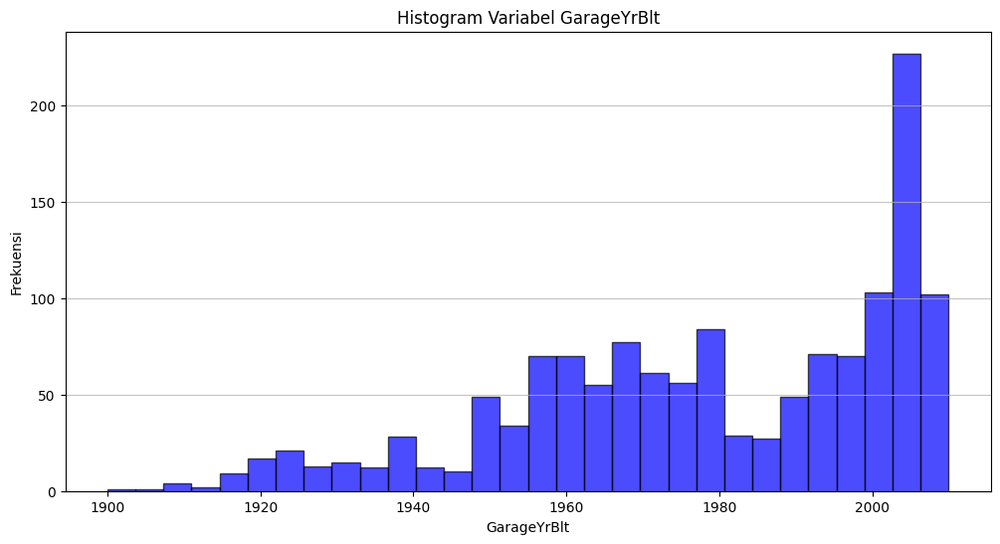

In [ ]:
# Membuat histogram untuk variabel GarageYrBlt
plt.figure(figsize=(12, 6))
plt.hist(df_train['GarageYrBlt'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel GarageYrBlt')
plt.xlabel('GarageYrBlt')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

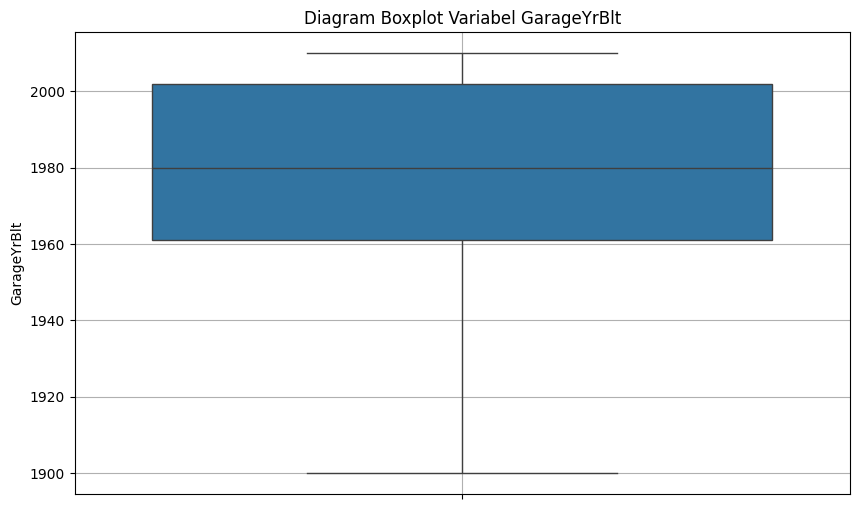

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Membuat boxplot untuk variabel GarageYrBlt
plt.figure(figsize=(10, 6))
sns.boxplot(y='GarageYrBlt', data=df_train)
plt.title('Diagram Boxplot Variabel GarageYrBlt')
plt.ylabel('GarageYrBlt')
plt.grid()
plt.show()

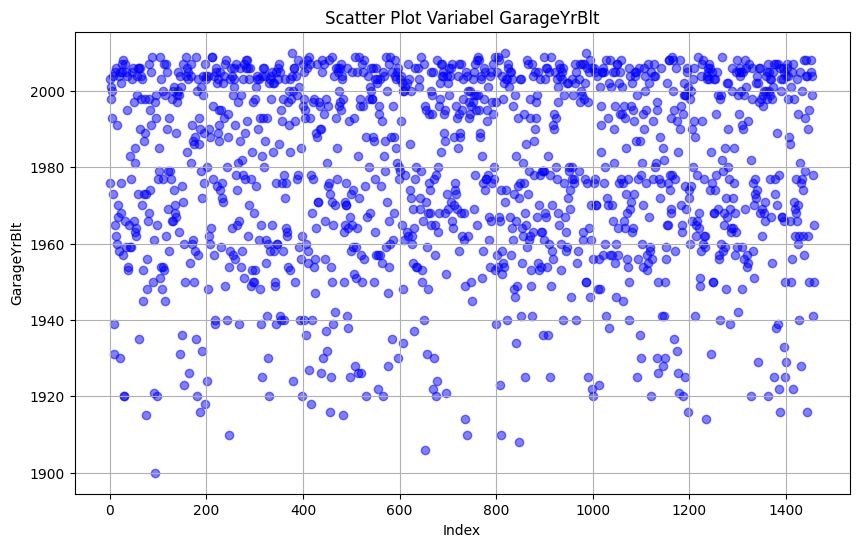

In [ ]:
# Membuat scatter plot untuk variabel GarageYrBlt
plt.figure(figsize=(10, 6))
plt.scatter(df_train.index, df_train['GarageYrBlt'], color='blue', alpha=0.5)
plt.title('Scatter Plot Variabel GarageYrBlt')
plt.xlabel('Index')
plt.ylabel('GarageYrBlt')
plt.grid()
plt.show()

In [ ]:
statistik_deskriptif = df_train ['GarageYrBlt'].describe()
print(statistik_deskriptif)

count    1379.000000
mean     1978.506164
std        24.689725
min      1900.000000
25%      1961.000000
50%      1980.000000
75%      2002.000000
max      2010.000000
Name: GarageYrBlt, dtype: float64


In [ ]:
df_train['GarageYrBlt'].median()

1980.0

EDA untuk variabel GarageYrBlt>> Handling missing value, missing value diisi dengan median

In [ ]:
# Menampilkan jumlah missing values sebelum penanganan
print("Jumlah missing values sebelum penanganan:")
print(df_train['GarageYrBlt'].isnull().sum())

# Mengisi missing values dengan rata-rata GarageYrBlt
median_lot_GarageYrBlt = df_train['GarageYrBlt'].mean()
df_train['GarageYrBlt_Filled_MV'] = df_train['GarageYrBlt'].fillna(median_lot_GarageYrBlt)

# Menampilkan jumlah missing values setelah penanganan
print("\nJumlah missing values setelah penanganan:")
print(df_train['GarageYrBlt_Filled_MV'].isnull().sum())

Jumlah missing values sebelum penanganan:
81

Jumlah missing values setelah penanganan:
0


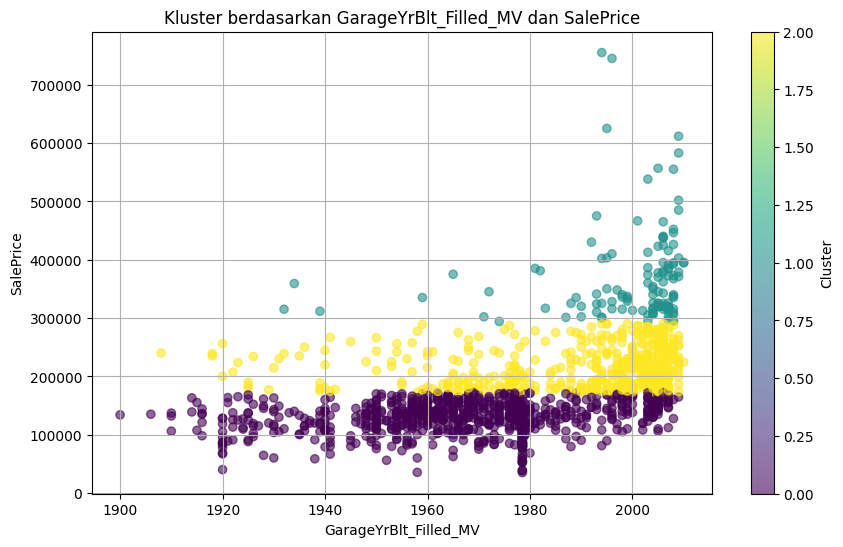

         GarageYrBlt_Filled_MV      SalePrice
Cluster                                      
0                  1967.345170  129105.011236
1                  1999.308333  372625.941667
2                  1990.461073  215244.376623


In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Memilih variabel yang akan digunakan untuk klustering
X = df_train[['GarageYrBlt_Filled_MV', 'SalePrice']]

# Menghapus baris dengan nilai yang hilang
X = X.dropna()

# Menggunakan KMeans untuk mengelompokkan data
kmeans = KMeans(n_clusters=3, random_state=0)  # Menggunakan 3 cluster sebagai contoh
X['Cluster'] = kmeans.fit_predict(X)

# Menampilkan hasil klustering
plt.figure(figsize=(10, 6))
plt.scatter(X['GarageYrBlt_Filled_MV'], X['SalePrice'], c=X['Cluster'], cmap='viridis', alpha=0.6)
plt.title('Kluster berdasarkan GarageYrBlt_Filled_MV dan SalePrice')
plt.xlabel('GarageYrBlt_Filled_MV')
plt.ylabel('SalePrice')
plt.colorbar(label='Cluster')
plt.grid()
plt.show()

# Menampilkan informasi cluster
print(X.groupby('Cluster').mean())


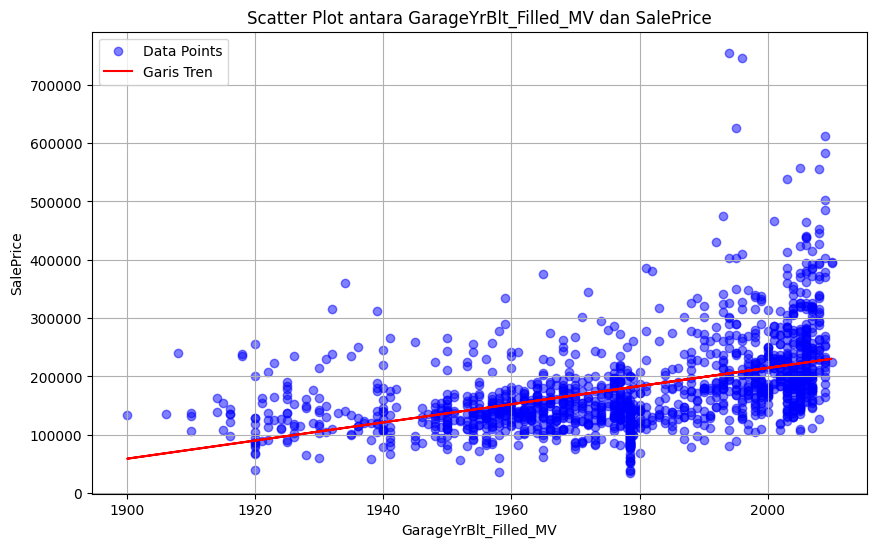

In [ ]:
# menampilkan scatter plot variabelGarageYrBlt_Filled_MV dengan variabel SalePrice dan line plot nya
# Menghapus baris dengan nilai yang hilang pada GarageYrBlt_Filled_MV dan SalePrice
data = df_train.dropna(subset=['GarageYrBlt_Filled_MV', 'SalePrice'])

# Membuat scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(data['GarageYrBlt_Filled_MV'], data['SalePrice'], color='blue', alpha=0.5, label='Data Points')

# Menghitung dan menambahkan garis tren
z = np.polyfit(data['GarageYrBlt_Filled_MV'], data['SalePrice'], 1)
p = np.poly1d(z)
plt.plot(data['GarageYrBlt_Filled_MV'], p(data['GarageYrBlt_Filled_MV']), color='red', label='Garis Tren')

# Menambahkan judul dan label
plt.title('Scatter Plot antara GarageYrBlt_Filled_MV dan SalePrice')
plt.xlabel('GarageYrBlt_Filled_MV')
plt.ylabel('SalePrice')
plt.legend()
plt.grid()
plt.show()



In [ ]:
# Menghitung korelasi antara GarageYrBlt_Filled_MV dan SalePrice
korelasi = df_train['GarageYrBlt_Filled_MV'].corr(df_train['SalePrice'])
print(f'Korelasi antara GarageYrBlt_Filled_MV dan SalePrice: {korelasi}')

Korelasi antara GarageYrBlt_Filled_MV dan SalePrice: 0.4701774537404798


EDA untuk variabel **GarageFinish**: Interior finish of the garage >> merujuk pada penyelesaian interior garasi, yaitu bagaimana dinding, lantai, dan elemen lain di dalam garasi dirancang dan diselesaikan

In [ ]:
df_train['GarageFinish'].unique()

array(['RFn', 'Unf', 'Fin', nan], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada GarageFinish
missing_values_count = df_train['GarageFinish'].isnull().sum()
print(f'Jumlah missing values pada variabel GarageFinish: {missing_values_count}')

Jumlah missing values pada variabel GarageFinish: 81


In [ ]:
df_train['GarageFinish'].value_counts()

,count
GarageFinish,
Unf,605
RFn,422
Fin,352


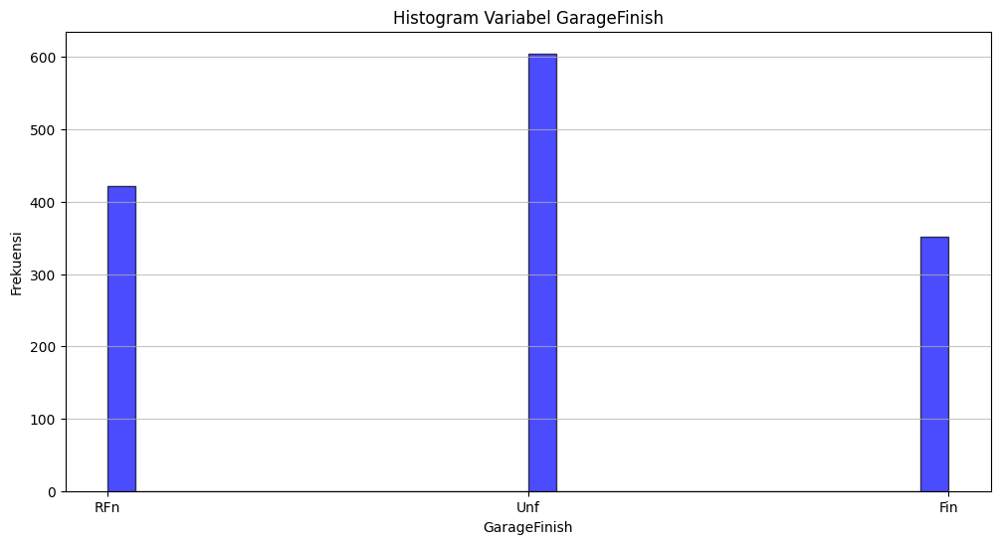

In [ ]:
# Membuat histogram untuk variabel GarageFinish
plt.figure(figsize=(12, 6))
plt.hist(df_train['GarageFinish'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel GarageFinish')
plt.xlabel('GarageFinish')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

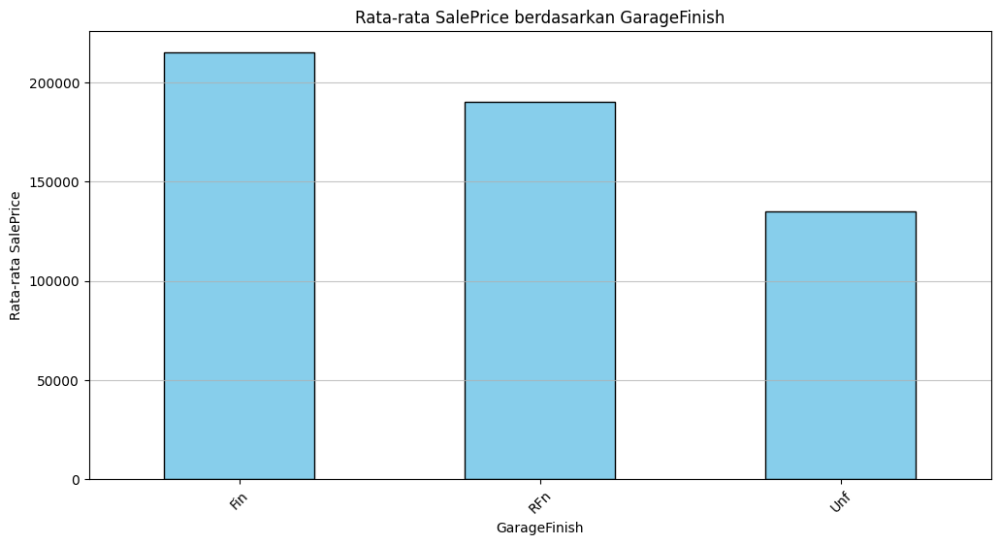

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori GarageFinish
average_saleprice = df_train.groupby('GarageFinish')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan GarageFinish')
plt.xlabel('GarageFinish')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel GarageFinish: 1: Nan, 2:Unf, 3:RFn, 4:Fin

In [ ]:
    # Fungsi untuk mengkategorikan GarageFinish
    def kategorikan_GarageFinish(GarageFinish):
        if GarageFinish == 'Unf':
            return 2
        elif GarageFinish == 'RFn':
            return 3
        elif GarageFinish == 'Fin':
            return 4
        else:
            return 1

    # Menerapkan fungsi ke kolom GarageFinish
    df_train['GarageFinish_Cat'] = df_train['GarageFinish'].apply(kategorikan_GarageFinish)

    # Menampilkan hasil
    print(df_train[['GarageFinish', 'GarageFinish_Cat']].head())



  GarageFinish  GarageFinish_Cat
0          RFn                 3
1          RFn                 3
2          RFn                 3
3          Unf                 2
4          RFn                 3


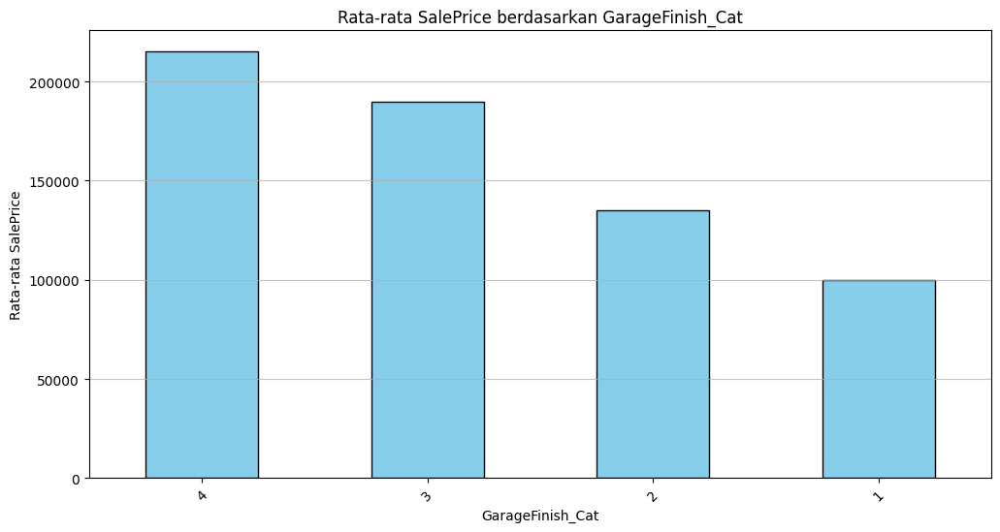

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori GarageFinish_Cat
average_saleprice = df_train.groupby('GarageFinish_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan GarageFinish_Cat')
plt.xlabel('GarageFinish_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **GarageCars**: Size of garage in car capacity

EDA untuk variabel **GarageArea**: Size of garage in square feet

EDA untuk variabel **GarageQual**: Garage quality >> kualitas

In [ ]:
df_train['GarageQual'].unique()

array(['TA', 'Fa', 'Gd', nan, 'Ex', 'Po'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada Condition1
missing_values_count = df_train['GarageQual'].isnull().sum()
print(f'Jumlah missing values pada variabelGarageQual: {missing_values_count}')

Jumlah missing values pada variabelGarageQual: 81


In [ ]:
df_train['GarageQual'].value_counts()

,count
GarageQual,
TA,1311
Fa,48
Gd,14
Ex,3
Po,3


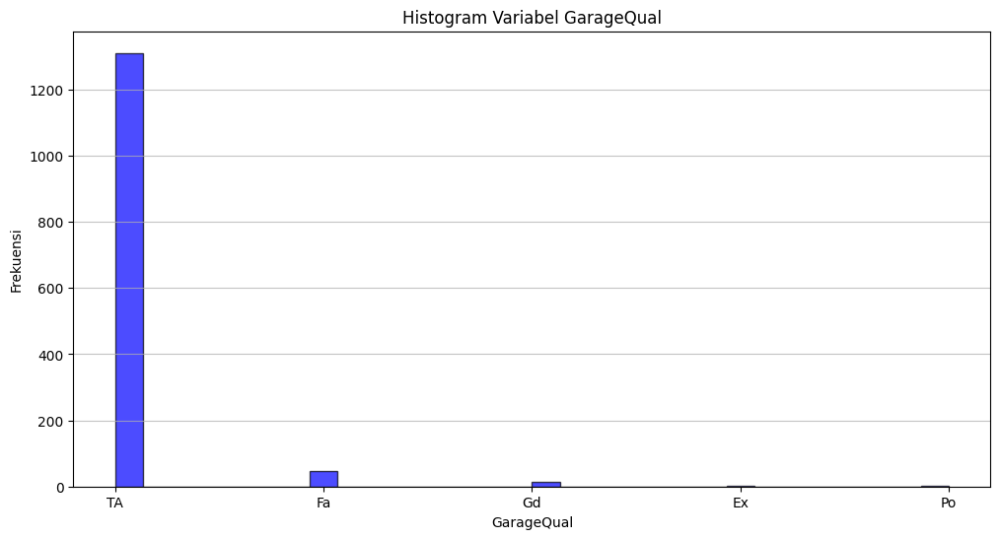

In [ ]:
# Membuat histogram untuk variabel GarageQual
plt.figure(figsize=(12, 6))
plt.hist(df_train['GarageQual'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel GarageQual')
plt.xlabel('GarageQual')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

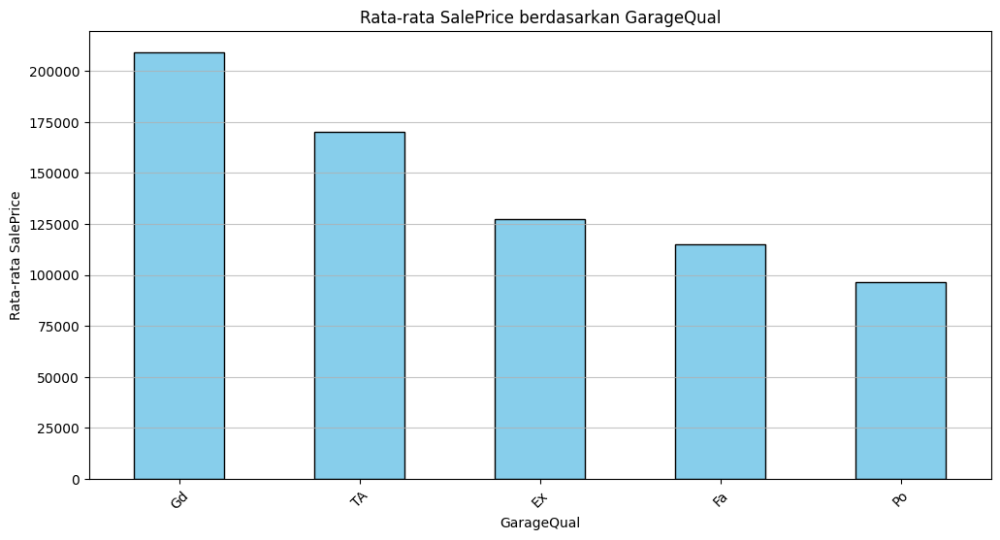

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori GarageQual
average_saleprice = df_train.groupby('GarageQual')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan GarageQual')
plt.xlabel('GarageQual')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel GarageQual: 1: Po, 2:Na, 3:Fa, 4:Ex, 5:TA, 6:Gd

In [ ]:
    # Fungsi untuk mengkategorikan GarageQual
    def kategorikan_GarageQual(GarageQual):
        if GarageQual == 'Po':
            return 1
        elif GarageQual == 'Fa':
            return 3
        elif GarageQual == 'Ex':
            return 4
        elif GarageQual == 'TA':
            return 5
        elif GarageQual == 'Gd':
            return 6
        else:
            return 2

    # Menerapkan fungsi ke kolom GarageFinish
    df_train['GarageQual_Cat'] = df_train['GarageQual'].apply(kategorikan_GarageQual)

    # Menampilkan hasil
    print(df_train[['GarageQual', 'GarageQual_Cat']].head())

  GarageQual  GarageQual_Cat
0         TA               5
1         TA               5
2         TA               5
3         TA               5
4         TA               5


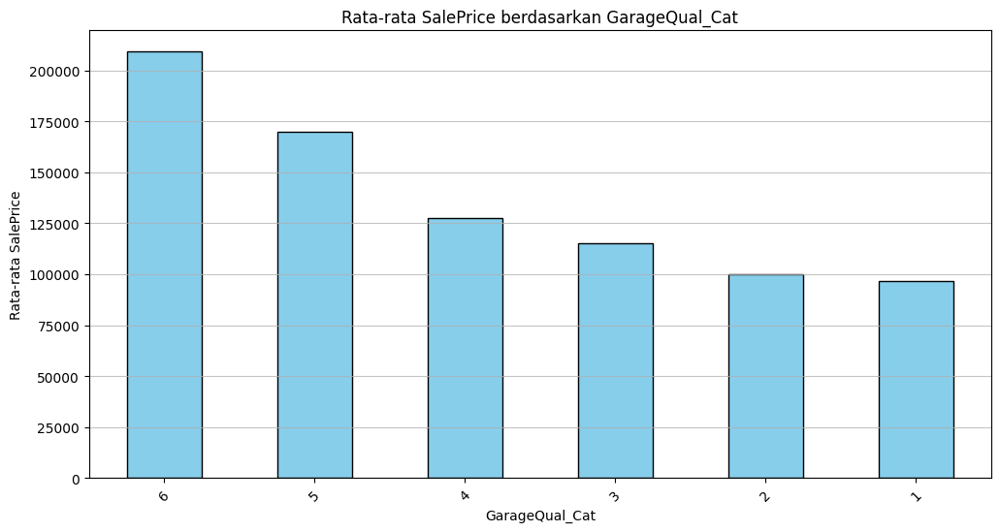

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori GarageQual_Cat
average_saleprice = df_train.groupby('GarageQual_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan GarageQual_Cat')
plt.xlabel('GarageQual_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **GarageCond**: Garage condition >> kondisi

In [ ]:
df_train['GarageCond'].unique()

array(['TA', 'Fa', nan, 'Gd', 'Po', 'Ex'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada GarageCond
missing_values_count = df_train['GarageCond'].isnull().sum()
print(f'Jumlah missing values pada variabel GarageCond: {missing_values_count}')

Jumlah missing values pada variabel GarageCond: 81


In [ ]:
df_train['GarageCond'].value_counts()

,count
GarageCond,
TA,1326
Fa,35
Gd,9
Po,7
Ex,2


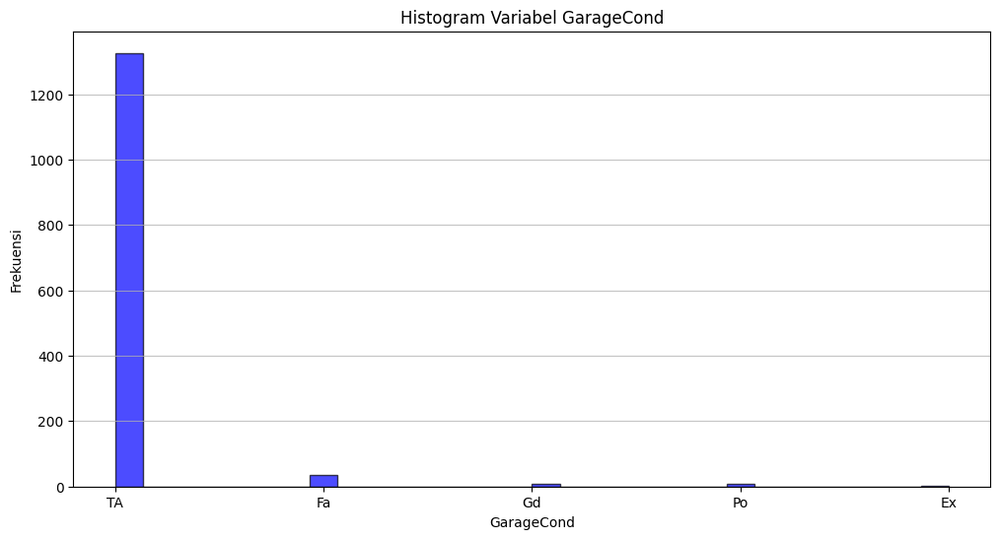

In [ ]:
# Membuat histogram untuk variabel GarageCond
plt.figure(figsize=(12, 6))
plt.hist(df_train['GarageCond'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel GarageCond')
plt.xlabel('GarageCond')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

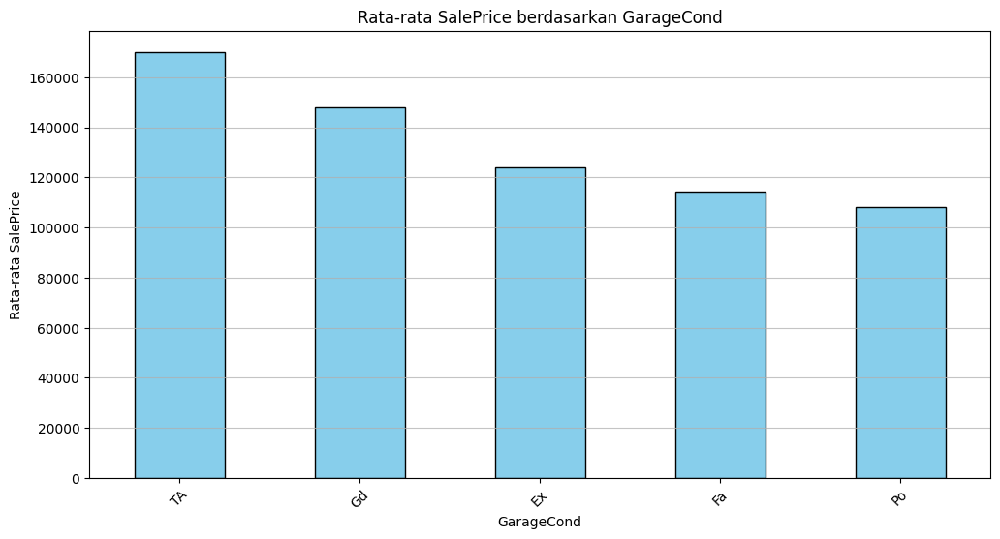

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori GarageCond
average_saleprice = df_train.groupby('GarageCond')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan GarageCond')
plt.xlabel('GarageCond')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel GarageCond: 1: Po, 2:Na, 3:Fa, 4:Ex, 5:Gd, 6:TA

In [ ]:
    # Fungsi untuk mengkategorikan GarageCond
    def kategorikan_GarageCond(GarageCond):
        if GarageCond == 'Po':
            return 1
        elif GarageCond == 'Fa':
            return 3
        elif GarageCond == 'Ex':
            return 4
        elif GarageCond == 'Gd':
            return 5
        elif GarageCond == 'TA':
            return 6
        else:
            return 2

    # Menerapkan fungsi ke kolom GarageCond
    df_train['GarageCond_Cat'] = df_train['GarageCond'].apply(kategorikan_GarageCond)

    # Menampilkan hasil
    print(df_train[['GarageCond', 'GarageCond_Cat']].head())

  GarageCond  GarageCond_Cat
0         TA               6
1         TA               6
2         TA               6
3         TA               6
4         TA               6


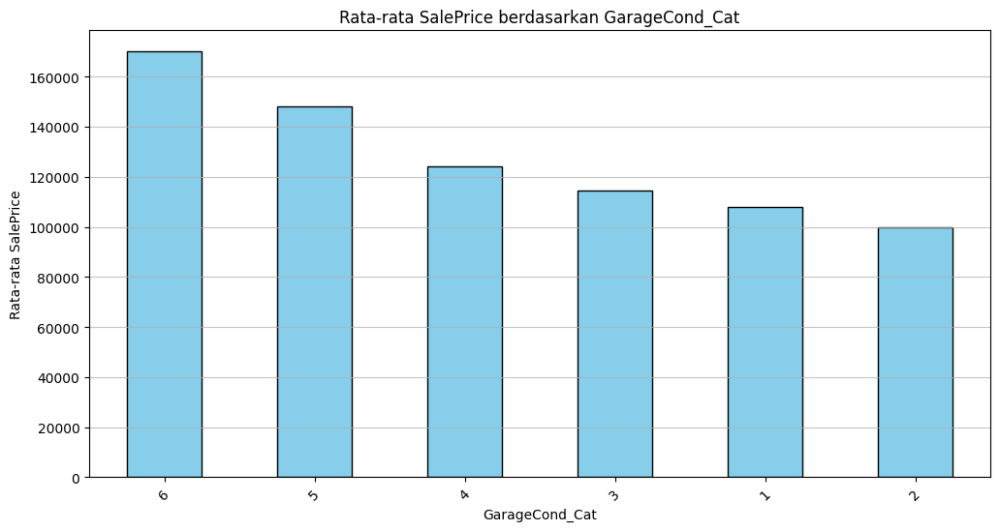

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori GarageCond_Cat
average_saleprice = df_train.groupby('GarageCond_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan GarageCond_Cat')
plt.xlabel('GarageCond_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **PavedDrive**: Paved driveway

In [ ]:
df_train['PavedDrive'].unique()

array(['Y', 'N', 'P'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada PavedDrive
missing_values_count = df_train['PavedDrive'].isnull().sum()
print(f'Jumlah missing values pada variabel PavedDrive: {missing_values_count}')

Jumlah missing values pada variabel PavedDrive: 0


In [ ]:
df_train['PavedDrive'].value_counts()

,count
PavedDrive,
Y,1340
N,90
P,30


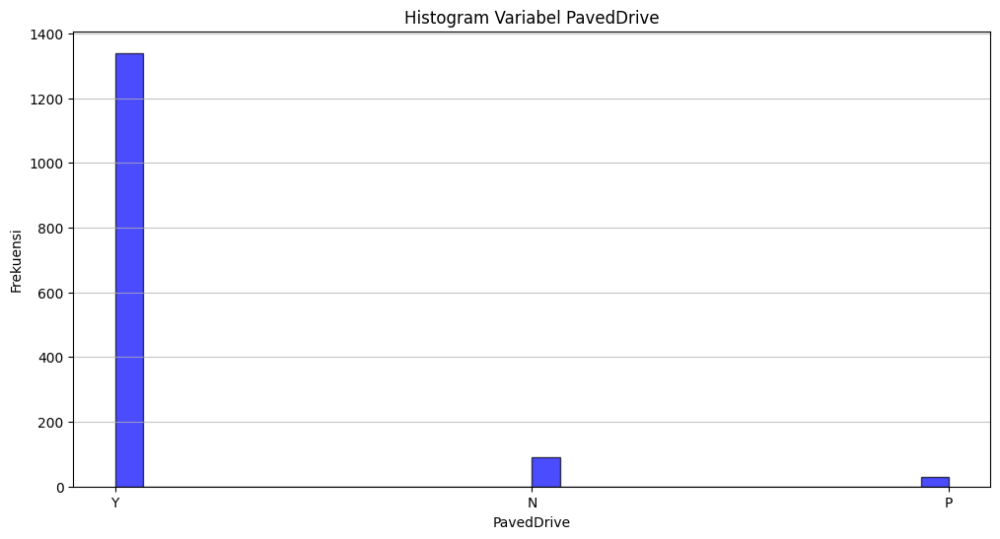

In [ ]:
# Membuat histogram untuk variabel PavedDrive
plt.figure(figsize=(12, 6))
plt.hist(df_train['PavedDrive'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel PavedDrive')
plt.xlabel('PavedDrive')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

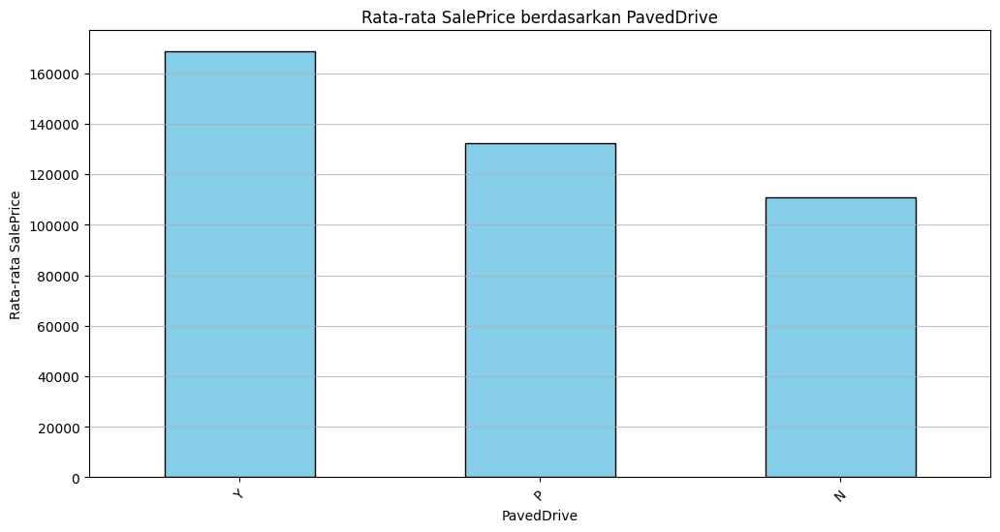

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori PavedDrive
average_saleprice = df_train.groupby('PavedDrive')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan PavedDrive')
plt.xlabel('PavedDrive')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel PavedDrive: 1: N, 2:P, 3:Y

In [ ]:
    # Fungsi untuk mengkategorikan PavedDrive
    def kategorikan_PavedDrive(PavedDrive):
        if PavedDrive == 'N':
            return 1
        elif PavedDrive == 'P':
            return 2
        elif PavedDrive == 'Y':
            return 3
        else:
            return 0

    # Menerapkan fungsi ke kolom PavedDrive
    df_train['PavedDrive_Cat'] = df_train['PavedDrive'].apply(kategorikan_PavedDrive)

    # Menampilkan hasil
    print(df_train[['PavedDrive', 'PavedDrive_Cat']].head())

  PavedDrive  PavedDrive_Cat
0          Y               3
1          Y               3
2          Y               3
3          Y               3
4          Y               3


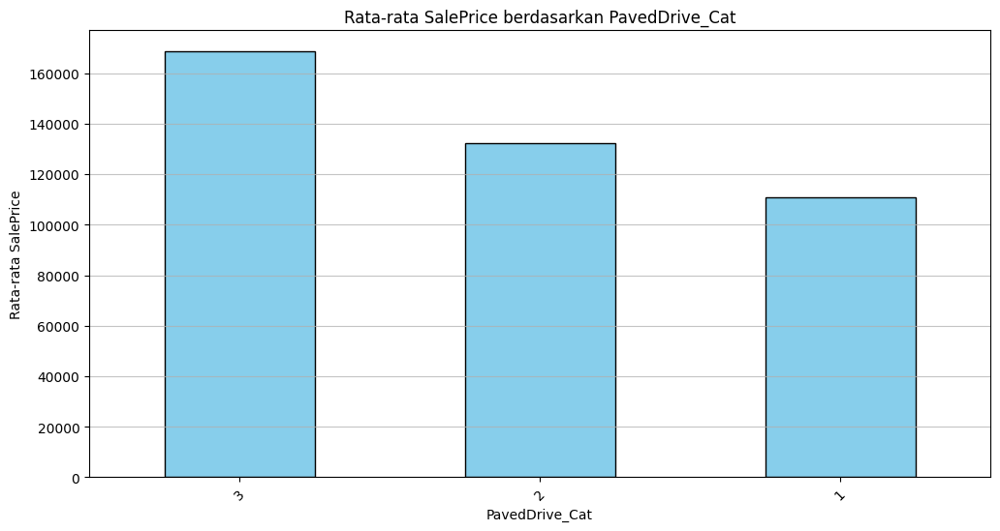

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori PavedDrive_Cat
average_saleprice = df_train.groupby('PavedDrive_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan PavedDrive_Cat')
plt.xlabel('PavedDrive_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **WoodDeckSF**: Wood deck area in square feet

EDA untuk variabel **OpenPorchSF**: Open porch area in square feet

EDA untuk variabel **EnclosedPorch**: Enclosed porch area in square feet

EDA untuk variabel **3SsnPorch**: Three season porch area in square feet

EDA untuk variabel **ScreenPorch**: Screen porch area in square feet


EDA untuk variabel **PoolArea**: Pool area in square feet

EDA untuk variabel **PoolQC**: Pool quality >> kualitas kolam renang

In [ ]:
df_train['PoolQC'].unique()

array([nan, 'Ex', 'Fa', 'Gd'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada PoolQC
missing_values_count = df_train['PoolQC'].isnull().sum()
print(f'Jumlah missing values pada variabel PoolQC: {missing_values_count}')

Jumlah missing values pada variabel PoolQC: 1453


In [ ]:
df_train['PoolQC'].value_counts()

,count
PoolQC,
Gd,3
Ex,2
Fa,2


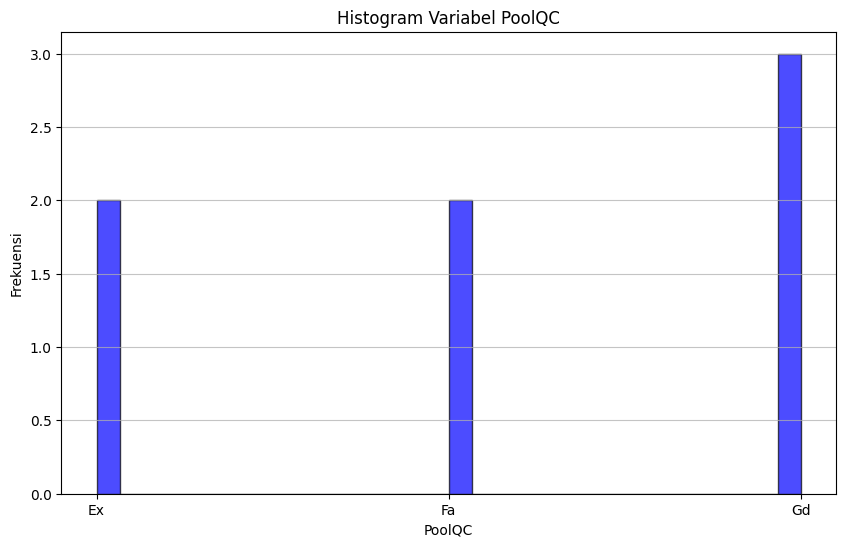

In [ ]:
# Membuat histogram untuk variabel PoolQC
plt.figure(figsize=(10, 6))
plt.hist(df_train['PoolQC'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel PoolQC')
plt.xlabel('PoolQC')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

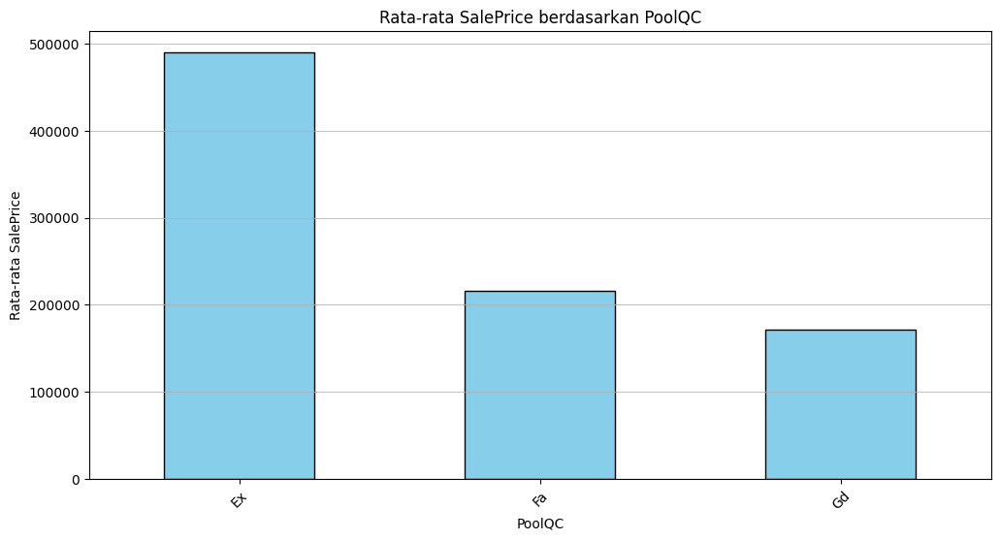

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori PoolQC
average_saleprice = df_train.groupby('PoolQC')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan PoolQC')
plt.xlabel('PoolQC')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel PoolQC: 1: Na, 2: Gd, 3:Fa, 4:Ex

In [ ]:
    # Fungsi untuk mengkategorikan PoolQC
    def kategorikan_PoolQC(PoolQC):
        if PoolQC == 'Gd':
            return 2
        elif PoolQC == 'Fa':
            return 3
        elif PoolQC == 'Ex':
            return 4
        else:
            return 1

    # Menerapkan fungsi ke kolom PavedDrive
    df_train['PoolQC_Cat'] = df_train['PoolQC'].apply(kategorikan_PoolQC)

    # Menampilkan hasil
    print(df_train[['PoolQC', 'PoolQC_Cat']].head())

  PoolQC  PoolQC_Cat
0    NaN           1
1    NaN           1
2    NaN           1
3    NaN           1
4    NaN           1


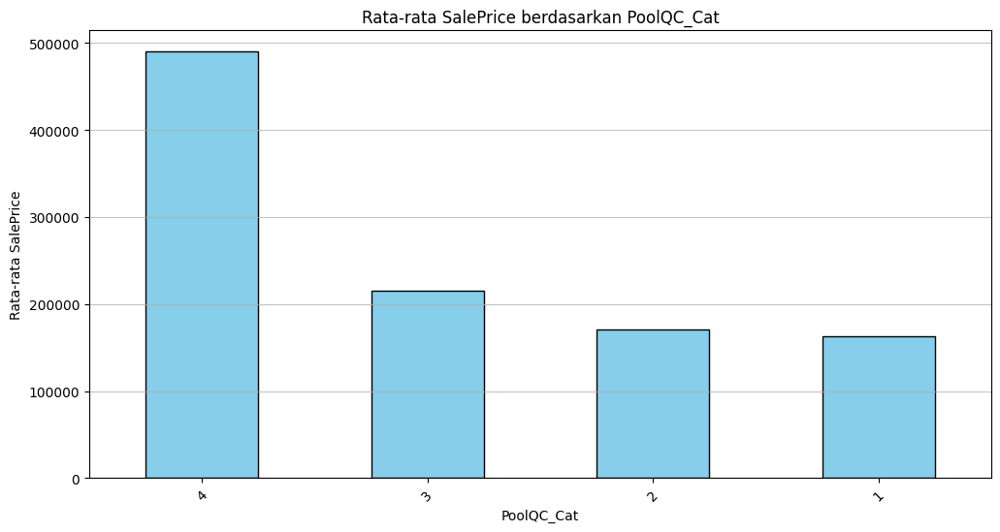

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori PoolQC_Cat
average_saleprice = df_train.groupby('PoolQC_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan PoolQC_Cat')
plt.xlabel('PoolQC_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **Fence:** Fence quality >> kualitas kolam pagar

In [ ]:
df_train['Fence'].unique()

array([nan, 'MnPrv', 'GdWo', 'GdPrv', 'MnWw'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada Fence
missing_values_count = df_train['Fence'].isnull().sum()
print(f'Jumlah missing values pada variabel Fence: {missing_values_count}')

Jumlah missing values pada variabel Fence: 1179


In [ ]:
df_train['Fence'].value_counts()

,count
Fence,
MnPrv,157
GdPrv,59
GdWo,54
MnWw,11


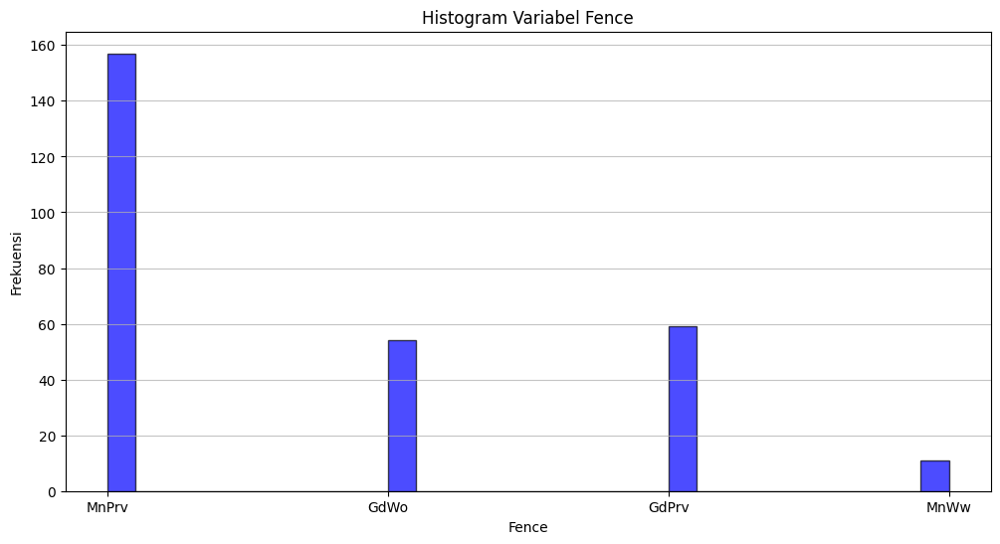

In [ ]:
# Membuat histogram untuk variabel Fence
plt.figure(figsize=(12, 6))
plt.hist(df_train['Fence'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel Fence')
plt.xlabel('Fence')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

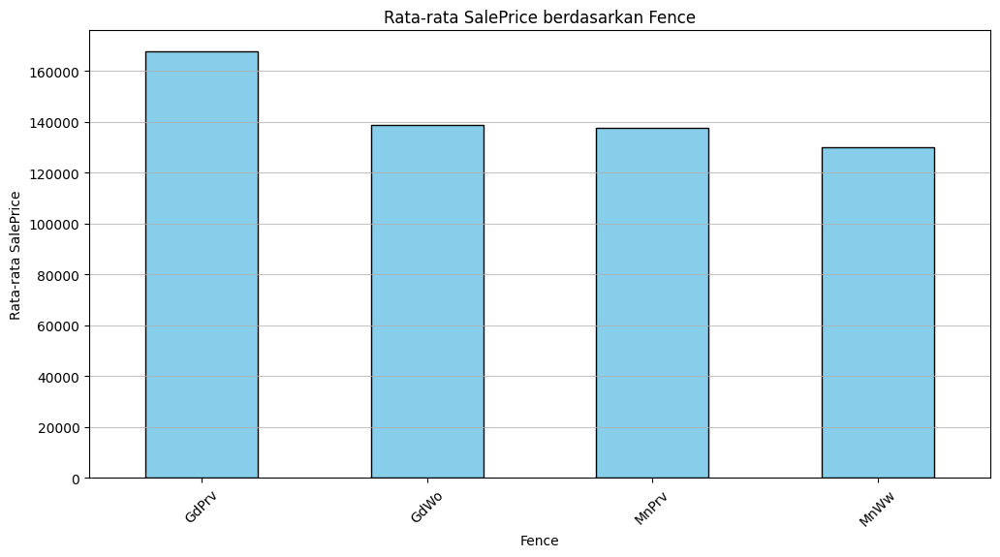

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Fence
average_saleprice = df_train.groupby('Fence')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Fence')
plt.xlabel('Fence')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel Fence: 1: MnWw, 2: MnPrv, 3:GdWo, 4:GdPrv

In [ ]:
    # Fungsi untuk mengkategorikan Fence
    def kategorikan_Fence(Fence):
        if Fence == 'MnWw':
            return 1
        elif Fence == 'MnPrv':
            return 2
        elif Fence == 'GdWo':
            return 3
        elif Fence == 'GdPrv':
            return 4
        else:
            return 5

    # Menerapkan fungsi ke kolom PavedDrive
    df_train['Fence_Cat'] = df_train['Fence'].apply(kategorikan_Fence)

    # Menampilkan hasil
    print(df_train[['Fence', 'Fence_Cat']].head())

  Fence  Fence_Cat
0   NaN          5
1   NaN          5
2   NaN          5
3   NaN          5
4   NaN          5


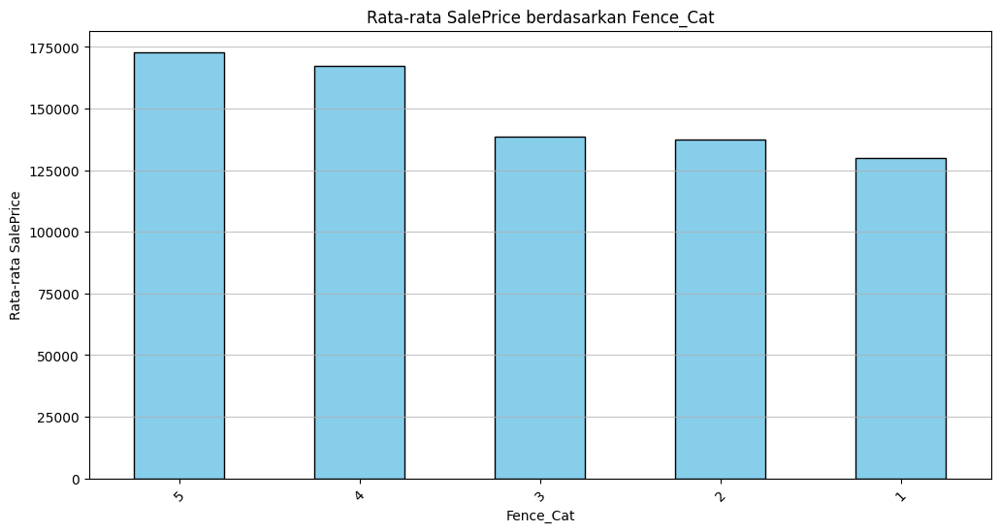

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori Fence_Cat
average_saleprice = df_train.groupby('Fence_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan Fence_Cat')
plt.xlabel('Fence_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **MiscFeature**: Miscellaneous feature not covered in other categories >> merujuk pada fitur atau elemen tambahan dalam sebuah properti yang tidak termasuk dalam kategori lain yang telah ditentukan.


In [ ]:
df_train['MiscFeature'].unique()


array([nan, 'Shed', 'Gar2', 'Othr', 'TenC'], dtype=object)

In [ ]:
# Menghitung jumlah missing values pada MiscFeature
missing_values_count = df_train['MiscFeature'].isnull().sum()
print(f'Jumlah missing values pada variabel MiscFeature: {missing_values_count}')

Jumlah missing values pada variabel MiscFeature: 1406


In [ ]:
df_train['MiscFeature'].value_counts()

,count
MiscFeature,
Shed,49
Gar2,2
Othr,2
TenC,1


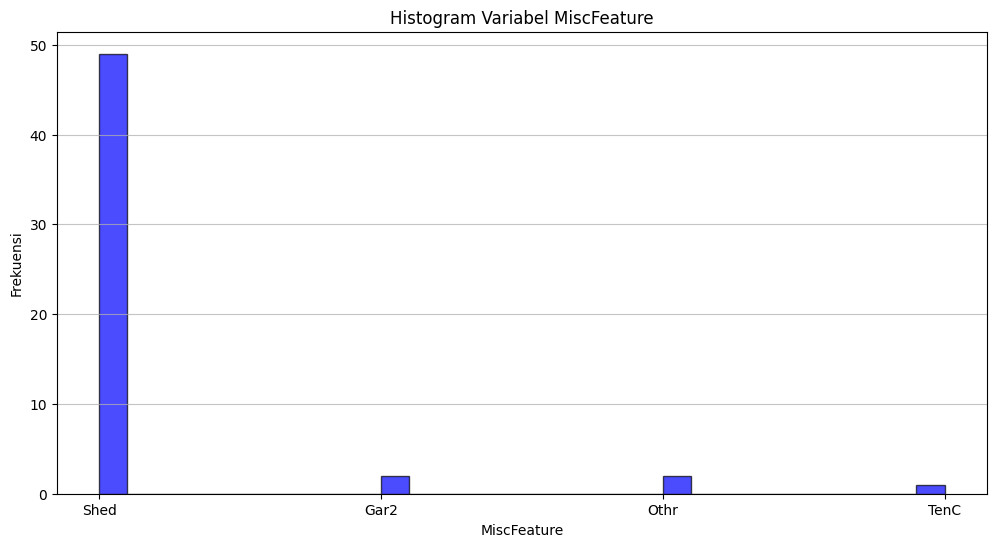

In [ ]:
# Membuat histogram untuk variabel MiscFeature
plt.figure(figsize=(12, 6))
plt.hist(df_train['MiscFeature'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel MiscFeature')
plt.xlabel('MiscFeature')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

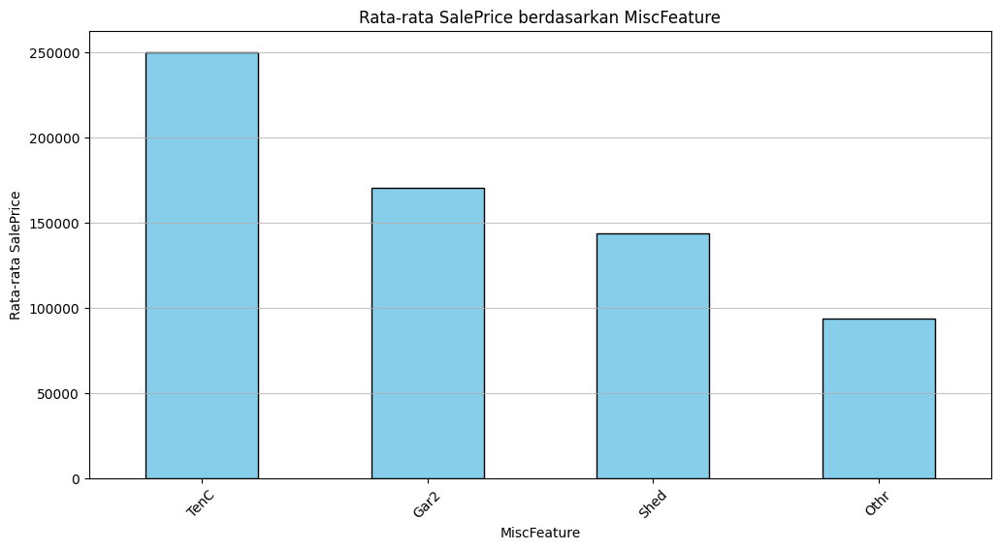

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori MiscFeature
average_saleprice = df_train.groupby('MiscFeature')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan MiscFeature')
plt.xlabel('MiscFeature')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel MiscFeature: 1: Othr, 2: Shed, 3: Nan, 4:Gar2, 5:TenC

In [ ]:
    # Fungsi untuk mengkategorikan MiscFeature
    def kategorikan_MiscFeature(MiscFeature):
        if MiscFeature == 'Othr':
            return 1
        elif MiscFeature == 'Shed':
            return 2
        elif MiscFeature == 'Gar2':
            return 4
        elif MiscFeature == 'TenC':
            return 5
        else:
            return 3

    # Menerapkan fungsi ke kolom PavedDrive
    df_train['MiscFeature_Cat'] = df_train['MiscFeature'].apply(kategorikan_MiscFeature)

    # Menampilkan hasil
    print(df_train[['MiscFeature', 'MiscFeature_Cat']].head())

  MiscFeature  MiscFeature_Cat
0         NaN                3
1         NaN                3
2         NaN                3
3         NaN                3
4         NaN                3


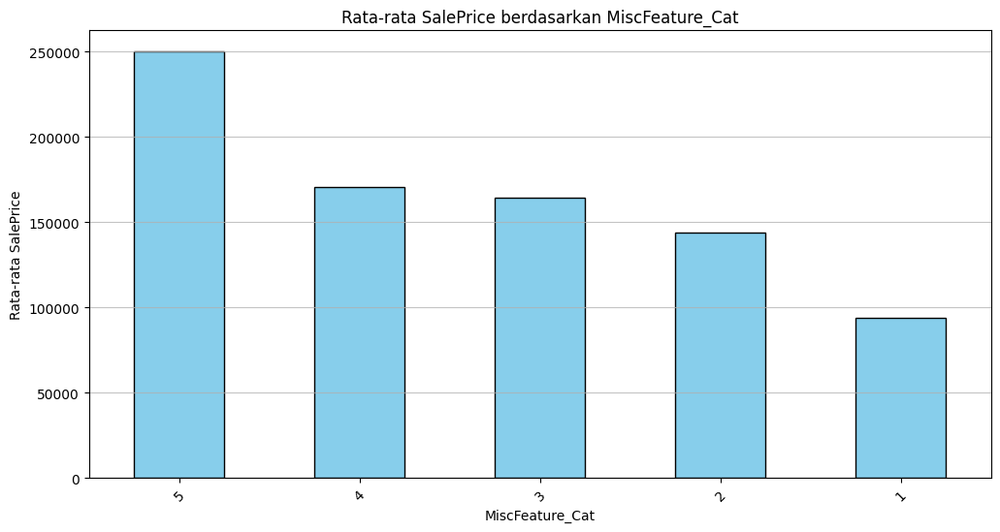

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori MiscFeature_Cat
average_saleprice = df_train.groupby('MiscFeature_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan MiscFeature_Cat')
plt.xlabel('MiscFeature_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **MiscVal**: $Value of miscellaneous feature


EDA untuk variabel **MoSold**: Month Sold (MM)

EDA untuk variabel **YrSold**: Year Sold (YYYY)


EDA untuk variabel **SaleType**: Type of sale

In [ ]:
df_train['SaleType'].unique()

array(['WD', 'New', 'COD', 'ConLD', 'ConLI', 'CWD', 'ConLw', 'Con', 'Oth'],
      dtype=object)

In [ ]:
# Menghitung jumlah missing values pada SaleType
missing_values_count = df_train['SaleType'].isnull().sum()
print(f'Jumlah missing values pada variabel SaleType: {missing_values_count}')

Jumlah missing values pada variabel SaleType: 0


In [ ]:
df_train['SaleType'].value_counts()

,count
SaleType,
WD,1267
New,122
COD,43
ConLD,9
ConLI,5
ConLw,5
CWD,4
Oth,3
Con,2


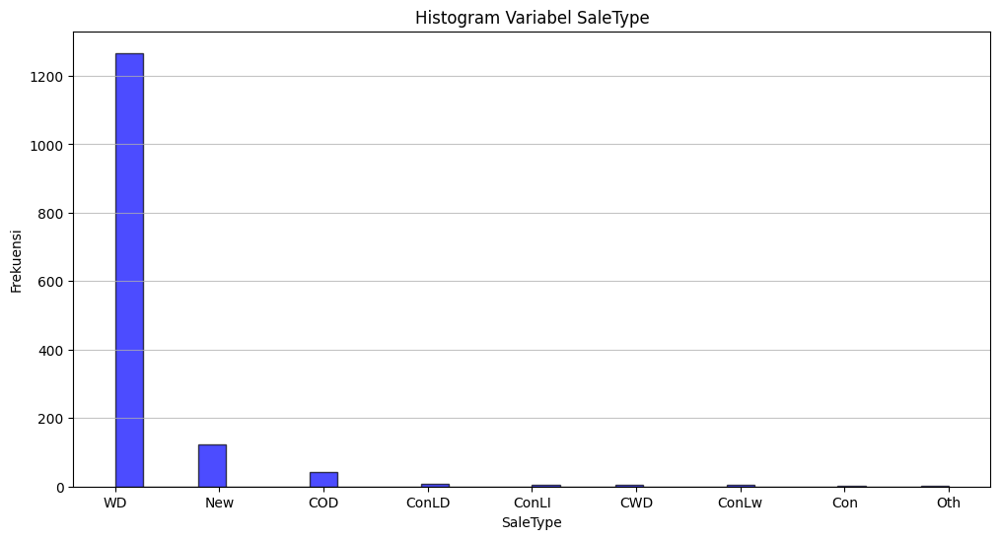

In [ ]:
# Membuat histogram untuk variabel SaleType
plt.figure(figsize=(12, 6))
plt.hist(df_train['SaleType'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel SaleType')
plt.xlabel('SaleType')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

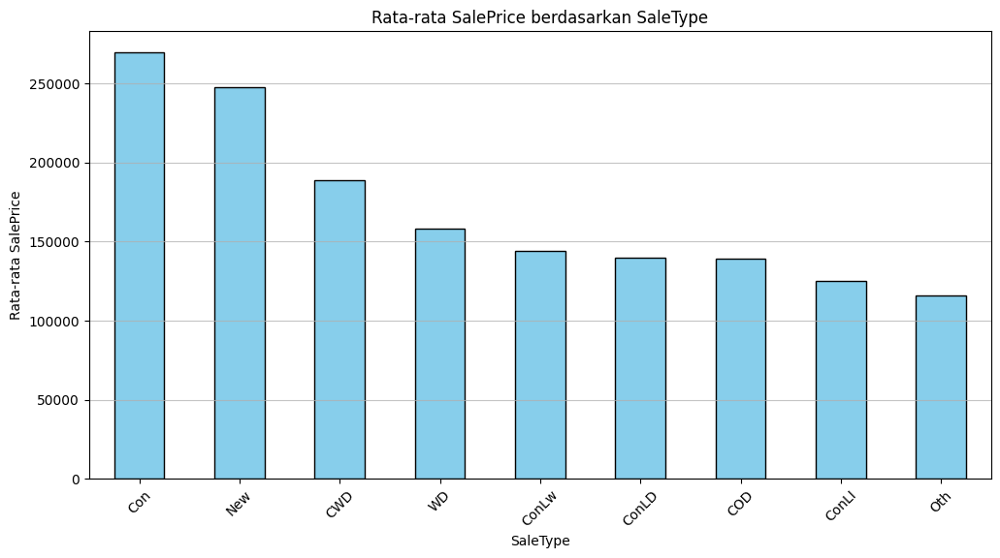

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori SaleType
average_saleprice = df_train.groupby('SaleType')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan SaleType')
plt.xlabel('SaleType')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel SaleType: 1: Othr, 2: ConLI, 3: COD, 4:ConLD, 5:ConLw, 6: WD, 7:CWD, 8:New, 9: Con

In [ ]:
    # Fungsi untuk mengkategorikan SaleType
    def kategorikan_SaleType(SaleType):
        if SaleType == 'Othr':
            return 1
        elif SaleType == 'ConLI':
            return 2
        elif SaleType == 'COD':
            return 3
        elif SaleType == 'ConLD':
            return 4
        elif SaleType == 'ConLw':
            return 5
        elif SaleType == 'WD':
            return 6
        elif SaleType == 'CWD':
            return 7
        elif SaleType == 'New':
            return 8
        elif SaleType == 'Con':
            return 9
        else:
            return 0

    # Menerapkan fungsi ke kolom PavedDrive
    df_train['SaleType_Cat'] = df_train['SaleType'].apply(kategorikan_SaleType)

    # Menampilkan hasil
    print(df_train[['SaleType', 'SaleType_Cat']].head())

  SaleType  SaleType_Cat
0       WD             6
1       WD             6
2       WD             6
3       WD             6
4       WD             6


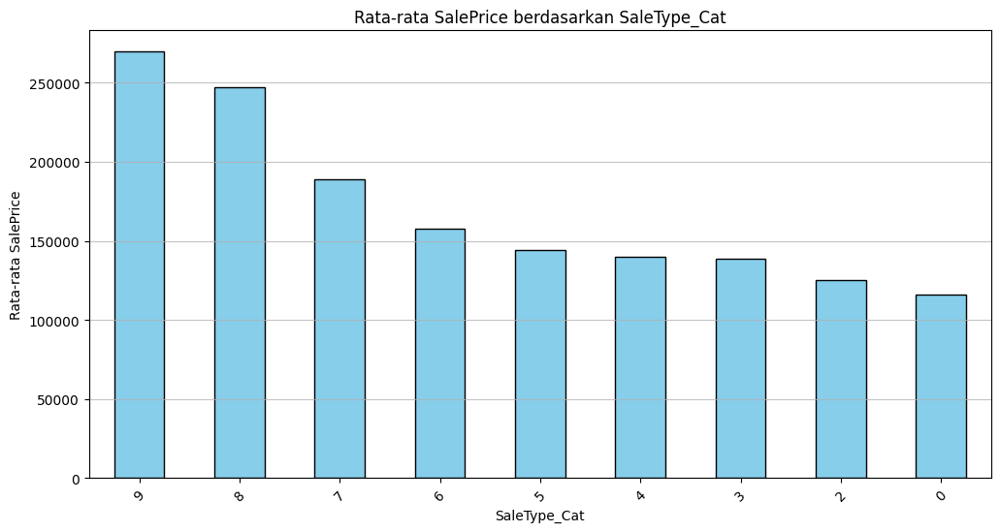

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori SaleType_Cat
average_saleprice = df_train.groupby('SaleType_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan SaleType_Cat')
plt.xlabel('SaleType_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

EDA untuk variabel **SaleConditio**n: Condition of sale

In [ ]:
df_train['SaleCondition'].unique()

array(['Normal', 'Abnorml', 'Partial', 'AdjLand', 'Alloca', 'Family'],
      dtype=object)

In [ ]:
# Menghitung jumlah missing values pada SaleCondition
missing_values_count = df_train['SaleCondition'].isnull().sum()
print(f'Jumlah missing values pada variabel SaleCondition: {missing_values_count}')

Jumlah missing values pada variabel SaleCondition: 0


In [ ]:
df_train['SaleCondition'].value_counts()

,count
SaleCondition,
Normal,1198
Partial,125
Abnorml,101
Family,20
Alloca,12
AdjLand,4


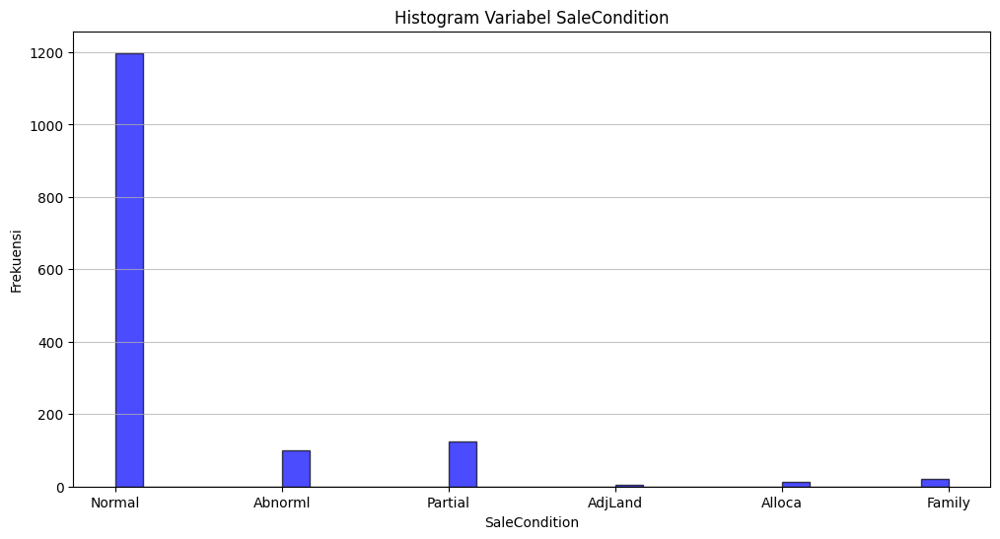

In [ ]:
# Membuat histogram untuk variabel SaleCondition
plt.figure(figsize=(12, 6))
plt.hist(df_train['SaleCondition'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram Variabel SaleCondition')
plt.xlabel('SaleCondition')
plt.ylabel('Frekuensi')
plt.grid(axis='y', alpha=0.75)
plt.show()

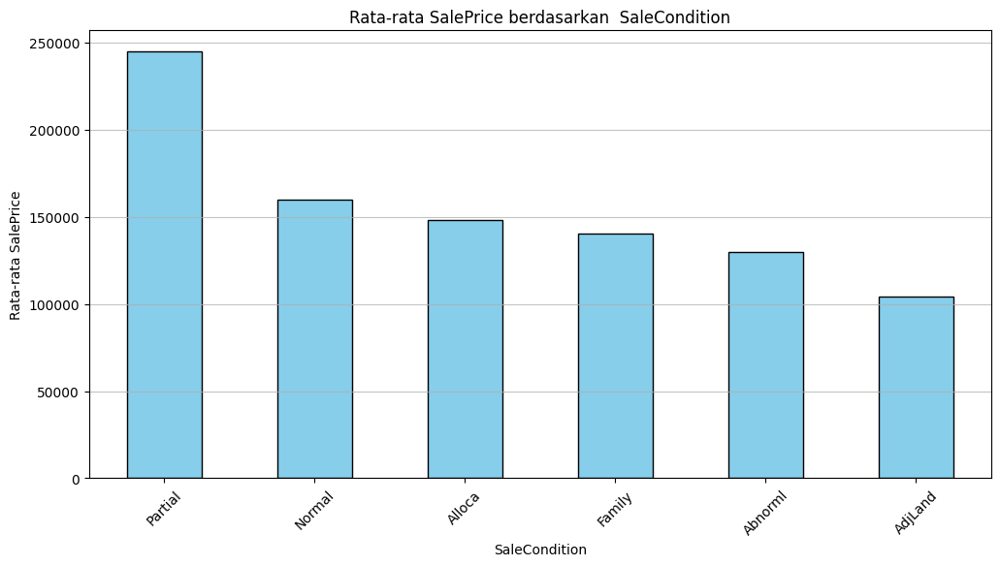

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori SaleCondition
average_saleprice = df_train.groupby('SaleCondition')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan  SaleCondition')
plt.xlabel('SaleCondition')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Recode untuk variabel SaleCondition: 1: AdjLand, 2: Abnorml, 3: Family, 4:Alloca, 5:Normal, 6: Partial

In [ ]:
    # Fungsi untuk mengkategorikan SaleCondition
    def kategorikan_SaleCondition(SaleCondition):
        if SaleCondition == 'AdjLand':
            return 1
        elif SaleCondition == 'Abnorml':
            return 2
        elif SaleCondition == 'Family':
            return 3
        elif SaleCondition == 'Alloca':
            return 4
        elif SaleCondition == 'Normal':
            return 5
        elif SaleCondition == 'Partial':
            return 6
        else:
            return 0

    # Menerapkan fungsi ke kolom PavedDrive
    df_train['SaleCondition_Cat'] = df_train['SaleCondition'].apply(kategorikan_SaleCondition)

    # Menampilkan hasil
    print(df_train[['SaleCondition', 'SaleCondition_Cat']].head())

  SaleCondition  SaleCondition_Cat
0        Normal                  5
1        Normal                  5
2        Normal                  5
3       Abnorml                  2
4        Normal                  5


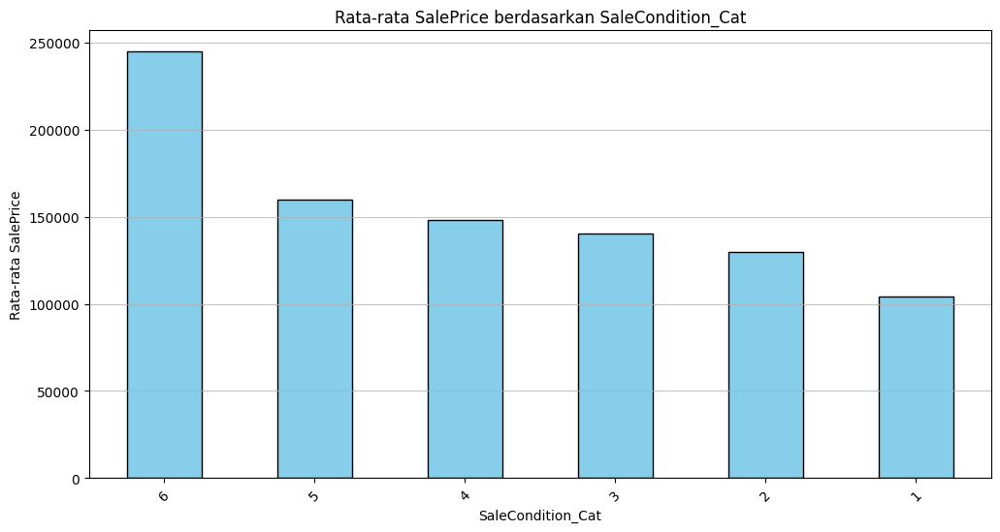

In [ ]:
# Menghitung rata-rata SalePrice untuk setiap kategori SaleCondition_Cat
average_saleprice = df_train.groupby('SaleCondition_Cat')['SalePrice'].median().sort_values(ascending=False)

# Membuat histogram
plt.figure(figsize=(12, 6))
average_saleprice.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Rata-rata SalePrice berdasarkan SaleCondition_Cat')
plt.xlabel('SaleCondition_Cat')
plt.ylabel('Rata-rata SalePrice')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.75)
plt.show()

Simpan file hasil olahan ke file csv

In [ ]:
df_train2=df_train
df_train2.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,MSZoning_Cat,LotFrontage_Filled_MV,Street_Category,Alley_Category,LotShape_Category,LandContour_Category,Utilities_Category,LotConfig_Cat,LandSlope_Cat,Neighborhood_Cat,Condition1_Cat,Condition2_Cat,BldgType_Cat,HouseStyle_Cat,RoofStyle_Cat,RoofMatl_Cat,Exterior1st_Cat,Exterior2nd_Cat,MasVnrType_Cat,MasVnrArea_Filled_MV,ExterQual_Cat,ExterCond_Cat,Foundation_Cat,BsmtQual_Cat,BsmtCond_Cat,BsmtExposure_Cat,BsmtFinType1_Cat,BsmtFinType2_Cat,Heating_Cat,HeatingQC_Cat,CentralAir_Cat,Electrical_Cat,KitchenQual_Cat,Functional_Cat,FireplaceQu_Cat,GarageType_Cat,GarageYrBlt_Filled_MV,GarageFinish_Cat,GarageQual_Cat,GarageCond_Cat,PavedDrive_Cat,PoolQC_Cat,Fence_Cat,MiscFeature_Cat,SaleType_Cat,SaleCondition_Cat
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500,2,65.0,2,0,1,2,4,1,1,5,4,5,4,7,2,3,12,14,3,196.0,3,5,6,4,4,2,7,5,7,5,2,6,3,7,2,6,2003.0,3,5,6,3,1,5,3,6,5
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500,2,80.0,2,0,1,2,4,3,1,5,2,5,4,5,2,3,7,5,2,0.0,2,5,4,4,4,5,5,5,7,5,2,6,2,7,4,6,1976.0,3,5,6,3,1,5,3,6,5
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500,2,68.0,2,0,2,2,4,1,1,5,4,5,4,7,2,3,12,14,3,162.0,3,5,6,4,4,3,7,5,7,5,2,6,3,7,4,6,2001.0,3,5,6,3,1,5,3,6,5
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000,2,60.0,2,0,2,2,4,2,1,5,4,5,4,7,2,3,6,4,2,0.0,2,5,2,3,5,2,5,5,7,4,2,6,3,7,5,3,1998.0,2,5,6,3,1,5,3,6,2
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000,2,84.0,2,0,2,2,4,3,1,5,4,5,4,7,2,3,12,14,3,350.0,3,5,6,4,4,4,7,5,7,5,2,6,3,7,4,6,2000.0,3,5,6,3,1,5,3,6,5


In [ ]:
df_train2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Columns: 127 entries, Id to SaleCondition_Cat
dtypes: float64(6), int64(78), object(43)
memory usage: 1.4+ MB


In [ ]:
df_train2.to_csv('/content/drive/MyDrive/python/train2.csv', index=False)
print("File CSV berhasil dibuat menggunakan pandas! 🎉")

File CSV berhasil dibuat menggunakan pandas! 🎉


# **Load dataset dan info basic dataset - Dataset for Modelling**

In [ ]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

df_train_model = pd.read_csv('/content/drive/MyDrive/python/train2.csv')
df_train_model

Mounted at /content/drive


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,GarageYrBlt_Filled_MV,GarageFinish_Cat,GarageQual_Cat,GarageCond_Cat,PavedDrive_Cat,PoolQC_Cat,Fence_Cat,MiscFeature_Cat,SaleType_Cat,SaleCondition_Cat
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,2003.0,3,5,6,3,1,5,3,6,5
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,1976.0,3,5,6,3,1,5,3,6,5
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,2001.0,3,5,6,3,1,5,3,6,5
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,1998.0,2,5,6,3,1,5,3,6,2
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,2000.0,3,5,6,3,1,5,3,6,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,1999.0,3,5,6,3,1,5,3,6,5
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,1978.0,2,5,6,3,1,2,3,6,5
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,1941.0,3,5,6,3,1,4,2,6,5
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,1950.0,2,5,6,3,1,5,3,6,5


In [ ]:
df_train_model.columns.tolist()

['Id',
 'MSSubClass',
 'MSZoning',
 'LotFrontage',
 'LotArea',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'MasVnrArea',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinSF1',
 'BsmtFinType2',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'Functional',
 'Fireplaces',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageCars',
 'GarageArea',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'WoodDeckSF',
 'OpenPorchSF'

In [ ]:
df_train_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Columns: 127 entries, Id to SaleCondition_Cat
dtypes: float64(6), int64(78), object(43)
memory usage: 1.4+ MB


In [ ]:
df_train_model.dtypes

,0
Id,int64
MSSubClass,int64
MSZoning,object
LotFrontage,float64
LotArea,int64
...,...
PoolQC_Cat,int64
Fence_Cat,int64
MiscFeature_Cat,int64
SaleType_Cat,int64


# **Train Test Split**

In [ ]:
import numpy as np
#split data into train and test
from sklearn.model_selection import train_test_split

X = df_train_model[['MSSubClass', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MSZoning_Cat', 'LotFrontage_Filled_MV', 'Street_Category', 'Alley_Category', 'LotShape_Category', 'LandContour_Category', 'Utilities_Category', 'LotConfig_Cat', 'LandSlope_Cat', 'Neighborhood_Cat', 'Condition1_Cat', 'Condition2_Cat', 'BldgType_Cat', 'HouseStyle_Cat', 'RoofStyle_Cat', 'RoofMatl_Cat', 'Exterior1st_Cat', 'Exterior2nd_Cat', 'MasVnrType_Cat', 'MasVnrArea_Filled_MV', 'ExterQual_Cat', 'ExterCond_Cat', 'Foundation_Cat', 'BsmtQual_Cat', 'BsmtCond_Cat', 'BsmtExposure_Cat', 'BsmtFinType1_Cat', 'BsmtFinType2_Cat', 'Heating_Cat', 'HeatingQC_Cat', 'CentralAir_Cat', 'Electrical_Cat', 'KitchenQual_Cat', 'Functional_Cat', 'FireplaceQu_Cat', 'GarageType_Cat', 'GarageYrBlt_Filled_MV', 'GarageFinish_Cat', 'GarageQual_Cat', 'GarageCond_Cat', 'PavedDrive_Cat', 'PoolQC_Cat', 'Fence_Cat', 'MiscFeature_Cat', 'SaleType_Cat', 'SaleCondition_Cat']] #independent / feature
y = df_train_model['SalePrice'] #dependent / label

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) #dtambahkan stratify = true

In [ ]:
X_train

,MSSubClass,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,...,GarageYrBlt_Filled_MV,GarageFinish_Cat,GarageQual_Cat,GarageCond_Cat,PavedDrive_Cat,PoolQC_Cat,Fence_Cat,MiscFeature_Cat,SaleType_Cat,SaleCondition_Cat
254,20,1314,0,0,1314,1,0,1,0,3,...,1957.000000,3,5,6,3,1,5,3,6,5
1066,60,799,772,0,1571,0,0,2,1,3,...,1993.000000,3,5,6,3,1,5,3,6,5
638,30,796,0,0,796,0,0,1,0,2,...,1978.506164,1,2,2,2,1,2,3,6,5
799,50,981,787,0,1768,1,0,1,1,3,...,1939.000000,2,5,6,3,1,2,3,6,5
380,50,1026,665,0,1691,0,0,2,0,3,...,1924.000000,2,5,6,3,1,5,3,6,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,20,1314,0,0,1314,0,0,2,0,3,...,2006.000000,3,5,6,3,1,5,3,6,5
1130,50,1328,653,0,1981,1,0,2,0,4,...,1981.000000,2,5,6,3,1,2,3,6,5
1294,20,864,0,0,864,1,0,1,0,2,...,1957.000000,2,5,6,1,1,5,3,6,5
860,50,912,514,0,1426,0,0,1,1,3,...,1925.000000,2,5,6,3,1,4,3,6,5


In [ ]:
X_test

,MSSubClass,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,...,GarageYrBlt_Filled_MV,GarageFinish_Cat,GarageQual_Cat,GarageCond_Cat,PavedDrive_Cat,PoolQC_Cat,Fence_Cat,MiscFeature_Cat,SaleType_Cat,SaleCondition_Cat
892,20,1068,0,0,1068,0,1,1,0,3,...,1963.0,3,5,6,3,1,2,3,6,5
1105,60,1500,1122,0,2622,1,0,2,1,3,...,1994.0,3,5,6,3,1,5,3,6,5
413,30,1028,0,0,1028,0,0,1,0,2,...,1927.0,2,5,6,3,1,5,3,6,5
522,50,1004,660,0,1664,0,0,2,0,3,...,1950.0,2,5,6,3,1,5,3,6,5
1036,20,1620,0,0,1620,1,0,2,0,2,...,2008.0,4,5,6,3,1,5,3,6,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
479,30,1131,0,0,1131,0,0,1,0,2,...,1995.0,2,5,6,3,1,2,3,6,4
1361,20,1530,0,0,1530,1,0,2,0,3,...,2005.0,4,5,6,3,1,5,3,6,5
802,60,728,728,0,1456,1,0,2,1,3,...,2005.0,4,5,6,3,1,5,3,6,5
651,70,755,755,0,1510,1,0,1,0,4,...,1940.0,2,3,1,2,1,2,3,6,5


In [ ]:
y_train

,SalePrice
254,145000
1066,178000
638,85000
799,175000
380,127000
...,...
1095,176432
1130,135000
1294,115000
860,189950


In [ ]:
y_test

,SalePrice
892,154500
1105,325000
413,115000
522,159000
1036,315500
...,...
479,89471
1361,260000
802,189000
651,108000


# **Modelling**

### Multiple Linear Rergression

Training Set Metrics:
Mean Absolute Error (MAE): 19494.5863
Mean Squared Error (MSE): 891943913.2503
Root Mean Squared Error (RMSE): 29865.4301
Mean Absolute Percentage Error (MAPE): 0.1150
R-squared (R2): 0.8505
------------------------------
Testing Set Metrics:
Mean Absolute Error (MAE): 22032.7655
Mean Squared Error (MSE): 1243235839.1506
Root Mean Squared Error (RMSE): 35259.5496
Mean Absolute Percentage Error (MAPE): 0.1300
R-squared (R2): 0.8379
------------------------------


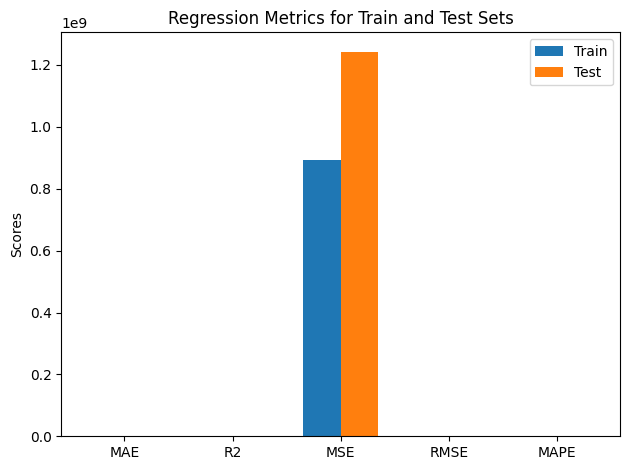

In [ ]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

# Replace infinite values with NaN in both training and testing data
X_train = X_train.replace([np.inf, -np.inf], np.nan)
X_test = X_test.replace([np.inf, -np.inf], np.nan)

# Impute NaN values (e.g., with the mean) in both training and testing data
X_train = X_train.fillna(X_train.mean())
X_test = X_test.fillna(X_train.mean())  # Use training data mean for imputation in test data

# Inisialisasi model Linear Regression
model = LinearRegression()

# Latih model dengan data training
model.fit(X_train, y_train)

# Prediksi harga rumah pada data training and testing
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Function to calculate and print metrics
def evaluate_model(y_true, y_pred, dataset_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"{dataset_name} Set Metrics:")
    print(f'Mean Absolute Error (MAE): {mae:.4f}')
    print(f'Mean Squared Error (MSE): {mse:.4f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
    print(f'Mean Absolute Percentage Error (MAPE): {mape:.4f}')
    print(f'R-squared (R2): {r2:.4f}')
    print("-" * 30)  # Separator for better readability


    # Return the metrics as a dictionary or list
    return [mae, r2, mse, rmse, mape]  # Return metrics values

# Ploting
import matplotlib.pyplot as plt
import numpy as np


# Evaluate the model on training and testing sets and store the metrics
train_metrics = evaluate_model(y_train, y_pred_train, "Training")  # Store training metrics
test_metrics = evaluate_model(y_test, y_pred_test, "Testing")    # Store testing metrics

metrics = ['MAE', 'R2', 'MSE', 'RMSE', 'MAPE']
train_values = train_metrics  # Assuming 'train_metrics' is defined previously
test_values = test_metrics    # Assuming 'test_metrics' is defined previously

x = np.arange(len(metrics))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, train_values, width, label='Train')
rects2 = ax.bar(x + width/2, test_values, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Regression Metrics for Train and Test Sets')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

fig.tight_layout()

plt.show()

Hyperparameter Tuning Linear Regresion with Random Search

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] END regressor__fit_intercept=True, scaler=StandardScaler(); total time=   0.0s
[CV] END regressor__fit_intercept=True, scaler=StandardScaler(); total time=   0.1s
[CV] END regressor__fit_intercept=True, scaler=StandardScaler(); total time=   0.1s
[CV] END regressor__fit_intercept=True, scaler=StandardScaler(); total time=   0.1s
[CV] END regressor__fit_intercept=True, scaler=StandardScaler(); total time=   0.2s
[CV] END regressor__fit_intercept=True, scaler=MinMaxScaler(); total time=   0.0s
[CV] END regressor__fit_intercept=True, scaler=MinMaxScaler(); total time=   0.1s
[CV] END regressor__fit_intercept=True, scaler=MinMaxScaler(); total time=   0.1s
[CV] END regressor__fit_intercept=True, scaler=MinMaxScaler(); total time=   0.1s
[CV] END regressor__fit_intercept=True, scaler=MinMaxScaler(); total time=   0.1s
[CV] END .........regressor__fit_intercept=True, scaler=None; total time=   0.0s
[CV] END .........regressor__

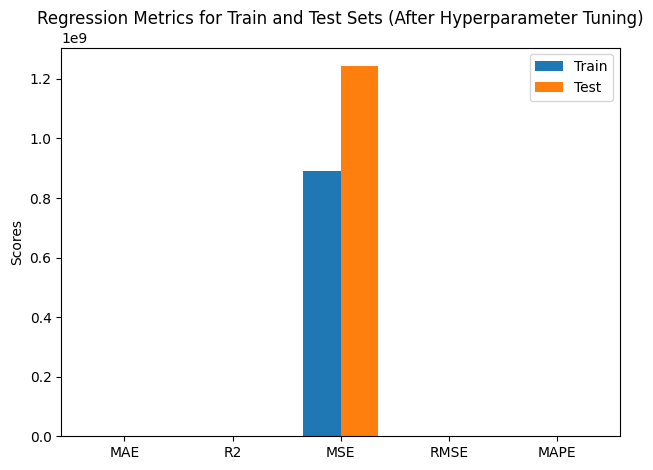

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Create a pipeline with scaling and Linear Regression
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Default to StandardScaler
    ('regressor', LinearRegression())
])

# Define the hyperparameter grid
param_distributions = {
    'regressor__fit_intercept': [True, False],  # Tune fit_intercept
    'scaler': [StandardScaler(), MinMaxScaler(), None]  # Try different scalers
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_distributions,
    n_iter=6,  # Number of parameter settings to sample (all combinations in this case)
    scoring='neg_mean_absolute_error',  # Using MAE as the scoring metric
    cv=5,  # Number of cross-validation folds
    random_state=42,
    verbose=2  # Increase verbosity for more information during the search
)

# Perform the random search
random_search.fit(X_train, y_train)

# Get the best model and its predictions
best_model = random_search.best_estimator_
y_pred_train = best_model.predict(X_train)  # Predictions on training data
y_pred_test = best_model.predict(X_test)  # Predictions on testing data

# Function to calculate and print metrics
def evaluate_model(y_true, y_pred, dataset_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"{dataset_name} Set Metrics:")
    print(f'Mean Absolute Error (MAE): {mae:.4f}')
    print(f'Mean Squared Error (MSE): {mse:.4f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
    print(f'Mean Absolute Percentage Error (MAPE): {mape:.4f}')
    print(f'R-squared (R2): {r2:.4f}')
    print("-" * 30)  # Separator for better readability

# Evaluate the model on training and testing sets
evaluate_model(y_train, y_pred_train, "Training")
evaluate_model(y_test, y_pred_test, "Testing")

# Print the best hyperparameters
print("\nBest Hyperparameters:")
print(random_search.best_params_)

# Ploting
import matplotlib.pyplot as plt

metrics = ['MAE', 'R2', 'MSE', 'RMSE', 'MAPE']
train_values = train_metrics
test_values = test_metrics

x = np.arange(len(metrics))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, train_values, width, label='Train')
rects2 = ax.bar(x + width/2, test_values, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Regression Metrics for Train and Test Sets (After Hyperparameter Tuning)')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

fig.tight_layout()

plt.show()

### Random Forest

Training Set Metrics:
Mean Absolute Error (MAE): 6621.4977
Mean Squared Error (MSE): 125087733.3829
Root Mean Squared Error (RMSE): 11184.2628
Mean Absolute Percentage Error (MAPE): 0.0388
R-squared (R2): 0.9790
------------------------------
Testing Set Metrics:
Mean Absolute Error (MAE): 17502.0280
Mean Squared Error (MSE): 818699515.6093
Root Mean Squared Error (RMSE): 28612.9257
Mean Absolute Percentage Error (MAPE): 0.1070
R-squared (R2): 0.8933
------------------------------


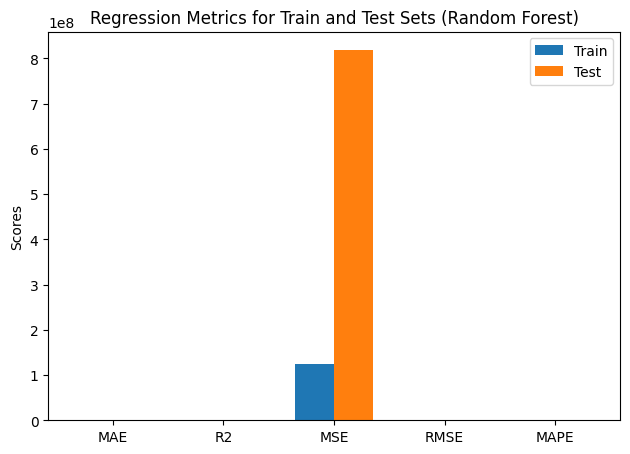

In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

# Replace infinite values with NaN in both training and testing data
X_train = X_train.replace([np.inf, -np.inf], np.nan)
X_test = X_test.replace([np.inf, -np.inf], np.nan)

# Impute NaN values (e.g., with the mean) in both training and testing data
X_train = X_train.fillna(X_train.mean())
X_test = X_test.fillna(X_train.mean())  # Use training data mean for imputation in test data

# Inisialisasi model Random Forest
model = RandomForestRegressor(
    n_estimators=100,  # Number of trees in the forest
    random_state=42,   # Random state for reproducibility
    # ... other hyperparameters you might want to tune
)

# Latih model dengan data training
model.fit(X_train, y_train)

# Prediksi harga rumah pada data training and testing
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Function to calculate and print metrics
def evaluate_model(y_true, y_pred, dataset_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"{dataset_name} Set Metrics:")
    print(f'Mean Absolute Error (MAE): {mae:.4f}')
    print(f'Mean Squared Error (MSE): {mse:.4f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
    print(f'Mean Absolute Percentage Error (MAPE): {mape:.4f}')
    print(f'R-squared (R2): {r2:.4f}')
    print("-" * 30)  # Separator for better readability

    # Return the metrics as a dictionary or list
    return [mae, r2, mse, rmse, mape]  # Return metrics values

# Evaluate the model on training and testing sets and store the metrics
train_metrics = evaluate_model(y_train, y_pred_train, "Training")  # Store training metrics
test_metrics = evaluate_model(y_test, y_pred_test, "Testing")    # Store testing metrics

# Ploting the metrics
metrics = ['MAE', 'R2', 'MSE', 'RMSE', 'MAPE']
train_values = train_metrics # Assign train_values to the output of evaluate_model for training data
test_values = test_metrics  # Assign test_values to the output of evaluate_model for testing data


x = np.arange(len(metrics))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, train_values, width, label='Train')
rects2 = ax.bar(x + width/2, test_values, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Regression Metrics for Train and Test Sets (Random Forest)')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

fig.tight_layout()

plt.show()

Hyperparameter Tuning Random Forest with Random Search

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.7s
[CV] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.6s
[CV] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.6s
[CV] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.7s
[CV] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.7s
[CV] END bootstrap=False, max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20, n_estimators=300; total time=   5.4s
[CV] END bootstrap=False, max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20, n_estimators=300; t

/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
65 fits failed out of a total of 250.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
65 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.11/dist-packages/sklearn/utils/

Training Set Metrics:
Mean Absolute Error (MAE): 6300.8564
Mean Squared Error (MSE): 118938040.2282
Root Mean Squared Error (RMSE): 10905.8718
Mean Absolute Percentage Error (MAPE): 0.0371
R-squared (R2): 0.9801
------------------------------
Testing Set Metrics:
Mean Absolute Error (MAE): 17765.7531
Mean Squared Error (MSE): 1005335374.5665
Root Mean Squared Error (RMSE): 31707.0241
Mean Absolute Percentage Error (MAPE): 0.1104
R-squared (R2): 0.8689
------------------------------

Best Hyperparameters:
{'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 30, 'bootstrap': True}


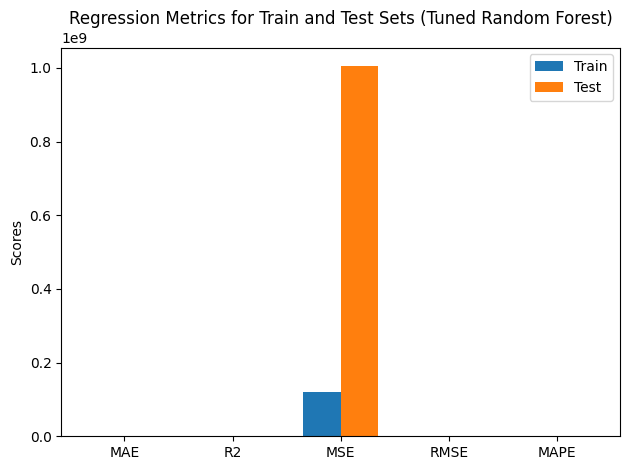

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error


# Define the hyperparameter grid
param_distributions = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 8],
    'max_features': ['auto', 'sqrt', 'log2', None],
    'bootstrap': [True, False]
}

# Initialize Random Forest and RandomizedSearchCV
model = RandomForestRegressor(random_state=42)
random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_distributions,
    n_iter=50,  # Number of parameter settings to sample
    scoring='neg_mean_absolute_error',  # Using MAE as the scoring metric
    cv=5,  # Number of cross-validation folds
    random_state=42,
    verbose=2  # Increase verbosity for more information during the search
)

# Perform the random search
random_search.fit(X_train, y_train)

# Get the best model and its predictions
best_model = random_search.best_estimator_
y_pred_train = best_model.predict(X_train)  # Predictions on training data
y_pred_test = best_model.predict(X_test)  # Predictions on testing data

# Function to calculate and print metrics
def evaluate_model(y_true, y_pred, dataset_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"{dataset_name} Set Metrics:")
    print(f'Mean Absolute Error (MAE): {mae:.4f}')
    print(f'Mean Squared Error (MSE): {mse:.4f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
    print(f'Mean Absolute Percentage Error (MAPE): {mape:.4f}')
    print(f'R-squared (R2): {r2:.4f}')
    print("-" * 30)  # Separator for better readability

    # Return the calculated metrics as a list
    return [mae, r2, mse, rmse, mape]

# Evaluate the model on training and testing sets
train_metrics = evaluate_model(y_train, y_pred_train, "Training") # Assigning the returned list to train_metrics
test_metrics = evaluate_model(y_test, y_pred_test, "Testing")  # Assigning the returned list to test_metrics

# Print the best hyperparameters
print("\nBest Hyperparameters:")
print(random_search.best_params_)

# Calculate metrics for training and testing sets
# train_metrics = evaluate_model(y_train, y_pred_train, "Training") # This line is no longer needed
# test_metrics = evaluate_model(y_test, y_pred_test, "Testing")   # This line is no longer needed

# Ploting the metrics
metrics = ['MAE', 'R2', 'MSE', 'RMSE', 'MAPE']
train_values = train_metrics # train_values is assigned the value of train_metrics, which is now a list of metrics
test_values = test_metrics # test_values is assigned the value of test_metrics, which is now a list of metrics


x = np.arange(len(metrics))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, train_values, width, label='Train')
rects2 = ax.bar(x + width/2, test_values, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Regression Metrics for Train and Test Sets (Tuned Random Forest)')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

fig.tight_layout()

plt.show()

Top 10 Feature Importances (Tuned Random Forest):
            Feature  Importance  Importance Percentage
29      OverallQual    0.118248              11.824808
4         GrLivArea    0.084297               8.429685
14       GarageCars    0.058905               5.890504
28      TotalBsmtSF    0.051342               5.134220
53    ExterQual_Cat    0.050536               5.053646
65  KitchenQual_Cat    0.043751               4.375095
31        YearBuilt    0.043404               4.340417
1          1stFlrSF    0.041297               4.129681
15       GarageArea    0.040059               4.005924
25       BsmtFinSF1    0.037097               3.709690


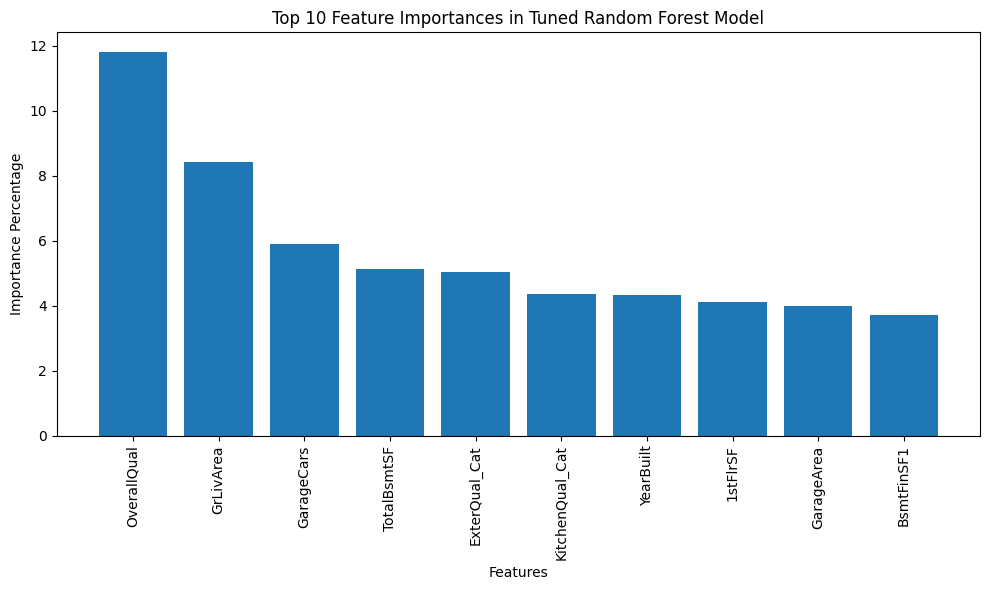

In [ ]:
# Get feature importances from the best model
importances = best_model.feature_importances_

# Create a DataFrame to store feature importances with their names
feature_importances_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})

# Sort the DataFrame by importance in descending order
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

# Calculate percentage importance
feature_importances_df['Importance Percentage'] = (feature_importances_df['Importance'] / feature_importances_df['Importance'].sum()) * 100

# Display the top 10 features with their importance percentages
print("Top 10 Feature Importances (Tuned Random Forest):")
print(feature_importances_df.head(10))

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(feature_importances_df['Feature'][:10], feature_importances_df['Importance Percentage'][:10])
plt.xticks(rotation=90)
plt.xlabel("Features")
plt.ylabel("Importance Percentage")
plt.title("Top 10 Feature Importances in Tuned Random Forest Model")
plt.tight_layout()
plt.show()

### AdaBoost

Training Set Metrics:
Mean Absolute Error (MAE): 21889.2036
Mean Squared Error (MSE): 776668449.9943
Root Mean Squared Error (RMSE): 27868.7719
Mean Absolute Percentage Error (MAPE): 0.1462
R-squared (R2): 0.8698
------------------------------
Testing Set Metrics:
Mean Absolute Error (MAE): 24921.9311
Mean Squared Error (MSE): 1215508878.7954
Root Mean Squared Error (RMSE): 34864.1489
Mean Absolute Percentage Error (MAPE): 0.1735
R-squared (R2): 0.8415
------------------------------


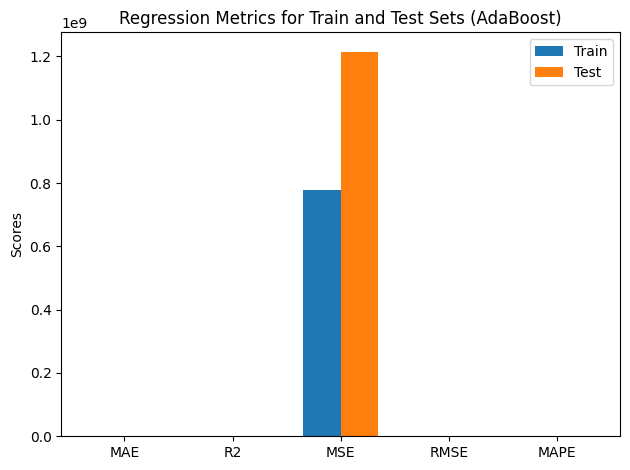

In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

# Replace infinite values with NaN in both training and testing data
X_train = X_train.replace([np.inf, -np.inf], np.nan)
X_test = X_test.replace([np.inf, -np.inf], np.nan)

# Impute NaN values (e.g., with the mean) in both training and testing data
X_train = X_train.fillna(X_train.mean())
X_test = X_test.fillna(X_train.mean())  # Use training data mean for imputation in test data

# Inisialisasi model AdaBoost
model = AdaBoostRegressor(
    n_estimators=50,  # Number of weak learners (default=50)
    learning_rate=1.0,  # Learning rate (default=1.0)
    random_state=42,   # Random state for reproducibility
    # ... other hyperparameters you might want to tune
)

# Latih model dengan data training
model.fit(X_train, y_train)

# Prediksi harga rumah pada data training and testing
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Function to calculate and print metrics
def evaluate_model(y_true, y_pred, dataset_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"{dataset_name} Set Metrics:")
    print(f'Mean Absolute Error (MAE): {mae:.4f}')
    print(f'Mean Squared Error (MSE): {mse:.4f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
    print(f'Mean Absolute Percentage Error (MAPE): {mape:.4f}')
    print(f'R-squared (R2): {r2:.4f}')
    print("-" * 30)  # Separator for better readability

    # Return the calculated metrics as a list
    return [mae, r2, mse, rmse, mape]  # Added this return statement

# Evaluate the model on training and testing sets
#NOTE: removed the extra calls to evaluate_model
train_metrics = evaluate_model(y_train, y_pred_train, "Training")  # Assigning the returned list to train_metrics
test_metrics = evaluate_model(y_test, y_pred_test, "Testing")   # Assigning the returned list to test_metrics


# Ploting the metrics
metrics = ['MAE', 'R2', 'MSE', 'RMSE', 'MAPE']
train_values = train_metrics
test_values = test_metrics

x = np.arange(len(metrics))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, train_values, width, label='Train')
rects2 = ax.bar(x + width/2, test_values, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Regression Metrics for Train and Test Sets (AdaBoost)')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

fig.tight_layout()

plt.show()

Hyperparameter Tuning Adaboost with Random Search

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END estimator=DecisionTreeRegressor(max_depth=1), learning_rate=0.01, loss=square, n_estimators=250; total time=   3.3s
[CV] END estimator=DecisionTreeRegressor(max_depth=1), learning_rate=0.01, loss=square, n_estimators=250; total time=   2.1s
[CV] END estimator=DecisionTreeRegressor(max_depth=1), learning_rate=0.01, loss=square, n_estimators=250; total time=   2.2s
[CV] END estimator=DecisionTreeRegressor(max_depth=1), learning_rate=0.01, loss=square, n_estimators=250; total time=   1.9s
[CV] END estimator=DecisionTreeRegressor(max_depth=1), learning_rate=0.01, loss=square, n_estimators=250; total time=   2.5s
[CV] END estimator=DecisionTreeRegressor(max_depth=3), learning_rate=0.5, loss=linear, n_estimators=250; total time=   4.7s
[CV] END estimator=DecisionTreeRegressor(max_depth=3), learning_rate=0.5, loss=linear, n_estimators=250; total time=   3.6s
[CV] END estimator=DecisionTreeRegressor(max_depth=3), learning_r

TypeError: unsupported operand type(s) for +: 'int' and 'NoneType'

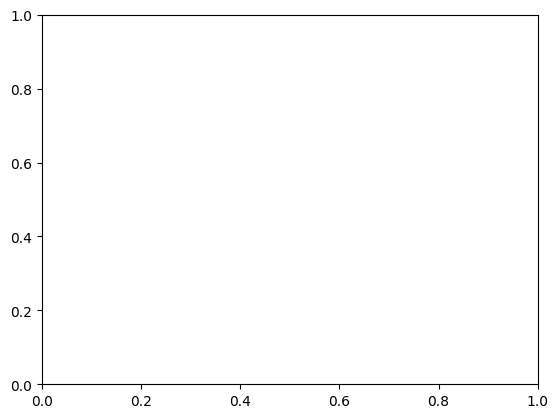

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

# Assuming X_train, X_test, y_train, y_test are already defined

# Define the hyperparameter grid
param_distributions = {
    'n_estimators': [50, 100, 150, 200, 250],
    'learning_rate': [0.01, 0.1, 0.5, 1.0, 2.0],
    'loss': ['linear', 'square', 'exponential'],
    'estimator': [
        DecisionTreeRegressor(max_depth=1),
        DecisionTreeRegressor(max_depth=2),
        DecisionTreeRegressor(max_depth=3),
    ]
}

# Initialize AdaBoost and RandomizedSearchCV
model = AdaBoostRegressor(random_state=42)
random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_distributions,
    n_iter=50,
    scoring='neg_mean_absolute_error',  # Optimize for MAE
    cv=5,
    random_state=42,
    verbose=2,
    refit=True
)

# Perform the random search
random_search.fit(X_train, y_train)

# Get the best model and predictions
best_model = random_search.best_estimator_
y_pred_train = best_model.predict(X_train)
y_pred_test = best_model.predict(X_test)

# Function to calculate and print metrics
def evaluate_model(y_true, y_pred, dataset_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"{dataset_name} Set Metrics:")
    print(f'Mean Absolute Error (MAE): {mae:.4f}')
    print(f'Mean Squared Error (MSE): {mse:.4f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
    print(f'Mean Absolute Percentage Error (MAPE): {mape:.4f}')
    print(f'R-squared (R2): {r2:.4f}')
    print("-" * 30)

# Evaluate the model on training and testing sets
evaluate_model(y_train, y_pred_train, "Training")
evaluate_model(y_test, y_pred_test, "Testing")

# Print the best hyperparameters
print("\nBest Hyperparameters:")
print(random_search.best_params_)

# Calculate metrics for training and testing sets
train_metrics = evaluate_model(y_train, y_pred_train, "Training")
test_metrics = evaluate_model(y_test, y_pred_test, "Testing")

# Ploting the metrics
metrics = ['MAE', 'R2', 'MSE', 'RMSE', 'MAPE']
train_values = train_metrics
test_values = test_metrics

x = np.arange(len(metrics))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, train_values, width, label='Train')
rects2 = ax.bar(x + width/2, test_values, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Regression Metrics for Train and Test Sets (Tuned AdaBoost)')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

fig.tight_layout()

plt.show()

Top 10 Feature Importances (Tuned AdaBoost):
             Feature  Importance  Importance Percentage
29       OverallQual    0.358264              35.826416
4          GrLivArea    0.143880              14.388046
14        GarageCars    0.105454              10.545428
42  Neighborhood_Cat    0.080886               8.088568
2           2ndFlrSF    0.063706               6.370590
28       TotalBsmtSF    0.045784               4.578401
25        BsmtFinSF1    0.033894               3.389394
65   KitchenQual_Cat    0.023655               2.365472
20       ScreenPorch    0.017014               1.701445
1           1stFlrSF    0.014698               1.469827


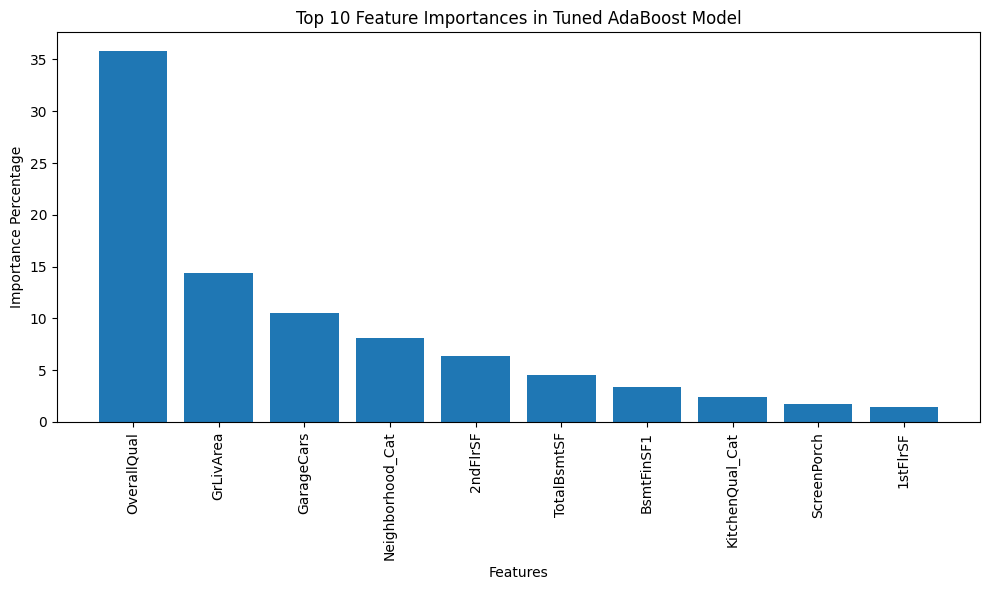

In [ ]:
# Get feature importances from the best model
importances = best_model.feature_importances_

# Create a DataFrame to store feature importances with their names
feature_importances_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})

# Sort the DataFrame by importance in descending order
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

# Calculate percentage importance
feature_importances_df['Importance Percentage'] = (feature_importances_df['Importance'] / feature_importances_df['Importance'].sum()) * 100

# Display the top 10 features with their importance percentages
print("Top 10 Feature Importances (Tuned AdaBoost):")
print(feature_importances_df.head(10))

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(feature_importances_df['Feature'][:10], feature_importances_df['Importance Percentage'][:10])
plt.xticks(rotation=90)
plt.xlabel("Features")
plt.ylabel("Importance Percentage")
plt.title("Top 10 Feature Importances in Tuned AdaBoost Model")
plt.tight_layout()
plt.show()

### XGBoost

Training Set Metrics:
Mean Absolute Error (MAE): 673.0732
Mean Squared Error (MSE): 915075.1875
Root Mean Squared Error (RMSE): 956.5956
Mean Absolute Percentage Error (MAPE): 0.0043
R-squared (R2): 0.9998
------------------------------
Testing Set Metrics:
Mean Absolute Error (MAE): 18338.7422
Mean Squared Error (MSE): 807212992.0000
Root Mean Squared Error (RMSE): 28411.4940
Mean Absolute Percentage Error (MAPE): 0.1128
R-squared (R2): 0.8948
------------------------------


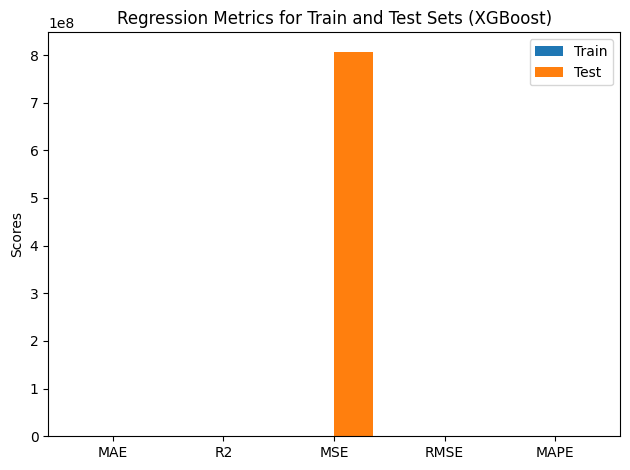

In [ ]:
import xgboost as xgb
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error


# Create XGBoost DMatrix objects
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# Define XGBoost parameters
params = {
    'objective': 'reg:squarederror',  # Regression objective
    'eval_metric': 'mae',  # Evaluation metric (MAE)
    # ... other parameters you might want to tune
}

# Train the XGBoost model
model = xgb.train(params, dtrain, num_boost_round=100)  # Adjust num_boost_round

# Make predictions
y_pred_train = model.predict(dtrain)
y_pred_test = model.predict(dtest)

# Function to calculate and print metrics
def evaluate_model(y_true, y_pred, dataset_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"{dataset_name} Set Metrics:")
    print(f'Mean Absolute Error (MAE): {mae:.4f}')
    print(f'Mean Squared Error (MSE): {mse:.4f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
    print(f'Mean Absolute Percentage Error (MAPE): {mape:.4f}')
    print(f'R-squared (R2): {r2:.4f}')
    print("-" * 30)

# Evaluate the model on training and testing sets
evaluate_model(y_train, y_pred_train, "Training")
evaluate_model(y_test, y_pred_test, "Testing")

# Function to calculate and return metrics
def calculate_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mae, r2, mse, rmse, mape

# Calculate metrics for training and testing sets
train_metrics = calculate_metrics(y_train, y_pred_train)
test_metrics = calculate_metrics(y_test, y_pred_test)

# Ploting the metrics
metrics = ['MAE', 'R2', 'MSE', 'RMSE', 'MAPE']
train_values = train_metrics
test_values = test_metrics

x = np.arange(len(metrics))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, train_values, width, label='Train')
rects2 = ax.bar(x + width/2, test_values, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Regression Metrics for Train and Test Sets (XGBoost)')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

fig.tight_layout()

plt.show()

Hyperparameter Tuning XGBoost with Random Search

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END colsample_bytree=0.7, gamma=0.2, learning_rate=0.3, max_depth=7, min_child_weight=1, n_estimators=500, subsample=0.8; total time=   1.5s
[CV] END colsample_bytree=0.7, gamma=0.2, learning_rate=0.3, max_depth=7, min_child_weight=1, n_estimators=500, subsample=0.8; total time=   1.5s
[CV] END colsample_bytree=0.7, gamma=0.2, learning_rate=0.3, max_depth=7, min_child_weight=1, n_estimators=500, subsample=0.8; total time=   1.4s
[CV] END colsample_bytree=0.7, gamma=0.2, learning_rate=0.3, max_depth=7, min_child_weight=1, n_estimators=500, subsample=0.8; total time=   1.8s
[CV] END colsample_bytree=0.7, gamma=0.2, learning_rate=0.3, max_depth=7, min_child_weight=1, n_estimators=500, subsample=0.8; total time=   3.8s
[CV] END colsample_bytree=0.3, gamma=0.4, learning_rate=0.5, max_depth=8, min_child_weight=7, n_estimators=500, subsample=0.6; total time=   0.9s
[CV] END colsample_bytree=0.3, gamma=0.4, learning_rate=0.5, m

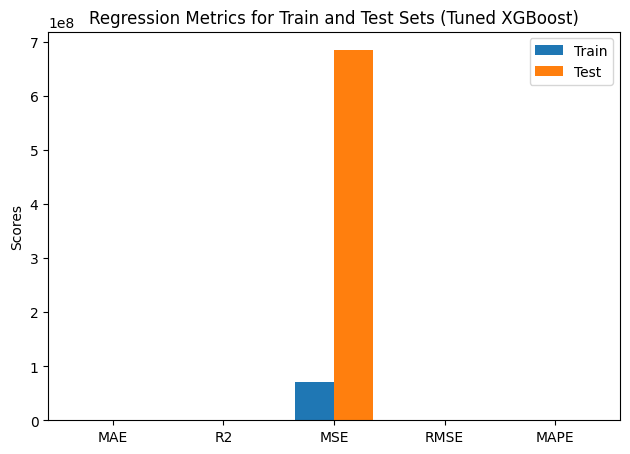

In [ ]:
import xgboost as xgb
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

# Assuming X_train, X_test, y_train, y_test are already defined

# Define the hyperparameter grid
param_distributions = {
    'n_estimators': [100, 200, 300, 400, 500],
    'learning_rate': [0.01, 0.1, 0.3, 0.5],
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
    'min_child_weight': [1, 3, 5, 7],
    'gamma': [0, 0.1, 0.2, 0.3, 0.4],
    'colsample_bytree': [0.3, 0.4, 0.5, 0.7],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0]
}

# Initialize XGBoost and RandomizedSearchCV
model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_distributions,
    n_iter=50,  # Number of parameter settings to sample
    scoring='neg_mean_absolute_error',  # Using MAE as the scoring metric
    cv=5,  # Number of cross-validation folds
    random_state=42,
    verbose=2  # Increase verbosity for more information during the search
)

# Perform the random search
random_search.fit(X_train, y_train)

# Get the best model and predictions
best_model = random_search.best_estimator_
y_pred_train = best_model.predict(X_train)
y_pred_test = best_model.predict(X_test)

# Function to calculate and print metrics
def evaluate_model(y_true, y_pred, dataset_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"{dataset_name} Set Metrics:")
    print(f'Mean Absolute Error (MAE): {mae:.4f}')
    print(f'Mean Squared Error (MSE): {mse:.4f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
    print(f'Mean Absolute Percentage Error (MAPE): {mape:.4f}')
    print(f'R-squared (R2): {r2:.4f}')
    print("-" * 30)

# Evaluate the model on training and testing sets
evaluate_model(y_train, y_pred_train, "Training")
evaluate_model(y_test, y_pred_test, "Testing")

# Print the best hyperparameters
print("\nBest Hyperparameters:")
print(random_search.best_params_)

# Calculate metrics for training and testing sets
train_metrics = calculate_metrics(y_train, y_pred_train)
test_metrics = calculate_metrics(y_test, y_pred_test)

# Ploting the metrics
metrics = ['MAE', 'R2', 'MSE', 'RMSE', 'MAPE']
train_values = train_metrics
test_values = test_metrics

x = np.arange(len(metrics))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, train_values, width, label='Train')
rects2 = ax.bar(x + width/2, test_values, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Regression Metrics for Train and Test Sets (Tuned XGBoost)')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

fig.tight_layout()

plt.show()

Top 10 Feature Importances (Tuned XGBoost):
             Feature  Importance  Importance Percentage
53     ExterQual_Cat    0.196722              19.672180
29       OverallQual    0.194552              19.455154
14        GarageCars    0.135980              13.597976
56      BsmtQual_Cat    0.063405               6.340490
65   KitchenQual_Cat    0.049591               4.959060
7           FullBath    0.037380               3.737971
4          GrLivArea    0.027251               2.725092
70  GarageFinish_Cat    0.015265               1.526477
67   FireplaceQu_Cat    0.012456               1.245574
63    CentralAir_Cat    0.011866               1.186574


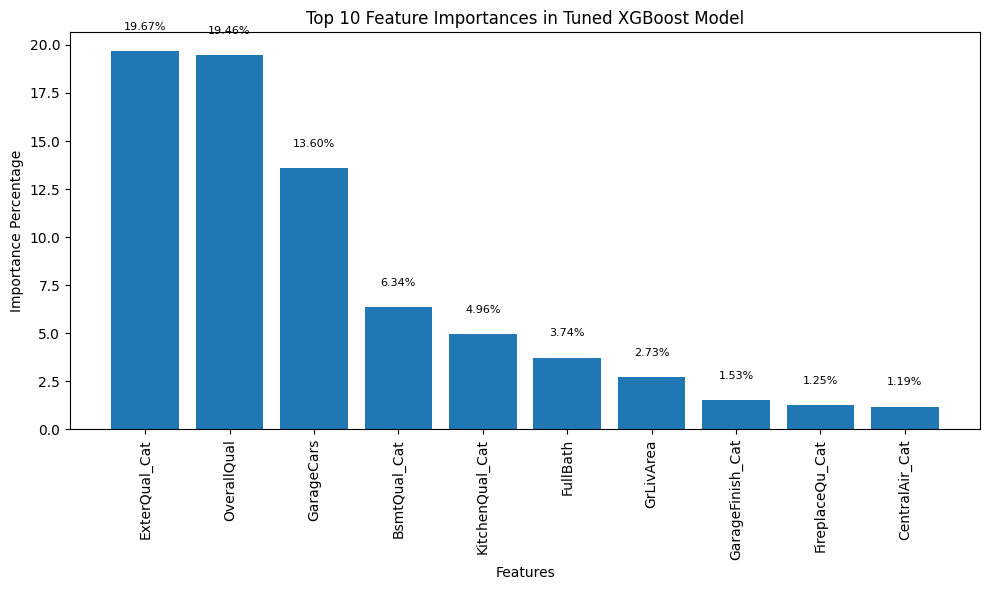

In [ ]:
# Get feature importances from the best model
importances = best_model.feature_importances_

# Create a DataFrame to store feature importances with their names
feature_importances_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})

# Sort the DataFrame by importance in descending order
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

# Calculate percentage importance
feature_importances_df['Importance Percentage'] = (feature_importances_df['Importance'] / feature_importances_df['Importance'].sum()) * 100

# Display the top 10 features with their importance percentages
print("Top 10 Feature Importances (Tuned XGBoost):")
print(feature_importances_df.head(10))

# Plot the feature importances with custom text positions and percentages
plt.figure(figsize=(10, 6))
plt.bar(feature_importances_df['Feature'][:10], feature_importances_df['Importance Percentage'][:10])
plt.xticks(rotation=90)
plt.xlabel("Features")
plt.ylabel("Importance Percentage")
plt.title("Top 10 Feature Importances in Tuned XGBoost Model")

# Add text annotations for percentages
for i, v in enumerate(feature_importances_df['Importance Percentage'][:10]):
    plt.text(i, v + 1, f"{v:.2f}%", ha='center', va='bottom', fontsize=8)  # Adjust text position

plt.tight_layout()
plt.show()

### Lasso

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.232e+11, tolerance: 6.967e+08
  model = cd_fast.enet_coordinate_descent(


Training Metrics:
MAE: 19650.82
R2: 0.85
MSE: 902986588.66
RMSE: 30049.74
MAPE: 0.12

Testing Metrics:
MAE: 22192.50
R2: 0.84
MSE: 1255852683.70
RMSE: 35438.01
MAPE: 0.13


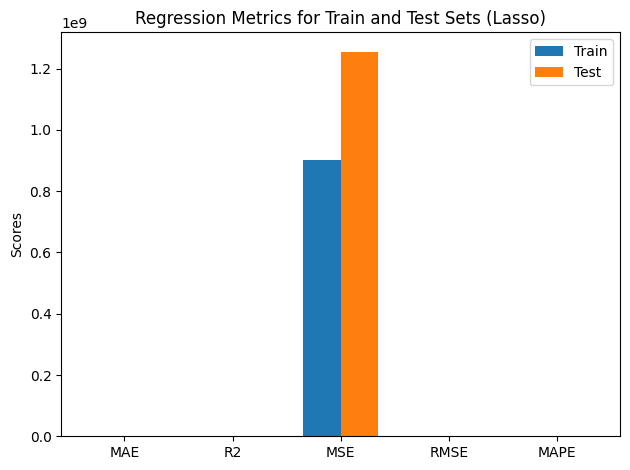

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt


# Inisialisasi model Lasso dengan alpha (regularization strength)
lasso_model = Lasso(alpha=1.0)  # You can adjust alpha

# Latih model dengan data training
lasso_model.fit(X_train, y_train)

# Prediksi pada data training dan testing
y_pred_train = lasso_model.predict(X_train)
y_pred_test = lasso_model.predict(X_test)

# Function to calculate and return metrics
def calculate_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mae, r2, mse, rmse, mape

# Calculate metrics for training and testing sets
train_metrics = calculate_metrics(y_train, y_pred_train)
test_metrics = calculate_metrics(y_test, y_pred_test)

# Print the metrics
print("Training Metrics:")
print(f"MAE: {train_metrics[0]:.2f}")
print(f"R2: {train_metrics[1]:.2f}")
print(f"MSE: {train_metrics[2]:.2f}")
print(f"RMSE: {train_metrics[3]:.2f}")
print(f"MAPE: {train_metrics[4]:.2f}")

print("\nTesting Metrics:")
print(f"MAE: {test_metrics[0]:.2f}")
print(f"R2: {test_metrics[1]:.2f}")
print(f"MSE: {test_metrics[2]:.2f}")
print(f"RMSE: {test_metrics[3]:.2f}")
print(f"MAPE: {test_metrics[4]:.2f}")

# Ploting the metrics
metrics = ['MAE', 'R2', 'MSE', 'RMSE', 'MAPE']
train_values = train_metrics
test_values = test_metrics

x = np.arange(len(metrics))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, train_values, width, label='Train')
rects2 = ax.bar(x + width/2, test_values, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Regression Metrics for Train and Test Sets (Lasso)')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

fig.tight_layout()

plt.show()

Hyperparameter Tuning Lasso with Random Search

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END ........................alpha=0.0001, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.062e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.964e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........................alpha=0.0001, max_iter=1000; total time=   0.1s
[CV] END ........................alpha=0.0001, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........................alpha=0.0001, max_iter=1000; total time=   0.1s
[CV] END ........................alpha=0.0001, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.061e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .......alpha=0.00026366508987303583, max_iter=10000; total time=   1.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.964e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .......alpha=0.00026366508987303583, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .......alpha=0.00026366508987303583, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .......alpha=0.00026366508987303583, max_iter=10000; total time=   0.6s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.138e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.060e+11, tolerance: 5.720e

[CV] END .......alpha=0.00026366508987303583, max_iter=10000; total time=   0.7s
[CV] END ............alpha=11.288378916846883, max_iter=1000; total time=   0.1s
[CV] END ............alpha=11.288378916846883, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.589e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.860e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.755e+11, tolerance: 5.796e

[CV] END ............alpha=11.288378916846883, max_iter=1000; total time=   0.1s
[CV] END ............alpha=11.288378916846883, max_iter=1000; total time=   0.1s
[CV] END ............alpha=11.288378916846883, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.690e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.703e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.791e+11, tolerance: 5.256e

[CV] END ..............alpha=206.913808111479, max_iter=1000; total time=   0.1s
[CV] END ..............alpha=206.913808111479, max_iter=1000; total time=   0.1s
[CV] END ..............alpha=206.913808111479, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.198e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.830e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............alpha=206.913808111479, max_iter=1000; total time=   0.1s
[CV] END ..............alpha=206.913808111479, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.061e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.004832930238571752, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.964e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.004832930238571752, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.004832930238571752, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.004832930238571752, max_iter=5000; total time=   0.3s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.876e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.004832930238571752, max_iter=5000; total time=   0.4s
[CV] END .............alpha=3792.690190732246, max_iter=1000; total time=   0.0s
[CV] END .............alpha=3792.690190732246, max_iter=1000; total time=   0.0s
[CV] END .............alpha=3792.690190732246, max_iter=1000; total time=   0.0s
[CV] END .............alpha=3792.690190732246, max_iter=1000; total time=   0.0s
[CV] END .............alpha=3792.690190732246, max_iter=1000; total time=   0.0s
[CV] END .............alpha=4.281332398719396, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.784e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.047e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.321e+11, tolerance: 5.716e

[CV] END .............alpha=4.281332398719396, max_iter=1000; total time=   0.1s
[CV] END .............alpha=4.281332398719396, max_iter=1000; total time=   0.1s
[CV] END .............alpha=4.281332398719396, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.590e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=4.281332398719396, max_iter=1000; total time=   0.1s
[CV] END .............alpha=545.5594781168514, max_iter=1000; total time=   0.0s
[CV] END .............alpha=545.5594781168514, max_iter=1000; total time=   0.1s
[CV] END .............alpha=545.5594781168514, max_iter=1000; total time=   0.1s
[CV] END .............alpha=545.5594781168514, max_iter=1000; total time=   0.1s
[CV] END .............alpha=545.5594781168514, max_iter=1000; total time=   0.1s
[CV] END ..........alpha=0.004832930238571752, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.061e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.964e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e

[CV] END ..........alpha=0.004832930238571752, max_iter=1000; total time=   0.1s
[CV] END ..........alpha=0.004832930238571752, max_iter=1000; total time=   0.1s
[CV] END ..........alpha=0.004832930238571752, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.004832930238571752, max_iter=1000; total time=   0.1s
[CV] END .......................alpha=10000.0, max_iter=1000; total time=   0.0s
[CV] END .......................alpha=10000.0, max_iter=1000; total time=   0.0s
[CV] END .......................alpha=10000.0, max_iter=1000; total time=   0.0s
[CV] END .......................alpha=10000.0, max_iter=1000; total time=   0.0s
[CV] END .......................alpha=10000.0, max_iter=1000; total time=   0.0s
[CV] END ..............alpha=206.913808111479, max_iter=5000; total time=   0.1s
[CV] END ..............alpha=206.913808111479, max_iter=5000; total time=   0.1s
[CV] END ..............alpha=206.913808111479, max_iter=5000; total time=   0.2s
[CV] END ..............alpha=206.913808111479, max_iter=5000; total time=   0.2s
[CV] END ..............alpha=206.913808111479, max_iter=5000; total time=   0.1s
[CV] END ............alpha=545.5594781168514, max_iter=10000; total time=   0.1s
[CV] END ............alpha=5

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.002e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=1.623776739188721, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.906e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=1.623776739188721, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.142e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=1.623776739188721, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.417e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=1.623776739188721, max_iter=5000; total time=   0.3s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.729e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.062e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=1.623776739188721, max_iter=5000; total time=   0.4s
[CV] END ........alpha=0.00026366508987303583, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.964e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.00026366508987303583, max_iter=1000; total time=   0.1s
[CV] END ........alpha=0.00026366508987303583, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.00026366508987303583, max_iter=1000; total time=   0.1s
[CV] END ........alpha=0.00026366508987303583, max_iter=1000; total time=   0.1s
[CV] END ..............alpha=1438.44988828766, max_iter=5000; total time=   0.0s
[CV] END ..............alpha=1438.44988828766, max_iter=5000; total time=   0.0s
[CV] END ..............alpha=1438.44988828766, max_iter=5000; total time=   0.1s
[CV] END ..............alpha=1438.44988828766, max_iter=5000; total time=   0.0s
[CV] END ..............alpha=1438.44988828766, max_iter=5000; total time=   0.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.061e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .........alpha=0.012742749857031334, max_iter=10000; total time=   1.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.963e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .........alpha=0.012742749857031334, max_iter=10000; total time=   1.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .........alpha=0.012742749857031334, max_iter=10000; total time=   1.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .........alpha=0.012742749857031334, max_iter=10000; total time=   0.9s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .........alpha=0.012742749857031334, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.061e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.0006951927961775605, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.964e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.0006951927961775605, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.0006951927961775605, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.0006951927961775605, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.062e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.964e+11, tolerance: 5.720e

[CV] END ........alpha=0.0006951927961775605, max_iter=10000; total time=   0.7s
[CV] END .........alpha=0.0006951927961775605, max_iter=1000; total time=   0.1s
[CV] END .........alpha=0.0006951927961775605, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e

[CV] END .........alpha=0.0006951927961775605, max_iter=1000; total time=   0.1s
[CV] END .........alpha=0.0006951927961775605, max_iter=1000; total time=   0.1s
[CV] END .........alpha=0.0006951927961775605, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.484e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=29.763514416313132, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.422e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=29.763514416313132, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.109e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=29.763514416313132, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.856e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=29.763514416313132, max_iter=5000; total time=   0.3s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.105e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=29.763514416313132, max_iter=5000; total time=   0.3s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.061e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.00026366508987303583, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.964e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.00026366508987303583, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.00026366508987303583, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.00026366508987303583, max_iter=5000; total time=   0.3s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.00026366508987303583, max_iter=5000; total time=   0.3s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.367e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=78.47599703514607, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.324e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=78.47599703514607, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.469e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=78.47599703514607, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.728e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=78.47599703514607, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.198e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=78.47599703514607, max_iter=5000; total time=   0.5s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.060e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=0.03359818286283781, max_iter=5000; total time=   0.5s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.963e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=0.03359818286283781, max_iter=5000; total time=   0.5s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.187e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=0.03359818286283781, max_iter=5000; total time=   0.5s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.463e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=0.03359818286283781, max_iter=5000; total time=   0.5s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.792e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=0.03359818286283781, max_iter=5000; total time=   0.5s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.875e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=4.281332398719396, max_iter=5000; total time=   0.5s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.783e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=4.281332398719396, max_iter=5000; total time=   0.5s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.047e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=4.281332398719396, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.321e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=4.281332398719396, max_iter=5000; total time=   0.3s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.590e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=4.281332398719396, max_iter=5000; total time=   0.4s
[CV] END .......................alpha=10000.0, max_iter=5000; total time=   0.0s
[CV] END .......................alpha=10000.0, max_iter=5000; total time=   0.0s
[CV] END .......................alpha=10000.0, max_iter=5000; total time=   0.0s
[CV] END .......................alpha=10000.0, max_iter=5000; total time=   0.0s
[CV] END .......................alpha=10000.0, max_iter=5000; total time=   0.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.054e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=0.23357214690901212, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.956e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=0.23357214690901212, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.182e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=0.23357214690901212, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.458e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=0.23357214690901212, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.785e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.061e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=0.23357214690901212, max_iter=5000; total time=   0.4s
[CV] END ............alpha=3792.690190732246, max_iter=10000; total time=   0.0s
[CV] END ............alpha=3792.690190732246, max_iter=10000; total time=   0.0s
[CV] END ............alpha=3792.690190732246, max_iter=10000; total time=   0.0s
[CV] END ............alpha=3792.690190732246, max_iter=10000; total time=   0.0s
[CV] END ............alpha=3792.690190732246, max_iter=10000; total time=   0.0s
[CV] END ..........alpha=0.012742749857031334, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.964e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e

[CV] END ..........alpha=0.012742749857031334, max_iter=1000; total time=   0.1s
[CV] END ..........alpha=0.012742749857031334, max_iter=1000; total time=   0.1s
[CV] END ..........alpha=0.012742749857031334, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.040e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.943e+11, tolerance: 5.720e

[CV] END ..........alpha=0.012742749857031334, max_iter=1000; total time=   0.1s
[CV] END .............alpha=0.615848211066026, max_iter=1000; total time=   0.1s
[CV] END .............alpha=0.615848211066026, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.172e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.447e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.770e+11, tolerance: 5.796e

[CV] END .............alpha=0.615848211066026, max_iter=1000; total time=   0.1s
[CV] END .............alpha=0.615848211066026, max_iter=1000; total time=   0.1s
[CV] END .............alpha=0.615848211066026, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.062e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.964e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e

[CV] END .........alpha=0.0018329807108324356, max_iter=1000; total time=   0.1s
[CV] END .........alpha=0.0018329807108324356, max_iter=1000; total time=   0.1s
[CV] END .........alpha=0.0018329807108324356, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.002e+11, tolerance: 5.374e

[CV] END .........alpha=0.0018329807108324356, max_iter=1000; total time=   0.1s
[CV] END .........alpha=0.0018329807108324356, max_iter=1000; total time=   0.1s
[CV] END .............alpha=1.623776739188721, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.906e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.142e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.417e+11, tolerance: 5.716e

[CV] END .............alpha=1.623776739188721, max_iter=1000; total time=   0.1s
[CV] END .............alpha=1.623776739188721, max_iter=1000; total time=   0.1s
[CV] END .............alpha=1.623776739188721, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.729e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=1.623776739188721, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.053e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.23357214690901212, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.956e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.23357214690901212, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.182e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.23357214690901212, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.458e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.23357214690901212, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.785e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.23357214690901212, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.061e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.012742749857031334, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.963e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.012742749857031334, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.012742749857031334, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.012742749857031334, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.054e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.012742749857031334, max_iter=5000; total time=   0.5s
[CV] END ...........alpha=0.23357214690901212, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.956e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.182e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=0.23357214690901212, max_iter=1000; total time=   0.1s
[CV] END ...........alpha=0.23357214690901212, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.458e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.785e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=0.23357214690901212, max_iter=1000; total time=   0.1s
[CV] END ...........alpha=0.23357214690901212, max_iter=1000; total time=   0.1s
[CV] END .............alpha=3792.690190732246, max_iter=5000; total time=   0.0s
[CV] END .............alpha=3792.690190732246, max_iter=5000; total time=   0.0s
[CV] END .............alpha=3792.690190732246, max_iter=5000; total time=   0.0s
[CV] END .............alpha=3792.690190732246, max_iter=5000; total time=   0.0s
[CV] END .............alpha=3792.690190732246, max_iter=5000; total time=   0.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.061e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.0018329807108324356, max_iter=10000; total time=   1.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.964e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.0018329807108324356, max_iter=10000; total time=   1.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.0018329807108324356, max_iter=10000; total time=   1.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.0018329807108324356, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........alpha=0.0018329807108324356, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.002e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=1.623776739188721, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.906e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=1.623776739188721, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.141e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=1.623776739188721, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.417e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=1.623776739188721, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.729e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=1.623776739188721, max_iter=10000; total time=   0.7s
[CV] END .............alpha=1438.44988828766, max_iter=10000; total time=   0.0s
[CV] END .............alpha=1438.44988828766, max_iter=10000; total time=   0.0s
[CV] END .............alpha=1438.44988828766, max_iter=10000; total time=   0.0s
[CV] END .............alpha=1438.44988828766, max_iter=10000; total time=   0.0s
[CV] END .............alpha=1438.44988828766, max_iter=10000; total time=   0.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.482e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=29.763514416313132, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.420e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=29.763514416313132, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.106e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=29.763514416313132, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.854e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=29.763514416313132, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.102e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=29.763514416313132, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.137e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=11.288378916846883, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.058e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=11.288378916846883, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.588e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=11.288378916846883, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.859e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=11.288378916846883, max_iter=5000; total time=   0.5s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.754e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=11.288378916846883, max_iter=5000; total time=   0.5s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.040e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=0.615848211066026, max_iter=10000; total time=   1.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.943e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=0.615848211066026, max_iter=10000; total time=   1.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.171e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=0.615848211066026, max_iter=10000; total time=   1.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.447e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=0.615848211066026, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.770e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=0.615848211066026, max_iter=10000; total time=   0.7s
[CV] END ............alpha=78.47599703514607, max_iter=10000; total time=   0.4s
[CV] END ............alpha=78.47599703514607, max_iter=10000; total time=   0.4s
[CV] END ............alpha=78.47599703514607, max_iter=10000; total time=   0.4s
[CV] END ............alpha=78.47599703514607, max_iter=10000; total time=   0.4s
[CV] END ............alpha=78.47599703514607, max_iter=10000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.061e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........................alpha=0.0001, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.964e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........................alpha=0.0001, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........................alpha=0.0001, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ........................alpha=0.0001, max_iter=5000; total time=   0.3s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.059e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.961e+11, tolerance: 5.720e

[CV] END ........................alpha=0.0001, max_iter=5000; total time=   0.3s
[CV] END ...........alpha=0.08858667904100823, max_iter=1000; total time=   0.1s
[CV] END ...........alpha=0.08858667904100823, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.186e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.462e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.790e+11, tolerance: 5.796e

[CV] END ...........alpha=0.08858667904100823, max_iter=1000; total time=   0.1s
[CV] END ...........alpha=0.08858667904100823, max_iter=1000; total time=   0.1s
[CV] END ...........alpha=0.08858667904100823, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.061e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .......................alpha=0.0001, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.964e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .......................alpha=0.0001, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .......................alpha=0.0001, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .......................alpha=0.0001, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .......................alpha=0.0001, max_iter=10000; total time=   0.7s
[CV] END .............alpha=206.913808111479, max_iter=10000; total time=   0.1s
[CV] END .............alpha=206.913808111479, max_iter=10000; total time=   0.2s
[CV] END .............alpha=206.913808111479, max_iter=10000; total time=   0.1s
[CV] END .............alpha=206.913808111479, max_iter=10000; total time=   0.1s
[CV] END .............alpha=206.913808111479, max_iter=10000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.485e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.423e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=29.763514416313132, max_iter=1000; total time=   0.1s
[CV] END ............alpha=29.763514416313132, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.112e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.857e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=29.763514416313132, max_iter=1000; total time=   0.1s
[CV] END ............alpha=29.763514416313132, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.107e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=29.763514416313132, max_iter=1000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.875e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=4.281332398719396, max_iter=10000; total time=   1.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.783e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=4.281332398719396, max_iter=10000; total time=   1.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.046e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=4.281332398719396, max_iter=10000; total time=   1.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.320e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=4.281332398719396, max_iter=10000; total time=   0.9s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.589e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=4.281332398719396, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.058e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.08858667904100823, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.961e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.08858667904100823, max_iter=10000; total time=   0.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.186e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.08858667904100823, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.462e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.08858667904100823, max_iter=10000; total time=   0.7s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.790e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........alpha=0.08858667904100823, max_iter=10000; total time=   0.6s
[CV] END .............alpha=545.5594781168514, max_iter=5000; total time=   0.1s
[CV] END .............alpha=545.5594781168514, max_iter=5000; total time=   0.1s
[CV] END .............alpha=545.5594781168514, max_iter=5000; total time=   0.0s
[CV] END .............alpha=545.5594781168514, max_iter=5000; total time=   0.0s
[CV] END .............alpha=545.5594781168514, max_iter=5000; total time=   0.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.061e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .........alpha=0.0018329807108324356, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.964e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .........alpha=0.0018329807108324356, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.188e+11, tolerance: 5.256e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .........alpha=0.0018329807108324356, max_iter=5000; total time=   0.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.464e+11, tolerance: 5.716e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .........alpha=0.0018329807108324356, max_iter=5000; total time=   0.3s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.793e+11, tolerance: 5.796e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END .........alpha=0.0018329807108324356, max_iter=5000; total time=   0.3s
Training Metrics:
MAE: 19283.82
R2: 0.83
MSE: 995806084.44
RMSE: 31556.40
MAPE: 0.11

Testing Metrics:
MAE: 21196.58
R2: 0.84
MSE: 1215743972.28
RMSE: 34867.52
MAPE: 0.12


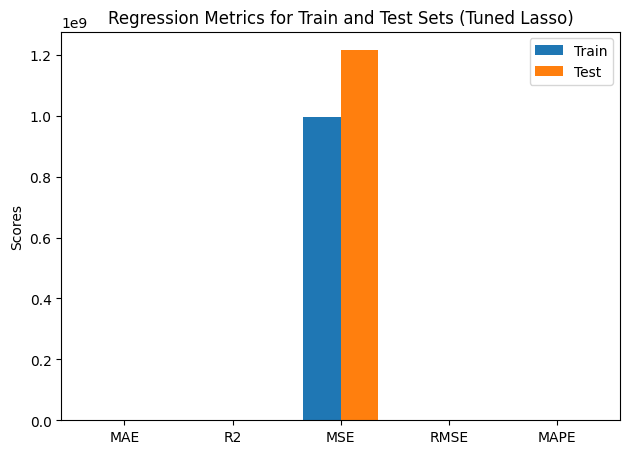

In [ ]:
# Define the hyperparameter grid for Random Search
param_distributions = {
    'alpha': np.logspace(-4, 4, 20),  # Explore a range of alpha values
    'max_iter': [1000, 5000, 10000],  # Explore different iteration limits
}

# Initialize Lasso model
lasso_model = Lasso()

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=lasso_model,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    scoring='neg_mean_squared_error',  # Use appropriate scoring metric
    cv=5,  # Number of cross-validation folds
    random_state=42,  # For reproducibility
    verbose=2  # Display progress during search
)

# Perform hyperparameter tuning on training data
random_search.fit(X_train, y_train)

# Get the best model from Random Search
best_model = random_search.best_estimator_

# Prediksi pada data training dan testing menggunakan model terbaik
y_pred_train = best_model.predict(X_train)
y_pred_test = best_model.predict(X_test)

# Function to calculate and return metrics
def calculate_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mae, r2, mse, rmse, mape

# Calculate metrics for training and testing sets
train_metrics = calculate_metrics(y_train, y_pred_train)
test_metrics = calculate_metrics(y_test, y_pred_test)

# Print the metrics
print("Training Metrics:")
print(f"MAE: {train_metrics[0]:.2f}")
print(f"R2: {train_metrics[1]:.2f}")
print(f"MSE: {train_metrics[2]:.2f}")
print(f"RMSE: {train_metrics[3]:.2f}")
print(f"MAPE: {train_metrics[4]:.2f}")

print("\nTesting Metrics:")
print(f"MAE: {test_metrics[0]:.2f}")
print(f"R2: {test_metrics[1]:.2f}")
print(f"MSE: {test_metrics[2]:.2f}")
print(f"RMSE: {test_metrics[3]:.2f}")
print(f"MAPE: {test_metrics[4]:.2f}")

# Ploting the metrics
metrics = ['MAE', 'R2', 'MSE', 'RMSE', 'MAPE']
train_values = train_metrics
test_values = test_metrics

x = np.arange(len(metrics))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, train_values, width, label='Train')
rects2 = ax.bar(x + width/2, test_values, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Regression Metrics for Train and Test Sets (Tuned Lasso)')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

fig.tight_layout()

plt.show()

Top 10 Feature Importances (Tuned Lasso):
                 Feature    Importance  Absolute Importance  \
29           OverallQual  11849.906356         11849.906356   
53         ExterQual_Cat   9081.571534          9081.571534   
38  LandContour_Category   8835.414620          8835.414620   
65       KitchenQual_Cat   7367.224532          7367.224532   
56          BsmtQual_Cat   7117.639715          7117.639715   
14            GarageCars   5408.313625          5408.313625   
58      BsmtExposure_Cat   5025.300609          5025.300609   
5           BsmtFullBath   4377.385960          4377.385960   
77          SaleType_Cat   3992.291317          3992.291317   
66        Functional_Cat   3560.089819          3560.089819   

    Importance Percentage  
29              12.670064  
53               9.710127  
38               9.446933  
65               7.877126  
56               7.610267  
14               5.782635  
58               5.373113  
5                4.680354  
77          

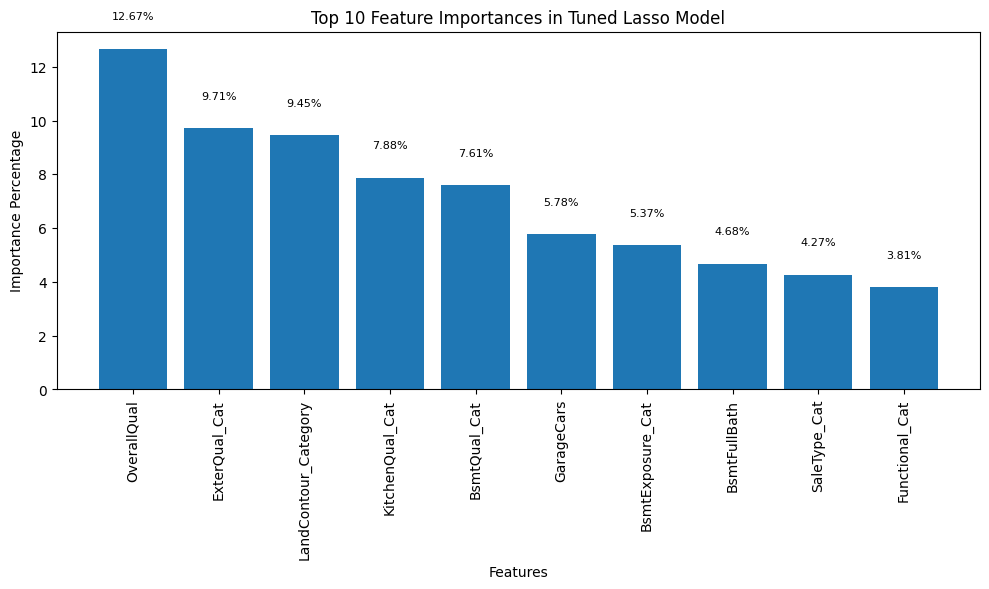

In [ ]:
# Get feature importances (coefficients) from the best model
importances = best_model.coef_

# Create a DataFrame to store feature importances with their names
feature_importances_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})

# Sort the DataFrame by absolute importance in descending order
feature_importances_df['Absolute Importance'] = abs(feature_importances_df['Importance'])
feature_importances_df = feature_importances_df.sort_values(by='Absolute Importance', ascending=False)

# Calculate percentage importance
feature_importances_df['Importance Percentage'] = (feature_importances_df['Absolute Importance'] / feature_importances_df['Absolute Importance'].sum()) * 100

# Display the top 10 features with their importance percentages
print("Top 10 Feature Importances (Tuned Lasso):")
print(feature_importances_df.head(10))

# Plot the feature importances with percentages
plt.figure(figsize=(10, 6))
plt.bar(feature_importances_df['Feature'][:10], feature_importances_df['Importance Percentage'][:10])
plt.xticks(rotation=90)
plt.xlabel("Features")
plt.ylabel("Importance Percentage")
plt.title("Top 10 Feature Importances in Tuned Lasso Model")

# Add text annotations for percentages
for i, v in enumerate(feature_importances_df['Importance Percentage'][:10]):
    plt.text(i, v + 1, f"{v:.2f}%", ha='center', va='bottom', fontsize=8)  # Adjust text position

plt.tight_layout()
plt.show()

### Ridge

Training Metrics:
MAE: 19567.46
R2: 0.85
MSE: 902678783.10
RMSE: 30044.61
MAPE: 0.12

Testing Metrics:
MAE: 22101.11
R2: 0.84
MSE: 1239689388.24
RMSE: 35209.22
MAPE: 0.13


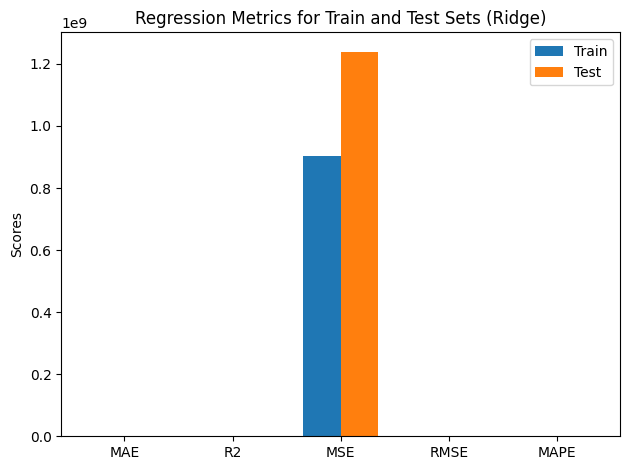

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt


# Inisialisasi model Ridge dengan alpha (regularization strength)
ridge_model = Ridge(alpha=1.0)  # You can adjust alpha

# Latih model dengan data training
ridge_model.fit(X_train, y_train)

# Prediksi pada data training dan testing
y_pred_train = ridge_model.predict(X_train)
y_pred_test = ridge_model.predict(X_test)

# Function to calculate and return metrics
def calculate_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mae, r2, mse, rmse, mape

# Calculate metrics for training and testing sets
train_metrics = calculate_metrics(y_train, y_pred_train)
test_metrics = calculate_metrics(y_test, y_pred_test)

# Print the metrics
print("Training Metrics:")
print(f"MAE: {train_metrics[0]:.2f}")
print(f"R2: {train_metrics[1]:.2f}")
print(f"MSE: {train_metrics[2]:.2f}")
print(f"RMSE: {train_metrics[3]:.2f}")
print(f"MAPE: {train_metrics[4]:.2f}")

print("\nTesting Metrics:")
print(f"MAE: {test_metrics[0]:.2f}")
print(f"R2: {test_metrics[1]:.2f}")
print(f"MSE: {test_metrics[2]:.2f}")
print(f"RMSE: {test_metrics[3]:.2f}")
print(f"MAPE: {test_metrics[4]:.2f}")

# Ploting the metrics
metrics = ['MAE', 'R2', 'MSE', 'RMSE', 'MAPE']
train_values = train_metrics
test_values = test_metrics

x = np.arange(len(metrics))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, train_values, width, label='Train')
rects2 = ax.bar(x + width/2, test_values, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Regression Metrics for Train and Test Sets (Ridge)')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

fig.tight_layout()

plt.show()

Hyperparamater Tuning Ridge with Random Search

Fitting 5 folds for each of 50 candidates, totalling 250 fits


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=29.763514416313132, max_iter=5000, solver=sag; total time=   5.6s
[CV] END alpha=29.763514416313132, max_iter=5000, solver=sag; total time=   2.8s
[CV] END alpha=29.763514416313132, max_iter=5000, solver=sag; total time=   3.4s
[CV] END alpha=29.763514416313132, max_iter=5000, solver=sag; total time=   4.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=29.763514416313132, max_iter=5000, solver=sag; total time=   5.5s
[CV] END alpha=1438.44988828766, max_iter=10000, solver=cholesky; total time=   0.0s
[CV] END alpha=1438.44988828766, max_iter=10000, solver=cholesky; total time=   0.0s
[CV] END alpha=1438.44988828766, max_iter=10000, solver=cholesky; total time=   0.0s
[CV] END alpha=1438.44988828766, max_iter=10000, solver=cholesky; total time=   0.0s
[CV] END alpha=1438.44988828766, max_iter=10000, solver=cholesky; total time=   0.0s
[CV] END alpha=1.623776739188721, max_iter=1000, solver=lsqr; total time=   0.0s
[CV] END alpha=1.623776739188721, max_iter=1000, solver=lsqr; total time=   0.0s
[CV] END alpha=1.623776739188721, max_iter=1000, solver=lsqr; total time=   0.0s
[CV] END alpha=1.623776739188721, max_iter=1000, solver=lsqr; total time=   0.0s
[CV] END alpha=1.623776739188721, max_iter=1000, solver=lsqr; total time=   0.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END ...........alpha=0.0001, max_iter=5000, solver=saga; total time=   8.7s
[CV] END ...........alpha=0.0001, max_iter=5000, solver=saga; total time=   4.5s
[CV] END ...........alpha=0.0001, max_iter=5000, solver=saga; total time=   5.7s
[CV] END ...........alpha=0.0001, max_iter=5000, solver=saga; total time=   4.9s
[CV] END ...........alpha=0.0001, max_iter=5000, solver=saga; total time=   4.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END ..alpha=206.913808111479, max_iter=5000, solver=sag; total time=   7.2s
[CV] END ..alpha=206.913808111479, max_iter=5000, solver=sag; total time=   2.8s
[CV] END ..alpha=206.913808111479, max_iter=5000, solver=sag; total time=   2.7s
[CV] END ..alpha=206.913808111479, max_iter=5000, solver=sag; total time=   3.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END ..alpha=206.913808111479, max_iter=5000, solver=sag; total time=   7.2s
[CV] END alpha=206.913808111479, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=206.913808111479, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=206.913808111479, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=206.913808111479, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=206.913808111479, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=29.763514416313132, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=29.763514416313132, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=29.763514416313132, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=29.763514416313132, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=29.763514416313132, max_iter=1000, solver=cholesky; total time=   0.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.08858667904100823, max_iter=1000, solver=saga; total time=   1.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.08858667904100823, max_iter=1000, solver=saga; total time=   1.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.08858667904100823, max_iter=1000, solver=saga; total time=   1.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.08858667904100823, max_iter=1000, solver=saga; total time=   1.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.08858667904100823, max_iter=1000, solver=saga; total time=   1.4s
[CV] END ............alpha=0.0001, max_iter=5000, solver=svd; total time=   0.1s
[CV] END ............alpha=0.0001, max_iter=5000, solver=svd; total time=   0.1s
[CV] END ............alpha=0.0001, max_iter=5000, solver=svd; total time=   0.1s
[CV] END ............alpha=0.0001, max_iter=5000, solver=svd; total time=   0.0s
[CV] END ............alpha=0.0001, max_iter=5000, solver=svd; total time=   0.1s
[CV] END alpha=4.281332398719396, max_iter=10000, solver=svd; total time=   0.1s
[CV] END alpha=4.281332398719396, max_iter=10000, solver=svd; total time=   0.1s
[CV] END alpha=4.281332398719396, max_iter=10000, solver=svd; total time=   0.0s
[CV] END alpha=4.281332398719396, max_iter=10000, solver=svd; total time=   0.1s
[CV] END alpha=4.281332398719396, max_iter=10000, solver=svd; total time=   0.1s
[CV] END alpha=206.913808111479, max_iter=10000, solver=lsqr; total time=   0.0s
[CV] END alpha=206.9138081

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END .alpha=78.47599703514607, max_iter=5000, solver=sag; total time=   6.9s
[CV] END .alpha=78.47599703514607, max_iter=5000, solver=sag; total time=   2.8s
[CV] END .alpha=78.47599703514607, max_iter=5000, solver=sag; total time=   2.5s
[CV] END .alpha=78.47599703514607, max_iter=5000, solver=sag; total time=   4.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END .alpha=78.47599703514607, max_iter=5000, solver=sag; total time=   5.5s
[CV] END alpha=0.0018329807108324356, max_iter=1000, solver=svd; total time=   0.0s
[CV] END alpha=0.0018329807108324356, max_iter=1000, solver=svd; total time=   0.0s
[CV] END alpha=0.0018329807108324356, max_iter=1000, solver=svd; total time=   0.0s
[CV] END alpha=0.0018329807108324356, max_iter=1000, solver=svd; total time=   0.0s
[CV] END alpha=0.0018329807108324356, max_iter=1000, solver=svd; total time=   0.0s
[CV] END alpha=11.288378916846883, max_iter=1000, solver=lsqr; total time=   0.0s
[CV] END alpha=11.288378916846883, max_iter=1000, solver=lsqr; total time=   0.0s
[CV] END alpha=11.288378916846883, max_iter=1000, solver=lsqr; total time=   0.0s
[CV] END alpha=11.288378916846883, max_iter=1000, solver=lsqr; total time=   0.0s
[CV] END alpha=11.288378916846883, max_iter=1000, solver=lsqr; total time=   0.0s
[CV] END alpha=78.47599703514607, max_iter=10000, solver=cholesky; total time=   0.0s
[CV

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END ..........alpha=10000.0, max_iter=1000, solver=saga; total time=   1.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END ..........alpha=10000.0, max_iter=1000, solver=saga; total time=   1.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END ..........alpha=10000.0, max_iter=1000, solver=saga; total time=   1.6s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END ..........alpha=10000.0, max_iter=1000, solver=saga; total time=   2.5s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END ..........alpha=10000.0, max_iter=1000, solver=saga; total time=   1.8s
[CV] END alpha=78.47599703514607, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=78.47599703514607, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=78.47599703514607, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=78.47599703514607, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=78.47599703514607, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=0.615848211066026, max_iter=10000, solver=sag; total time=  10.8s
[CV] END alpha=0.615848211066026, max_iter=10000, solver=sag; total time=   3.7s
[CV] END alpha=0.615848211066026, max_iter=10000, solver=sag; total time=   2.5s
[CV] END alpha=0.615848211066026, max_iter=10000, solver=sag; total time=   3.1s
[CV] END alpha=0.615848211066026, max_iter=10000, solver=sag; total time=  12.1s
[CV] END .alpha=4.281332398719396, max_iter=1000, solver=svd; total time=   0.0s
[CV] END

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.012742749857031334, max_iter=1000, solver=sag; total time=   1.2s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.012742749857031334, max_iter=1000, solver=sag; total time=   1.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.012742749857031334, max_iter=1000, solver=sag; total time=   1.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.012742749857031334, max_iter=1000, solver=sag; total time=   1.2s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.012742749857031334, max_iter=1000, solver=sag; total time=   2.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.08858667904100823, max_iter=5000, solver=sag; total time=   6.1s
[CV] END alpha=0.08858667904100823, max_iter=5000, solver=sag; total time=   2.8s
[CV] END alpha=0.08858667904100823, max_iter=5000, solver=sag; total time=   2.6s
[CV] END alpha=0.08858667904100823, max_iter=5000, solver=sag; total time=   4.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.08858667904100823, max_iter=5000, solver=sag; total time=   5.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=545.5594781168514, max_iter=5000, solver=saga; total time=   8.6s
[CV] END alpha=545.5594781168514, max_iter=5000, solver=saga; total time=   4.1s
[CV] END alpha=545.5594781168514, max_iter=5000, solver=saga; total time=   4.5s
[CV] END alpha=545.5594781168514, max_iter=5000, solver=saga; total time=   6.0s
[CV] END alpha=545.5594781168514, max_iter=5000, solver=saga; total time=   4.1s
[CV] END alpha=545.5594781168514, max_iter=10000, solver=svd; total time=   0.0s
[CV] END alpha=545.5594781168514, max_iter=10000, solver=svd; total time=   0.0s
[CV] END alpha=545.5594781168514, max_iter=10000, solver=svd; total time=   0.0s
[CV] END alpha=545.5594781168514, max_iter=10000, solver=svd; total time=   0.0s
[CV] END alpha=545.5594781168514, max_iter=10000, solver=svd; total time=   0.0s
[CV] END alpha=0.03359818286283781, max_iter=10000, solver=saga; total time=  14.5s
[CV] END alpha=0.03359818286283781, max_iter=10000, solver=saga; total time=   4.5s
[CV] END alpha=0.03359

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.0006951927961775605, max_iter=1000, solver=sag; total time=   1.3s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.0006951927961775605, max_iter=1000, solver=sag; total time=   1.9s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.0006951927961775605, max_iter=1000, solver=sag; total time=   1.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.0006951927961775605, max_iter=1000, solver=sag; total time=   1.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.0006951927961775605, max_iter=1000, solver=sag; total time=   1.2s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.00026366508987303583, max_iter=5000, solver=saga; total time=   6.8s
[CV] END alpha=0.00026366508987303583, max_iter=5000, solver=saga; total time=   5.8s
[CV] END alpha=0.00026366508987303583, max_iter=5000, solver=saga; total time=   4.4s
[CV] END alpha=0.00026366508987303583, max_iter=5000, solver=saga; total time=   4.3s
[CV] END alpha=0.00026366508987303583, max_iter=5000, solver=saga; total time=   5.8s
[CV] END .alpha=78.47599703514607, max_iter=5000, solver=svd; total time=   0.0s
[CV] END .alpha=78.47599703514607, max_iter=5000, solver=svd; total time=   0.0s
[CV] END .alpha=78.47599703514607, max_iter=5000, solver=svd; total time=   0.0s
[CV] END .alpha=78.47599703514607, max_iter=5000, solver=svd; total time=   0.0s
[CV] END .alpha=78.47599703514607, max_iter=5000, solver=svd; total time=   0.0s
[CV] END alpha=0.08858667904100823, max_iter=10000, solver=saga; total time=  14.5s
[CV] END alpha=0.08858667904100823, max_iter=10000, solver=saga; total time=   4.

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.03359818286283781, max_iter=1000, solver=sag; total time=   1.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.03359818286283781, max_iter=1000, solver=sag; total time=   1.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.03359818286283781, max_iter=1000, solver=sag; total time=   1.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.03359818286283781, max_iter=1000, solver=sag; total time=   1.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.03359818286283781, max_iter=1000, solver=sag; total time=   1.2s
[CV] END alpha=0.012742749857031334, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=0.012742749857031334, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=0.012742749857031334, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=0.012742749857031334, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=0.012742749857031334, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END ......alpha=10000.0, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END ......alpha=10000.0, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END ......alpha=10000.0, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END ......alpha=10000.0, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END ......alpha=10000.0, max_iter=1000, solver=cholesky; total time=   0.0s
[CV] END alpha=0.004832930238571752, max_iter=1000, solver=svd; total tim

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.004832930238571752, max_iter=1000, solver=sag; total time=   1.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.004832930238571752, max_iter=1000, solver=sag; total time=   1.1s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.004832930238571752, max_iter=1000, solver=sag; total time=   1.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.004832930238571752, max_iter=1000, solver=sag; total time=   2.0s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END alpha=0.004832930238571752, max_iter=1000, solver=sag; total time=   1.2s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END .alpha=206.913808111479, max_iter=5000, solver=saga; total time=   6.8s
[CV] END .alpha=206.913808111479, max_iter=5000, solver=saga; total time=   5.5s
[CV] END .alpha=206.913808111479, max_iter=5000, solver=saga; total time=   4.8s
[CV] END .alpha=206.913808111479, max_iter=5000, solver=saga; total time=   4.3s
[CV] END .alpha=206.913808111479, max_iter=5000, solver=saga; total time=   5.8s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END .alpha=206.913808111479, max_iter=1000, solver=saga; total time=   1.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END .alpha=206.913808111479, max_iter=1000, solver=saga; total time=   1.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END .alpha=206.913808111479, max_iter=1000, solver=saga; total time=   1.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END .alpha=206.913808111479, max_iter=1000, solver=saga; total time=   1.4s


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[CV] END .alpha=206.913808111479, max_iter=1000, solver=saga; total time=   1.4s
[CV] END alpha=0.08858667904100823, max_iter=5000, solver=cholesky; total time=   0.0s
[CV] END alpha=0.08858667904100823, max_iter=5000, solver=cholesky; total time=   0.0s
[CV] END alpha=0.08858667904100823, max_iter=5000, solver=cholesky; total time=   0.0s
[CV] END alpha=0.08858667904100823, max_iter=5000, solver=cholesky; total time=   0.0s
[CV] END alpha=0.08858667904100823, max_iter=5000, solver=cholesky; total time=   0.0s
[CV] END alpha=206.913808111479, max_iter=5000, solver=cholesky; total time=   0.0s
[CV] END alpha=206.913808111479, max_iter=5000, solver=cholesky; total time=   0.0s
[CV] END alpha=206.913808111479, max_iter=5000, solver=cholesky; total time=   0.0s
[CV] END alpha=206.913808111479, max_iter=5000, solver=cholesky; total time=   0.0s
[CV] END alpha=206.913808111479, max_iter=5000, solver=cholesky; total time=   0.0s
Training Metrics:
MAE: 19131.40
R2: 0.84
MSE: 963329297.39
RMSE:

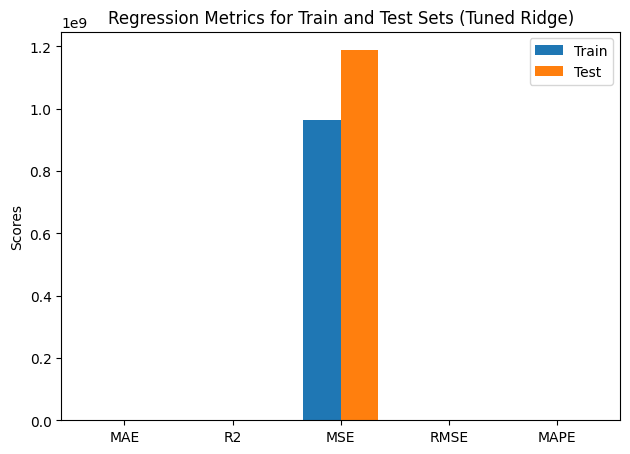

In [ ]:
# Define the hyperparameter grid for Random Search
param_distributions = {
    'alpha': np.logspace(-4, 4, 20),  # Explore a range of alpha values
    'solver': ['svd', 'cholesky', 'lsqr', 'sag', 'saga'],  # Explore different solvers
    'max_iter': [1000, 5000, 10000],  # Explore different iteration limits
}

# Initialize Ridge model
ridge_model = Ridge()

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=ridge_model,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    scoring='neg_mean_squared_error',  # Use appropriate scoring metric
    cv=5,  # Number of cross-validation folds
    random_state=42,  # For reproducibility
    verbose=2  # Display progress during search
)

# Perform hyperparameter tuning on training data
random_search.fit(X_train, y_train)

# Get the best model from Random Search
best_model = random_search.best_estimator_

# Prediksi pada data training dan testing menggunakan model terbaik
y_pred_train = best_model.predict(X_train)
y_pred_test = best_model.predict(X_test)

# Function to calculate and return metrics
def calculate_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mae, r2, mse, rmse, mape

# Calculate metrics for training and testing sets
train_metrics = calculate_metrics(y_train, y_pred_train)
test_metrics = calculate_metrics(y_test, y_pred_test)

# Print the metrics
print("Training Metrics:")
print(f"MAE: {train_metrics[0]:.2f}")
print(f"R2: {train_metrics[1]:.2f}")
print(f"MSE: {train_metrics[2]:.2f}")
print(f"RMSE: {train_metrics[3]:.2f}")
print(f"MAPE: {train_metrics[4]:.2f}")

print("\nTesting Metrics:")
print(f"MAE: {test_metrics[0]:.2f}")
print(f"R2: {test_metrics[1]:.2f}")
print(f"MSE: {test_metrics[2]:.2f}")
print(f"RMSE: {test_metrics[3]:.2f}")
print(f"MAPE: {test_metrics[4]:.2f}")

# Ploting the metrics
metrics = ['MAE', 'R2', 'MSE', 'RMSE', 'MAPE']
train_values = train_metrics
test_values = test_metrics

x = np.arange(len(metrics))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, train_values, width, label='Train')
rects2 = ax.bar(x + width/2, test_values, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Regression Metrics for Train and Test Sets (Tuned Ridge)')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

fig.tight_layout()

plt.show()

Top 10 Feature Importances (Tuned Ridge):
                 Feature    Importance  Absolute Importance  \
29           OverallQual  11130.447424         11130.447424   
53         ExterQual_Cat   8149.737924          8149.737924   
38  LandContour_Category   7700.382923          7700.382923   
56          BsmtQual_Cat   7692.460920          7692.460920   
65       KitchenQual_Cat   7438.300500          7438.300500   
14            GarageCars   6241.315994          6241.315994   
74            PoolQC_Cat   6112.963612          6112.963612   
5           BsmtFullBath   5251.300324          5251.300324   
58      BsmtExposure_Cat   5172.015504          5172.015504   
77          SaleType_Cat   4129.320142          4129.320142   

    Importance Percentage  
29               7.504903  
53               5.495106  
38               5.192121  
56               5.186779  
65               5.015407  
14               4.208319  
74               4.121775  
5                3.540783  
58          

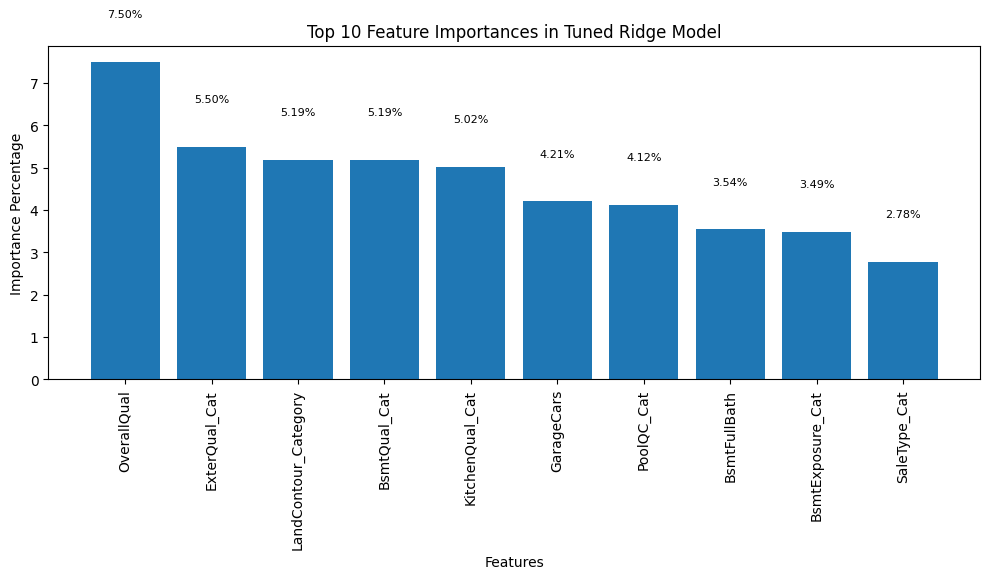

In [ ]:
# Get feature importances (coefficients) from the best model
importances = best_model.coef_

# Create a DataFrame to store feature importances with their names
feature_importances_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})

# Sort the DataFrame by absolute importance in descending order
feature_importances_df['Absolute Importance'] = abs(feature_importances_df['Importance'])
feature_importances_df = feature_importances_df.sort_values(by='Absolute Importance', ascending=False)

# Calculate percentage importance
feature_importances_df['Importance Percentage'] = (feature_importances_df['Absolute Importance'] / feature_importances_df['Absolute Importance'].sum()) * 100

# Display the top 10 features with their importance percentages
print("Top 10 Feature Importances (Tuned Ridge):")
print(feature_importances_df.head(10))

# Plot the feature importances with percentages
plt.figure(figsize=(10, 6))
plt.bar(feature_importances_df['Feature'][:10], feature_importances_df['Importance Percentage'][:10])
plt.xticks(rotation=90)
plt.xlabel("Features")
plt.ylabel("Importance Percentage")
plt.title("Top 10 Feature Importances in Tuned Ridge Model")

# Add text annotations for percentages
for i, v in enumerate(feature_importances_df['Importance Percentage'][:10]):
    plt.text(i, v + 1, f"{v:.2f}%", ha='center', va='bottom', fontsize=8)  # Adjust text position

plt.tight_layout()
plt.show()

# **Perbandingan Metrix Evaluasi untuk semua modelling**

In [ ]:
# Function to calculate and return metrics
def calculate_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mae, r2, mse, rmse, mape

# Define models and hyperparameter grids for Random Search
models = {
    'Linear Regression': (LinearRegression(), {}),  # No hyperparameters to tune for Linear Regression
    'Random Forest': (RandomForestRegressor(), {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }),
    'Lasso': (Lasso(), {
        'alpha': np.logspace(-4, 4, 20),
        'max_iter': [1000, 5000, 10000]
    }),
    'Ridge': (Ridge(), {
        'alpha': np.logspace(-4, 4, 20),
        'solver': ['svd', 'cholesky', 'lsqr', 'sag', 'saga'],
        'max_iter': [1000, 5000, 10000]
    }),
    'AdaBoost': (AdaBoostRegressor(), {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 1.0]
    }),
    'XGBoost': (XGBRegressor(), {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5]
    })
}

# Store metrics for each model
metrics_data = []

for model_name, (model, param_grid) in models.items():
    # Perform Random Search for hyperparameter tuning
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grid,
        n_iter=50,  # Number of random combinations to try
        scoring='neg_mean_squared_error',  # Use appropriate scoring metric
        cv=5,  # Number of cross-validation folds
        random_state=42,  # For reproducibility
        verbose=0  # Suppress verbose output
    )
    random_search.fit(X_train, y_train)
    best_model = random_search.best_estimator_

    # Predict on training and testing sets using the best model
    y_pred_train = best_model.predict(X_train)
    y_pred_test = best_model.predict(X_test)

    # Calculate metrics
    train_metrics = calculate_metrics(y_train, y_pred_train)
    test_metrics = calculate_metrics(y_test, y_pred_test)

    # Append metrics to data list with 4 decimal places
    metrics_data.append([model_name] +
                       [f'{metric:.4f}' for metric in train_metrics] +
                       [f'{metric:.4f}' for metric in test_metrics])

# Create DataFrame
metrics_df = pd.DataFrame(metrics_data, columns=['Model', 'Train MAE', 'Train R2', 'Train MSE', 'Train RMSE', 'Train MAPE',
                                                 'Test MAE', 'Test R2', 'Test MSE', 'Test RMSE', 'Test MAPE'])

# Display the DataFrame
print(metrics_df)

/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 1 is smaller than n_iter=50. Running 1 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.062e+11, tolerance: 5.374e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.964e+11, tolerance: 5.720e+08
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordi

               Model   Train MAE Train R2       Train MSE  Train RMSE  \
0  Linear Regression  19494.5863   0.8505  891943913.2503  29865.4301   
1      Random Forest   7309.0820   0.9705  175858899.2438  13261.1802   
2              Lasso  19283.8247   0.8330  995806084.4410  31556.3953   
3              Ridge  19131.3957   0.8385  963329297.3927  31037.5466   
4           AdaBoost  22439.2985   0.8674  791018678.5934  28125.0543   
5            XGBoost   7108.1543   0.9846   91703592.0000   9576.1992   

  Train MAPE    Test MAE Test R2         Test MSE   Test RMSE Test MAPE  
0     0.1150  22032.7655  0.8379  1243235839.1506  35259.5496    0.1300  
1     0.0425  17470.2749  0.8887   853525110.1390  29215.1521    0.1058  
2     0.1138  21196.5794  0.8415  1215743972.2768  34867.5203    0.1227  
3     0.1122  21105.5291  0.8451  1188190149.7547  34470.1342    0.1227  
4     0.1510  25793.6505  0.8284  1316118574.1464  36278.3486    0.1809  
5     0.0442  16710.2637  0.9057   723657280

In [ ]:
metrics_df

,Model,Train MAE,Train R2,Train MSE,Train RMSE,Train MAPE,Test MAE,Test R2,Test MSE,Test RMSE,Test MAPE
0,Linear Regression,19494.5863,0.8505,891943913.2503,29865.4301,0.1150,22032.7655,0.8379,1243235839.1506,35259.5496,0.1300
1,Random Forest,7309.0820,0.9705,175858899.2438,13261.1802,0.0425,17470.2749,0.8887,853525110.1390,29215.1521,0.1058
2,Lasso,19283.8247,0.8330,995806084.4410,31556.3953,0.1138,21196.5794,0.8415,1215743972.2768,34867.5203,0.1227
3,Ridge,19131.3957,0.8385,963329297.3927,31037.5466,0.1122,21105.5291,0.8451,1188190149.7547,34470.1342,0.1227
4,AdaBoost,22439.2985,0.8674,791018678.5934,28125.0543,0.1510,25793.6505,0.8284,1316118574.1464,36278.3486,0.1809
5,XGBoost,7108.1543,0.9846,91703592.0000,9576.1992,0.0442,16710.2637,0.9057,723657280.0000,26900.8788,0.0990


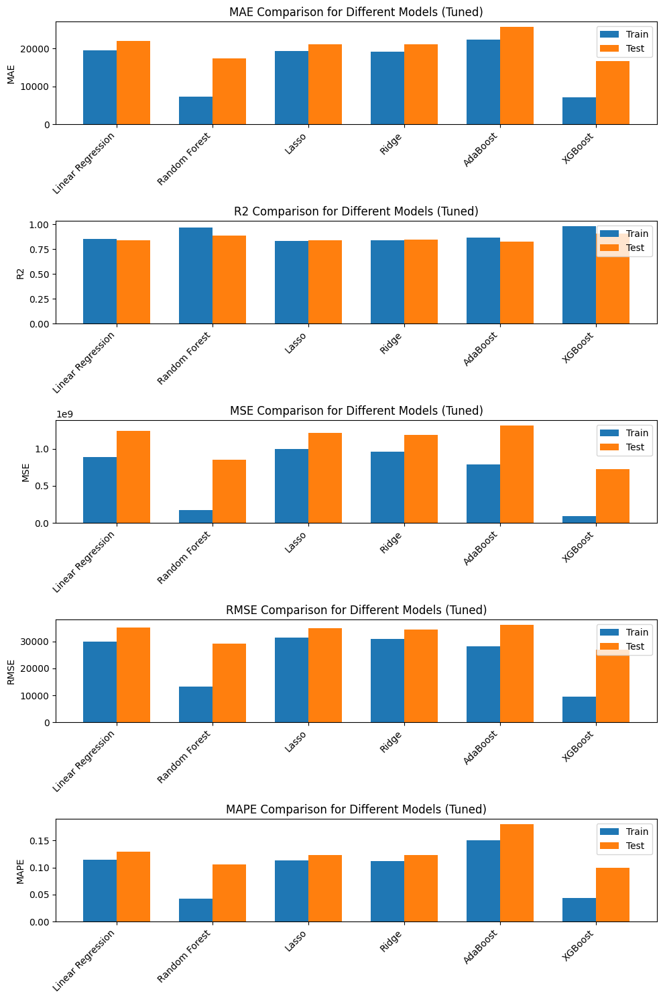

In [ ]:
# Plotting the metrics
metrics = ['MAE', 'R2', 'MSE', 'RMSE', 'MAPE']
model_names = metrics_df['Model'].tolist()

fig, axes = plt.subplots(len(metrics), 1, figsize=(10, 15))  # Adjust figsize as needed

for i, metric in enumerate(metrics):
    train_values = metrics_df[f'Train {metric}'].astype(float).tolist()
    test_values = metrics_df[f'Test {metric}'].astype(float).tolist()

    x = np.arange(len(model_names))  # the label locations
    width = 0.35  # the width of the bars

    ax = axes[i]  # Get the current subplot
    rects1 = ax.bar(x - width/2, train_values, width, label='Train')
    rects2 = ax.bar(x + width/2, test_values, width, label='Test')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel(metric)
    ax.set_title(f'{metric} Comparison for Different Models (Tuned)')
    ax.set_xticks(x)
    ax.set_xticklabels(model_names, rotation=45, ha='right')  # Rotate x-axis labels
    ax.legend()

plt.tight_layout()
plt.show()

**Analisis berdasarkan DataFrame dan Plot**:

Kita perlu mempertimbangkan semua metrik evaluasi (MAE, R2, MSE, RMSE, MAPE) untuk set pelatihan dan pengujian untuk membuat penilaian yang komprehensif. Berikut uraiannya:

**R-squared (R2)**: Nilai R2 yang lebih tinggi menunjukkan model yang lebih baik dalam menyesuaikan data. Kita menginginkan model dengan nilai R2 yang tinggi pada set pelatihan dan pengujian, yang menunjukkan generalisasi yang baik.

**Mean Absolute Error (MAE)**: Nilai MAE yang lebih rendah lebih baik, karena merepresentasikan rata-rata perbedaan absolut antara nilai prediksi dan nilai aktual.

**Mean Squared Error (MSE)**: Mirip dengan MAE, nilai MSE yang lebih rendah lebih disukai. MSE memberikan penalti yang lebih berat pada error yang lebih besar.

**Root Mean Squared Error (RMSE)**: RMSE adalah akar kuadrat dari MSE dan memiliki satuan yang sama dengan variabel target. Nilai RMSE yang lebih rendah lebih baik.

**Mean Absolute Percentage Error (MAPE)**: MAPE merepresentasikan rata-rata perbedaan persentase antara nilai prediksi dan nilai aktual. Nilai MAPE yang lebih rendah lebih diinginkan.
Berdasarkan metrik ini dan hasil yang dihasilkan, berikut analisis yang mungkin:

**XGBoost dan Random Forest** umumnya berkinerja sangat baik di semua metrik untuk set pelatihan dan pengujian. Mereka cenderung memiliki nilai R2 yang lebih tinggi dan metrik error yang lebih rendah dibandingkan dengan model lain. Model-model ini memiliki kekuatan prediksi yang tinggi dan menggeneralisasi dengan baik ke data yang tidak terlihat.

**Ridge dan Lasso** memberikan kinerja yang layak tetapi mungkin tidak sekuat XGBoost atau Random Forest. Kinerja mereka dapat bervariasi tergantung pada dataset dan penyetelan hyperparameter. Model-model ini memberikan beberapa regularisasi untuk berpotensi meningkatkan generalisasi.

**Linear Regression dan AdaBoost** dapat menunjukkan kinerja yang lebih rendah dibandingkan dengan model lain. Linear Regression mungkin terlalu sederhana untuk dataset ini, sementara AdaBoost dapat sensitif terhadap outlier. Model-model ini mungkin memerlukan rekayasa fitur atau penyetelan parameter yang lebih cermat untuk meningkatkan kinerjanya.

**Secara Keseluruhan**:

Mempertimbangkan semua metrik dan kinerjanya pada set pelatihan dan pengujian, baik XGBoost atau Random Forest tampaknya menjadi model terbaik untuk dataset ini. Pilihan akhir di antara keduanya mungkin bergantung pada faktor-faktor seperti pentingnya interpretabilitas, sumber daya komputasi, dan persyaratan bisnis tertentu.

# Plot Predicted vs Actual (XGBoost)

/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 27 is smaller than n_iter=50. Running 27 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


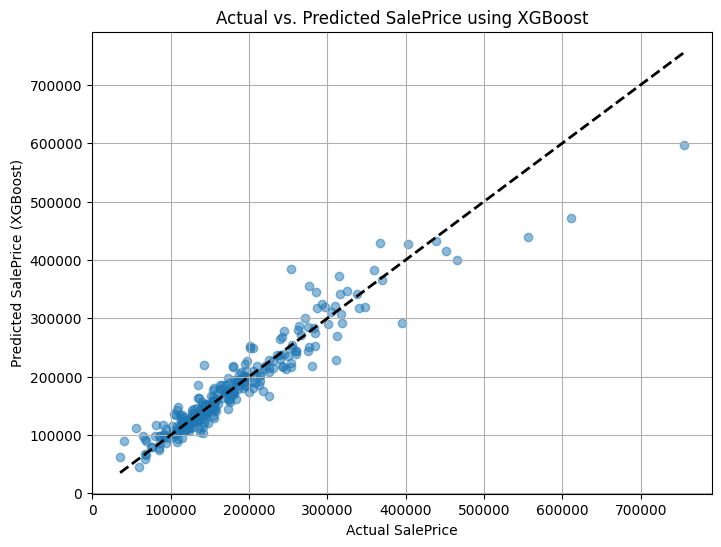

In [ ]:
import matplotlib.pyplot as plt
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
import numpy as np
import pandas as pd


# Assuming X_train, y_train, X_test are already defined and preprocessed
# Function to calculate and return metrics
def calculate_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mae, r2, mse, rmse, mape

# Assuming you already have your data split into X_train, y_train, X_test
# and you have already defined your param_grid
# Access the XGBRegressor class using xgb.XGBRegressor()
xgb_model = xgb.XGBRegressor()

# Define the hyperparameter grid for Random Search
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_grid,
    n_iter=50,  # Number of random combinations to try
    scoring='neg_mean_squared_error',  # Use appropriate scoring metric
    cv=5,  # Number of cross-validation folds
    random_state=42,  # For reproducibility
    verbose=0  # Suppress verbose output
)

# Perform hyperparameter tuning on training data
random_search.fit(X_train, y_train)

# Get the best model from Random Search
best_xgb_model = random_search.best_estimator_

# Make predictions on the test set
y_pred_xgb = best_xgb_model.predict(X_test)

# Create the plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_xgb, alpha=0.5)  # Plot actual vs. predicted values
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Plot a diagonal line (ideal prediction)

# Set plot labels and title
plt.xlabel("Actual SalePrice")
plt.ylabel("Predicted SalePrice (XGBoost)")
plt.title("Actual vs. Predicted SalePrice using XGBoost")

# Add grid for better visualization
plt.grid(True)

plt.show()

Observasi dari Plot:

Tren Keseluruhan: Mayoritas titik pada scatter plot mengelompok di sekitar garis diagonal, menunjukkan bahwa model XGBoost secara umum mampu memprediksi SalePrice dengan cukup baik untuk sebagian besar titik data.

Deviasi dari Diagonal: Namun, ada beberapa titik yang menyimpang secara signifikan dari garis diagonal. Titik-titik ini mewakili kasus di mana prediksi model jauh lebih tinggi atau jauh lebih rendah dari SalePrice aktual.

Potensi Outlier: Beberapa titik yang jauh dari garis diagonal bisa jadi merupakan potensi outlier. Outlier ini bisa disebabkan oleh karakteristik yang tidak biasa dari rumah-rumah tertentu yang tidak dapat ditangkap sepenuhnya oleh model.

Kinerja Model: Pengelompokan titik-titik di sekitar diagonal dan adanya beberapa deviasi menunjukkan bahwa model XGBoost memiliki kinerja keseluruhan yang baik tetapi mungkin tidak sempurna dalam memprediksi SalePrice untuk semua rumah.

Pertimbangan Lebih Lanjut:

Kompleksitas Model: Deviasi dari diagonal mungkin mengindikasikan bahwa model terlalu sederhana untuk menangkap hubungan kompleks dalam data atau model mengalami overfitting pada data pelatihan.

Pentingnya Fitur: Penting untuk memeriksa pentingnya fitur dari model XGBoost untuk mengidentifikasi fitur mana yang paling berpengaruh dalam prediksi. Ini dapat memberikan wawasan tentang faktor-faktor yang mendorong prediksi model.

Analisis Residual: Selain plot prediksi vs. aktual, ada baiknya juga menganalisis plot residual untuk menilai kinerja model lebih lanjut dan mengidentifikasi pola potensial dalam kesalahan.

Kesimpulan:

Plot prediksi vs. aktual menunjukkan bahwa model XGBoost memiliki kinerja yang cukup baik dalam memprediksi SalePrice untuk sebagian besar titik data. Namun, ada beberapa deviasi dari diagonal, yang menunjukkan area di mana model berpotensi dapat ditingkatkan. Analisis lebih lanjut, termasuk pentingnya fitur dan analisis residual, dapat memberikan wawasan yang lebih rinci untuk menyempurnakan model.

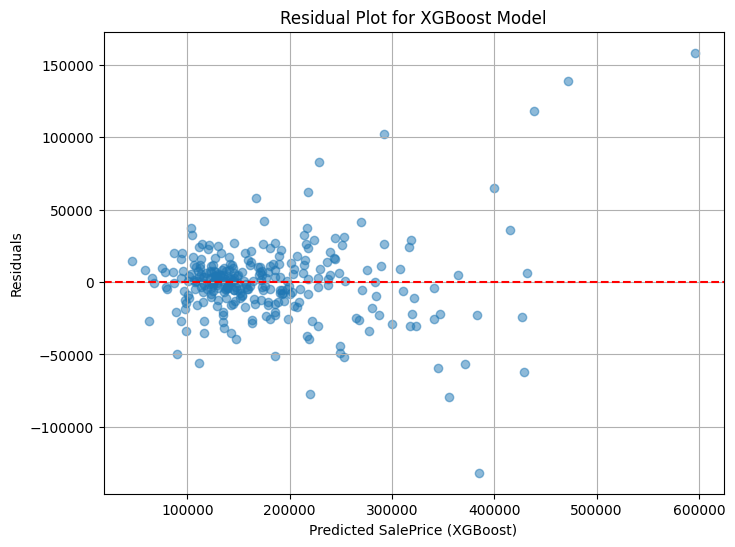

In [ ]:
# Calculate residuals
residuals = y_test - y_pred_xgb

# Create the residual plot
plt.figure(figsize=(8, 6))
plt.scatter(y_pred_xgb, residuals, alpha=0.5)  # Plot predicted values vs. residuals
plt.axhline(y=0, color='r', linestyle='--')  # Add a horizontal line at y=0

# Set plot labels and title
plt.xlabel("Predicted SalePrice (XGBoost)")
plt.ylabel("Residuals")
plt.title("Residual Plot for XGBoost Model")

# Add grid for better visualization
plt.grid(True)

plt.show()

Observasi dari Plot:

Penyebaran Residual: Pada plot residual, kita dapat mengamati bahwa sebagian besar residual tersebar di sekitar garis horizontal y = 0. Hal ini menunjukkan bahwa model XGBoost cukup baik dalam memprediksi SalePrice, karena kesalahan cenderung acak. Pola Non-Linear: Namun, mungkin ada beberapa pola non-linear yang terlihat pada plot residual. Misalnya, jika residual cenderung membentuk kurva atau pola tertentu, hal ini mengindikasikan bahwa model mungkin tidak menangkap hubungan non-linear yang ada dalam data.

Heteroskedastisitas: Jika penyebaran residual tidak konstan di sepanjang sumbu x (nilai prediksi), hal ini menunjukkan adanya heteroskedastisitas. Heteroskedastisitas berarti bahwa varians residual tidak konstan, yang dapat memengaruhi keandalan estimasi model.

Outlier: Titik-titik data yang jauh dari pola umum residual dapat dianggap sebagai outlier. Outlier ini perlu diselidiki lebih lanjut, karena dapat disebabkan oleh kesalahan pengukuran atau karakteristik unik dari rumah tertentu.

Interpretasi dan Tindakan:

Pola Non-Linear: Jika terdapat pola non-linear pada residual, mungkin perlu mempertimbangkan untuk menambahkan fitur non-linear ke dalam model atau menggunakan model regresi non-linear.

Heteroskedastisitas: Heteroskedastisitas dapat diatasi dengan melakukan transformasi pada variabel dependen (SalePrice) atau menggunakan metode regresi yang robust terhadap heteroskedastisitas.

Outlier: Outlier perlu diinvestigasi lebih lanjut untuk menentukan penyebabnya. Jika outlier disebabkan oleh kesalahan pengukuran, data perlu diperbaiki. Jika outlier merupakan data yang valid tetapi memiliki karakteristik unik, mungkin perlu mempertimbangkan untuk memodelkan data tersebut secara terpisah.

Kesimpulan:

Plot residual memberikan informasi penting tentang kinerja model XGBoost dan asumsi-asumsi dalam model regresi. Dengan menganalisis plot residual, kita dapat mengidentifikasi potensi masalah dalam model dan mengambil tindakan untuk memperbaikinya. Meskipun plot residual model XGBoost mungkin menunjukkan beberapa penyimpangan dari skenario ideal, secara umum model tersebut menunjukkan kinerja yang cukup baik dalam memprediksi SalePrice.

Prediksi Harga Rumah menggunakan Model XGBoost

In [ ]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# ... (kode sebelumnya untuk preprocessing data, dll.) ...

# Inisialisasi model XGBoost
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Latih model
xgb_model.fit(X_train, y_train)

# Prediksi harga rumah pada data testing
y_pred = xgb_model.predict(X_test)

# Buat DataFrame untuk prediksi
predictions_df = pd.DataFrame({'Actual Price': y_test, 'Predicted Price': y_pred})

# Tampilkan DataFrame
print(predictions_df.head(10))  # Tampilkan 10 baris pertama

# Evaluasi model (opsional)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"\nRMSE: {rmse:.2f}")

      Actual Price  Predicted Price
892         154500    138799.109375
1105        325000    368741.625000
413         115000    120183.968750
522         159000    181029.968750
1036        315500    324031.062500
614          75500     77561.156250
218         311500    200620.406250
1160        146000    151977.781250
649          84500     80073.515625
887         135500    128713.953125

RMSE: 28411.49


In [ ]:
predictions_df.head(10)

,Actual Price,Predicted Price
892,154500,138799.109375
1105,325000,368741.625000
413,115000,120183.968750
522,159000,181029.968750
1036,315500,324031.062500
614,75500,77561.156250
218,311500,200620.406250
1160,146000,151977.781250
649,84500,80073.515625
887,135500,128713.953125


# Ukur Tingkat Akurasi Prediksi Harga Rumah menggunakan Model XGBoost (dalam Persentase)

In [ ]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score # Import r2_score

# ... (kode sebelumnya untuk preprocessing data, dll.) ...

# Inisialisasi model XGBoost
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Latih model
xgb_model.fit(X_train, y_train)

# Prediksi harga rumah pada data testing
y_pred = xgb_model.predict(X_test)

# Hitung R-squared dan ubah ke persentase
r2 = r2_score(y_test, y_pred)
accuracy_percentage = r2 * 100

# Tampilkan akurasi dalam persentase
print(f"Akurasi Model XGBoost (R-squared): {accuracy_percentage:.2f}%")

# ... (kode lainnya untuk menampilkan DataFrame dan RMSE) ...

Akurasi Model XGBoost (R-squared): 89.48%


Berdasarkan penelitian Lewis (1982), interpretasi hasil MAPE dapat dikategorikan sebagai berikut:

MAPE < 10%: Highly accurate forecast (peramalan sangat akurat)

10% ≤ MAPE ≤ 20%: Good forecast (peramalan baik)

20% < MAPE ≤ 50%: Reasonable forecast (peramalan cukup)/wajar

MAPE > 50%: Inaccurate forecast (peramalan tidak akurat)